In [1]:
import os
import sys

import numpy as np
import math
import uproot as uproot
import pickle
import pandas as pd

import matplotlib.pyplot as plt
import matplotlib.colors
from matplotlib.colors import LinearSegmentedColormap
from matplotlib import ticker
from matplotlib.ticker import (AutoMinorLocator, MultipleLocator)
from matplotlib import gridspec

# Add the head direcoty to sys.path
workspace_root = "/exp/sbnd/app/users/amoor/cafpyana/cafpyana/analysis_village/sample_validations/202503"  
sys.path.insert(0, workspace_root + "/../../../")

# import this repo's classes
import pyanalib.pandas_helpers as ph
from makedf.util import *
import pyanalib.pandas_helpers as ph
import pyanalib.split_df_helpers as splh
import pyanalib.stat_helpers as sh

In [2]:
#get sample file paths
#need four for the analysis standard: data (BNB + fixed light dev, intime cosmic), mc (BNB + light, low + threshold BNB + light) 

input_path = "/exp/sbnd/data/users/amoor/cafpyana_samples/v10_06_00_05/"
#mc_file = input_path + "mc_2025B_Oct25_afm.df"        #mc BNB + light?
#data_file = input_path + "data_2025B_Oct25_afm.df"    #data BNB + fixed light

## df files to open
#mc_bnb_cosmic_file = input_path + "mc_BNBlightMC_v10_10_03_02_2025B_Oct25_afm.df"
#mc_rockbox_dirt_file = input_path + "mc_lowthresholdBNBlightMC_v10_10_03_02_2025B_Oct25_afm.df"
#data_offbeam_light_file = input_path + "data_InTimeCosmics_v10_10_03_02_2025B_Oct25_afm2.df"
#data_bnb_light_dev_file = input_path + "data_BNBlight_v10_10_03_02_2025B_Oct25_afm2.df"

mc_bnb_cosmic_file = input_path + "mc_MCP2025B_1e20_05_prodgenie_corsika_proton_rockbox_sbnd_CV_caf_flat_caf_sbnd_sungbin_afm_Nov25.df"
mc_rockbox_dirt_file = input_path + "mc_MCP2025B_prodgenie_corsika_proton_rockbox_lowenergydirt_sbnd_CV_caf_flat_caf_sbnd_sungbin_afm_Nov25.df"
data_offbeam_light_file = input_path + "data_MCP2025B_02_InTimeCosmics_offbeamlight_v10_06_00_05_flatcaf_sbnd_sungbin_afm_Nov25.df"
data_bnb_light_dev_file = input_path + "data_MCP2025B_05_DevSample_bnblight_v10_06_00_05_flatcaf_sbnd_sungbin_afm_Nov25.df"


In [3]:
#tes = "/exp/sbnd/app/users/amoor/cafpyana/cafpyana/mc_MCP2025B_prodgenie_corsika_proton_rockbox_lowenergydirt_sbnd_CV_caf_flat_caf_sbnd_sungbin_afm_Nov25.df"

In [4]:
sample_str = "v10_06_00_05"

In [5]:
#load the data frames from the files
#evt = event df with reco variables
#hdr = beam df
#mcnu = mc truth df
"""
def get_n_split(file):
    this_split_df = pd.read_hdf(file, key="split")
    this_n_split = this_split_df.n_split.iloc[0]
    return this_n_split

def print_keys(file):
    with pd.HDFStore(file, mode='r') as store:
        keys = store.keys()       # list of all keys in the file
        print("Keys:", keys)

mc_split_df = pd.read_hdf(mc_file, key="split")
mc_n_split = get_n_split(mc_file)
print("mc_n_split: %d" %(mc_n_split))
print_keys(mc_file)

data_split_df = pd.read_hdf(data_file, key="split")
data_n_split = get_n_split(data_file)
print("data_n_split: %d" %(data_n_split))
print_keys(data_file)
"""
## Check keys in each file
print("keys in mc_bnb_cosmic_file")
splh.print_keys(mc_bnb_cosmic_file)

print("keys in mc_rockbox_dirt_file")
splh.print_keys(mc_rockbox_dirt_file)

print("keys in data_offbeam_light_file")
splh.print_keys(data_offbeam_light_file)

print("keys in data_bnb_light_dev_file")
splh.print_keys(data_bnb_light_dev_file)



keys in mc_bnb_cosmic_file
Keys: ['/evt_0', '/evt_1', '/evt_10', '/evt_11', '/evt_12', '/evt_13', '/evt_14', '/evt_15', '/evt_16', '/evt_17', '/evt_18', '/evt_19', '/evt_2', '/evt_20', '/evt_21', '/evt_22', '/evt_23', '/evt_24', '/evt_25', '/evt_26', '/evt_27', '/evt_3', '/evt_4', '/evt_5', '/evt_6', '/evt_7', '/evt_8', '/evt_9', '/hdr_0', '/hdr_1', '/hdr_10', '/hdr_11', '/hdr_12', '/hdr_13', '/hdr_14', '/hdr_15', '/hdr_16', '/hdr_17', '/hdr_18', '/hdr_19', '/hdr_2', '/hdr_20', '/hdr_21', '/hdr_22', '/hdr_23', '/hdr_24', '/hdr_25', '/hdr_26', '/hdr_27', '/hdr_3', '/hdr_4', '/hdr_5', '/hdr_6', '/hdr_7', '/hdr_8', '/hdr_9', '/mcnu_0', '/mcnu_1', '/mcnu_10', '/mcnu_11', '/mcnu_12', '/mcnu_13', '/mcnu_14', '/mcnu_15', '/mcnu_16', '/mcnu_17', '/mcnu_18', '/mcnu_19', '/mcnu_2', '/mcnu_20', '/mcnu_21', '/mcnu_22', '/mcnu_23', '/mcnu_24', '/mcnu_25', '/mcnu_26', '/mcnu_27', '/mcnu_3', '/mcnu_4', '/mcnu_5', '/mcnu_6', '/mcnu_7', '/mcnu_8', '/mcnu_9', '/opflash_0', '/opflash_1', '/opflash_10', '

KeyboardInterrupt: 

In [6]:
## Check split multiplicity
print("mc_bnb_cosmic_file n_split: %d" %splh.get_n_split(mc_bnb_cosmic_file))
print("mc_rockbox_dirt_file n_split: %d" %splh.get_n_split(mc_rockbox_dirt_file))
print("data_offbeam_light_file n_split: %d" %splh.get_n_split(data_offbeam_light_file))
print("data_bnb_light_dev_file n_split: %d" %splh.get_n_split(data_bnb_light_dev_file))

mc_bnb_cosmic_file n_split: 28
mc_rockbox_dirt_file n_split: 13
data_offbeam_light_file n_split: 16
data_bnb_light_dev_file n_split: 1


In [7]:
## Define keys to load
n_max_concat = 5 ## for big files, each key would have more than one split
keys2load = ['opflash', 'hdr', 'pot', 'evt', 'mcnu']

## Load DataFrames
mc_bnb_cosmic_dfs = splh.load_dfs(mc_bnb_cosmic_file, keys2load, n_max_concat)
mc_rockbox_dirt_dfs = splh.load_dfs(mc_rockbox_dirt_file, keys2load, n_max_concat)
data_offbeam_light_dfs = splh.load_dfs(data_offbeam_light_file, keys2load, n_max_concat)
data_bnb_light_dfs = splh.load_dfs(data_bnb_light_dev_file, keys2load, n_max_concat)

#g2 = splh.load_dfs(tes, keys2load, n_max_concat)

#has each part in it, use key to grab

In [8]:
print(mc_bnb_cosmic_dfs["evt"].columns.values)

[('slc', 'is_clear_cosmic', '', '', '', '')
 ('slc', 'vertex', 'x', '', '', '') ('slc', 'vertex', 'y', '', '', '')
 ('slc', 'vertex', 'z', '', '', '') ('slc', 'self', '', '', '', '')
 ('slc', 'tmatch', 'eff', '', '', '') ('slc', 'tmatch', 'pur', '', '', '')
 ('slc', 'tmatch', 'idx', '', '', '') ('slc', 'producer', '', '', '', '')
 ('slc', 'nuid', 'crlongtrkdiry', '', '', '')
 ('slc', 'nu_score', '', '', '', '')
 ('slc', 'barycenterFM', 'flashTime', '', '', '')
 ('slc', 'opt0', 'score', '', '', '') ('slc', 'opt0', 'time', '', '', '')
 ('slc', 'truth', 'E', '', '', '')
 ('slc', 'truth', 'baseline', '', '', '')
 ('slc', 'truth', 'time', '', '', '')
 ('slc', 'truth', 'bjorkenX', '', '', '')
 ('slc', 'truth', 'inelasticityY', '', '', '')
 ('slc', 'truth', 'Q2', '', '', '') ('slc', 'truth', 'w', '', '', '')
 ('slc', 'truth', 'momentum', 'x', '', '')
 ('slc', 'truth', 'momentum', 'y', '', '')
 ('slc', 'truth', 'momentum', 'z', '', '')
 ('slc', 'truth', 'position', 'x', '', '')
 ('slc', 'truth

## Check for duplication

In [9]:
def find_duplicate_run_evt_combinations(df):
    """
    Given a DataFrame with a MultiIndex of (__ntuple, entry), find all rows
    where (run, evt) combinations are duplicated.

    Parameters:
        df (pd.DataFrame): Input DataFrame with MultiIndex and columns 'run' and 'evt'.

    Returns:
        pd.DataFrame: Filtered DataFrame containing only duplicated (run, evt) combinations,
                      including the original (__ntuple, entry) indices.
    """
    # Reset index to access MultiIndex as columns
    df_reset = df.reset_index()

    # Find duplicated (run, evt) combinations
    dup_mask = df_reset.duplicated(subset=['run', 'subrun', 'evt'], keep=False)

    # Extract duplicates
    duplicates = df_reset[dup_mask]

    # Sort for readability
    duplicates_sorted = duplicates.sort_values(by=['run', 'subrun', 'evt'])

    #return duplicates_sorted[['__ntuple', 'entry', 'run', 'subrun', 'evt']]

    print(duplicates_sorted[['__ntuple', 'entry', 'run', 'subrun', 'evt']])
    #return duplicates_sorted[['__ntuple', 'entry', 'run', 'subrun', 'evt']]

def plot_duplicate_run_subrun_evt_distribution(df, title=""):
    """
    Computes and plots the distribution of how many times each (run, subrun, evt) combination appears.

    Parameters:
        df (pd.DataFrame): Input DataFrame with MultiIndex (__ntuple, entry)
                           and columns including 'run', 'subrun', and 'evt'.
        title (str): Title for the plot (optional).
    
    Returns:
        pd.Series: Duplication count distribution 
                   (index = count, value = number of (run, subrun, evt) with that count)
    """
    # Reset index to work with columns
    df_reset = df.reset_index()

    # Count occurrences of each (run, subrun, evt)
    combo_counts = df_reset.groupby(['run', 'subrun', 'evt']).size()

    # Get distribution of these counts
    distribution = combo_counts.value_counts().sort_index()

    # Plotting
    plt.figure(figsize=(8, 5))
    distribution.plot(kind='bar', log=True)
    plt.xlabel('Number of times (run, subrun, evt) appears')
    plt.ylabel('Entries (spills)')
    plt.title(title)
    plt.grid(True, axis='y', linestyle='--', alpha=0.5)
    plt.tight_layout()
    plt.show()

def filter_unique_events(df):
    # If your index includes '__ntuple' and 'entry', reset to access them as columns
    df_reset = df.reset_index()

    # Find duplicated (run, subrun, evt) — keep=False marks *all* occurrences as duplicates
    dup_mask = df_reset.duplicated(subset=['run', 'subrun', 'evt'], keep=False)

    # Keep only rows that are NOT duplicated
    unique_df = df_reset[~dup_mask]

    # Optional: set index back if needed
    return unique_df.set_index(df.index.names)

def filter_using_hdr(df, hdrdf):
    allowed_keys = set(hdrdf.index)

    ntuples = df.index.get_level_values('__ntuple').to_numpy()
    entries = df.index.get_level_values('entry').to_numpy()
    keys = np.column_stack((ntuples, entries))

    # Create mask using list comprehension (faster than pure zip for large data)
    mask = [(nt, en) in allowed_keys for nt, en in keys]

    return df[mask]

In [10]:
print("duplication for MC BNB + Cosmic sample")
find_duplicate_run_evt_combinations(mc_bnb_cosmic_dfs["hdr"])

print("\n")
print("duplication for low th. MC BNB + Cosmic sample")
find_duplicate_run_evt_combinations(mc_rockbox_dirt_dfs["hdr"])

print("\n")
print("duplication for Off-beam + light sample")
find_duplicate_run_evt_combinations(data_offbeam_light_dfs["hdr"])

print("\n")
print("duplication for BNB + light sample")
find_duplicate_run_evt_combinations(data_bnb_light_dfs["hdr"])

duplication for MC BNB + Cosmic sample
Empty DataFrame
Columns: [__ntuple, entry, run, subrun, evt]
Index: []


duplication for low th. MC BNB + Cosmic sample
        __ntuple  entry  run  subrun  evt
13318         58    902    1       1    1
13623         58   1207    1       1    1
26256         86   1658    1       1    1
44618         98    724    1       1    1
99918         90   1584    1       1    1
...          ...    ...  ...     ...  ...
658142       380    754  302       2  199
38039          8   1088  302       2  200
179390        66    313  302       2  200
293218       179    137  302       2  200
544838       324   1700  302       2  200

[684386 rows x 5 columns]


duplication for Off-beam + light sample
        __ntuple  entry    run  subrun      evt
386476       154   1015  18261       1    95046
497007       150    968  18261       1    95046
386477       154   1016  18261       1    95090
497008       150    969  18261       1    95090
386478       154   1017  182

In [11]:
### Filter the hdr DataFrame first, then filter other DataFrames by matching with the hdr DataFrame
mc_bnb_cosmic_dfs["hdr"] = filter_unique_events(mc_bnb_cosmic_dfs["hdr"])
mc_rockbox_dirt_dfs["hdr"] = filter_unique_events(mc_rockbox_dirt_dfs["hdr"])
data_offbeam_light_dfs["hdr"] = filter_unique_events(data_offbeam_light_dfs["hdr"])
data_bnb_light_dfs["hdr"] = filter_unique_events(data_bnb_light_dfs["hdr"])

In [12]:
## Double check if it is filtered
find_duplicate_run_evt_combinations(mc_bnb_cosmic_dfs["hdr"])
find_duplicate_run_evt_combinations(mc_rockbox_dirt_dfs["hdr"])
find_duplicate_run_evt_combinations(data_offbeam_light_dfs["hdr"])
find_duplicate_run_evt_combinations(data_bnb_light_dfs["hdr"])

Empty DataFrame
Columns: [__ntuple, entry, run, subrun, evt]
Index: []
Empty DataFrame
Columns: [__ntuple, entry, run, subrun, evt]
Index: []
Empty DataFrame
Columns: [__ntuple, entry, run, subrun, evt]
Index: []
Empty DataFrame
Columns: [__ntuple, entry, run, subrun, evt]
Index: []


In [13]:
mc_bnb_cosmic_dfs["evt"] = filter_using_hdr(mc_bnb_cosmic_dfs["evt"], mc_bnb_cosmic_dfs["hdr"])
mc_bnb_cosmic_dfs["opflash"] = filter_using_hdr(mc_bnb_cosmic_dfs["opflash"], mc_bnb_cosmic_dfs["hdr"])
mc_bnb_cosmic_dfs["pot"] = filter_using_hdr(mc_bnb_cosmic_dfs["pot"], mc_bnb_cosmic_dfs["hdr"])
mc_bnb_cosmic_dfs["mcnu"] = filter_using_hdr(mc_bnb_cosmic_dfs["mcnu"], mc_bnb_cosmic_dfs["hdr"])

mc_rockbox_dirt_dfs["evt"] = filter_using_hdr(mc_rockbox_dirt_dfs["evt"], mc_rockbox_dirt_dfs["hdr"])
mc_rockbox_dirt_dfs["opflash"] = filter_using_hdr(mc_rockbox_dirt_dfs["opflash"], mc_rockbox_dirt_dfs["hdr"])
mc_rockbox_dirt_dfs["pot"] = filter_using_hdr(mc_rockbox_dirt_dfs["pot"], mc_rockbox_dirt_dfs["hdr"])
mc_rockbox_dirt_dfs["mcnu"] = filter_using_hdr(mc_rockbox_dirt_dfs["mcnu"], mc_rockbox_dirt_dfs["hdr"])

data_offbeam_light_dfs["evt"] = filter_using_hdr(data_offbeam_light_dfs["evt"], data_offbeam_light_dfs["hdr"])
data_offbeam_light_dfs["opflash"] = filter_using_hdr(data_offbeam_light_dfs["opflash"], data_offbeam_light_dfs["hdr"])
data_offbeam_light_dfs["pot"] = filter_using_hdr(data_offbeam_light_dfs["pot"], data_offbeam_light_dfs["hdr"])

data_bnb_light_dfs["evt"] = filter_using_hdr(data_bnb_light_dfs["evt"], data_bnb_light_dfs["hdr"])
data_bnb_light_dfs["opflash"] = filter_using_hdr(data_bnb_light_dfs["opflash"], data_bnb_light_dfs["hdr"])
data_bnb_light_dfs["pot"] = filter_using_hdr(data_bnb_light_dfs["pot"], data_bnb_light_dfs["hdr"])

## Normalisation

In [14]:
def get_n_evt(df):
    unique_count = df.index.droplevel(
        list(df.index.names[2:])  # drop everything except first two levels
    ).nunique()
    return unique_count

In [15]:
## Collect the offbeam data fudge factor and scale for offbeam data
n_record_spill_data = get_n_evt(data_bnb_light_dfs['hdr'])
#print(n_record_spill_data)
n_gates_data =  len(data_bnb_light_dfs["pot"])
#print(n_gates_data)

n_record_spill_offbeam_data = get_n_evt(data_offbeam_light_dfs['hdr'])
#print(n_record_spill_offbeam_data)
n_gates_offbeam_data = data_offbeam_light_dfs["hdr"][data_offbeam_light_dfs["hdr"]['first_in_subrun'] == 1]['noffbeambnb'].sum()
#print(n_gates_offbeam_data)

p_trig_data = n_record_spill_data / n_gates_data
p_trig_offbeam_data = n_record_spill_offbeam_data / n_gates_offbeam_data

f_factor = (p_trig_data - p_trig_offbeam_data) / (1 - p_trig_offbeam_data)
print("f_factor: %f" %f_factor)

intime_gate_scale = (1. - f_factor) * (n_gates_data + 0.) / (n_gates_offbeam_data + 0.)
print("intime_gate_scale: %f" %intime_gate_scale)

f_factor: 0.075418
intime_gate_scale: 0.032562


In [3]:
## Collect pot scale for MC
mc_tot_pot = mc_bnb_cosmic_dfs["hdr"]['pot'].sum()
#n_evt_mc = get_n_evt(mc_bnb_cosmic_dfs["hdr"])
mc_low_th_tot_pot = mc_rockbox_dirt_dfs["hdr"]['pot'].sum()

data_tot_pot = data_bnb_light_dfs["hdr"]['pot'].sum()
#data_tot_TOR860 = data_bnb_light_dfs["pot"]['TOR860'].sum()
#data_tot_TOR875 = data_bnb_light_dfs["pot"]['TOR875'].sum()

print("mc_tot_pot: %e" %(mc_tot_pot))
#print("n_evt_mc: %e" %(n_evt_mc))
print("mc_low_thtot_pot: %e" %(mc_low_th_tot_pot))

print("data_tot_pot: %e" %(data_tot_pot))
#n_evt_data = get_n_evt(data_bnb_light_dfs["hdr"])
#print(n_evt_data)
#print("data_tot_TOR860: %e" %(data_tot_TOR860))
#print("data_tot_TOR875: %e" %(data_tot_TOR875))

target_pot = data_tot_pot
mc_pot_scale = target_pot / mc_tot_pot
mc_low_th_scale = target_pot / mc_low_th_tot_pot
#print(mc_pot_scale)
#print(mc_low_th_scale)
print("MC POT scale: %.3f" %(mc_pot_scale))
print("MC Low Th. POT scale: %.3f" %(mc_low_th_scale))


NameError: name 'mc_bnb_cosmic_dfs' is not defined

In [2]:
## Comparison between observed and expected total number of recorded spills
n_evt_mc = get_n_evt(mc_bnb_cosmic_dfs["hdr"])
n_evt_mc_low_th = get_n_evt(mc_rockbox_dirt_dfs["hdr"])

#intime_gate_scale = 1 #fudge for 0 POT

print("n_evt_data_onbeam: %d" %n_record_spill_data)
print("n_evt_exp.: %f" %(n_evt_mc * mc_pot_scale + n_evt_mc_low_th * mc_low_th_scale +n_record_spill_offbeam_data * intime_gate_scale))
print("- n_evt_mc: %f" %(n_evt_mc * mc_pot_scale))
print("- n_evt_mc_low_th: %f" %(n_evt_mc_low_th * mc_low_th_scale))
print("- n_evt_data_offbeam: %f" %(n_record_spill_offbeam_data * intime_gate_scale))

NameError: name 'get_n_evt' is not defined

## OpFlash and light timing cut

In [18]:
def draw_a_distribution(df, col, title_x, x_min, x_max, nbins, title_y = "", is_logx = False, is_logy = False, label_top = ""):
    var = df[col]
    bins = np.logspace(np.log10(x_min), np.log10(x_max), nbins + 1) if is_logx else np.linspace(x_min, x_max, nbins + 1)
    bin_centers = np.sqrt(bins[:-1] * bins[1:]) if is_logx else 0.5 * (bins[:-1] + bins[1:])
    fig, ax = plt.subplots(figsize=(8, 5))
    ax.hist(var, bins, weights=[np.ones_like(data) * 1. for data in var], histtype="step", label=["all"])
    if is_logy:
        ax.yscale('log')
    ax.set_xlabel(title_x)
    ax.set_ylabel(title_y)
    ax.legend()
    ax.text(1.0, 1.02, label_top, transform=ax.transAxes, fontsize=14, fontweight='bold', ha='right') 
    plt.show()

def abs_comp_total_pe_two_mc_stack(
    df_mc, df_mc_low_th, df_data_bnb_light, df_data_offbeam_light,
    col_mc, col_data, title_x, x_min, x_max, nbins,
    title_y = "", is_logx = False, is_logy = False, label_top = "",
    mc_scale = 1.533, low_th_mc_scale = 1., intime_scale = 1.
):
    mc_var = df_mc[col_mc]
    mc_low_th_var = df_mc_low_th[col_mc]
    data_bnb_light_var = df_data_bnb_light[col_data]
    data_offbeam_light_var = df_data_offbeam_light[col_data]

    # (kept for reference; override via intime_scale argument)
    data_offbeam_light_scale = 0.103

    # Binning
    bins = (np.logspace(np.log10(x_min), np.log10(x_max), nbins + 1)
            if is_logx else np.linspace(x_min, x_max, nbins + 1))
    bin_centers = (np.sqrt(bins[:-1] * bins[1:])
                   if is_logx else 0.5 * (bins[:-1] + bins[1:]))
    bin_widths = np.diff(bins)

    fig, ax = plt.subplots(figsize=(8, 5))

    # --- Data histogram (BNB light) ---
    ax.hist(
        data_bnb_light_var, bins=bins,
        histtype="step", color="black", linewidth=2,
        label="BNB + light data"
    )

    # --- Components: compute binned counts ---
    mc_hist, _ = np.histogram(mc_var, bins=bins)
    mc_low_th_hist, _ = np.histogram(mc_low_th_var, bins=bins)
    offbeam_hist, _ = np.histogram(data_offbeam_light_var, bins=bins)

    # Apply scales
    mc_hist = mc_hist * mc_scale
    mc_low_th_hist = mc_low_th_hist * low_th_mc_scale
    offbeam_hist = offbeam_hist * intime_scale

    # --- Stack components as bars (to show contributions) ---
    # Bottoms for stacking
    bottom0 = np.zeros_like(mc_hist, dtype=float)
    h1 = mc_hist
    h2 = mc_low_th_hist
    h3 = offbeam_hist

    # Use bars so stack works in both linear and log-x; they also respect log-y.
    # (We avoid specifying colors explicitly so you can theme globally if you like.)
    ax.bar(bins[:-1], h1, width=bin_widths, align="edge",
           alpha=0.45, edgecolor="none", label="MC (BNB+cosmic)")
    ax.bar(bins[:-1], h2, width=bin_widths, align="edge",
           bottom=h1, alpha=0.45, edgecolor="none", label="MC low-th")
    ax.bar(bins[:-1], h3, width=bin_widths, align="edge",
           bottom=h1 + h2, alpha=0.45, edgecolor="none", label="Off-beam light")

    # --- Total prediction overlay (dashed step) ---
    pred_hist = h1 + h2 + h3
    ax.step(bin_centers, pred_hist, where="mid", linewidth=2, linestyle="--",
            label="Total prediction", color='red')

    # Scales, labels, cosmetics
    if is_logx:
        ax.set_xscale("log")
    if is_logy:
        ax.set_yscale("log")

    ax.set_xlabel(title_x)
    ax.set_ylabel(title_y if title_y else "Events")
    ax.set_xlim(x_min, x_max)

    # Legend: put data first, then components, then total
    # (Matplotlib collects in order added; this already matches that.)
    ax.legend(frameon=False)

    if label_top:
        ax.text(1.0, 1.02, label_top, transform=ax.transAxes,
                fontsize=14, fontweight='bold', ha='right')

    plt.tight_layout()
    plt.show()
    

In [19]:
mc_bnb_cosmic_opflash_df = mc_bnb_cosmic_dfs['opflash']
mc_rockbox_dirt_df = mc_rockbox_dirt_dfs['opflash']
data_bnb_light_opflash_df = data_bnb_light_dfs['opflash']
data_offbeam_light_opflash_df = data_offbeam_light_dfs['opflash']

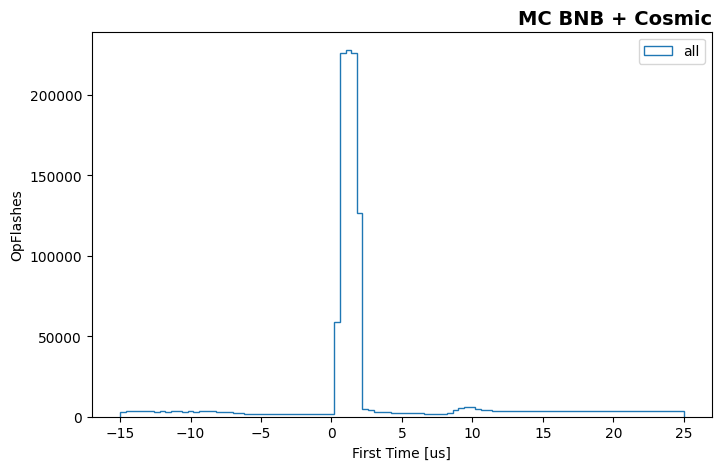

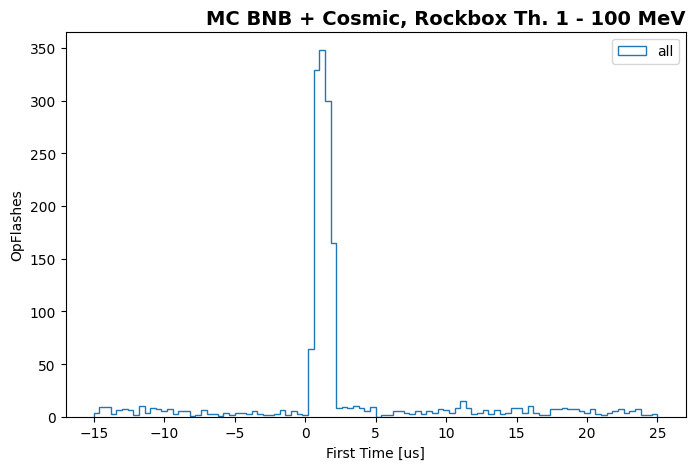

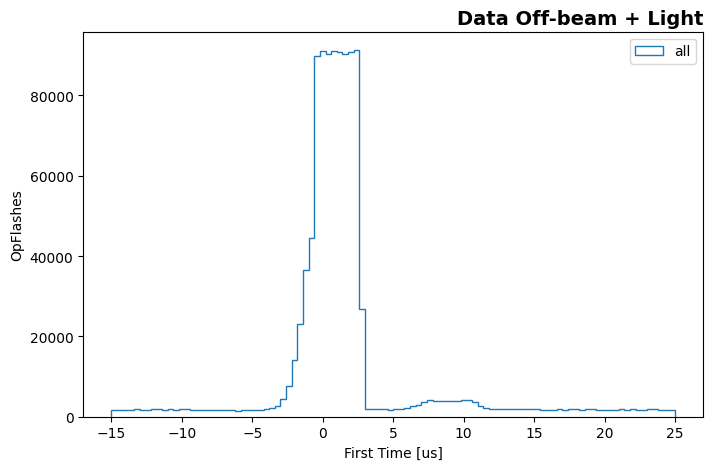

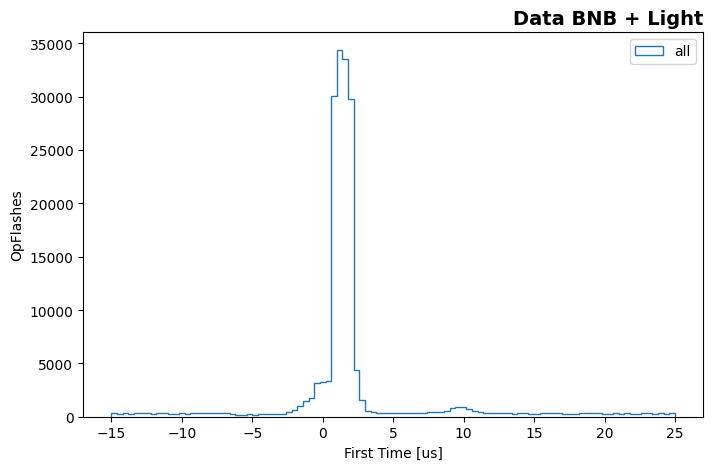

In [20]:
## Check OpFlash First Time distributions
draw_a_distribution(mc_bnb_cosmic_opflash_df, ('firsttime'), "First Time [us]", -15., 25., 100, "OpFlashes", False, False, "MC BNB + Cosmic")
draw_a_distribution(mc_rockbox_dirt_df, ('firsttime'), "First Time [us]", -15., 25., 100, "OpFlashes", False, False, "MC BNB + Cosmic, Rockbox Th. 1 - 100 MeV")
draw_a_distribution(data_offbeam_light_opflash_df, ('firsttime'), "First Time [us]", -15., 25., 100, "OpFlashes", False, False, "Data Off-beam + Light")
draw_a_distribution(data_bnb_light_opflash_df, ('firsttime'), "First Time [us]", -15., 25., 100, "OpFlashes", False, False, "Data BNB + Light")

In [21]:
## Based on the previous block's result, we use [-5 us, +5 us] window for collecting OpFlashes corresponding to the trigger

mc_bnb_light_opflash_time_cut_df = mc_bnb_cosmic_opflash_df[(mc_bnb_cosmic_opflash_df.firsttime > -5.) & (mc_bnb_cosmic_opflash_df.firsttime < 5.)]
mc_rockbox_dirt_opflash_time_cut_df = mc_rockbox_dirt_df[(mc_rockbox_dirt_df.firsttime > -5.) & (mc_rockbox_dirt_df.firsttime < 5.)]
data_offbeam_light_opflash_df = data_offbeam_light_opflash_df[(data_offbeam_light_opflash_df.firsttime > -5.) & (data_offbeam_light_opflash_df.firsttime < 5.)]
data_bnb_light_opflash_df = data_bnb_light_opflash_df[(data_bnb_light_opflash_df.firsttime > -5.) & (data_bnb_light_opflash_df.firsttime < 5.)]

In [22]:
## Sum PEs for OpFlashes within the timing window

mc_bnb_cosmic_totalpe_sum_time_cut=(mc_bnb_light_opflash_time_cut_df.groupby(level=[0, 1])["totalpe"].sum())
mc_rockbox_dirt_totalpe_sum_time_cut=(mc_rockbox_dirt_opflash_time_cut_df.groupby(level=[0, 1])["totalpe"].sum())
data_offbeam_light_totalpe_sum_time_cut=(data_offbeam_light_opflash_df.groupby(level=[0, 1])["totalpe"].sum())
data_bnb_light_totalpe_sum_time_cut=(data_bnb_light_opflash_df.groupby(level=[0, 1])["totalpe"].sum())

In [23]:
## Add the total PE column to the hdr DataFrames, and fill empty (NaN) entries with 0.

mc_bnb_cosmic_dfs['hdr']['totalpe_timecut'] = mc_bnb_cosmic_totalpe_sum_time_cut
mc_bnb_cosmic_dfs['hdr']['totalpe_timecut'] = (mc_bnb_cosmic_dfs['hdr']['totalpe_timecut'].fillna(-1.))

mc_rockbox_dirt_dfs['hdr']['totalpe_timecut'] = mc_rockbox_dirt_totalpe_sum_time_cut
mc_rockbox_dirt_dfs['hdr']['totalpe_timecut'] = (mc_rockbox_dirt_dfs['hdr']['totalpe_timecut'].fillna(-1.))

data_offbeam_light_dfs['hdr']['totalpe_timecut'] = data_offbeam_light_totalpe_sum_time_cut
data_offbeam_light_dfs['hdr']['totalpe_timecut'] = (data_offbeam_light_dfs['hdr']['totalpe_timecut'].fillna(-1.))

data_bnb_light_dfs['hdr']['totalpe_timecut'] = data_bnb_light_totalpe_sum_time_cut
data_bnb_light_dfs['hdr']['totalpe_timecut'] = (data_bnb_light_dfs['hdr']['totalpe_timecut'].fillna(-1.))

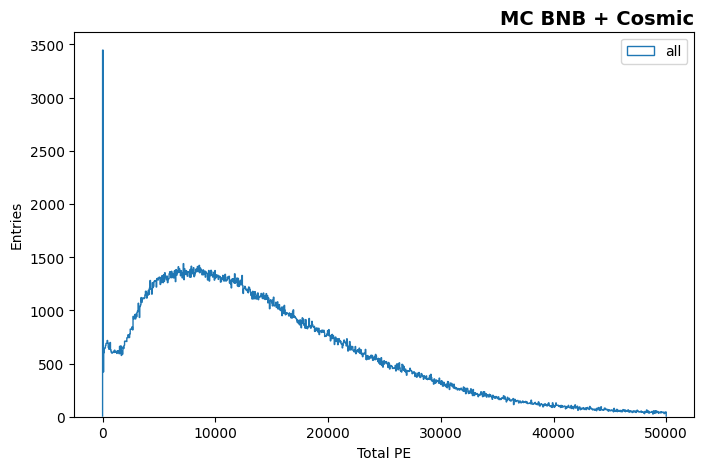

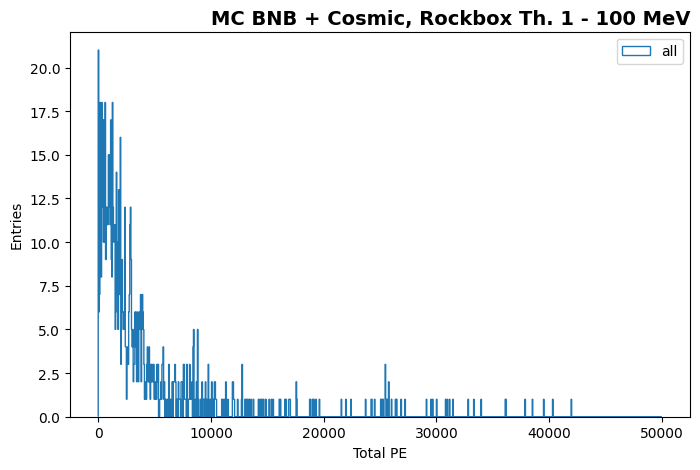

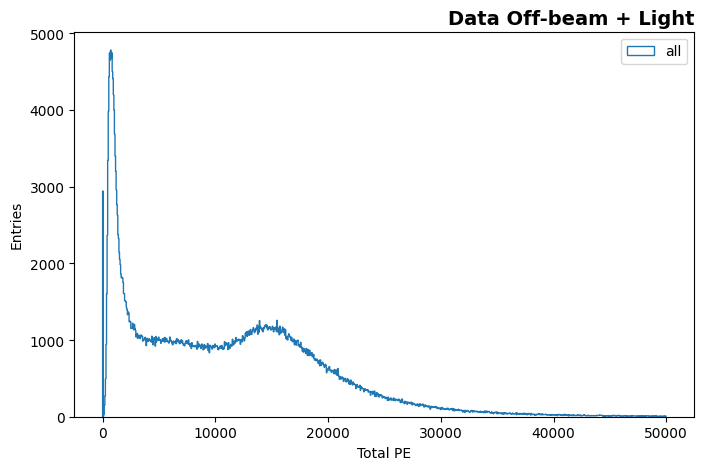

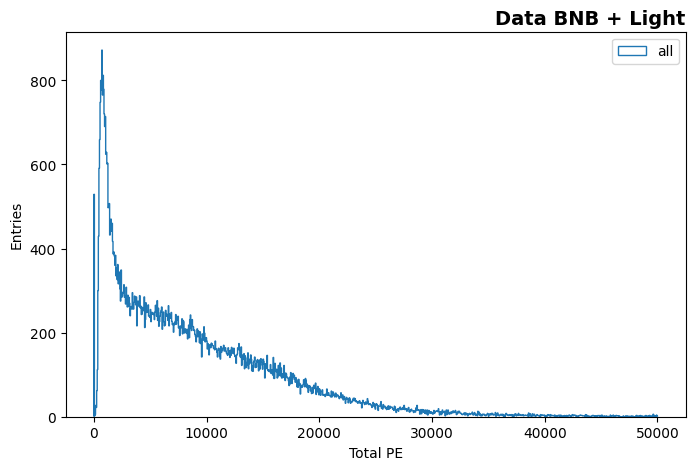

In [24]:
## Check the total PE distributions

draw_a_distribution(mc_bnb_cosmic_dfs['hdr'], ('totalpe_timecut'), "Total PE", -10, 50000, 1000, "Entries", False, False, "MC BNB + Cosmic")
draw_a_distribution(mc_rockbox_dirt_dfs['hdr'], ('totalpe_timecut'), "Total PE", -10, 50000, 1000, "Entries", False, False, "MC BNB + Cosmic, Rockbox Th. 1 - 100 MeV")
draw_a_distribution(data_offbeam_light_dfs['hdr'], ('totalpe_timecut'), "Total PE", -10, 50000, 1000, "Entries", False, False, "Data Off-beam + Light")
draw_a_distribution(data_bnb_light_dfs['hdr'], ('totalpe_timecut'), "Total PE", -10, 50000, 1000, "Entries", False, False, "Data BNB + Light")

In [25]:
## Apply a scale to MC total PE
mc_bnb_cosmic_hdr_df = mc_bnb_cosmic_dfs['hdr']
mc_bnb_cosmic_hdr_df['totalpe_timecut_0p66'] = mc_bnb_cosmic_hdr_df['totalpe_timecut'] * 0.66

mc_rockbox_dirt_hdr_df = mc_rockbox_dirt_dfs['hdr']
mc_rockbox_dirt_hdr_df['totalpe_timecut_0p66'] = mc_rockbox_dirt_hdr_df['totalpe_timecut'] * 0.66

data_offbeam_light_hdr_df = data_offbeam_light_dfs['hdr']
data_bnb_light_hdr_df = data_bnb_light_dfs['hdr']

In [26]:
## Compared the default and scaled total PE columns
mc_bnb_cosmic_hdr_df[["totalpe_timecut", "totalpe_timecut_0p66"]]

totalpe_timecut  totalpe_timecut_0p66
__ntuple entry                                       
11       0          3739.501221           2468.070801
         1         48397.496094          31942.349609
         2         30246.646484          19962.787109
         3          3725.577148           2458.881104
         4         16434.703125          10846.904297
...                         ...                   ...
166      3491      38642.183594          25503.841797
         3492      18889.599609          12467.136719
         3493      18676.240234          12326.319336
         3494       5429.220703           3583.285889
         3495      12168.340820           8031.105469

[601974 rows x 2 columns]

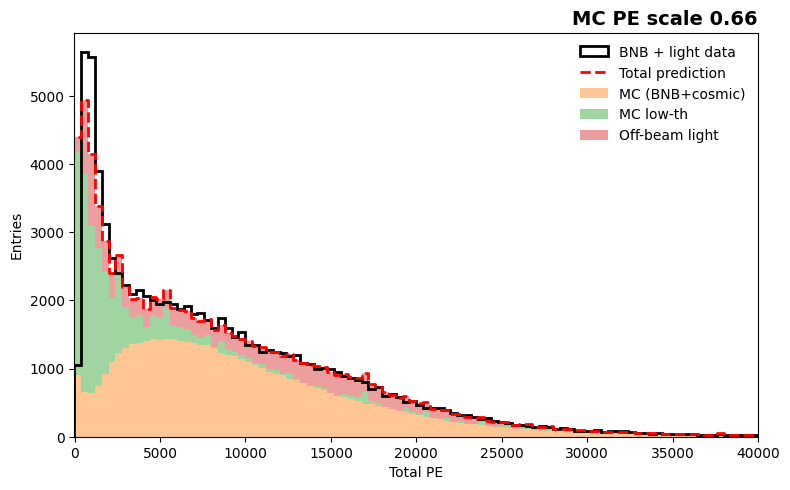

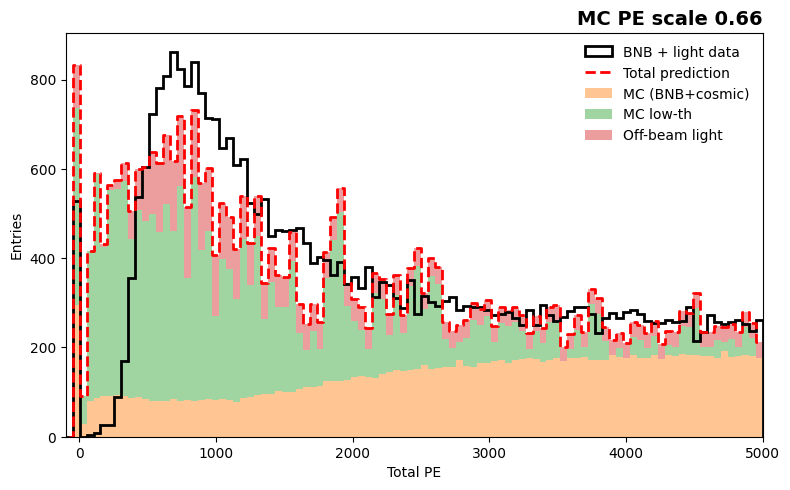

In [27]:
## Check total PE distribution
abs_comp_total_pe_two_mc_stack(mc_bnb_cosmic_hdr_df, mc_rockbox_dirt_hdr_df, data_bnb_light_hdr_df, data_offbeam_light_hdr_df, ('totalpe_timecut_0p66'), ('totalpe_timecut'), "Total PE", -10., 40000, 100, "Entries", False, False, "MC PE scale 0.66", mc_pot_scale, mc_low_th_scale, intime_gate_scale)
abs_comp_total_pe_two_mc_stack(mc_bnb_cosmic_hdr_df, mc_rockbox_dirt_hdr_df, data_bnb_light_hdr_df, data_offbeam_light_hdr_df, ('totalpe_timecut_0p66'), ('totalpe_timecut'), "Total PE", -100, 5000, 100, "Entries", False, False, "MC PE scale 0.66", mc_pot_scale, mc_low_th_scale, intime_gate_scale)

In [28]:
## DEFINE PE CUT
total_pe_cut = 2000.
mc_bnb_cosmic_pe_mask = mc_bnb_cosmic_hdr_df["totalpe_timecut_0p66"] > total_pe_cut
mc_low_th_pe_mask = mc_rockbox_dirt_hdr_df['totalpe_timecut_0p66'] > total_pe_cut
data_offbeam_pe_mask = data_offbeam_light_hdr_df['totalpe_timecut'] > total_pe_cut
data_bnb_light_pe_mask = data_bnb_light_hdr_df['totalpe_timecut'] > total_pe_cut

In [29]:
## Since evt DataFrame has more level in labels, we should make a mask for considering the difference
def get_evt_pe_mask(mask, df):
    sel_idx = mask[mask].index
    pairs = df.index.droplevel([-2, -1])
    mask2 = pairs.isin(sel_idx)
    return mask2

In [30]:
mc_bnb_cosmic_evt_pe_mask = get_evt_pe_mask(mc_bnb_cosmic_pe_mask, mc_bnb_cosmic_dfs["evt"])
mc_low_th_evt_pe_mask = get_evt_pe_mask(mc_low_th_pe_mask, mc_rockbox_dirt_dfs["evt"])
data_offbeam_evt_pe_mask = get_evt_pe_mask(data_offbeam_pe_mask, data_offbeam_light_dfs["evt"])
data_bnb_light_evt_pe_mask = get_evt_pe_mask(data_bnb_light_pe_mask, data_bnb_light_dfs["evt"])

In [31]:
## Double checking for legnths of evt DataFrame and the mask array
print("mc_bnb_cosmic_dfs['evt'] length: %d" %len(mc_bnb_cosmic_dfs['evt']))
print("mc_bnb_cosmic_evt_pe_mask length: %d" %len(mc_bnb_cosmic_evt_pe_mask))

print("mc_rockbox_dirt_dfs['evt'] length: %d" %len(mc_rockbox_dirt_dfs['evt']))
print("mc_low_th_evt_pe_mask length: %d" %len(mc_low_th_evt_pe_mask))

print("data_offbeam_light_dfs['evt'] length: %d" %len(data_offbeam_light_dfs['evt']))
print("data_offbeam_evt_pe_mask length: %d" %len(data_offbeam_evt_pe_mask))

print("data_bnb_light_dfs['evt'] length: %d" %len(data_bnb_light_dfs['evt']))
print("data_bnb_light_evt_pe_mask length: %d" %len(data_bnb_light_evt_pe_mask))

mc_bnb_cosmic_dfs['evt'] length: 7404868
mc_bnb_cosmic_evt_pe_mask length: 7404868
mc_rockbox_dirt_dfs['evt'] length: 10211
mc_low_th_evt_pe_mask length: 10211
data_offbeam_light_dfs['evt'] length: 7381231
data_offbeam_evt_pe_mask length: 7381231
data_bnb_light_dfs['evt'] length: 1249254
data_bnb_light_evt_pe_mask length: 1249254


In [32]:
## Add PE cut decision (boolean) column to evt DataFrame
mc_bnb_cosmic_dfs["evt"][('pemask', '', '', '', '', '')] = mc_bnb_cosmic_evt_pe_mask
mc_rockbox_dirt_dfs["evt"][('pemask', '', '', '', '', '')] = mc_low_th_evt_pe_mask
data_bnb_light_dfs["evt"][('pemask', '', '', '', '', '')] = data_bnb_light_evt_pe_mask
data_offbeam_light_dfs["evt"][('pemask', '', '', '', '', '')] = data_offbeam_evt_pe_mask

## Define FV

In [33]:
def InFV_trk(data): # cm
    xmin = -190.
    ymin = -190.
    zmin = 10.
    xmax = 190.
    ymax =  190.
    zmax =  450.
    return (data.x > xmin) & (data.x < xmax) & (data.y > ymin) & (data.y < ymax) & (data.z > zmin) & (data.z < zmax)

def InFV(data): # cm
    xmin = -190.
    ymin = -190.
    zmin = 10.
    xmax = 190.
    ymax =  190.
    zmax =  450.
    return (np.abs(data.x) > 10) & (np.abs(data.x) < 190) & (data.y > ymin) & (data.y < ymax) & (data.z > zmin) & (data.z < zmax)

def InAV(data): # cm
    xmin = -200.
    ymin = -200.
    zmin = 0.
    xmax = 200.
    ymax =  200.
    zmax =  500.
    return (np.abs(data.x) > 10) & (np.abs(data.x) < 190) & (data.y > ymin) & (data.y < ymax) & (data.z > zmin) & (data.z < zmax)


def InFV_xy(data): # cm
    xmin = 10.
    ymin = -190.
    xmax = 190.
    ymax =  190.
    return (np.abs(data.x) > xmin) & (np.abs(data.x) < xmax) & (data.y > ymin) & (data.y < ymax)

## Vetoing high y and high z region
def InFV_nohiyz(data):
    xmin = 10.
    xmax = 190.
    zmin = 10.
    zmax = 450.
    ymax_highz = 100.
    pass_xz = (np.abs(data.x) > xmin) & (np.abs(data.x) < xmax) & (data.z > zmin) & (data.z < zmax)
    pass_y = ((data.z < 250) & (np.abs(data.y) < 190.)) | ((data.z > 250) & (data.y > -190.) & (data.y < ymax_highz))
    return pass_xz & pass_y

def InFV_nohiyz_trk(data):
    xmax = 190.
    zmin = 10.
    zmax = 450.
    ymax_highz = 100.
    pass_xz = (np.abs(data.x) < xmax) & (data.z > zmin) & (data.z < zmax)
    pass_y = ((data.z < 250) & (np.abs(data.y) < 190.)) | ((data.z > 250) & (data.y > -190.) & (data.y < ymax_highz))
    return pass_xz & pass_y


## Match truth and MC and create categories

In [34]:
def get_true_t(df):
    t = (df.E - df.mu.genE - df.cpi.genE)**2 - (df.momentum.x - df.mu.genp.x - df.cpi.genp.x)**2 - (df.momentum.y - df.mu.genp.y - df.cpi.genp.y)**2 - (df.momentum.z - df.mu.genp.z - df.cpi.genp.z)**2
    return np.abs(t)

In [35]:
true_t = get_true_t(mc_bnb_cosmic_dfs['mcnu']).fillna(999999)
mc_bnb_cosmic_dfs['mcnu']['true_t'] = true_t

In [36]:
## For MC BNB + cosmic sample
is_fv = InFV(mc_bnb_cosmic_dfs['mcnu'].position)     #based on the true position
#is_signal = Signal(mc_bnb_cosmic_dfs['mcnu'])
is_cc = mc_bnb_cosmic_dfs['mcnu'].iscc               #based on truth CC info
genie_mode = mc_bnb_cosmic_dfs['mcnu'].genie_mode    #based on true interaction category
w = mc_bnb_cosmic_dfs['mcnu'].w
true_pdg = mc_bnb_cosmic_dfs['mcnu'].pdg

try :
    nuint_categ = pd.Series(8, index=mc_bnb_cosmic_dfs['mcnu'].index)
except Exception as e:
    print(f"Error init nuint_categ")

nuint_categ[~is_fv] = -1  # Out of FV
nuint_categ[is_fv & is_cc & (true_pdg == 14)] = 1 # Signal
nuint_categ[is_fv & ~is_cc] = 0  # NC
nuint_categ[is_fv & is_cc & (true_pdg != 14) & (genie_mode == 3)] = 2  #  CCCOH
nuint_categ[is_fv & is_cc & (true_pdg != 14) & (genie_mode == 0)] = 3  # CCQE
nuint_categ[is_fv & is_cc & (true_pdg != 14) & (genie_mode == 10)] = 4  # 2p2h
nuint_categ[is_fv & is_cc & (true_pdg != 14) & (genie_mode != 0) & (genie_mode != 3) & (genie_mode != 10) & ((w < 1.4) | (genie_mode == 1))] = 5  # RES
nuint_categ[is_fv & is_cc & (true_pdg != 14) & (genie_mode != 0) & (genie_mode != 3) & (genie_mode != 10) & ((w > 2.0) | (genie_mode == 2))] = 6  # DIS

mc_bnb_cosmic_dfs['mcnu']['nuint_categ'] = nuint_categ

In [37]:
## For MC Low Th. BNB + cosmic sample
is_fv = InFV(mc_rockbox_dirt_dfs['mcnu'].position)
#is_signal = Signal(mc_rockbox_dirt_dfs['mcnu'])
is_cc = mc_rockbox_dirt_dfs['mcnu'].iscc
genie_mode = mc_rockbox_dirt_dfs['mcnu'].genie_mode
w = mc_rockbox_dirt_dfs['mcnu'].w
true_pdg = mc_rockbox_dirt_dfs['mcnu'].pdg

try :
    nuint_categ = pd.Series(8, index=mc_rockbox_dirt_dfs['mcnu'].index)
except Exception as e:
    print(f"Error init nuint_categ")

nuint_categ[~is_fv] = -1  # Out of FV
nuint_categ[is_fv & is_cc & (true_pdg == 14)] = 1 # Signal
nuint_categ[is_fv & ~is_cc] = 0  # NC
nuint_categ[is_fv & is_cc & (true_pdg != 14) & (genie_mode == 3)] = 2  #  CCCOH
nuint_categ[is_fv & is_cc & (true_pdg != 14) & (genie_mode == 0)] = 3  # CCQE
nuint_categ[is_fv & is_cc & (true_pdg != 14) & (genie_mode == 10)] = 4  # 2p2h
nuint_categ[is_fv & is_cc & (true_pdg != 14) & (genie_mode != 0) & (genie_mode != 3) & (genie_mode != 10) & ((w < 1.4) | (genie_mode == 1))] = 5  # RES
nuint_categ[is_fv & is_cc & (true_pdg != 14) & (genie_mode != 0) & (genie_mode != 3) & (genie_mode != 10) & ((w > 2.0) | (genie_mode == 2))] = 6  # DIS

mc_rockbox_dirt_dfs['mcnu']['nuint_categ'] = nuint_categ

In [38]:
#### 1) Merging is based on matching between slc.tmatch.idx of evtdf and rec.mc.nu..index of mcnudf.
####    For each entry (readout window), there could be multiple truth neutrino interactions and reconstructed slices
####    We want to match each truth neutrino interaction to a corresponding slice

#It matches the levels of the two datasets to be merged, and then merges them (so all columns and rows join the dataset)


# match for mc bnb cosmic
mc_bnb_cosmic_dfs["mcnu"].columns = pd.MultiIndex.from_tuples([('gen',) + col if isinstance(col, tuple) else ('gen', col) for col in mc_bnb_cosmic_dfs["mcnu"].columns])
mc_bnb_cosmic_dfs["mcnu"].columns = pd.MultiIndex.from_tuples([
    col + ('',) * (6 - len(col)) for col in mc_bnb_cosmic_dfs["mcnu"].columns
])
mc_bnb_cosmic_dfs["evt"] = ph.multicol_merge(mc_bnb_cosmic_dfs["evt"].reset_index(), mc_bnb_cosmic_dfs["mcnu"].reset_index(),
                                            left_on=[('__ntuple', '', '', '', '', ''), ('entry', '', '', '', '', ''), ('slc','tmatch', 'idx', '', '', '')],
                                            right_on=[('__ntuple', '', '', '', '', ''), ('entry', '', '', '', '', ''), ('rec.mc.nu..index', '','', '', '', '')], 
                                            how="left") ## -- save all sllices
mc_bnb_cosmic_dfs["evt"] = mc_bnb_cosmic_dfs["evt"].set_index(["__ntuple", "entry", "rec.slc..index", "rec.slc.reco.pfp..index"], verify_integrity=True)
mc_bnb_cosmic_dfs["evt"].loc[mc_bnb_cosmic_dfs["evt"][('gen', 'nuint_categ', '', '', '', '')].isna(), [('gen', 'nuint_categ', '', '', '', '')]] = -2


# match for MC Low Th. BNB + cosmic sample
mc_rockbox_dirt_dfs["mcnu"].columns = pd.MultiIndex.from_tuples([('gen',) + col if isinstance(col, tuple) else ('gen', col) for col in mc_rockbox_dirt_dfs["mcnu"].columns])
mc_rockbox_dirt_dfs["mcnu"].columns = pd.MultiIndex.from_tuples([
    col + ('',) * (6 - len(col)) for col in mc_rockbox_dirt_dfs["mcnu"].columns
])
mc_rockbox_dirt_dfs["evt"] = ph.multicol_merge(mc_rockbox_dirt_dfs["evt"].reset_index(), mc_rockbox_dirt_dfs["mcnu"].reset_index(),
                            left_on=[('__ntuple', '', '', '', '', ''), ('entry', '', '', '', '', ''), ('slc','tmatch', 'idx', '', '', '')],
                            right_on=[('__ntuple', '', '', '', '', ''), ('entry', '', '', '', '', ''), ('rec.mc.nu..index', '','', '', '', '')], 
                            how="left") ## -- save all sllices
mc_rockbox_dirt_dfs["evt"] = mc_rockbox_dirt_dfs["evt"].set_index(["__ntuple", "entry", "rec.slc..index", "rec.slc.reco.pfp..index"], verify_integrity=True)
mc_rockbox_dirt_dfs["evt"].loc[mc_rockbox_dirt_dfs["evt"][('gen', 'nuint_categ', '', '', '', '')].isna(), [('gen', 'nuint_categ', '', '', '', '')]] = -2
mc_rockbox_dirt_dfs["evt"][('gen', 'nuint_categ', '', '', '', '')] = -4

data_offbeam_light_dfs["evt"][('gen', 'nuint_categ', '', '', '', '')] = -3

In [39]:
## Check 
mc_bnb_cosmic_dfs["mcnu"].gen.nuint_categ.value_counts()

nuint_categ
-1    748556
 1    236711
 0     96434
 3      1657
 5      1055
 4       526
 6       306
 2        15
Name: count, dtype: int64

values =  [      0. 2197356. 5207512.       0.]
sum values =  7404868.0


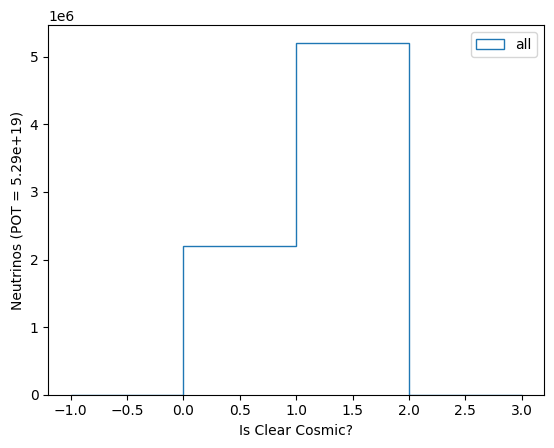

In [40]:
#Plot a variable

var = mc_bnb_cosmic_dfs["evt"].slc.is_clear_cosmic 
values, bins, patches = plt.hist(var, bins=np.linspace(-1., 3., 5), weights=[np.ones_like(data) * 1. for data in var], histtype="step", label=["all"])
print("values = ", values)
print("sum values = ", sum(values))
plt.xlabel("Is Clear Cosmic?")
plt.ylabel(f"Neutrinos (POT = {mc_tot_pot:.2e})")
plt.legend()
plt.show()

sum_value_nocut = sum(values)

In [41]:
print(mc_bnb_cosmic_dfs["evt"].columns.values)

[('slc', 'is_clear_cosmic', '', '', '', '')
 ('slc', 'vertex', 'x', '', '', '') ('slc', 'vertex', 'y', '', '', '')
 ('slc', 'vertex', 'z', '', '', '') ('slc', 'self', '', '', '', '')
 ('slc', 'tmatch', 'eff', '', '', '') ('slc', 'tmatch', 'pur', '', '', '')
 ('slc', 'tmatch', 'idx', '', '', '') ('slc', 'producer', '', '', '', '')
 ('slc', 'nuid', 'crlongtrkdiry', '', '', '')
 ('slc', 'nu_score', '', '', '', '')
 ('slc', 'barycenterFM', 'flashTime', '', '', '')
 ('slc', 'opt0', 'score', '', '', '') ('slc', 'opt0', 'time', '', '', '')
 ('slc', 'truth', 'E', '', '', '')
 ('slc', 'truth', 'baseline', '', '', '')
 ('slc', 'truth', 'time', '', '', '')
 ('slc', 'truth', 'bjorkenX', '', '', '')
 ('slc', 'truth', 'inelasticityY', '', '', '')
 ('slc', 'truth', 'Q2', '', '', '') ('slc', 'truth', 'w', '', '', '')
 ('slc', 'truth', 'momentum', 'x', '', '')
 ('slc', 'truth', 'momentum', 'y', '', '')
 ('slc', 'truth', 'momentum', 'z', '', '')
 ('slc', 'truth', 'position', 'x', '', '')
 ('slc', 'truth

In [42]:
mc_bnb_cosmic_dfs["evt"].pfp.trackScore

__ntuple  entry  rec.slc..index  rec.slc.reco.pfp..index
11        0      0               0                          0.654901
                                 1                          0.605494
                 1               0                         -5.000000
                                 3                         -5.000000
                 2               0                         -5.000000
                                                              ...   
166       3495   8               0                         -5.000000
                                 1                         -5.000000
                 9               0                         -5.000000
                 10              0                         -5.000000
                                 1                         -5.000000
Name: trackScore, Length: 7404868, dtype: float32

In [47]:
mc_bnb_cosmic_dfs["evt"].slc.opt0.score

__ntuple  entry  rec.slc..index  rec.slc.reco.pfp..index
11        0      0               0                          530.048523
                                 1                          530.048523
                 1               0                                 NaN
                                 3                                 NaN
                 2               0                                 NaN
                                                               ...    
166       3495   8               0                                 NaN
                                 1                                 NaN
                 9               0                                 NaN
                 10              0                                 NaN
                                 1                                 NaN
Name: score, Length: 7404868, dtype: float32

In [70]:
mc_bnb_cosmic_dfs["evt"].pfp.trk.len

__ntuple  entry  rec.slc..index  rec.slc.reco.pfp..index
11        1      0               0                          440.612152
                 3               0                           86.355690
                 4               0                           52.513306
          2      0               0                          421.085480
                                 2                            6.296945
                                                               ...    
166       3494   1               0                           50.728661
                                 1                           31.471315
                                 2                            1.215997
          3495   1               0                           32.864727
                 2               0                            8.355162
Name: len, Length: 1232932, dtype: float32

In [72]:
mc_bnb_cosmic_dfs["evt"].pfp.trk.chi2pid.I2.chi2_muon

__ntuple  entry  rec.slc..index  rec.slc.reco.pfp..index
11        1      0               0                          11.275742
                 3               0                           2.334339
                 4               0                           8.126199
          2      0               0                          13.990372
                                 2                          49.386826
                                                              ...    
166       3494   1               0                          12.668344
                                 1                          10.410773
                                 2                          10.902820
          3495   1               0                          41.511925
                 2               0                          14.274219
Name: chi2_muon, Length: 1232932, dtype: float32

In [73]:
mc_bnb_cosmic_dfs["evt"].pfp.trk.chi2pid.I2.chi2_proton

__ntuple  entry  rec.slc..index  rec.slc.reco.pfp..index
11        1      0               0                          204.308868
                 3               0                          132.159393
                 4               0                          195.815323
          2      0               0                          229.753708
                                 2                            4.853012
                                                               ...    
166       3494   1               0                          203.331314
                                 1                          215.828629
                                 2                          179.771759
          3495   1               0                            9.081104
                 2               0                          169.339371
Name: chi2_proton, Length: 1232932, dtype: float32

In [48]:
def HasMuonCandidate(data): # cm
    track = data.pfp.trackScore > 0.6
    length = data.pfp.trk.len > 32
    muchi2 = data.pfp.trk.chi2pid.I2.chi2_muon < 18
    pchi2 = data.pfp.trk.chi2pid.I2.chi2_proton > 97
    return (track & length & muchi2 & pchi2)

def HasMuonCandidate_lowZ(data): # cm
    track = data.pfp.trackScore > 0.6
    length = data.pfp.trk.len > 32
    muchi2 = data.pfp.trk.chi2pid.I2.chi2_muon < 18
    pchi2 = data.pfp.trk.chi2pid.I2.chi2_proton > 97
    z = data.pfp.trk.end.z > 6
    return (track & length & muchi2 & pchi2 & z)

In [49]:
is_mu = HasMuonCandidate(mc_bnb_cosmic_dfs["evt"])
print(is_mu)

__ntuple  entry  rec.slc..index  rec.slc.reco.pfp..index
11        0      0               0                          False
                                 1                          False
                 1               0                          False
                                 3                          False
                 2               0                          False
                                                            ...  
166       3495   8               0                          False
                                 1                          False
                 9               0                          False
                 10              0                          False
                                 1                          False
Length: 7404868, dtype: bool


## Set up plotting

In [53]:
## -- Label definitions for plotting

#Labels for the true interaction modes
#mode_list = [6, 1, 0, 4, 5, 3, 2, -1, -2]
#mode_labels = ["NumuCC", "CC COH", "NC", "CC RES", "CC IDS", "CC 2p2h", "CC QE", "Non-FV", "Others"]
#colors = ['#d62728',  # Red            
#          '#1f77b4',  # Blue
#          '#ff7f0e',  # Orange
#          '#2ca02c',  # Green
#          '#17becf',  # Teal
#          '#9467bd',  # Purple
#          '#8c564b',  # Brown
#          '#e377c2',  # Pink
#          '#7f7f7f']  # Gray
          #'#bcbd22',  # Yellow-green
          #'#17becf']  # Teal
## Note: the model_list and mode_labels are based on truth level event categories in the previous section

mode_list = [1, 2, 0, 3, 4, 5, 6, -1, -2, -3, -4]
mode_labels = ["Signal", "CC COH (non. Sig)", "NC (non. Sig)", "QE (non. Sig)", "2p2h (non. Sig)", "RES (non. Sig)", "DIS (non. Sig)", "Non-FV (non. Sig)", "Others (non. Sig)", "Intime Cosmics (non. Sig)", "Low Th. Rockbox (non. Sig)"]
colors = ['#d62728',  # Red            Signal
          '#1f77b4',  # Blue           NS CCCOH
          '#ff7f0e',  # Orange          NC
          '#2ca02c',  # Green           QE
          '#17becf',  # Teal           2p2h
          '#9467bd',  # Purple         RES
          '#8c564b',  # Brown           DIS
          '#e377c2',  # Pink            NON FV
          '#7f7f7f',  # Gray             Other
          '#bcbd22',  # Yellow-green      In time cosmics
          '#FFD700']  # Gold              Low Th dirt

def draw_reco_stacked_hist(var_mc, var_mc_low_th, var_offbeam_data, is_logx, is_logy,
                           title_x, title_y, x_min, x_max, nbins, outname,
                           data_overlay=False, var_data=[], draw_density=False):
    
    ## Define the output figure to have two pads
    fig = plt.figure(figsize=(8, 8), dpi=100)
    gs = gridspec.GridSpec(2, 1, height_ratios=[5, 1], hspace=0.10)
    ax_main = fig.add_subplot(gs[0])
    ax_ratio = fig.add_subplot(gs[1], sharex=ax_main)
    
    if is_logx:
        ax_main.set_xscale('log')
        ax_ratio.set_xscale('log')        
    if is_logy:
        ax_main.set_yscale('log')


    ax_main.set_xlabel("")  # Only bottom has x-label
    ax_main.set_ylabel(title_y)
    ax_ratio.set_ylabel("Data/MC", fontsize=12)
    ax_ratio.set_xlabel(title_x, fontsize = 20)

    ax_ratio.axhline(1.0, color='red', linestyle='--', linewidth=1)
    ax_ratio.set_ylabel("Data/MC", fontsize=12)
    ax_ratio.set_xlabel(title_x, fontsize=12)
    ax_ratio.set_ylim(0.5, 1.5)
    ax_ratio.tick_params(width=2, length=6)
    for spine in ax_ratio.spines.values():
        spine.set_linewidth(2)

    plt.setp(ax_main.get_xticklabels(), visible=False)

    ## Defind binning
    if is_logx:
        bins = np.logspace(np.log10(x_min), np.log10(x_max), nbins + 1)
        bin_centers = np.sqrt(bins[:-1] * bins[1:])
    else:
        bins = np.linspace(x_min, x_max, nbins + 1)
        bin_centers = 0.5 * (bins[:-1] + bins[1:])

    ## Define data for MC
    all_mc_data = var_mc + var_mc_low_th + var_offbeam_data
    #print("all_mc_data ", all_mc_data)
    all_weights = (
        [np.ones_like(data) * mc_pot_scale for data in var_mc] +
        [np.ones_like(data) * mc_low_th_scale for data in var_mc_low_th] + 
        [np.ones_like(data) * intime_gate_scale for data in var_offbeam_data]
    )
    each_mc_hist_data = [np.histogram(data, bins=bins, weights=w)[0] for data, w in zip(all_mc_data, all_weights)]
    total_mc = np.sum(each_mc_hist_data, axis=0)

    ## Plot stacked MC
    hist_data, bins, _ = ax_main.hist(all_mc_data,
                                      bins=bins,
                                      weights=all_weights,
                                      stacked=True,
                                      color=colors,
                                      label=mode_labels,
                                      edgecolor='none',
                                      linewidth=0,
                                      density=draw_density,
                                      histtype='stepfilled')

    max_y = np.max(total_mc)

    ## Plot MC stat error box
    each_mc_hist_data = []
    each_mc_hist_err2 = []  # sum of squared weights for error

    for data, w in zip(all_mc_data, all_weights):
        hist_vals, _ = np.histogram(data, bins=bins, weights=w)
        hist_err2, _ = np.histogram(data, bins=bins, weights=np.square(w))
        each_mc_hist_data.append(hist_vals)
        each_mc_hist_err2.append(hist_err2)

    total_mc = np.sum(each_mc_hist_data, axis=0)
    total_mc_err2 = np.sum(each_mc_hist_err2, axis=0)
    mc_stat_err = np.sqrt(total_mc_err2)
    #mc_stat_err = np.sqrt(total_mc)

    ax_main.bar(
       bin_centers,
        2 * mc_stat_err,
        width=np.diff(bins),
        bottom=total_mc - mc_stat_err,
        facecolor='none',             # transparent fill
        edgecolor='black',            # outline color of the hatching
        hatch='xxxx',                 # hatch pattern similar to ROOT's 3004
        linewidth=0.0,
        label='MC Stat. Unc.'
    )

    ax_main.tick_params(width=2, length=10)
    for spine in ax_main.spines.values():
        spine.set_linewidth(2)

    ## Draw Ratio error bar
    mc_stat_err_ratio = mc_stat_err / total_mc
    mc_content_ratio = total_mc / total_mc
    mc_stat_err_ratio = np.nan_to_num(mc_stat_err_ratio, nan=0.)
    mc_content_ratio = np.nan_to_num(mc_content_ratio, nan=-999.)
    ax_ratio.bar(
        bin_centers,
        2*mc_stat_err_ratio,
        width=np.diff(bins),
        bottom=mc_content_ratio - mc_stat_err_ratio,
        facecolor='none',             # transparent fill
        edgecolor='black',            # outline color of the hatching
        hatch='xxxx',                 # hatch pattern similar to ROOT's 3004
        linewidth=0.0,
        label='MC Stat. Unc.'
    )

    ## Draw data too
    if data_overlay:
        ax_main.set_ylabel("Events (POT = %.2e)" % target_pot)
        if draw_density:
            ax_main.set_ylabel("A.U.")

        ## Define data histogram
        counts, _ = np.histogram(var_data, bins=bins)

        bin_widths = np.diff(bins)
        total_data = np.sum(counts)
        print("total data = ", total_data)
        norm_counts = counts
        data_eylow, data_eyhigh = sh.return_data_stat_err(counts)

        if draw_density:
            norm_counts = counts / (total_data * bin_widths)
            data_eylow = data_eylow / (total_data * bin_widths) if total_data > 0 else np.zeros_like(counts)
            data_eyhigh = data_eyhigh / (total_data * bin_widths) if total_data > 0 else np.zeros_like(counts)

        errors = data_eylow + data_eyhigh
        
        ## Plot data points on main histogram
        #ax_main.errorbar(bin_centers, norm_counts, yerr=errors,
        #                 fmt='o', color='black', label='Data',
        #                 markersize=5, capsize=3, linewidth=1.5)
        
        ax_main.errorbar(bin_centers, norm_counts,
                 yerr=np.vstack((data_eylow, data_eyhigh)),
                 fmt='o', color='black', label='Data',
                 markersize=5, capsize=3, linewidth=1.5)
        
        max_y_data = np.max(norm_counts + data_eyhigh)
        #print("max_y: %f" %(max_y))
        #print("max_y_data: %f" %(max_y_data))
        max_y = max(max_y, max_y_data)
        #print("max_y: %f" %(max_y))

        ## Make data/mc ratio plot
        data_ratio = norm_counts / total_mc
        print(norm_counts)
        print(total_mc)
        print("data ratio ", data_ratio)
        data_ratio_eylow = data_eylow / total_mc
        data_ratio_eyhigh = data_eyhigh / total_mc
        data_ratio = np.nan_to_num(data_ratio, nan=-999.)
        data_ratio_eylow = np.nan_to_num(data_ratio_eylow, nan=0.)
        data_ratio_eyhigh = np.nan_to_num(data_ratio_eyhigh, nan=0.)
        
        #data_ratio_errors = data_ratio_eylow + data_ratio_eyhigh
        #ax_ratio.errorbar(bin_centers, data_ratio, yerr=data_ratio_errors,
        #                 fmt='o', color='black', label='Data',
        #                 markersize=5, capsize=3, linewidth=1.5)

        ax_ratio.errorbar(bin_centers, data_ratio,
                  yerr=np.vstack((data_ratio_eylow, data_ratio_eyhigh)),
                  fmt='o', color='black', label='Data',
                  markersize=5, capsize=3, linewidth=1.5)

    ## Set ax_main axes variables
    ax_main.set_xlim(x_min, x_max)
    ax_main.set_ylim(0.0, max_y * 1.5)
    if is_logy:
        ax_main.set_ylim(0.1, max_y * 600)
    
    # Legend with fractions
    accum_sum = [np.sum(data) for data in hist_data]
    accum_sum = [0.] + accum_sum
    total_sum = accum_sum[-1]
    individual_sums = [accum_sum[i + 1] - accum_sum[i] for i in range(len(accum_sum) - 1)]
    fractions = [(count / total_sum) * 100 for count in individual_sums]
    legend_labels = [f"{label} ({frac:.1f}%)" for label, frac in zip(mode_labels[::-1], fractions[::-1])]
    if data_overlay:
        if draw_density:
            legend_labels.append("Data")
        else:
            legend_labels.append(f"Total MC Stat. Unc. ({total_sum:.0f})")
            legend_labels.append(f"Data ({total_data:.0f})")
            #legend_labels.append(f"Data ({total_data:.0f})")
    ax_main.legend(legend_labels, loc='upper left', fontsize=8, frameon=False, ncol=3, bbox_to_anchor=(0.05, 0.98))

    legend_labels_ratio = ["y=1", "MC (Stat. Only)", "Data/MC"]
    ax_ratio.legend(legend_labels_ratio, loc='upper left', fontsize=6, frameon=False, ncol=3, bbox_to_anchor=(0.05, 0.98))


    ax_main.text(0.00, 1.02, "SBND " + sample_str + ", Preliminary",
                 transform=ax_main.transAxes, fontsize=14, fontweight='bold')

    #fig.savefig("./plots/pandora_df/2025_v10_06_00_05/data_vs_mc_tpc/" + outname + ".pdf", format='pdf', bbox_inches='tight')
    plt.show()
    plt.close()

In [54]:
#Plot a given variables, dividing the plot into a stacked histogram by interaction mode
"""
def draw_mc_data_shape_comp_per_slc(mc_df, data_df, column, x_title, y_title, x_min, x_max, n_bins, out_name):
    nuint_categ_col = ('nuint_categ', '', '', '', '', '')
    
    #create dfs which group by entry and true slice, looking at the values for column (and nuint category column), and look at the first row in each group
    #mc_df_per_slc = mc_df.groupby([('entry'), ('rec.slc..index')])[[column, nuint_categ_col]].first()
    #data_df_per_slc = data_df.groupby([('entry'), ('rec.slc..index')])[[column]].first()
    mc_df_per_slc = mc_df.groupby([('__ntuple'), ('entry'), ('rec.slc..index')])[[column, nuint_categ_col]].first()
    data_df_per_slc = data_df.groupby([('__ntuple'), ('entry'), ('rec.slc..index')])[[column]].first()
    
    #Now get the values for each of the different interaction modes for what you want to plot
    var_mc = [mc_df_per_slc[mc_df_per_slc.nuint_categ == mode][column] for mode in mode_list]
    var_data = data_df_per_slc[column]
    
    #use the stacked histogram drawing function to plot the results
    fractions = draw_reco_stacked_hist(var_mc, False, x_title, y_title, x_min, x_max, n_bins, out_name, True, var_data)
    return fractions
"""
def draw_mc_data_shape_comp_per_slc(mc_bnb_cosmic_df, mc_low_th_df, data_offbeam_df, data_df, column, x_title, y_title, x_min, x_max, n_bins, out_name, is_logx = False, is_logy = False):
    nuint_categ_col = ('gen', 'nuint_categ', '', '', '', '')

    mc_bnb_cosmic_df_per_slc = mc_bnb_cosmic_df.groupby([('__ntuple'), ('entry'), ('rec.slc..index')])[[column, nuint_categ_col]].first()
    mc_low_th_df_per_slc = mc_low_th_df.groupby([('__ntuple'), ('entry'), ('rec.slc..index')])[[column, nuint_categ_col]].first()
    data_offbeam_df_per_slc = data_offbeam_df.groupby([('__ntuple'), ('entry'), ('rec.slc..index')])[[column, nuint_categ_col]].first()

    data_df_per_slc = data_df.groupby([('__ntuple'), ('entry'), ('rec.slc..index')])[[column]].first()

    mode_list_mc = [m for m in mode_list if ((m != -3) and (m != -4))]
    var_mc_bnb_cosmic = [mc_bnb_cosmic_df_per_slc[mc_bnb_cosmic_df_per_slc[nuint_categ_col] == mode][column]for mode in mode_list_mc]
    var_mc_low_th = [mc_low_th_df_per_slc[mc_low_th_df_per_slc.gen.nuint_categ == -4][column]]
    var_data_offbeam = [data_offbeam_df_per_slc[data_offbeam_df_per_slc.gen.nuint_categ == -3][column]]
    var_data = data_df_per_slc[column]
    draw_reco_stacked_hist(var_mc_bnb_cosmic, var_mc_low_th, var_data_offbeam, is_logx, is_logy, x_title, y_title, x_min, x_max, n_bins, out_name, True, var_data)


In [1]:
#Draw plots for a number of variables

def draw_reco_valid_plots(mc_bnb_cosmic_df, mc_low_th_df, data_offbeam_df, data_df, suffix, is_logx = False, is_logy = False):
    ## draw 1) clear cosmic, 2) nu score, 3) vertex x,y and z
    
    ## -- 1) Clear cosmic
    #clear_cosmic_col = ('slc', 'is_clear_cosmic', '', '', '', '')
    #fractions_clear_cosmic = draw_mc_data_shape_comp_per_slc(mc_df, data_df, clear_cosmic_col, "Is Clear Cosmic", "A.U.", -0.5, 1.5, 2, suffix + "_slc_is_clear_cosmic")
    clear_cosmic_col = ('slc', 'is_clear_cosmic', '', '', '', '')
    draw_mc_data_shape_comp_per_slc(mc_bnb_cosmic_df, mc_low_th_df, data_offbeam_df, data_df, clear_cosmic_col, "Is Clear Cosmic", "A.U.", -0.5, 1.5, 2, suffix + "_slc_is_clear_cosmic", is_logx, is_logy)

    opt0_score_col = ('slc', 'opt0', 'score', '', '', '')
    fractions_opt0_score = draw_mc_data_shape_comp_per_slc(mc_bnb_cosmic_df, mc_low_th_df, data_offbeam_df, data_df, opt0_score_col, "Opt0 Score", "A.U.", -4000, 4000, 100, suffix + "_slc_opt0_score", is_logx, is_logy)

    
    ## -- 2) nu score
    nu_score_col = ('slc', 'nu_score', '', '', '', '')
    fractions_nu_score = draw_mc_data_shape_comp_per_slc(mc_bnb_cosmic_df, mc_low_th_df,  data_offbeam_df, data_df, nu_score_col, "Nu Score", "A.U.", -1.1, 1.1, 44, suffix + "_slc_nu_score", is_logx, is_logy)

    ## -- 3) vertex x,y,z
    vtx_x_col = ('slc', 'vertex', 'x', '', '', '')
    vtx_y_col = ('slc', 'vertex', 'y', '', '', '')
    vtx_z_col = ('slc', 'vertex', 'z', '', '', '')
    fractions_vtx_x = draw_mc_data_shape_comp_per_slc(mc_bnb_cosmic_df, mc_low_th_df, data_offbeam_df, data_df, vtx_x_col, "Slice Vertex X [cm]", "A.U.", -300, 300, 100, suffix + "_slc_vtx_x", is_logx, is_logy)
    fractions_vtx_y = draw_mc_data_shape_comp_per_slc(mc_bnb_cosmic_df, mc_low_th_df, data_offbeam_df, data_df, vtx_y_col, "Slice Vertex Y [cm]", "A.U.", -300, 300, 100, suffix + "_slc_vtx_y", is_logx, is_logy)
    fractions_vtx_z = draw_mc_data_shape_comp_per_slc(mc_bnb_cosmic_df, mc_low_th_df, data_offbeam_df, data_df, vtx_z_col, "Slice Vertex Z [cm]", "A.U.", -100, 600, 100, suffix + "_slc_vtx_z", is_logx, is_logy)

    ## -- 4) track length and multiplicity
    #mc_matchdf.pfp.trk.len
    trk_len_col = ('pfp', 'trk', 'len', '', '', '')
    fractions_trk_len = draw_mc_data_shape_comp_per_slc(mc_bnb_cosmic_df, mc_low_th_df, data_offbeam_df, data_df, trk_len_col, "Track Length [cm]", "A.U.", 0, 400, 40, suffix + "_pfp_trk_len", is_logx, is_logy)

    ## -- 3) dir x,y,z
    dir_x_col = ('pfp', 'trk', 'dir', 'x', '', '')
    dir_y_col = ('pfp', 'trk', 'dir', 'y', '', '')
    dir_z_col = ('pfp', 'trk', 'dir', 'z', '', '')
    fractions_dir_x = draw_mc_data_shape_comp_per_slc(mc_bnb_cosmic_df, mc_low_th_df, data_offbeam_df, data_df, dir_x_col, "Track Dir X", "A.U.", -1, 1, 100, suffix + "_pfp_dir_x", is_logx, is_logy)
    fractions_dir_y = draw_mc_data_shape_comp_per_slc(mc_bnb_cosmic_df, mc_low_th_df, data_offbeam_df, data_df, dir_y_col, "Track Dir Y", "A.U.", -1, 1, 100, suffix + "_pfp_dir_y", is_logx, is_logy)
    fractions_dir_z = draw_mc_data_shape_comp_per_slc(mc_bnb_cosmic_df, mc_low_th_df, data_offbeam_df, data_df, dir_z_col, "Track Dir Z", "A.U.", -1, 1, 100, suffix + "_pfp_dir_z", is_logx, is_logy)    

    ## -- 3) dir x,y,z
    rng_p_col = ('pfp', 'trk', 'rangeP', 'p_muon', '', '')
    mcs_p_col = ('pfp', 'trk', 'mcsP', 'fwdP_muon', '', '')
    fractions_rng_p_x = draw_mc_data_shape_comp_per_slc(mc_bnb_cosmic_df, mc_low_th_df, data_offbeam_df, data_df, rng_p_col, "Track Range Momentum (muon)", "A.U.", 0, 2, 40, suffix + "_pfp_rng_p", is_logx, is_logy)
    fractions_mcs_p_y = draw_mc_data_shape_comp_per_slc(mc_bnb_cosmic_df, mc_low_th_df, data_offbeam_df, data_df, mcs_p_col, "Track MCS Momentum (muon)", "A.U.", 0, 2, 40, suffix + "_pfp_mcs_p", is_logx, is_logy)

    ## -- 4) track length and multiplicity
    #mc_matchdf.pfp.trk.len
    trk_score_col = ('pfp', 'trackScore', '', '', '', '')
    fractions_trk_score = draw_mc_data_shape_comp_per_slc(mc_bnb_cosmic_df, mc_low_th_df, data_offbeam_df, data_df, trk_score_col, "Track Score", "A.U.", 0, 1, 50, suffix + "_pfp_trk_score", is_logx, is_logy)
    
        ## -- 4) track length and multiplicity
    #mc_matchdf.pfp.trk.len
    dist_vtx_col = ('pfp', 'dist_to_vertex', '', '', '', '')
    fractions_dist_vtx = draw_mc_data_shape_comp_per_slc(mc_bnb_cosmic_df, mc_low_th_df, data_offbeam_df, data_df, dist_vtx_col, "Dist to Vtx [cm]", "A.U.", 0, 5, 40, suffix + "_pfp_dist_vtx", is_logx, is_logy)

    ## -- 3) vertex x,y,z
    trk_x_col = ('pfp', 'trk', 'start', 'x', '', '')
    trk_y_col = ('pfp', 'trk', 'start', 'y', '', '')
    trk_z_col = ('pfp', 'trk', 'start', 'z', '', '')
    fractions_trks_x = draw_mc_data_shape_comp_per_slc(mc_bnb_cosmic_df, mc_low_th_df, data_offbeam_df, data_df, trk_x_col, "PFP Start X [cm]", "A.U.", -300, 300, 100, suffix + "_slc_vtx_x", is_logx, is_logy)
    fractions_trks_y = draw_mc_data_shape_comp_per_slc(mc_bnb_cosmic_df, mc_low_th_df, data_offbeam_df, data_df, trk_y_col, "PFP Start Y [cm]", "A.U.", -300, 300, 100, suffix + "_slc_vtx_y", is_logx, is_logy)
    fractions_trks_z = draw_mc_data_shape_comp_per_slc(mc_bnb_cosmic_df, mc_low_th_df, data_offbeam_df, data_df, trk_z_col, "PFP Start Z [cm]", "A.U.", -100, 600, 100, suffix + "_slc_vtx_z", is_logx, is_logy)

    
    #return fractions_clear_cosmic, fractions_nu_score, fractions_vtx_x, fractions_vtx_y, fractions_vtx_z, fractions_trk_len 

    

In [56]:
### For drawing data blind plots: this function does not draw data points in bins with singal contribution greater than 10%
def draw_reco_stacked_hist_blind(
    var_mc, var_mc_low_th, var_offbeam_data, is_logx, is_logy,
    title_x, title_y, x_min, x_max, nbins, outname,
    data_overlay=False, var_data=[], draw_density=False,
    blind=True, blind_req=0.1
):
    fig = plt.figure(figsize=(8, 8), dpi=100)
    gs = gridspec.GridSpec(2, 1, height_ratios=[5, 1], hspace=0.10)
    ax_main = fig.add_subplot(gs[0])
    ax_ratio = fig.add_subplot(gs[1], sharex=ax_main)

    if is_logx:
        ax_main.set_xscale('log')
        ax_ratio.set_xscale('log')
    if is_logy:
        ax_main.set_yscale('log')

    ax_main.set_xlabel("")
    ax_main.set_ylabel(title_y)
    ax_ratio.set_ylabel("Data/MC", fontsize=12)
    ax_ratio.set_xlabel(title_x, fontsize=12)
    ax_ratio.axhline(1.0, color='red', linestyle='--', linewidth=1)
    ax_ratio.set_ylim(0.4, 1.6)
    ax_ratio.tick_params(width=2, length=6)
    for spine in ax_ratio.spines.values():
        spine.set_linewidth(2)

    plt.setp(ax_main.get_xticklabels(), visible=False)

    bins = np.logspace(np.log10(x_min), np.log10(x_max), nbins + 1) if is_logx else np.linspace(x_min, x_max, nbins + 1)
    bin_centers = np.sqrt(bins[:-1] * bins[1:]) if is_logx else 0.5 * (bins[:-1] + bins[1:])

    all_mc_data = var_mc + var_mc_low_th + var_offbeam_data
    all_weights = (
        [np.ones_like(data) * mc_pot_scale for data in var_mc] +
        [np.ones_like(data) * mc_low_th_scale for data in var_mc_low_th] +
        [np.ones_like(data) * intime_gate_scale for data in var_offbeam_data]
    )

    each_mc_hist_data = [
        np.histogram(data, bins=bins, weights=w)[0]
        for data, w in zip(all_mc_data, all_weights)
    ]
    total_mc = np.sum(each_mc_hist_data, axis=0)

    hist_data, bins, _ = ax_main.hist(
        all_mc_data, bins=bins, weights=all_weights,
        stacked=True, color=colors, label=mode_labels,
        edgecolor='none', linewidth=0, density=draw_density, histtype='stepfilled'
    )

    max_y = np.max(total_mc)
    each_mc_hist_data = []
    each_mc_hist_err2 = []  # sum of squared weights for error

    for data, w in zip(all_mc_data, all_weights):
        hist_vals, _ = np.histogram(data, bins=bins, weights=w)
        hist_err2, _ = np.histogram(data, bins=bins, weights=np.square(w))
        each_mc_hist_data.append(hist_vals)
        each_mc_hist_err2.append(hist_err2)

    total_mc = np.sum(each_mc_hist_data, axis=0)
    total_mc_err2 = np.sum(each_mc_hist_err2, axis=0)
    mc_stat_err = np.sqrt(total_mc_err2)
    #mc_stat_err = np.sqrt(total_mc)

    ax_main.bar(
        bin_centers, 2 * mc_stat_err,
        width=np.diff(bins), bottom=total_mc - mc_stat_err,
        facecolor='none', edgecolor='black', hatch='xxxx',
        linewidth=0.0, label='MC Stat. Unc.'
    )

    mc_stat_err_ratio = np.nan_to_num(mc_stat_err / total_mc, nan=0.)
    mc_content_ratio = np.nan_to_num(total_mc / total_mc, nan=-999.)
    ax_ratio.bar(
        bin_centers, 2 * mc_stat_err_ratio,
        width=np.diff(bins), bottom=mc_content_ratio - mc_stat_err_ratio,
        facecolor='none', edgecolor='black', hatch='xxxx',
        linewidth=0.0, label='MC Stat. Unc.'
    )

    if data_overlay:
        ax_main.set_ylabel("A.U." if draw_density else f"Events (POT = {target_pot:.2e})")

        counts, _ = np.histogram(var_data, bins=bins)
        bin_widths = np.diff(bins)
        total_data = np.sum(counts)

        norm_counts = counts
        data_eylow, data_eyhigh = sh.return_data_stat_err(counts)
        if draw_density and total_data > 0:
            norm_counts = counts / (total_data * bin_widths)
            data_eylow = data_eylow / (total_data * bin_widths)
            data_eyhigh = data_eyhigh / (total_data * bin_widths)
        elif draw_density:
            norm_counts[:] = 0
            data_eylow[:] = 0
            data_eyhigh[:] = 0

        ### --> Apply blinding to bins where Signal fraction > blind_req
        if blind:
            signal_mc = each_mc_hist_data[0]  # index 0 = "Signal"
            signal_frac = np.nan_to_num(signal_mc / total_mc, nan=0.)
            blind_bins = signal_frac > blind_req
            norm_counts[blind_bins] = -1
            data_eylow[blind_bins] = 0
            data_eyhigh[blind_bins] = 0

        ax_main.errorbar(
            bin_centers, norm_counts,
            yerr=np.vstack((data_eylow, data_eyhigh)),
            fmt='o', color='black', label='Data',
            markersize=5, capsize=3, linewidth=1.5
        )

        max_y_data = np.max(norm_counts + data_eyhigh)
        max_y = max(max_y, max_y_data)

        data_ratio = np.nan_to_num(norm_counts / total_mc, nan=-1.)
        data_ratio_eylow = np.nan_to_num(data_eylow / total_mc, nan=0.)
        data_ratio_eyhigh = np.nan_to_num(data_eyhigh / total_mc, nan=0.)

        ax_ratio.errorbar(
            bin_centers, data_ratio,
            yerr=np.vstack((data_ratio_eylow, data_ratio_eyhigh)),
            fmt='o', color='black', label='Data',
            markersize=5, capsize=3, linewidth=1.5
        )

    ax_main.set_xlim(x_min, x_max)
    ax_main.set_ylim(0.1 if is_logy else 0.0, max_y * (600 if is_logy else 1.5))

    accum_sum = [np.sum(data) for data in hist_data]
    accum_sum = [0.] + accum_sum
    total_sum = accum_sum[-1]
    individual_sums = [accum_sum[i+1] - accum_sum[i] for i in range(len(accum_sum)-1)]
    fractions = [(count / total_sum) * 100 for count in individual_sums]
    legend_labels = [f"{label} ({frac:.1f}%)" for label, frac in zip(mode_labels[::-1], fractions[::-1])]

    if data_overlay:
        if draw_density:
            legend_labels.append("Data")
        else:
            legend_labels.append(f"Total MC Stat. Unc. ({total_sum:.0f})")
            legend_labels.append(f"Data ({total_data:.0f})")

    ax_main.legend(legend_labels, loc='upper left', fontsize=10, frameon=False, ncol=3, bbox_to_anchor=(0.05, 0.98))
    ax_ratio.legend(["y=1", "MC (Stat. Only)", "Data/MC"], loc='upper left', fontsize=7, frameon=False, ncol=3, bbox_to_anchor=(0.05, 0.98))

    ax_main.text(0.00, 1.02, "SBND " + sample_str + ", Preliminary",
                 transform=ax_main.transAxes, fontsize=14, fontweight='bold')

    #fig.savefig(f"./plots/pandora_df/2025_v10_06_00_05/data_vs_mc_tpc/{outname}.pdf", format='pdf', bbox_inches='tight')
    plt.show()
    plt.close()

def draw_mc_data_shape_comp_per_slc_blind(mc_bnb_cosmic_df, mc_low_th_df, data_offbeam_df, data_df, column, x_title, y_title, x_min, x_max, n_bins, out_name, is_logx = False, is_logy = False, blind = True, blind_req = 0.1):
    nuint_categ_col = ('gen', 'nuint_categ', '', '', '', '')

    mc_bnb_cosmic_df_per_slc = mc_bnb_cosmic_df.groupby([('__ntuple'), ('entry'), ('rec.slc..index')])[[column, nuint_categ_col]].first()
    mc_low_th_df_per_slc = mc_low_th_df.groupby([('__ntuple'), ('entry'), ('rec.slc..index')])[[column, nuint_categ_col]].first()
    data_offbeam_df_per_slc = data_offbeam_df.groupby([('__ntuple'), ('entry'), ('rec.slc..index')])[[column, nuint_categ_col]].first()
    data_df_per_slc = data_df.groupby([('__ntuple'), ('entry'), ('rec.slc..index')])[[column]].first()

    mode_list_mc = [m for m in mode_list if ((m != -3) and (m != -4))]
    var_mc_bnb_cosmic = [mc_bnb_cosmic_df_per_slc[mc_bnb_cosmic_df_per_slc[nuint_categ_col] == mode][column]for mode in mode_list_mc]
    var_mc_low_th = [mc_low_th_df_per_slc[mc_low_th_df_per_slc.gen.nuint_categ == -4][column]]
    var_data_offbeam = [data_offbeam_df_per_slc[data_offbeam_df_per_slc.gen.nuint_categ == -3][column]]
    var_data = data_df_per_slc[column]

    draw_reco_stacked_hist_blind(var_mc_bnb_cosmic, var_mc_low_th, var_data_offbeam, is_logx, is_logy, x_title, y_title, x_min, x_max, n_bins, out_name, True, var_data, False, blind, blind_req)

total data =  837950
[209001 628949]
[185492.79820116 602663.79763344]
data ratio  [1.12673377 1.04361503]


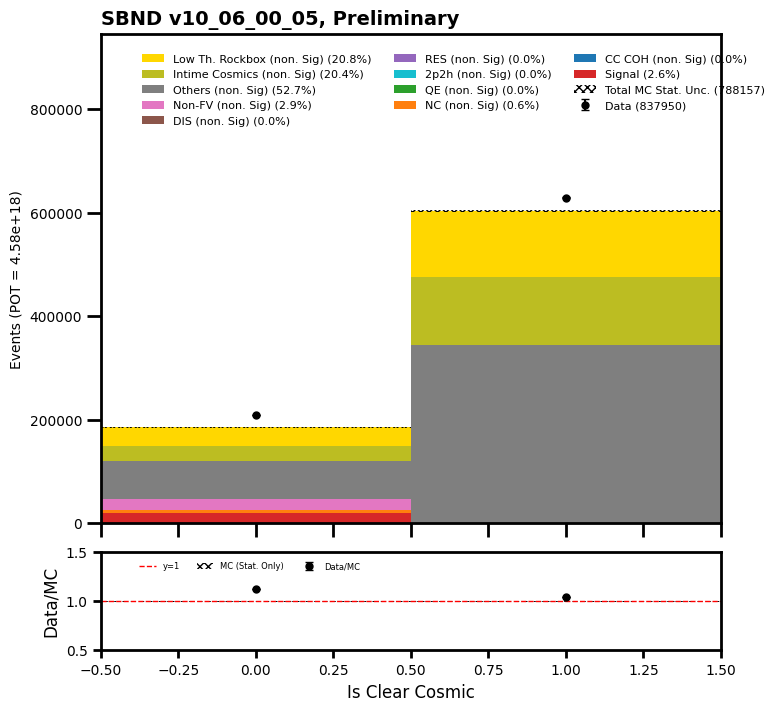

/tmp/ipykernel_1563/2477963852.py:130: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_1563/2477963852.py:131: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc


total data =  181467
[     0      0      0      0      0      0      0      0      0      0
      0      0      0      0      0      0      0      0      0      0
      0      0      0      0      0      0      0      0      0      0
      0      0      0      0      0      0      0      0      0      0
      0      0      0      0      0      0      0      0      0      0
 120108   9715   5059   4647   4980   5598   6233   6141   5477   4513
   3319   2188   1423    827    501    304    190     89     67     44
     18      9      8      3      3      0      1      0      2      0
      0      0      0      0      0      0      0      0      0      0
      0      0      0      0      0      0      0      0      0      0]
[    0.          0.          0.          0.          0.          0.
     0.          0.          0.          0.          0.          0.
     0.          0.          0.          0.          0.          0.
     0.          0.          0.          0.          0.         

/tmp/ipykernel_1563/2477963852.py:185: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_1563/2477963852.py:189: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_1563/2477963852.py:190: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc


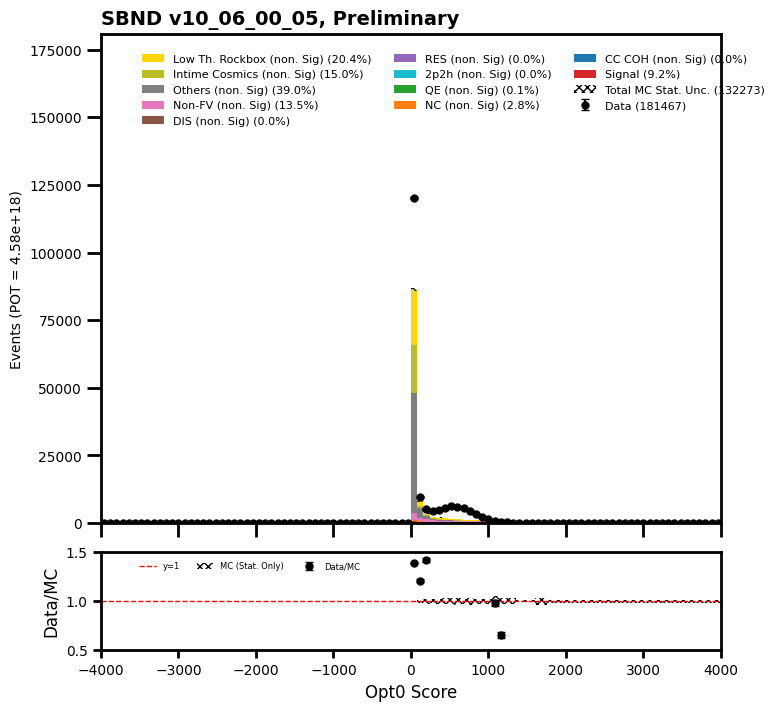

/tmp/ipykernel_1563/2477963852.py:130: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_1563/2477963852.py:131: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc
/tmp/ipykernel_1563/2477963852.py:185: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_1563/2477963852.py:189: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_1563/2477963852.py:190: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc


total data =  837950
[     0      0 628973      0      0      0      0      0      0      0
      0      0      0      0      0      0      0      0      0      0
      0      0      0      0      0      5    380   5017  20604  43359
  49919  36118  21844  14428  10025   6007   1247     24      0      0
      0      0      0      0]
[0.0000000e+00 0.0000000e+00 6.0278881e+05 0.0000000e+00 0.0000000e+00
 0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00
 0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00
 0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00
 0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00
 1.0625000e+01 6.9561792e+02 7.5139810e+03 2.4424008e+04 3.8751703e+04
 4.1079352e+04 2.7921943e+04 1.7321914e+04 1.1920109e+04 8.6220967e+03
 5.6920513e+03 1.3962841e+03 3.9406731e+01 8.6425781e-02 0.0000000e+00
 0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00]
data ratio  [       nan        nan 1.04

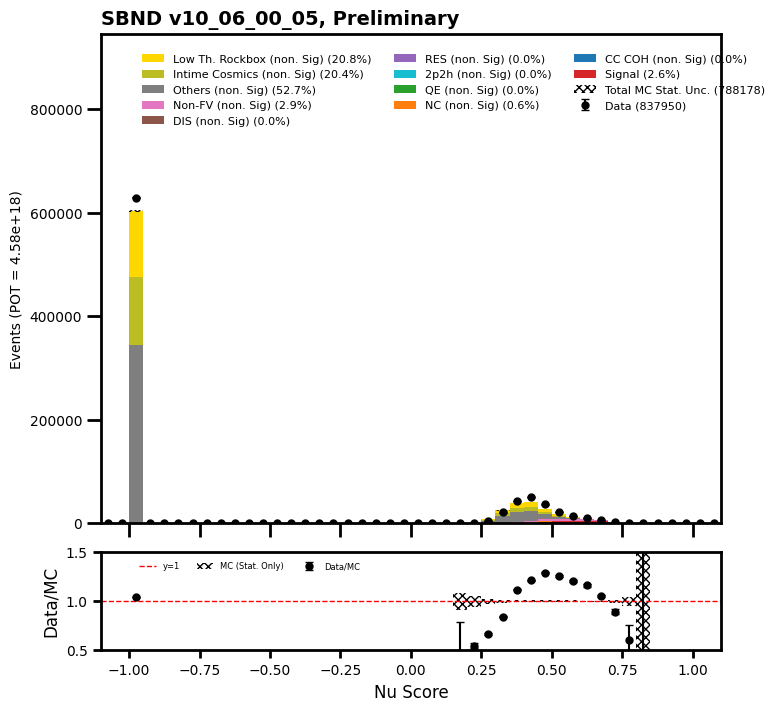

/tmp/ipykernel_1563/2477963852.py:130: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_1563/2477963852.py:131: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc
/tmp/ipykernel_1563/2477963852.py:185: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_1563/2477963852.py:189: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_1563/2477963852.py:190: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc


total data =  837950
[    0     0     0     0     0     0     0     0     0     0   428 24698
  4480  4809  5048  4726 12533  7093  7039  7194  7267  7393  7387  7653
  7659  7779  7855  7903  8059  8263  8298  8272  8439  8624  8747  8906
  9166  9153  9310  9386  9665  9924 10225 10163 55759 15742 16706 17050
 16822 14847 14183 16247 16524 16212 15570 56872 10059 10073  9829  9763
  9459  9369  9221  9102  9044  8592  8645  8422  8378  8412  8121  8064
  7984  7785  7828  7643  7672  7146  7027  7117  6974  7015  6792 11820
  4923  5228  5026  4517 24280   542     0     0     0     0     0     0
     0     0     0     0]
[0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00
 0.0000000e+00 8.6554505e-02 2.3823208e-01 8.6554497e-02 1.1911603e-01
 3.6790060e+02 2.2033381e+04 4.0974434e+03 4.4794131e+03 4.5740938e+03
 4.2974648e+03 1.2322294e+04 6.5338945e+03 6.7456855e+03 6.5856680e+03
 6.6382749e+03 7.3118081e+03 7.0972935e+03 7.1676758e+03 7.3901445e+03
 7.4649321e+03

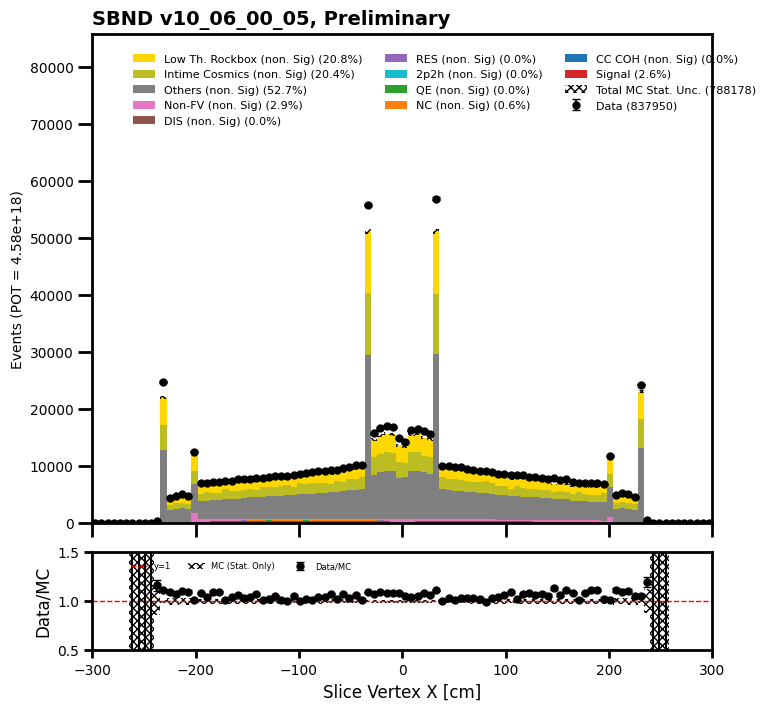

total data =  837931
[     1      0      0      2      0      0      0      0      1      0
      2      2      1      2      3     79  11971   4254   3747   4269
   4714   4853   5101   5169   5563   5663   5859   5907   6206   6271
   6162   6438   6313   6491   6665   6650   6618   6823   7038   6955
   7181   7354   6863   7162   7153   7825   7020   7316   7315   9126
   7714   7249   8183   7646   7787   7794   8210   8027   7932   8143
   8194   8344   8403   8572   8741   8873   8786   8711   9099   9441
   9345   9420   9551   9708   9846  10232  10545  10806  11051  11538
  12040  13905  21771 276196  25719    113     42     33     31     19
     11      5     15      5      7      7      3      4      3      3]
[1.19116068e-01 3.46218109e-01 3.35916579e-01 3.24786663e-01
 2.05670565e-01 4.11341190e-01 1.51677608e-01 4.11341190e-01
 5.09025812e-01 2.38232091e-01 2.92225093e-01 7.25826383e-01
 3.35916877e-01 5.95580220e-01 1.85103500e+00 2.86958160e+02
 9.53477637e+03 2.461734

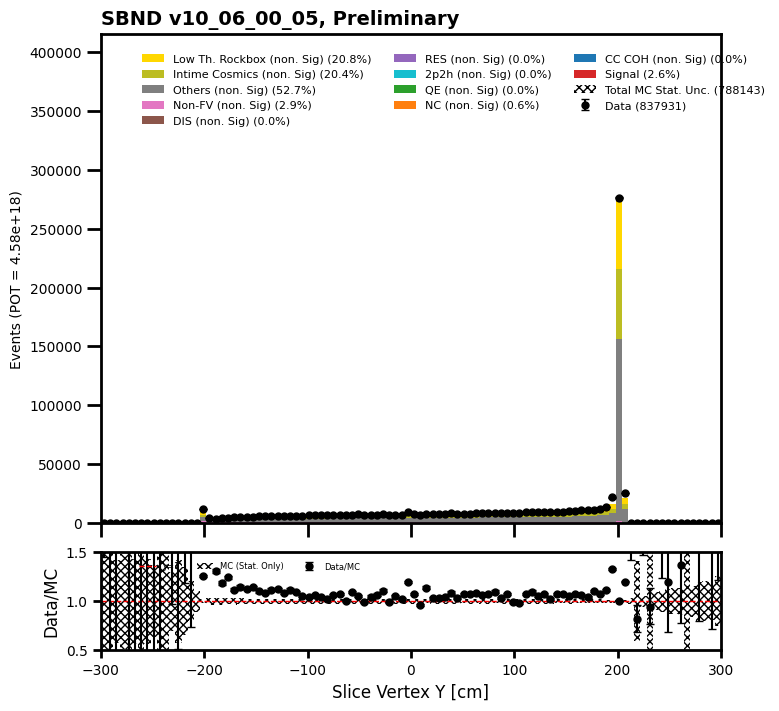

total data =  837934
[    0     0     0     1     2     0     0     3     2     2     4     4
     7    46 60881 13529  8663  9364  9350 10124 10351  9964  9736  9690
  9838 10178  9874  9897 10023 10197 10401 10049 10196 10297 10266 10092
 10415 10122 10288 10079 10372 10330 10394 10228 10365 10389 10184 10331
  9899  8541 10694 11447 10939 10921 10488 10482 10491 10347 10282 10491
 10406 10394 10484 10412 10640 10423 10477 10680 10470 10173 10595 10504
 10485 10275 10598 10565 10435 10711 10436 10530 10272 10846 10796 10743
 11113 11654 38261  2970    14     4     4     2     1     2     1     2
     2     2     2     0]
[6.1701167e-01 1.7310905e-01 5.6301892e-01 4.2247128e-01 4.8759437e-01
 4.9789545e-01 6.6070330e-01 8.5607266e-01 6.9326496e-01 1.2999754e+00
 1.4190915e+00 2.4045799e+00 3.7482462e+00 4.4371712e+01 5.9070586e+04
 9.8223281e+03 8.4632266e+03 8.8058359e+03 8.7614229e+03 9.3648262e+03
 9.3019521e+03 9.4936104e+03 9.1922871e+03 9.1655420e+03 9.0794863e+03
 9.3143760e+03

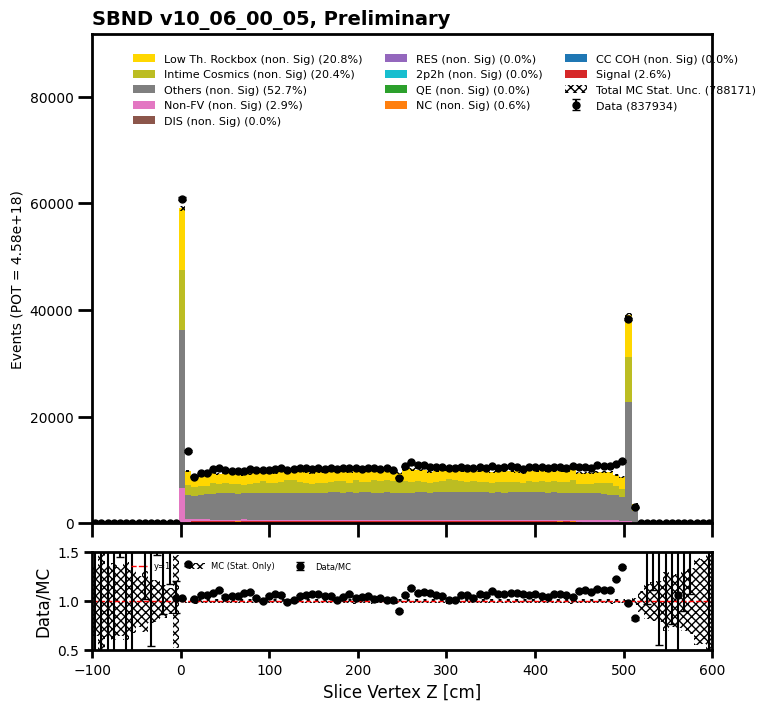

total data =  713943
[22187 35119 28709 27542 27252 26625 26204 25782 25433 24932 24162 23623
 22871 22649 21462 21051 20638 19573 19368 18303 17803 16717 15986 15439
 14549 13842 13073 12512 11757 11141 10727 10248  9636  9049  8769  8469
  7857  7598  7259  8027]
[22674.578  31448.637  23232.32   22861.773  22767.387  23347.246
 22512.55   22789.906  22600.969  22428.07   22341.066  22027.625
 21258.803  21157.242  20409.91   20249.295  18991.46   19014.062
 18038.494  17833.395  16663.66   16530.934  15825.211  14256.484
 14142.981  13440.771  13005.896  12131.325  11651.13   11013.137
 10825.521   9714.205   9380.049   8942.691   8511.467   8450.67
  7574.8335  7574.296   7443.682   7454.722 ]
data ratio  [0.97849671 1.11670977 1.23573537 1.20471844 1.19697532 1.14039146
 1.16397294 1.13129031 1.12530575 1.11164267 1.08150612 1.0724261
 1.07583669 1.07050814 1.05154799 1.03959175 1.08669892 1.02939601
 1.07370382 1.02633293 1.06837272 1.01125565 1.01016031 1.08294581
 1.02870813 1.

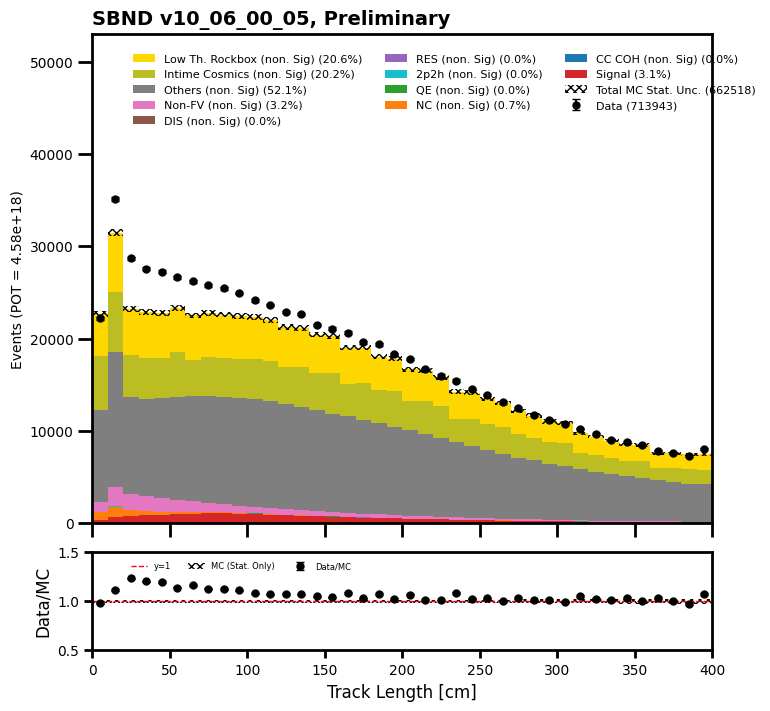

total data =  837950
[  768  1092  1506  1670  2201  2634  3062  3562  3904  4440  4789  5297
  5863  6220  6732  7152  7501  8134  8511  9007  9261  9838 10020 10418
 10795 10873 11202 11425 11613 11965 11961 12120 11936 12134 12084 12144
 12186 11849 11956 11920 11511 11515 11399 11320 10858 10562 10533 10234
 10076 10164 10107 10084 10135 10361 10543 10710 10808 10994 11195 11199
 11148 11281 11424 11561 11576 11339 11484 11426 11343 11082 10952 10810
 10608 10548 10128  9873  9560  9215  8969  8816  8287  8064  7492  7067
  6651  6236  5714  5611  5108  4674  4251  3752  3267  2908  2460  2114
  1809  1394  1120   775]
[  479.3536    670.7433    992.0638   1360.031    1724.7168   2246.089
  2664.505    3091.5745   3819.3308   4485.6953   4746.5356   5105.6675
  5486.525    5608.2534   5973.043    6780.201    7473.9565   7494.4023
  8149.66     8154.9736   8837.719    8927.341    8992.24     9399.684
  9681.814    9850.613   10550.828   10244.671   10916.606   10805.691
 10751.168  

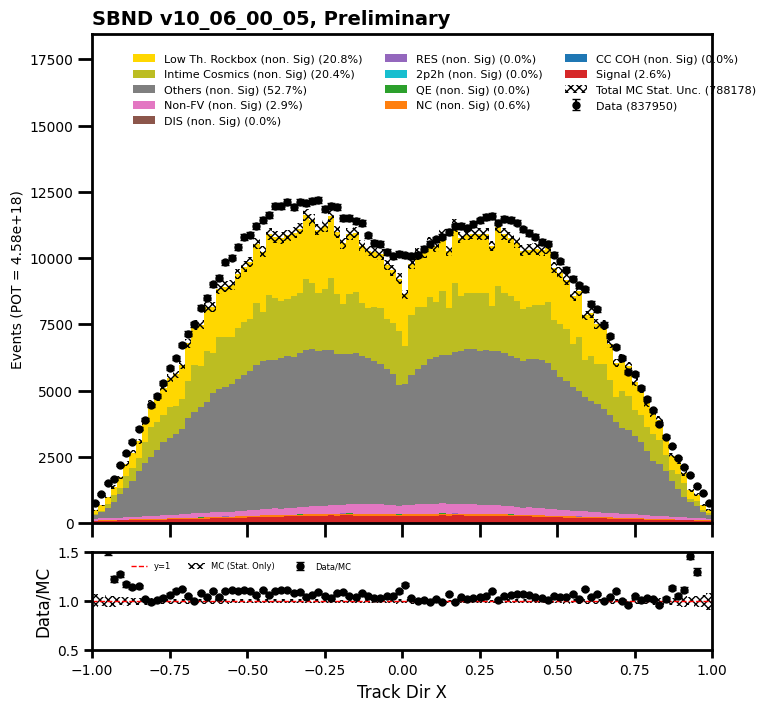

total data =  837950
[33906 36072 36995 37284 36607 35988 34783 33633 32470 31145 29183 27747
 26082 24557 23071 21884 20267 18686 17310 15684 13961 12783 11609 10730
  9983  9152  8315  7490  7085  6387  6177  5634  5170  4664  4233  3963
  3603  3020  2883  2642  2323  2138  1934  1862  1678  1504  1369  1264
  1263  1124  1100  1032  1011  1019  1051  1011  1068  1029   997  1021
  1078  1119  1171  1158  1240  1336  1389  1435  1531  1628  1682  1788
  1876  1919  2125  2347  2530  2694  2627  2627  2351  2092  2045  2109
  2307  2345  2508  2586  2794  2875  3083  3247  3338  3589  3773  3886
  4163  4304  4561  5058]
[32095.098   35303.777   35425.33    35498.5     34811.414   34007.016
 32545.334   32492.281   30860.129   29209.393   28124.766   27020.125
 25273.7     23965.174   21786.543   20949.605   19617.672   18368.123
 17185.832   14757.1     13384.385   12508.709   11073.656   10245.196
  9259.869    8666.975    8292.465    7437.1616   6868.592    6521.207
  5694.1084   

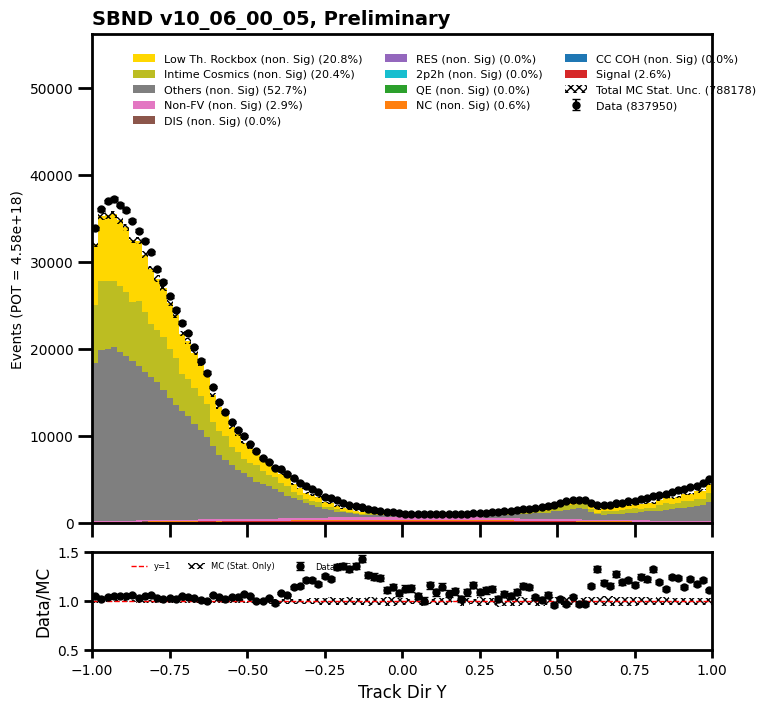

total data =  837950
[  884   857   952  1084  1279  1458  1804  2078  2187  2567  2951  3333
  3750  4160  4614  4964  5388  5765  6019  6348  6697  7201  7418  7761
  7990  8307  8469  8898  9055  9420  9573  9751 10011 10092 10021 10229
 10454 10493 10501 10424 10818 11032 10716 10749 10924 10852 10977 11427
 11659 11801 12264 12243 12268 12466 12550 12821 12709 13005 12975 13030
 12820 12794 13107 12988 12713 12823 12602 12544 12395 12209 11815 11825
 11312 11329 10957 10674 10366  9995  9684  9241  9037  8676  8144  7838
  7566  7187  6823  6691  6463  6030  5870  5562  5038  4818  4615  4501
  4312  4250  4002  3841]
[  550.0377    586.03015   773.0042    929.4009   1016.7112   1404.7778
  1604.872    1642.1036   1766.9454   2151.8247   2597.2344   3123.2534
  3810.7717   4031.3289   4581.937    5011.9014   5075.8667   5649.7
  5902.1895   5905.391    6558.843    6864.0703   7078.387    7918.5273
  7660.5156   7913.529    8116.9487   7886.3945   8626.4375   8729.032
  9013.975   

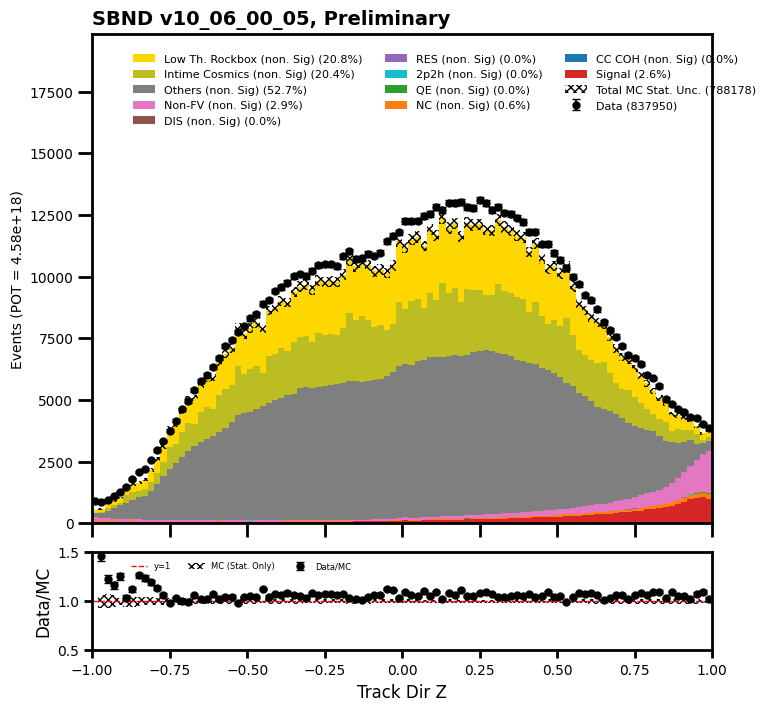

total data =  837888
[  152 12688 48144 50973 55729 56914 56180 53731 50814 47503 43950 39694
 35699 31359 28030 24669 22052 19548 17623 16091 42148 29675 18046 11913
  7967  5971  4036  2664  1709  1155   615   235   110    51    23     7
     5     3     6     6]
[1.48223907e+02 1.31938887e+04 4.36692422e+04 4.18621562e+04
 4.76202617e+04 4.96501094e+04 5.05764453e+04 5.02312617e+04
 4.77329062e+04 4.49903164e+04 4.17542344e+04 3.82377891e+04
 3.42169609e+04 3.08052422e+04 2.73556738e+04 2.46520234e+04
 2.11774238e+04 1.91959180e+04 1.72377715e+04 1.62158105e+04
 4.07958984e+04 3.03942812e+04 1.86510938e+04 1.22640684e+04
 8.67155273e+03 5.99985449e+03 4.07038330e+03 2.79905518e+03
 1.86959644e+03 1.06176318e+03 5.62446411e+02 2.49339966e+02
 1.00771126e+02 5.29147949e+01 1.53590088e+01 6.77076530e+00
 5.18811798e+00 4.62695312e+00 3.20117188e+00 3.41210938e+00]
data ratio  [1.0254756  0.96165735 1.10246933 1.21763914 1.17027916 1.1463016
 1.11079376 1.06967251 1.06454863 1.05584943 

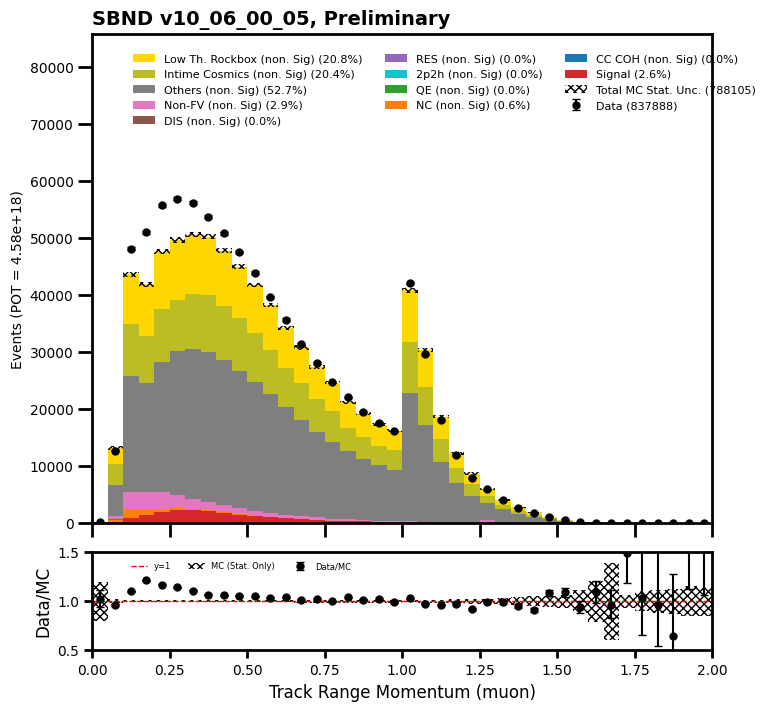

total data =  732626
[50574   442 13109 17384 19105 21086 27417 18830 28811 19669 24758 24684
 29596 24704 19717 24053 23674 27441 24780 21818 30872 19412 27089 16709
 19336 21091 12845 17646 10668 12411 13516  8303 11615  7063  8379  9105
  5592  7855  4859  6608]
[45795.477    481.2541 11131.203  12742.507  13578.075  15384.441
 19522.113  13125.318  19948.602  12839.777  15878.97   16222.847
 18869.83   15865.193  12718.239  15310.887  15210.845  18150.26
 16838.91   14948.604  20758.637  12825.344  18692.82   11821.437
 14225.035  16659.6    10632.586  15451.005   9733.08   11777.721
 13491.037   8908.5    12338.533   7848.4775  9549.883  11425.092
  7444.4316 10195.623   6975.287   9475.732 ]
data ratio  [1.10434488 0.91843375 1.17768042 1.36425275 1.40704774 1.3706055
 1.40440738 1.43463187 1.44426164 1.53188015 1.55916917 1.52155787
 1.5684296  1.55711938 1.55029321 1.57097368 1.55638956 1.51187919
 1.47159167 1.45953433 1.48718822 1.51356567 1.44916602 1.4134492
 1.35929365 1.2

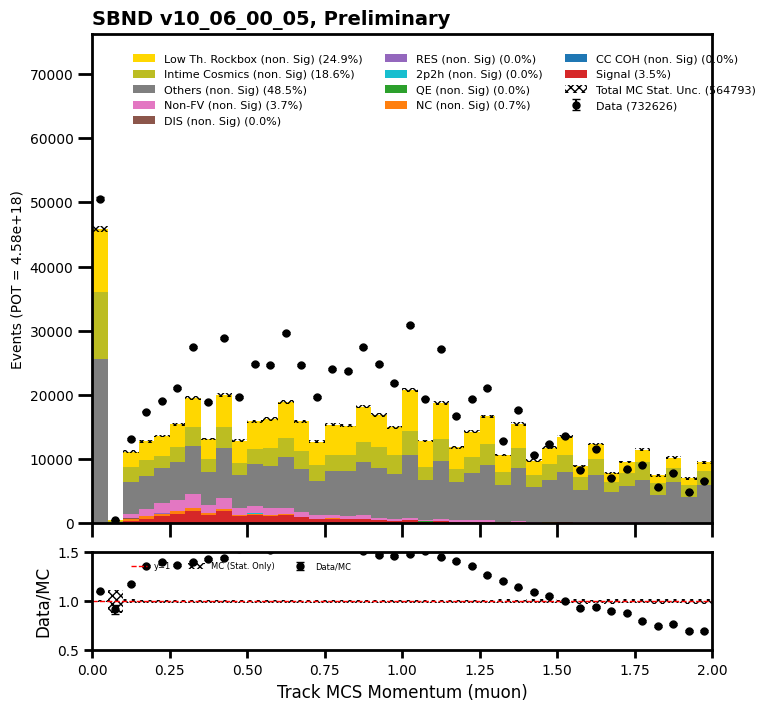

/tmp/ipykernel_1563/2477963852.py:130: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_1563/2477963852.py:131: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc


total data =  208976
[    0     0     0     0     0     0     0     0     0     1    13    22
    54    96   156   202   335   462   697   960  1561  2982  4942  6032
  6017  6038  7085  9149 10004  9833 10006  9925  9724  9785  9974 10500
 10609 11156 10646 10803  9997 10061  9264  7086  2659   140     0     0
     0     0]
[0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00
 0.0000000e+00 0.0000000e+00 3.1250000e-02 1.4905453e-01 1.1262350e+00
 2.8294981e+01 1.9823673e+01 4.9005928e+01 8.2402069e+01 1.5450189e+02
 2.4090526e+02 3.5345111e+02 4.6237973e+02 7.2587054e+02 1.0657842e+03
 1.5423418e+03 2.9351450e+03 4.6022188e+03 5.7384536e+03 5.3033506e+03
 4.8601162e+03 5.7852832e+03 7.6137393e+03 7.9968467e+03 8.6033262e+03
 8.8797734e+03 8.6973936e+03 8.5529805e+03 8.2266172e+03 8.9644707e+03
 9.1889541e+03 9.4670371e+03 9.8843604e+03 9.2035400e+03 9.3696953e+03
 9.2376660e+03 9.4036045e+03 8.4416445e+03 6.9250962e+03 2.6076138e+03
 1.7108557e+02 0.0000000e+00 0.000

/tmp/ipykernel_1563/2477963852.py:185: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_1563/2477963852.py:189: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_1563/2477963852.py:190: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc


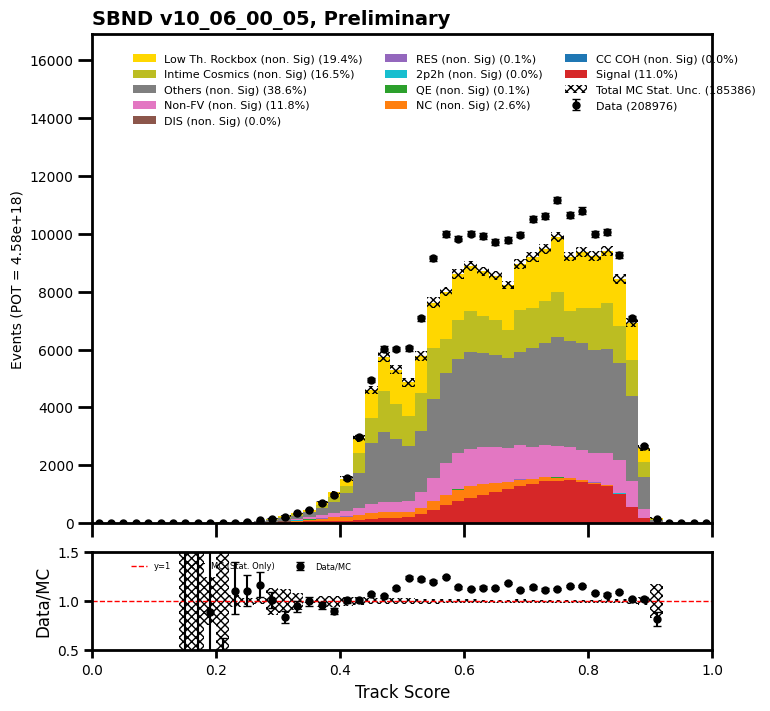

total data =  833255
[656653  44889  33905  24064  17053  12502   9316   7096   5129   3640
   2525   1945   1532   1270   1081    920    797    717    652    634
    603    538    479    474    451    419    405    386    382    333
    323    316    257    241    222    243    229    213    206    215]
[6.4095988e+05 4.3435523e+04 2.6721869e+04 1.6712555e+04 1.2175482e+04
 8.6763271e+03 6.9623477e+03 5.1223652e+03 3.8167312e+03 2.9301045e+03
 1.9199464e+03 1.6627527e+03 1.4043790e+03 1.1476545e+03 8.4526746e+02
 8.8746002e+02 7.4560828e+02 7.5188647e+02 5.2389246e+02 5.3061896e+02
 5.1056967e+02 4.2806335e+02 3.8526318e+02 3.9639929e+02 4.1937378e+02
 3.1765985e+02 4.3557745e+02 2.7514310e+02 2.8988080e+02 2.9534390e+02
 2.7697052e+02 2.4114996e+02 1.9556622e+02 2.2875504e+02 1.7833047e+02
 2.5108328e+02 2.0521085e+02 1.7332559e+02 1.9356180e+02 2.1331010e+02]
data ratio  [1.02448379 1.03346285 1.26881094 1.43987562 1.40060159 1.4409323
 1.33805441 1.38529755 1.34382007 1.24227652 1.

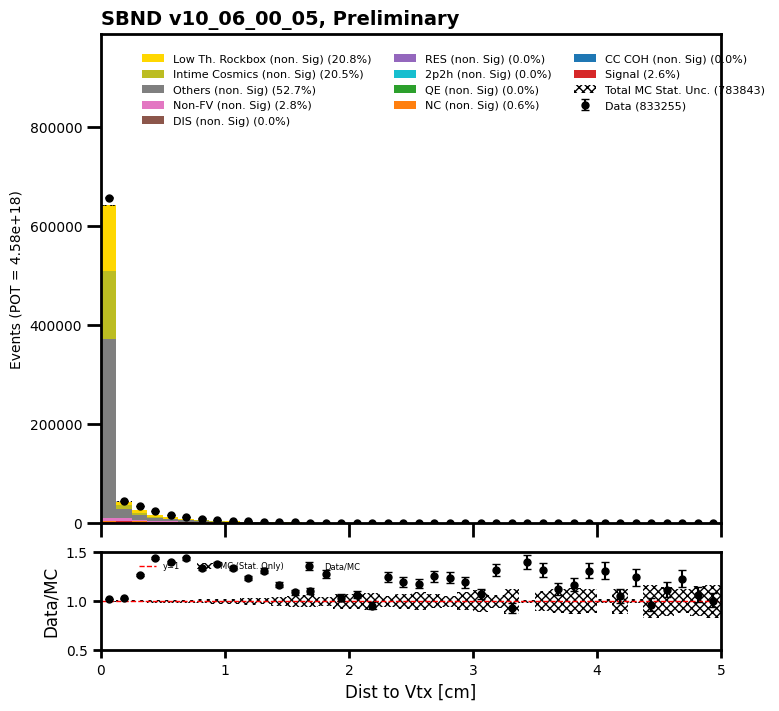

/tmp/ipykernel_1563/2477963852.py:130: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_1563/2477963852.py:131: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc
/tmp/ipykernel_1563/2477963852.py:185: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_1563/2477963852.py:189: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_1563/2477963852.py:190: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc


total data =  837950
[    0     0     0     0     0     0     0     0     0     0   429 24695
  4481  4814  5048  4725 12527  7076  7048  7205  7250  7407  7381  7655
  7652  7798  7823  7929  8061  8272  8304  8250  8443  8633  8739  8912
  9154  9135  9337  9379  9687  9894 10235 10182 55725 15764 16688 17055
 16811 14850 14212 16254 16497 16213 15592 56882 10043 10082  9815  9765
  9437  9378  9211  9125  9025  8589  8652  8429  8385  8418  8118  8047
  7984  7793  7827  7653  7658  7162  7012  7132  6983  6994  6787 11829
  4923  5224  5020  4516 24283   548     0     0     0     0     0     0
     0     0     0     0]
[0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00
 0.0000000e+00 8.6554505e-02 2.3823208e-01 8.6554497e-02 1.1911603e-01
 3.6941742e+02 2.2031695e+04 4.1183223e+03 4.4376650e+03 4.5954971e+03
 4.2963438e+03 1.2338491e+04 6.5129873e+03 6.7668613e+03 6.6106416e+03
 6.5945703e+03 7.3346631e+03 7.0738867e+03 7.1707710e+03 7.3914106e+03
 7.4848843e+03

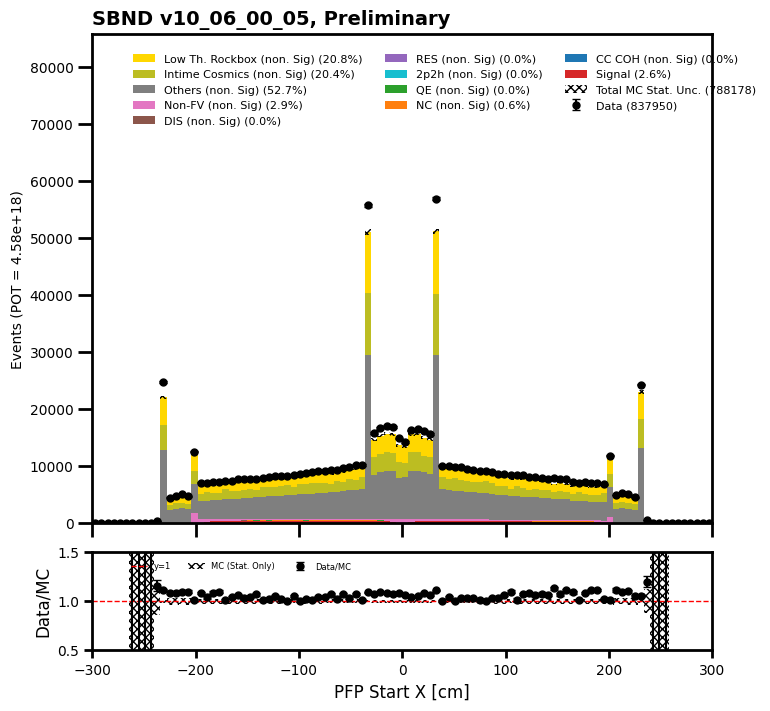

total data =  837931
[     1      0      0      2      0      0      0      0      1      0
      3      1      1      1      4     93  11985   4241   3721   4261
   4742   4837   5087   5190   5555   5683   5844   5916   6205   6248
   6168   6451   6309   6485   6671   6642   6624   6804   7062   6931
   7188   7347   6892   7147   7164   7825   7008   7333   7292   9134
   7707   7269   8175   7641   7785   7809   8225   7994   7942   8152
   8178   8340   8407   8597   8703   8889   8793   8695   9117   9411
   9361   9411   9557   9719   9859  10247  10542  10795  11055  11512
  12110  13842  21846 275947  25896    116     41     34     31     19
     11      5     15      5      7      7      3      4      3      3]
[1.1911607e-01 3.4621811e-01 3.0335504e-01 3.5734820e-01 2.0567057e-01
 5.3045726e-01 3.2561541e-02 4.1134119e-01 5.0902581e-01 2.3823209e-01
 3.2478651e-01 6.9326496e-01 3.3591688e-01 6.8213475e-01 2.2298145e+00
 2.9827664e+02 9.5491201e+03 2.4372168e+03 2.8521589e+0

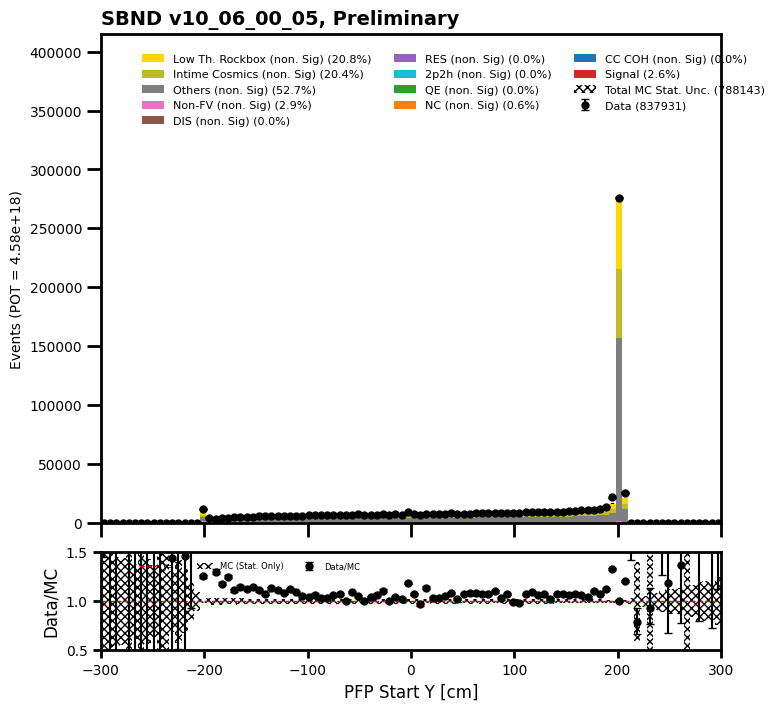

total data =  837934
[    0     0     0     1     2     0     0     3     2     2     4     4
     9    61 60597 13723  8662  9376  9388 10088 10357  9981  9796  9567
  9893 10177  9894  9890 10012 10211 10374 10059 10183 10297 10275 10109
 10397 10143 10274 10100 10348 10345 10381 10251 10360 10382 10169 10335
  9898  8543 10674 11472 10935 10902 10505 10498 10488 10308 10337 10467
 10409 10415 10459 10428 10618 10433 10496 10664 10473 10175 10584 10516
 10491 10269 10588 10567 10438 10708 10415 10552 10272 10848 10794 10760
 11076 11619 38344  2978    14     4     4     2     2     1     1     2
     2     2     2     0]
[5.84450126e-01 1.73109055e-01 5.95580459e-01 3.89909744e-01
 5.74148893e-01 4.11340952e-01 6.93264842e-01 8.23511124e-01
 6.93264961e-01 1.29997540e+00 1.50564599e+00 2.35058665e+00
 3.86736250e+00 5.32093887e+01 5.89765742e+04 9.87755469e+03
 8.47503125e+03 8.78290039e+03 8.74383594e+03 9.36472461e+03
 9.30188867e+03 9.47712793e+03 9.25020312e+03 9.08270312e+03
 9.

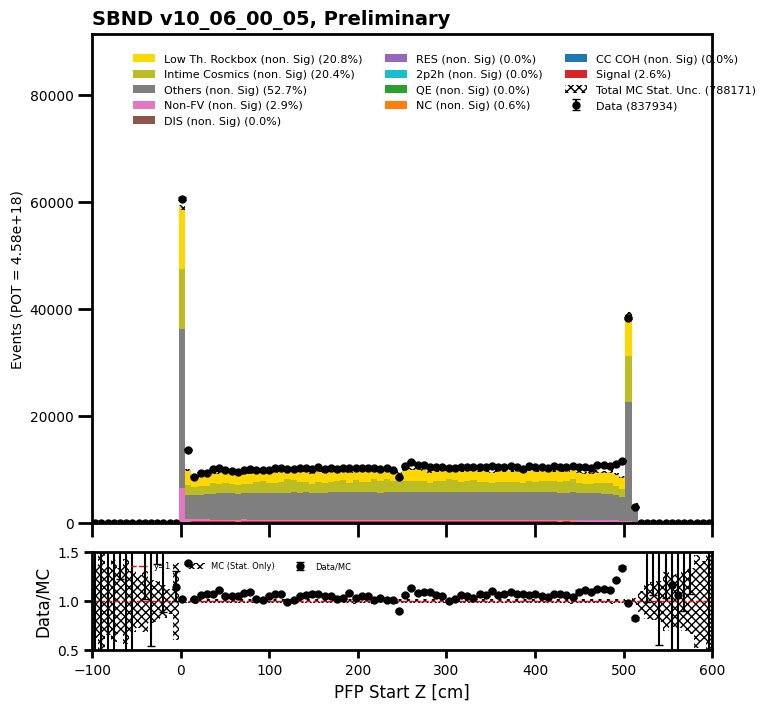

In [57]:
## Reco 1) Nocut
#fractions_clear_cosmic_nocut, fractions_nu_score_nocut, fractions_vtx_x_nocut, fractions_vtx_y_nocut, fractions_vtx_z_nocut, fractions_trk_len = draw_reco_valid_plots(mc_matchdf, data_evt_df, "nocut")
draw_reco_valid_plots(mc_bnb_cosmic_dfs["evt"], mc_rockbox_dirt_dfs["evt"], data_offbeam_light_dfs["evt"], data_bnb_light_dfs["evt"], "a_a_no_cut")

In [23]:
mc_matchdf.columns.tolist()

[('slc', 'is_clear_cosmic', '', '', '', ''),
 ('slc', 'vertex', 'x', '', '', ''),
 ('slc', 'vertex', 'y', '', '', ''),
 ('slc', 'vertex', 'z', '', '', ''),
 ('slc', 'self', '', '', '', ''),
 ('slc', 'tmatch', 'eff', '', '', ''),
 ('slc', 'tmatch', 'pur', '', '', ''),
 ('slc', 'tmatch', 'idx', '', '', ''),
 ('slc', 'producer', '', '', '', ''),
 ('slc', 'nuid', 'crlongtrkdiry', '', '', ''),
 ('slc', 'nu_score', '', '', '', ''),
 ('slc', 'barycenterFM', 'flashTime', '', '', ''),
 ('slc', 'opt0', 'score', '', '', ''),
 ('slc', 'opt0', 'time', '', '', ''),
 ('slc', 'truth', 'E', '', '', ''),
 ('slc', 'truth', 'time', '', '', ''),
 ('slc', 'truth', 'bjorkenX', '', '', ''),
 ('slc', 'truth', 'inelasticityY', '', '', ''),
 ('slc', 'truth', 'Q2', '', '', ''),
 ('slc', 'truth', 'w', '', '', ''),
 ('slc', 'truth', 'momentum', 'x', '', ''),
 ('slc', 'truth', 'momentum', 'y', '', ''),
 ('slc', 'truth', 'momentum', 'z', '', ''),
 ('slc', 'truth', 'position', 'x', '', ''),
 ('slc', 'truth', 'position

total data =  258730
[ 86377 172353]
[ 82512.37897023 159369.7105696 ]
data ratio  [1.04683686 1.08146648]


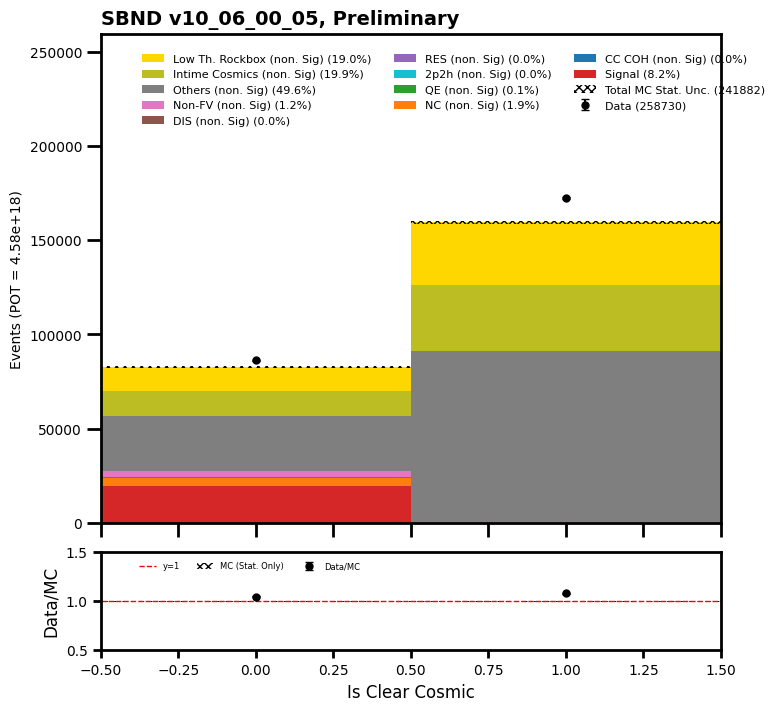

/tmp/ipykernel_1563/2477963852.py:130: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_1563/2477963852.py:131: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc
/tmp/ipykernel_1563/2477963852.py:185: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_1563/2477963852.py:189: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_1563/2477963852.py:190: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc


total data =  76300
[    0     0     0     0     0     0     0     0     0     0     0     0
     0     0     0     0     0     0     0     0     0     0     0     0
     0     0     0     0     0     0     0     0     0     0     0     0
     0     0     0     0     0     0     0     0     0     0     0     0
     0     0 44031  3931  2268  2209  2521  2938  3388  3486  3214  2734
  2023  1383   915   510   306   186   120    56    36    22    11     4
     6     0     1     0     1     0     0     0     0     0     0     0
     0     0     0     0     0     0     0     0     0     0     0     0
     0     0     0     0]
[    0.          0.          0.          0.          0.          0.
     0.          0.          0.          0.          0.          0.
     0.          0.          0.          0.          0.          0.
     0.          0.          0.          0.          0.          0.
     0.          0.          0.          0.          0.          0.
     0.          0.          0

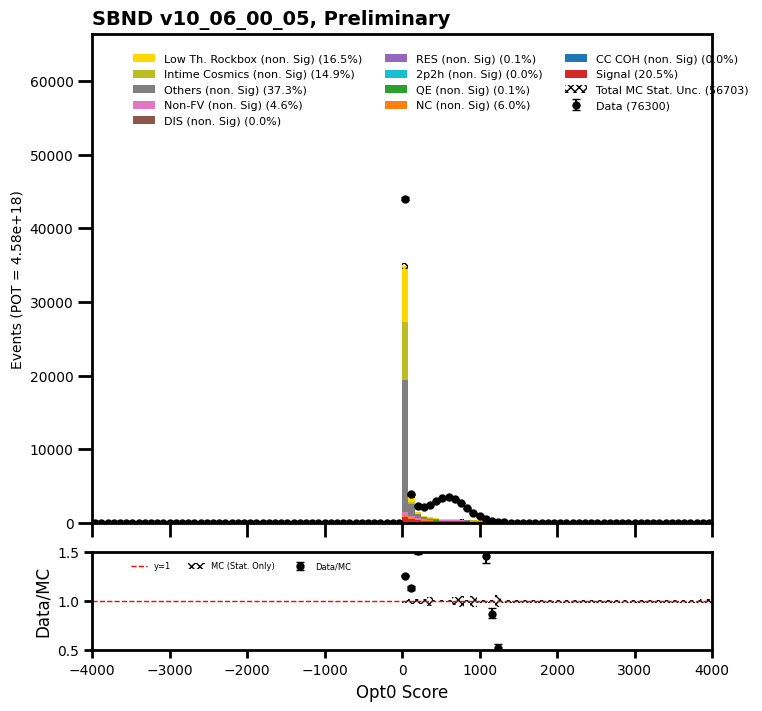

/tmp/ipykernel_1563/2477963852.py:130: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_1563/2477963852.py:131: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc
/tmp/ipykernel_1563/2477963852.py:185: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_1563/2477963852.py:189: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_1563/2477963852.py:190: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc


total data =  258730
[     0      0 172358      0      0      0      0      0      0      0
      0      0      0      0      0      0      0      0      0      0
      0      0      0      0      0      2     87   1355   5795  14969
  19762  15322  10466   7553   6045   4105    891     20      0      0
      0      0      0      0]
[0.0000000e+00 0.0000000e+00 1.5941111e+05 0.0000000e+00 0.0000000e+00
 0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00
 0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00
 0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00
 0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00
 1.3320312e+00 1.2140420e+02 1.8194935e+03 7.4478662e+03 1.5124603e+04
 1.8165621e+04 1.3496088e+04 8.5500889e+03 6.5281865e+03 5.6502266e+03
 4.4133799e+03 1.1281614e+03 2.9949944e+01 8.6425781e-02 0.0000000e+00
 0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00]
data ratio  [       nan        nan 1.08

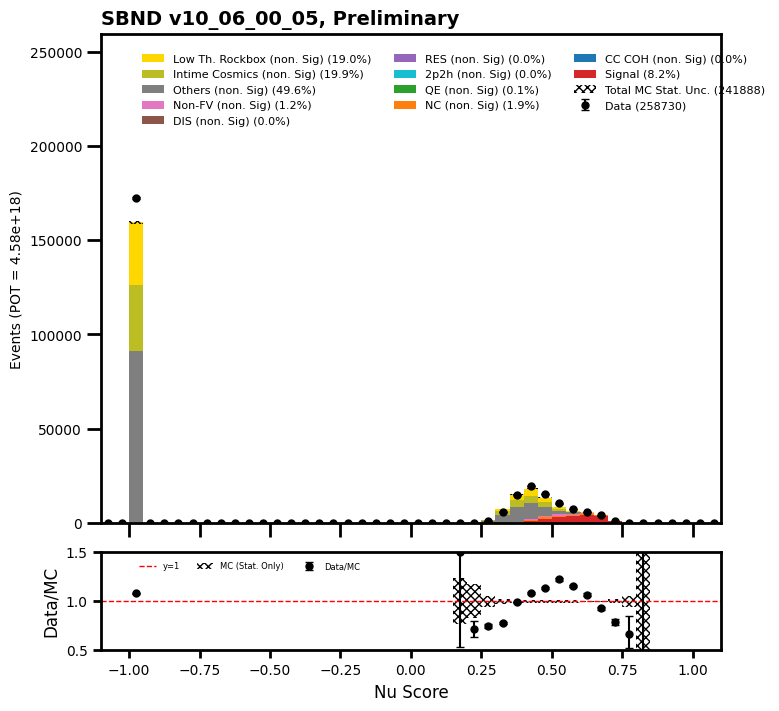

/tmp/ipykernel_1563/2477963852.py:130: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_1563/2477963852.py:131: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc
/tmp/ipykernel_1563/2477963852.py:185: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_1563/2477963852.py:189: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_1563/2477963852.py:190: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc


total data =  258730
[    0     0     0     0     0     0     0     0     0     0     0     0
     0     0     0     0     0     0  1733  2537  2700  2617  2510  2806
  2761  2829  2898  2884  2909  2888  2932  2943  3045  3130  3057  3072
  3202  3079  3154  3064  3207  3255  3319  3253 39393  4461  4696  4624
  1521     0     0  1459  4489  4540  4351 40577  3150  3133  3059  3083
  3114  3125  3068  2975  3053  2897  3005  2883  2864  2903  2859  2833
  2812  2768  2762  2726  2660  2376  2404  2366  2404  1553     0     0
     0     0     0     0     0     0     0     0     0     0     0     0
     0     0     0     0]
[    0.         0.         0.         0.         0.         0.
     0.         0.         0.         0.         0.         0.
     0.         0.         0.         0.         0.         0.
  1612.61    2279.3762  2283.397   2534.77    2515.495   2636.3782
  2918.9802  2766.3145  2691.4272  2956.2676  2984.2488  2688.5312
  2885.803   2799.7642  2873.1848  2795.1226  

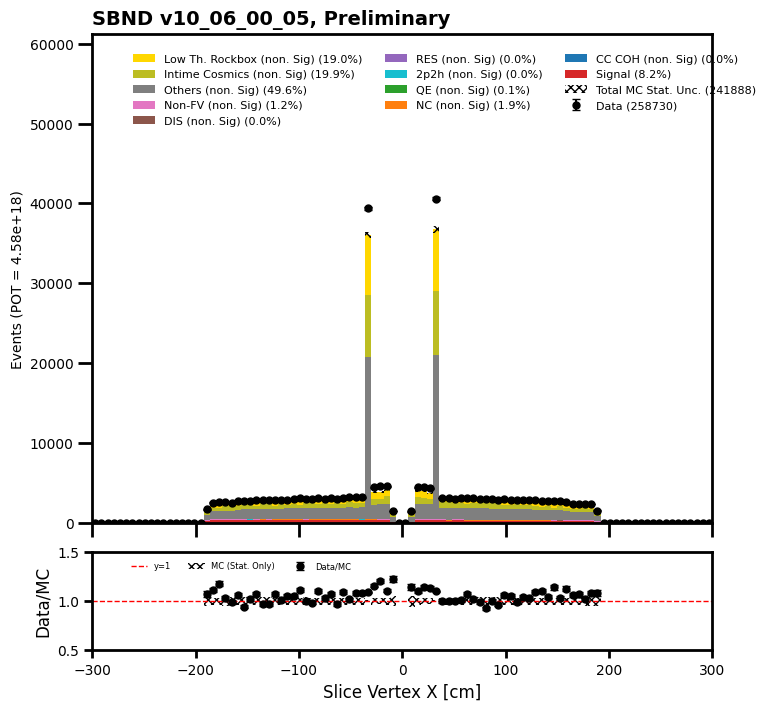

/tmp/ipykernel_1563/2477963852.py:130: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_1563/2477963852.py:131: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc
/tmp/ipykernel_1563/2477963852.py:185: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_1563/2477963852.py:189: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_1563/2477963852.py:190: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc


total data =  258730
[   0    0    0    0    0    0    0    0    0    0    0    0    0    0
    0    0    0    0 1432 2187 2369 2398 2485 2545 2662 2753 2801 3005
 3075 3129 3037 3212 3169 3252 3342 3326 3362 3477 3566 3497 3578 3598
 3641 3732 3770 3754 3835 3933 4100 3956 3871 4165 4185 4159 4167 4092
 4203 4345 4203 4321 4406 4407 4431 4625 4735 4775 4712 4808 4965 5255
 5075 5076 5230 5262 5418 5574 5788 5969 6076 6386 6911 5157    0    0
    0    0    0    0    0    0    0    0    0    0    0    0    0    0
    0    0]
[   0.        0.        0.        0.        0.        0.        0.
    0.        0.        0.        0.        0.        0.        0.
    0.        0.        0.        0.     1063.3542 1839.45   1935.2554
 2106.1077 2317.0518 2219.8245 2260.4956 2499.3984 2610.2146 2571.8452
 2741.4873 2719.062  2668.0947 2807.7744 2927.2964 3043.3894 3176.1882
 3076.6792 3067.2168 3294.0786 3267.956  3599.7612 3299.4834 3582.4841
 3781.4102 3580.376  3481.5505 3566.896  3688.5483 3

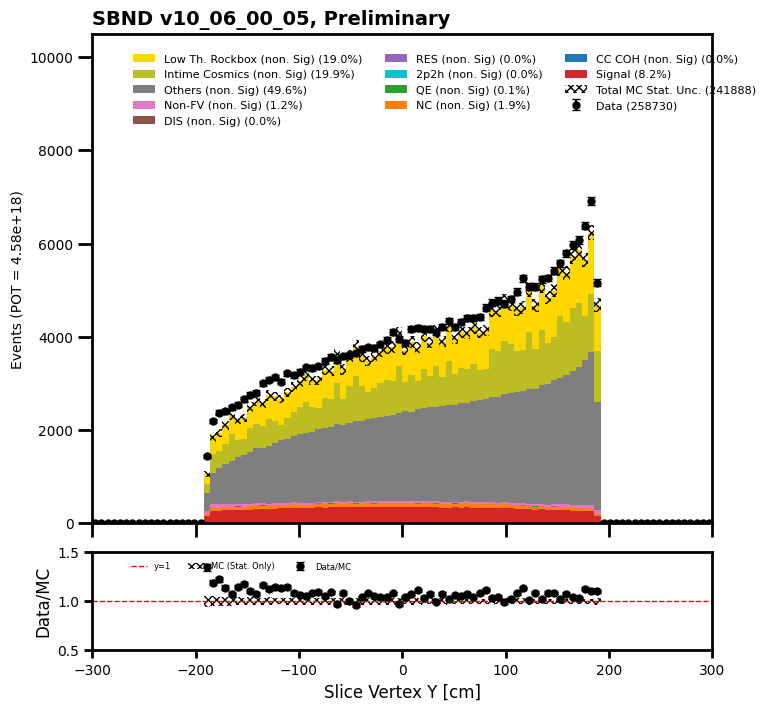

/tmp/ipykernel_1563/2477963852.py:130: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_1563/2477963852.py:131: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc
/tmp/ipykernel_1563/2477963852.py:185: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_1563/2477963852.py:189: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_1563/2477963852.py:190: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc


total data =  258730
[   0    0    0    0    0    0    0    0    0    0    0    0    0    0
    0 1306 4115 3942 3917 3994 4127 4035 3838 3737 4115 3997 3965 4018
 4005 4062 4201 3974 4035 4140 4088 4010 4023 3995 4114 3930 4101 4120
 4050 4115 4020 4117 4157 4137 4283 4228 4387 4146 4174 4111 4203 4169
 4114 4118 4087 4225 4135 4058 4185 4234 4173 4207 4232 4277 4291 4060
 4314 4217 4157 4193 4226 4287 4224 4200 2315    0    0    0    0    0
    0    0    0    0    0    0    0    0    0    0    0    0    0    0
    0    0]
[   0.        0.        0.        0.        0.        0.        0.
    0.        0.        0.        0.        0.        0.        0.
    0.     1146.8457 3492.0315 3609.1226 3657.082  3880.942  3619.3918
 3748.7922 3480.8245 3483.1147 3783.716  3591.5806 3867.7866 4020.2502
 3732.4893 3651.2664 3810.6826 4214.9404 4037.6821 3813.3264 3606.191
 3748.5715 3911.5767 3884.8342 3795.7302 3991.5845 3823.763  3585.0232
 3829.4792 3953.468  3981.3516 3946.4004 3764.7654 40

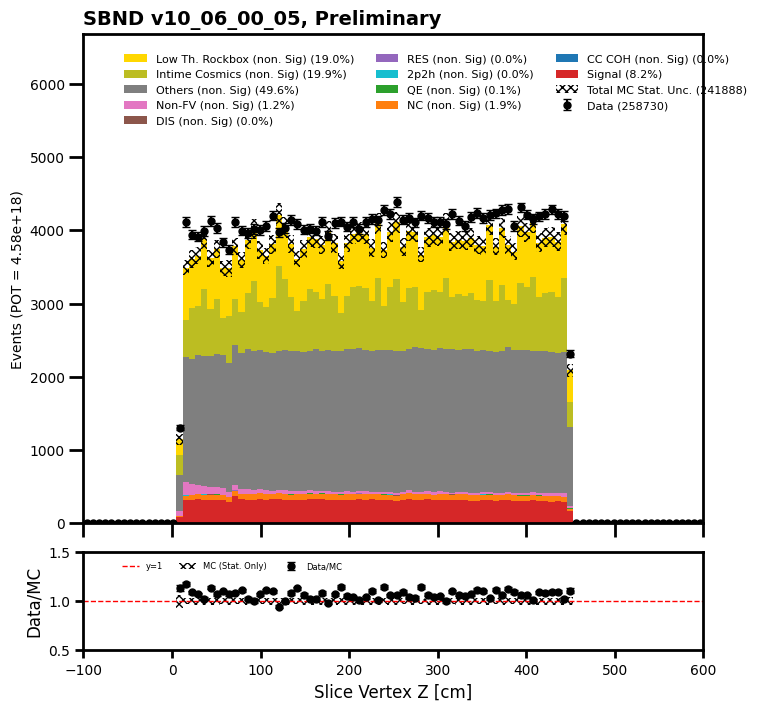

total data =  251093
[10527 13148 10204  9501  8952  8750  8957  9075  9145  9104  8889  8964
  8547  8506  8141  7927  7828  7501  7356  6945  6527  6194  5821  5481
  5174  4782  4442  4122  3690  3524  3324  2964  2696  2557  2361  2232
  2052  1859  1777  1547]
[11158.973  12423.057   8742.359   8073.8906  7806.8013  7966.743
  7720.45    8160.129   8185.217   8160.0596  8341.242   8196.75
  7784.341   8091.085   7529.206   7712.6055  7253.8223  7185.4688
  6621.929   6546.8867  6289.5005  6111.128   5754.9204  5132.286
  4968.069   4594.285   4353.241   3902.5137  3592.369   3394.6719
  3239.9678  2757.6516  2522.9106  2393.9248  2246.5764  2137.6594
  1814.      1821.297   1711.3064  1755.5493]
data ratio  [0.94336641 1.05835467 1.16719064 1.17675609 1.14669244 1.09831581
 1.16016551 1.11211478 1.11725813 1.11567813 1.06566861 1.09360417
 1.09797351 1.05128052 1.0812561  1.02779794 1.0791552  1.04391241
 1.11085452 1.06080956 1.03776127 1.01356085 1.01148228 1.06794513
 1.0414509

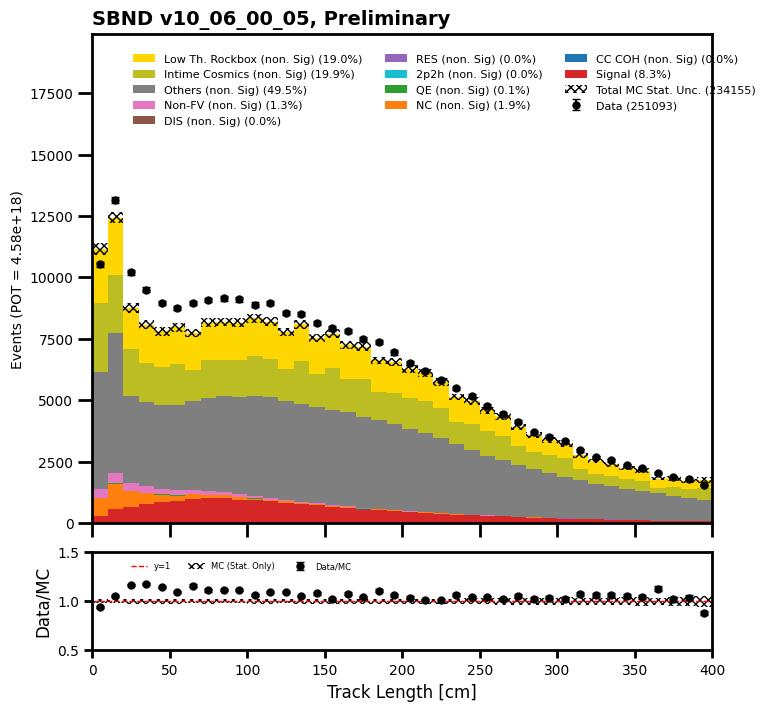

total data =  258730
[ 413  570  798  861 1117 1303 1512 1702 1875 2057 2116 2262 2587 2653
 2750 2931 2939 3092 3228 3458 3385 3568 3512 3693 3635 3645 3772 3767
 3719 3651 3579 3585 3412 3282 3315 3170 3100 2916 2792 2758 2609 2509
 2363 2186 2150 1933 1949 1958 1829 1945 1938 1895 1900 1965 2026 2195
 2267 2321 2506 2560 2688 2715 2938 3128 3219 3231 3408 3485 3583 3584
 3560 3635 3565 3736 3688 3646 3591 3559 3480 3443 3328 3249 2992 2958
 2782 2753 2498 2462 2300 2164 2058 1756 1623 1430 1274 1085  927  730
  598  397]
[ 258.42294  400.46082  525.1465   697.244    869.5814  1183.6475
 1368.7651  1558.2164  1894.3475  2072.9304  2254.6912  2330.601
 2330.5442  2447.2175  2387.4106  2947.387   3147.5142  2990.838
 3191.6726  3271.5989  3481.6191  3463.7722  3240.3628  3401.215
 3386.6113  3378.0344  3551.1501  3322.6333  3362.9387  3397.3098
 3176.05    3215.9214  3277.4211  3047.728   2993.3096  3039.9236
 2817.485   2813.7517  2700.1812  2563.7627  2472.1377  2223.9211
 2265.421  

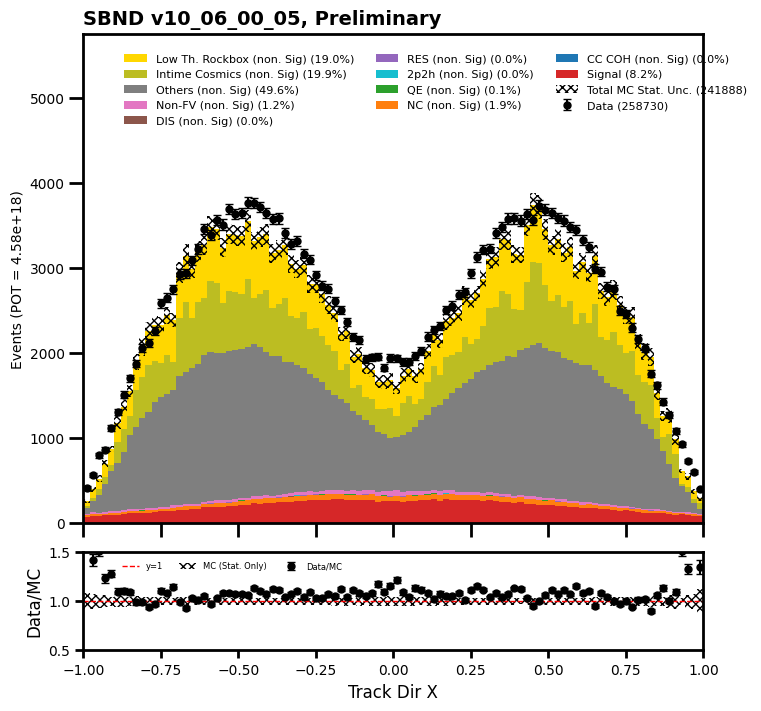

total data =  258730
[3911 5367 6461 7265 7827 8090 8361 8357 8355 8477 8011 7995 7464 7279
 7060 6748 6276 5992 5649 5393 4872 4660 4222 4071 3930 3581 3366 3021
 3003 2708 2606 2435 2228 2055 1898 1742 1593 1380 1288 1209 1048  979
  910  843  837  726  632  620  628  572  574  504  521  503  536  505
  534  487  490  499  517  524  550  525  564  627  585  590  686  737
  697  772  788  818  930 1024 1041 1132 1022 1137 1078 1071 1001 1081
 1200 1226 1295 1331 1450 1537 1710 1722 1782 1949 2122 2176 2349 2516
 2604 3110]
[3576.1626  5056.392   5943.043   6440.4307  7350.6816  7638.3857
 7596.3486  7929.723   7938.7285  8026.9473  7429.3013  7580.204
 7183.4517  7123.998   6636.4033  6484.0127  6051.4653  5894.768
 5220.675   4947.9316  4857.8545  4652.8027  4050.2986  3817.4404
 3650.7007  3450.87    3222.891   3068.3955  2867.7847  2802.8826
 2405.0059  2288.342   1985.9861  1728.7783  1467.0482  1398.179
 1335.1368  1141.6774  1058.4354   925.0422   820.96936  743.5348
  733.8203 

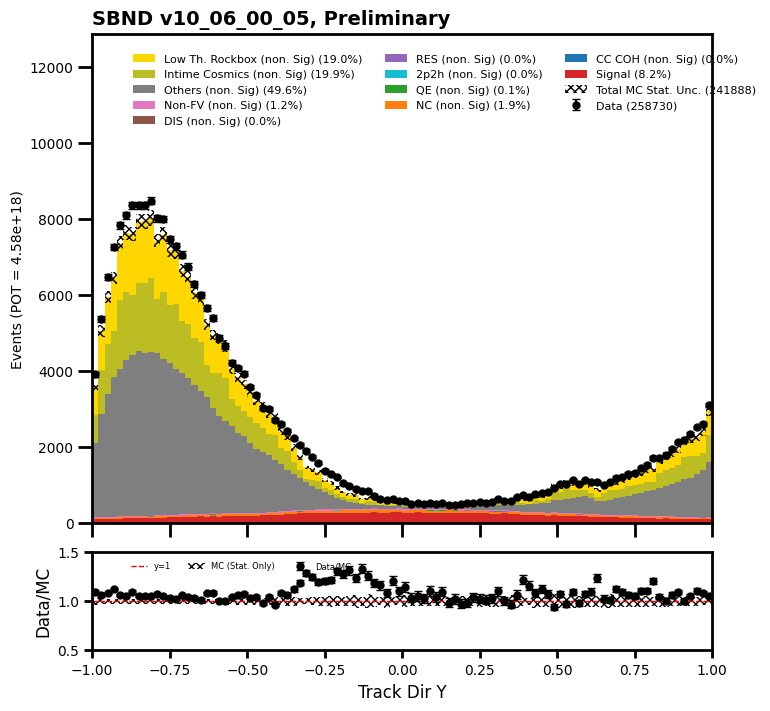

total data =  258730
[ 393  371  366  397  453  485  616  661  646  738  877  970 1060 1084
 1247 1321 1443 1584 1662 1765 1791 1934 2063 2159 2309 2341 2363 2485
 2594 2664 2820 2767 2850 2833 2810 2986 3012 3057 3065 3052 3182 3302
 3189 3302 3453 3372 3438 3782 3747 3786 3923 4024 4084 3981 4208 4109
 3888 4097 4073 4075 3922 3962 4019 4041 3929 3992 3859 3859 3890 3728
 3608 3702 3428 3435 3447 3293 3238 3080 2942 2899 2855 2650 2533 2440
 2325 2299 2121 2127 2132 1996 1970 1982 1850 1875 1748 1765 1722 1706
 1615 1637]
[ 293.50012  281.4035   344.74744  326.06116  356.1178   448.87994
  543.53894  523.4049   495.5074   564.2643   686.76324  806.27997
  914.9444   853.00806 1252.6461  1123.7954  1293.6858  1462.7527
 1482.5731  1391.0944  1608.497   1697.0519  1864.8225  2110.5095
 2026.2445  2052.4902  2056.7595  2146.8208  2402.109   2544.67
 2461.5444  2522.6772  2694.1067  2680.6785  2700.1707  2815.885
 2775.2993  2894.9663  2863.0752  2812.8218  2998.261   3263.1301
 3191.130

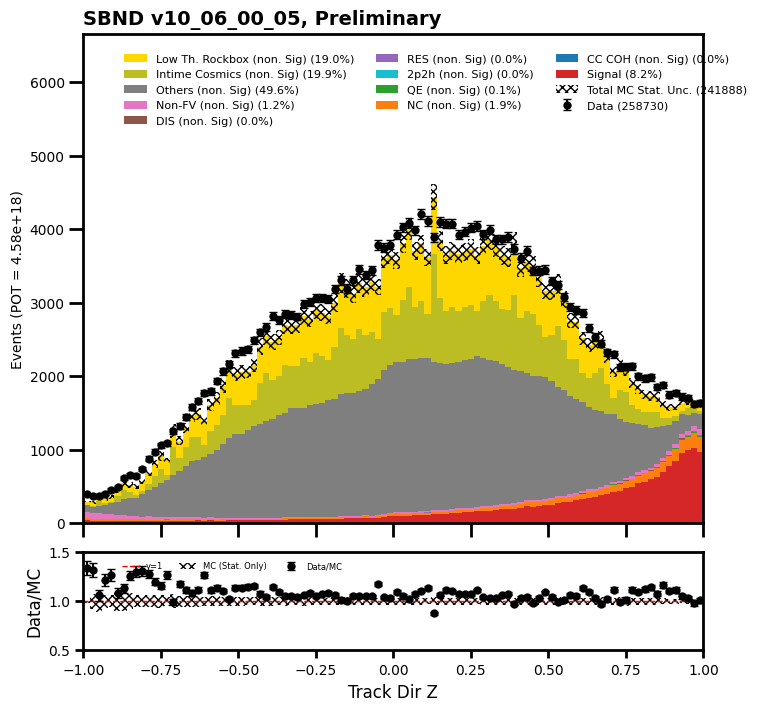

total data =  258702
[   90  6063 18876 17862 18274 19728 20543 20093 19142 18029 16714 14727
 12834 10942  9134  7747  6320  5349  4558  3723  2845  1911  1168   805
   486   306   209    98    66    24     9     7     8     3     2     0
     2     2     1     2]
[7.9505989e+01 6.5695562e+03 1.7933305e+04 1.5338166e+04 1.6306482e+04
 1.7468102e+04 1.8382205e+04 1.8661252e+04 1.8022346e+04 1.7062465e+04
 1.5464851e+04 1.4184938e+04 1.2436166e+04 1.0666879e+04 8.6412695e+03
 7.5575327e+03 5.8483457e+03 5.0452246e+03 4.2805020e+03 3.8428921e+03
 2.8219180e+03 1.9195712e+03 1.2667615e+03 8.2988898e+02 5.0462625e+02
 3.1142786e+02 1.4715482e+02 1.0401185e+02 6.7817169e+01 4.3634766e+01
 9.3234863e+00 4.8324051e+00 4.7830887e+00 2.8737793e+00 2.8995361e+00
 1.8530407e+00 1.7083817e+00 1.8457031e+00 1.2639160e+00 1.7285156e+00]
data ratio  [1.13199019 0.9228934  1.05256674 1.16454601 1.12065861 1.12937287
 1.11754819 1.07672304 1.06212589 1.05664687 1.08077346 1.03821388
 1.03199008 1.02579

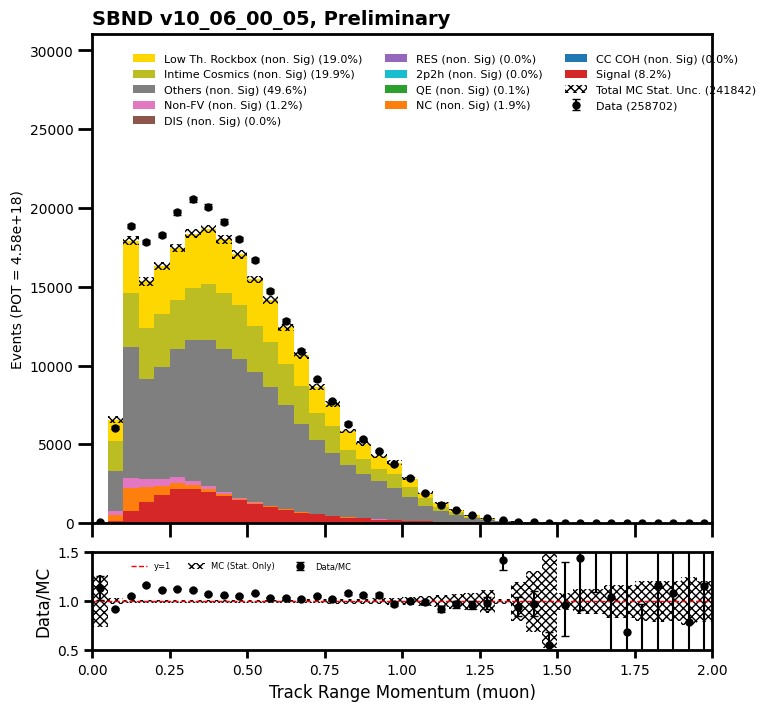

total data =  219737
[   42   236  5961  7103  7905  8877 11440  7503 11179  7496  9110  8805
 10199  8289  6589  7794  7648  8723  6735  5197  7502  4634  6532  4081
  4837  5533  3326  4710  2935  3419  4005  2417  3517  2170  2545  2790
  1751  2482  1572  2148]
[  18.759357  235.64336  5899.495    6448.559    6423.13     7494.1807
 9009.762    5822.1763   8504.975    5258.9365   6257.6084   6314.974
 7091.659    5879.6196   4372.322    5354.963    4993.201    6107.4785
 5060.121    3911.353    5381.425    3225.0244   4694.07     3173.788
 3866.0571   4443.8667   2903.448    4420.287    2683.4067   3374.3965
 3866.2092   2769.0046   3632.4558   2217.2266   2809.8574   3315.234
 2066.4265   2904.7085   1849.1261   2650.1475  ]
data ratio  [2.23888265 1.00151349 1.01042545 1.10148638 1.23070842 1.18451908
 1.26973391 1.28869338 1.31440722 1.42538324 1.45582776 1.394305
 1.43816838 1.40978508 1.50697966 1.45547227 1.53168273 1.42824899
 1.33099582 1.32869622 1.3940546  1.43688835 1.391

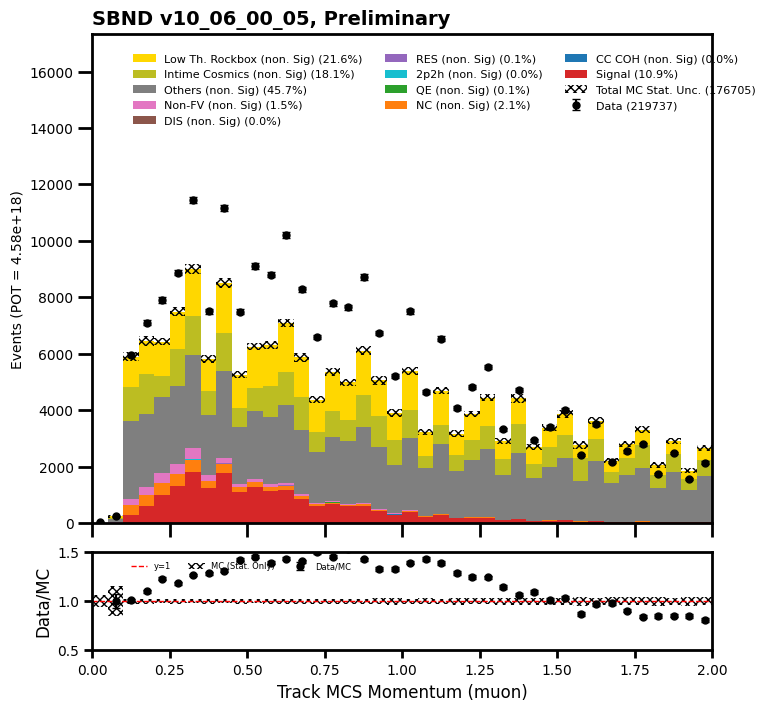

/tmp/ipykernel_1563/2477963852.py:130: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_1563/2477963852.py:131: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc
/tmp/ipykernel_1563/2477963852.py:185: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_1563/2477963852.py:189: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_1563/2477963852.py:190: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc


total data =  86372
[   0    0    0    0    0    0    0    0    0    0    3   11   22   53
   69  103  171  235  364  497  824 1621 2650 3167 2900 2628 2832 3628
 3939 3954 4034 4106 4174 4265 4286 4423 4564 4563 4303 4063 3754 3725
 3244 2430  742   25    0    0    0    0]
[0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00
 0.0000000e+00 0.0000000e+00 0.0000000e+00 8.6554527e-02 4.7389123e-01
 4.0413265e+00 1.0608630e+01 2.6202238e+01 4.2858574e+01 9.0436234e+01
 1.4895599e+02 1.9063525e+02 2.5467126e+02 3.8348993e+02 5.7389490e+02
 8.3946692e+02 1.6340403e+03 2.6911841e+03 3.2008379e+03 3.0622390e+03
 2.6589111e+03 2.7643301e+03 3.4709858e+03 3.5310083e+03 3.6500913e+03
 3.7929324e+03 3.9001604e+03 3.8355935e+03 3.7431265e+03 4.0955481e+03
 4.2544209e+03 4.2107612e+03 4.2090220e+03 4.0653599e+03 3.7581404e+03
 3.6903647e+03 3.4582529e+03 3.0958115e+03 2.4374355e+03 6.4496765e+02
 5.2932373e+01 0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00]
data ratio  [ 

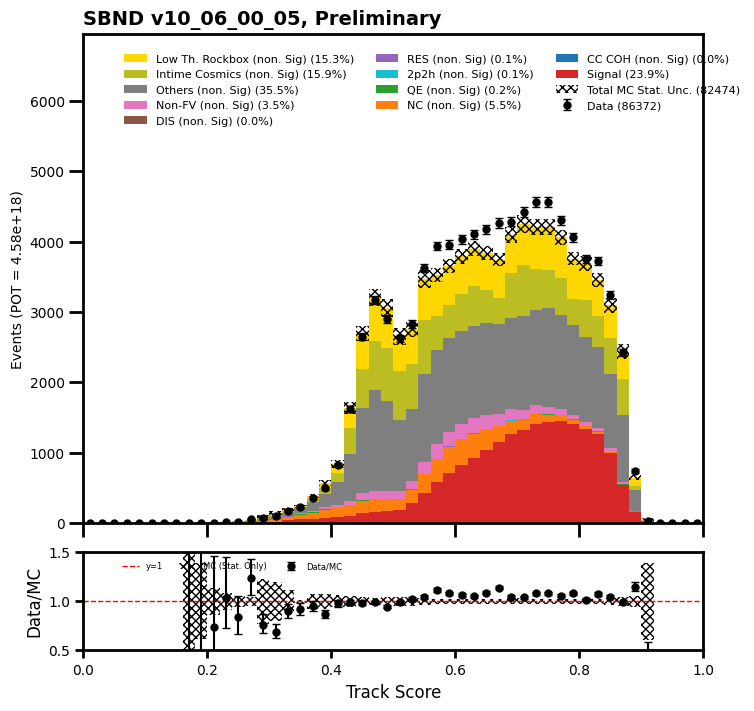

total data =  256307
[180515  15870  13310  10100   7595   5777   4422   3470   2631   1957
   1448   1114    881    741    629    516    458    422    362    361
    354    297    266    241    247    217    214    201    181    183
    183    173    127    126    112    124    131    126    112    113]
[1.70515000e+05 1.62079102e+04 1.21953008e+04 8.20448633e+03
 6.53686670e+03 4.94687207e+03 4.04912500e+03 2.99672803e+03
 2.27403223e+03 1.78909790e+03 1.24086511e+03 1.03619714e+03
 9.31114929e+02 7.86376404e+02 5.08813293e+02 5.05927002e+02
 4.75361633e+02 4.33291901e+02 3.37558502e+02 2.94372498e+02
 2.81700653e+02 2.49767456e+02 2.10468018e+02 2.41309067e+02
 2.26915421e+02 1.93459015e+02 2.30260315e+02 1.59662491e+02
 1.63253342e+02 1.91889557e+02 1.86845505e+02 1.51608704e+02
 1.07868820e+02 1.23431793e+02 9.92911606e+01 1.14997345e+02
 9.07726212e+01 8.08386612e+01 1.02796669e+02 1.20898239e+02]
data ratio  [1.05864587 0.97915153 1.091404   1.2310338  1.16187164 1.16780865
 1.0

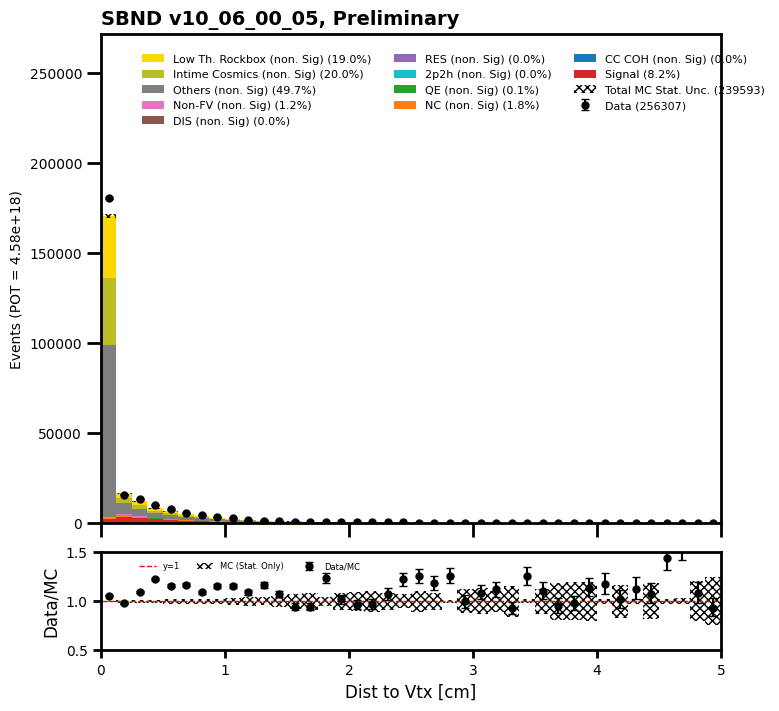

/tmp/ipykernel_1563/2477963852.py:130: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_1563/2477963852.py:131: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc
/tmp/ipykernel_1563/2477963852.py:185: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_1563/2477963852.py:189: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_1563/2477963852.py:190: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc


total data =  258730
[    0     0     0     0     0     0     0     0     0     0     0     0
     0     0     0     0     0     3  1726  2543  2689  2622  2507  2803
  2772  2841  2868  2900  2915  2895  2932  2943  3040  3136  3057  3068
  3194  3059  3173  3078  3214  3239  3315  3260 39372  4483  4687  4620
  1521     4     3  1466  4466  4543  4368 40573  3142  3147  3044  3088
  3098  3137  3057  2990  3038  2910  2992  2900  2870  2901  2857  2830
  2801  2767  2765  2742  2643  2396  2387  2377  2413  1538     2     0
     0     0     0     0     0     0     0     0     0     0     0     0
     0     0     0     0]
[0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00
 0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00
 0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00
 0.0000000e+00 3.2561529e-02 1.9264592e+00 1.6072555e+03 2.3249109e+03
 2.2405679e+03 2.5368242e+03 2.5103970e+03 2.6420273e+03 2.9192283e+03
 2.7650305e+03

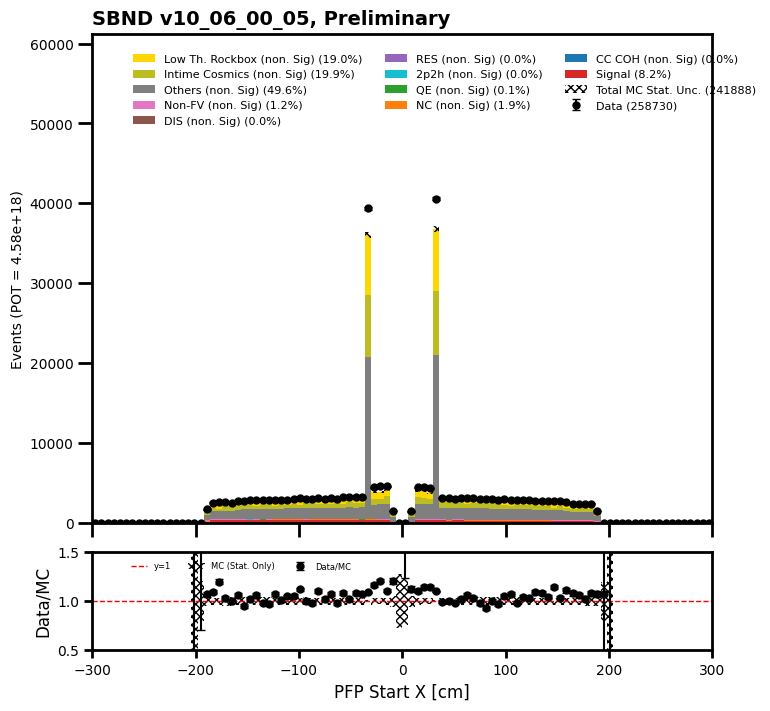

/tmp/ipykernel_1563/2477963852.py:130: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_1563/2477963852.py:131: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc
/tmp/ipykernel_1563/2477963852.py:185: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_1563/2477963852.py:189: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_1563/2477963852.py:190: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc


total data =  258730
[   0    0    0    0    0    0    0    0    0    0    0    0    0    0
    0    0    1    7 1421 2183 2386 2380 2485 2556 2650 2776 2791 3003
 3081 3105 3047 3215 3165 3258 3342 3320 3379 3459 3569 3488 3583 3596
 3647 3737 3772 3743 3835 3951 4078 3954 3876 4187 4167 4163 4162 4100
 4219 4308 4204 4330 4401 4416 4432 4650 4712 4769 4721 4789 4989 5231
 5081 5077 5223 5269 5444 5577 5786 5961 6081 6373 6933 5104   32    0
    0    0    0    0    0    0    0    0    0    0    0    0    0    0
    0    0]
[0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00
 0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00
 0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00
 0.0000000e+00 3.0335513e-01 6.1297398e+00 1.0516285e+03 1.8428263e+03
 1.9340531e+03 2.1077805e+03 2.3112012e+03 2.2224946e+03 2.2633862e+03
 2.5014556e+03 2.6286113e+03 2.5256284e+03 2.8104351e+03 2.6941685e+03
 2.6491833e+03 2.8066733e+03 2.9276636e+03 3

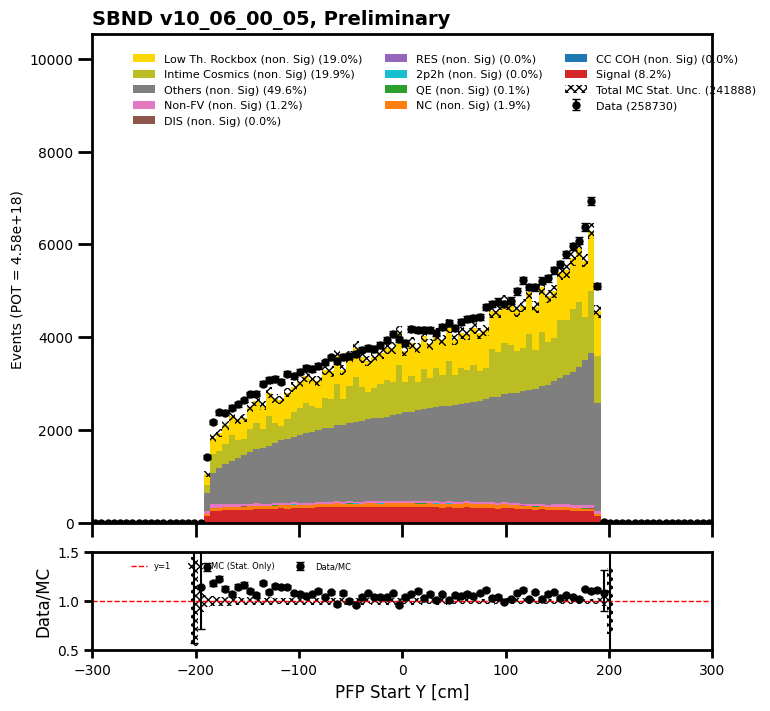

/tmp/ipykernel_1563/2477963852.py:130: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_1563/2477963852.py:131: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc
/tmp/ipykernel_1563/2477963852.py:185: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_1563/2477963852.py:189: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_1563/2477963852.py:190: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc


total data =  258730
[   0    0    0    0    0    0    0    0    0    0    0    0    0    0
   15 1263 4090 3950 3942 3956 4145 4038 3889 3654 4147 3994 3983 4016
 3992 4085 4168 3988 4013 4147 4087 4023 4015 4015 4103 3949 4085 4115
 4057 4121 4020 4108 4148 4154 4273 4236 4371 4157 4172 4101 4209 4179
 4115 4077 4132 4212 4147 4069 4161 4248 4159 4216 4232 4282 4282 4062
 4308 4219 4165 4186 4226 4290 4218 4210 2337    4    0    0    0    0
    0    0    0    0    0    0    0    0    0    0    0    0    0    0
    0    0]
[   0.           0.           0.           0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.           7.9448986
 1116.0997    3502.9375    3568.1396    3659.872     3903.1565
 3597.9263    3731.6929    3534.1929    3443.1497    3807.1152
 3597.2617    3887.309     3960.8945    3747.391     3627.7524
 3833.0537    4218.2485    4038.0168    3834.4639    3624.5874
 3729.4695    3910.5195    3888.05

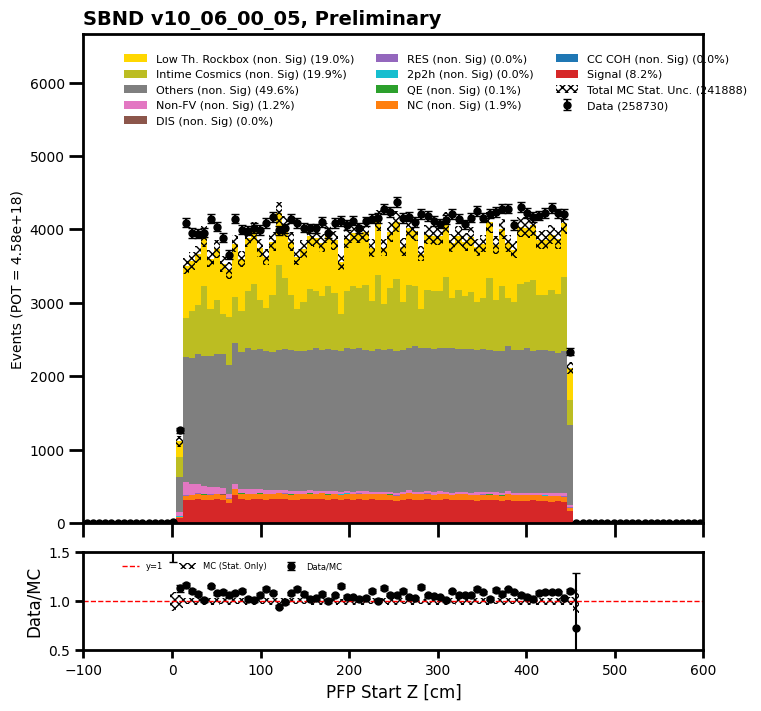

In [58]:
#make a cut so that it has to be in the FV

## Reco 2) FV cut
#define cut
#is_fv_mc = InFV(mc_matchdf.slc.vertex, 0, 0, 0, 0, "SBND")
#is_fv_data = InFV(data_evt_df.slc.vertex, 0, 0, 0, 0, "SBND")

#apply cut to df
#mc_matchdf = mc_matchdf[is_fv_mc]
#data_evt_df = data_evt_df[is_fv_data]

mc_bnb_cosmic_dfs["evt"] = mc_bnb_cosmic_dfs["evt"][InFV(mc_bnb_cosmic_dfs["evt"].slc.vertex)]
mc_rockbox_dirt_dfs["evt"] = mc_rockbox_dirt_dfs["evt"][InFV(mc_rockbox_dirt_dfs["evt"].slc.vertex)]
data_offbeam_light_dfs["evt"] = data_offbeam_light_dfs["evt"][InFV(data_offbeam_light_dfs["evt"].slc.vertex)]
data_bnb_light_dfs["evt"] = data_bnb_light_dfs["evt"][InFV(data_bnb_light_dfs["evt"].slc.vertex)]

#plot
#fractions_clear_cosmic_fvcut, fractions_nu_score_fvcut, fractions_vtx_x_fvcut, fractions_vtx_y_fvcut, fractions_vtx_z_fvcut, fractions_trk_len = draw_reco_valid_plots(mc_matchdf, data_evt_df, "fvcut")
draw_reco_valid_plots(mc_bnb_cosmic_dfs["evt"], mc_rockbox_dirt_dfs["evt"], data_offbeam_light_dfs["evt"], data_bnb_light_dfs["evt"], "a_b_vtxfvcut")

/tmp/ipykernel_1563/2477963852.py:130: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_1563/2477963852.py:131: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc
/tmp/ipykernel_1563/2477963852.py:185: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_1563/2477963852.py:189: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_1563/2477963852.py:190: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc


total data =  86377
[86377     0]
[82514.88287647     0.        ]
data ratio  [1.0468051       nan]


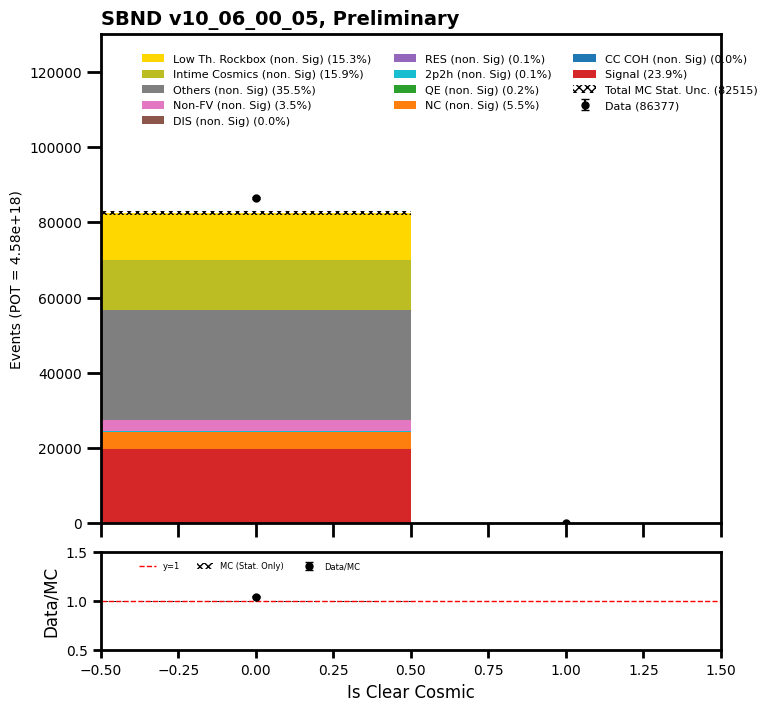

/tmp/ipykernel_1563/2477963852.py:130: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_1563/2477963852.py:131: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc
/tmp/ipykernel_1563/2477963852.py:185: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_1563/2477963852.py:189: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_1563/2477963852.py:190: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc


total data =  75934
[    0     0     0     0     0     0     0     0     0     0     0     0
     0     0     0     0     0     0     0     0     0     0     0     0
     0     0     0     0     0     0     0     0     0     0     0     0
     0     0     0     0     0     0     0     0     0     0     0     0
     0     0 43770  3897  2262  2204  2520  2925  3383  3476  3207  2724
  2017  1380   914   509   305   184   120    56    36    22    11     4
     6     0     1     0     1     0     0     0     0     0     0     0
     0     0     0     0     0     0     0     0     0     0     0     0
     0     0     0     0]
[    0.          0.          0.          0.          0.          0.
     0.          0.          0.          0.          0.          0.
     0.          0.          0.          0.          0.          0.
     0.          0.          0.          0.          0.          0.
     0.          0.          0.          0.          0.          0.
     0.          0.          0

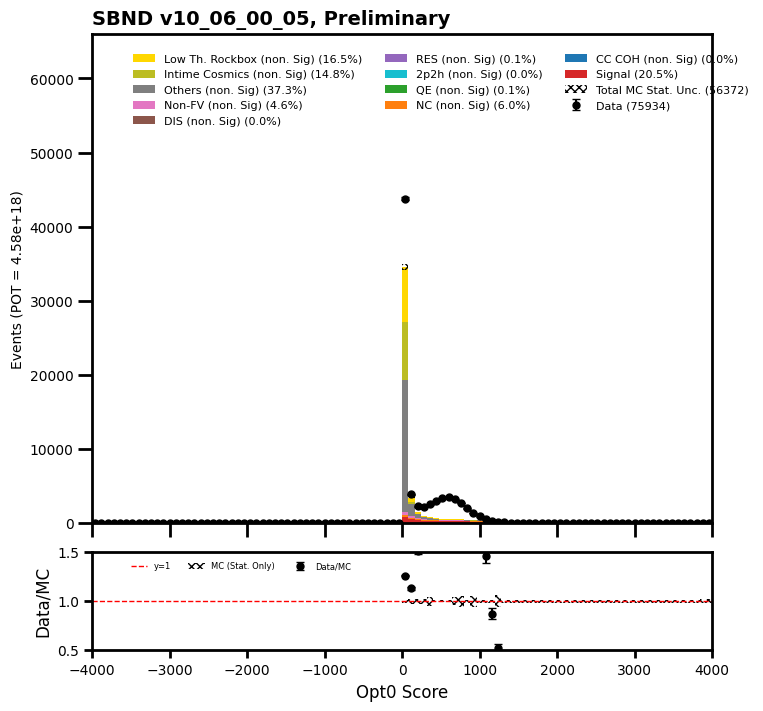

/tmp/ipykernel_1563/2477963852.py:130: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_1563/2477963852.py:131: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc
/tmp/ipykernel_1563/2477963852.py:185: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_1563/2477963852.py:189: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_1563/2477963852.py:190: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc


total data =  86377
[    0     0     5     0     0     0     0     0     0     0     0     0
     0     0     0     0     0     0     0     0     0     0     0     0
     0     2    87  1355  5795 14969 19762 15322 10466  7553  6045  4105
   891    20     0     0     0     0     0     0]
[0.00000000e+00 0.00000000e+00 3.24786574e-01 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 1.33170784e+00 1.21497696e+02 1.82071570e+03
 7.45217090e+03 1.51345762e+04 1.81851973e+04 1.34960889e+04
 8.55398145e+03 6.52905957e+03 5.65042188e+03 4.41325098e+03
 1.12809216e+03 2.99470139e+01 8.64257812e-02 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00]
data ratio  [        nan         nan 15

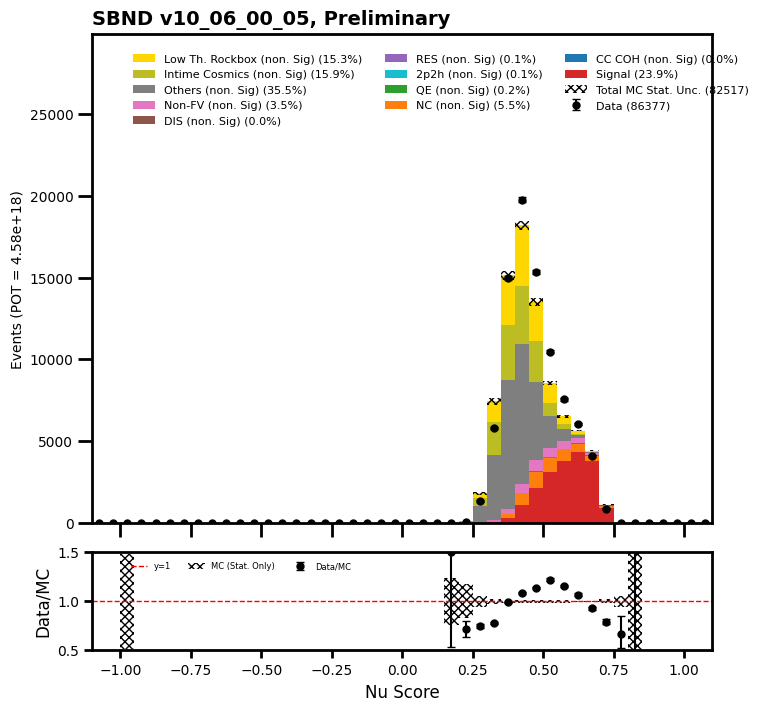

/tmp/ipykernel_1563/2477963852.py:130: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_1563/2477963852.py:131: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc
/tmp/ipykernel_1563/2477963852.py:185: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_1563/2477963852.py:189: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_1563/2477963852.py:190: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc


total data =  86377
[   0    0    0    0    0    0    0    0    0    0    0    0    0    0
    0    0    0    0 1096 1629 1680 1625 1570 1676 1551 1553 1596 1590
 1609 1502 1575 1594 1577 1607 1471 1556 1564 1501 1478 1403 1491 1492
 1396 1387 1387 1385 1351 1282  399    0    0  361 1187 1194 1244 1267
 1334 1314 1289 1305 1327 1408 1384 1360 1403 1357 1401 1389 1367 1406
 1435 1451 1403 1430 1402 1407 1430 1403 1385 1410 1417  934    0    0
    0    0    0    0    0    0    0    0    0    0    0    0    0    0
    0    0]
[   0.         0.         0.         0.         0.         0.
    0.         0.         0.         0.         0.         0.
    0.         0.         0.         0.         0.         0.
  952.6274  1464.2207  1414.5457  1544.4595  1543.9005  1381.1322
 1618.7728  1471.2806  1503.9436  1626.368   1556.4534  1532.688
 1466.5454  1476.7024  1426.5986  1447.1097  1458.4614  1510.2443
 1516.5948  1364.7916  1357.3743  1436.4171  1372.9276  1352.3906
 1270.5128  1261.2921 

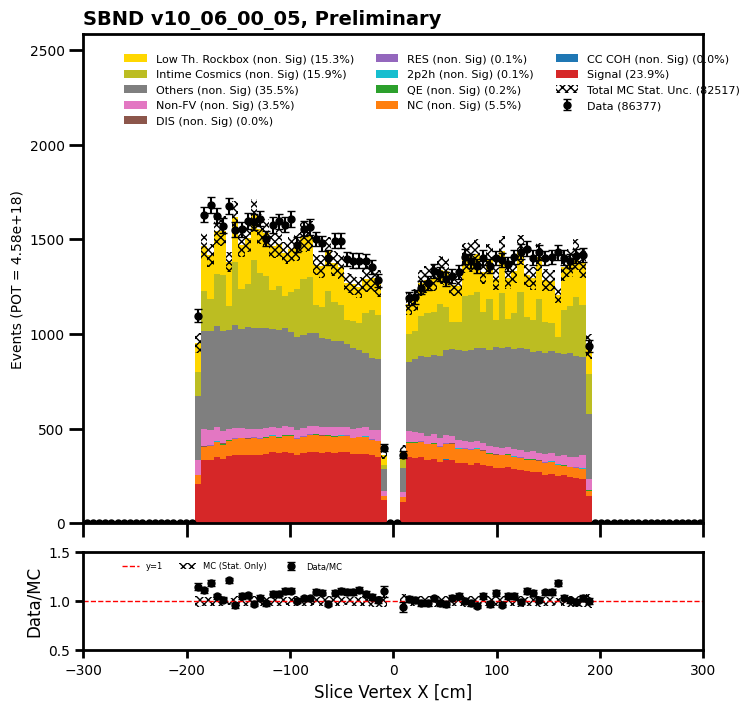

/tmp/ipykernel_1563/2477963852.py:130: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_1563/2477963852.py:131: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc
/tmp/ipykernel_1563/2477963852.py:185: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_1563/2477963852.py:189: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_1563/2477963852.py:190: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc


total data =  86377
[   0    0    0    0    0    0    0    0    0    0    0    0    0    0
    0    0    0    0  789 1116 1085 1032 1043  991 1042  962  997 1059
 1068 1038 1034 1023  992 1055 1088 1064 1062 1139 1128 1120 1103 1111
 1142 1159 1159 1105 1131 1141 1205 1194 1193 1303 1245 1211 1246 1228
 1233 1335 1262 1333 1332 1348 1383 1420 1479 1467 1447 1510 1549 1679
 1630 1626 1723 1864 1841 1946 2062 2190 2300 2636 2861 2118    0    0
    0    0    0    0    0    0    0    0    0    0    0    0    0    0
    0    0]
[   0.         0.         0.         0.         0.         0.
    0.         0.         0.         0.         0.         0.
    0.         0.         0.         0.         0.         0.
  634.88544  959.6581   947.26953  989.0737  1030.6849  1021.4718
  939.9898   955.4598  1030.0632   909.8294   875.18115  999.06213
  942.2302   939.3203   975.0242  1043.741    998.6046   930.24585
  982.74084  989.7246   980.47217 1235.9681  1101.9012  1163.2983
 1119.871   1071.52

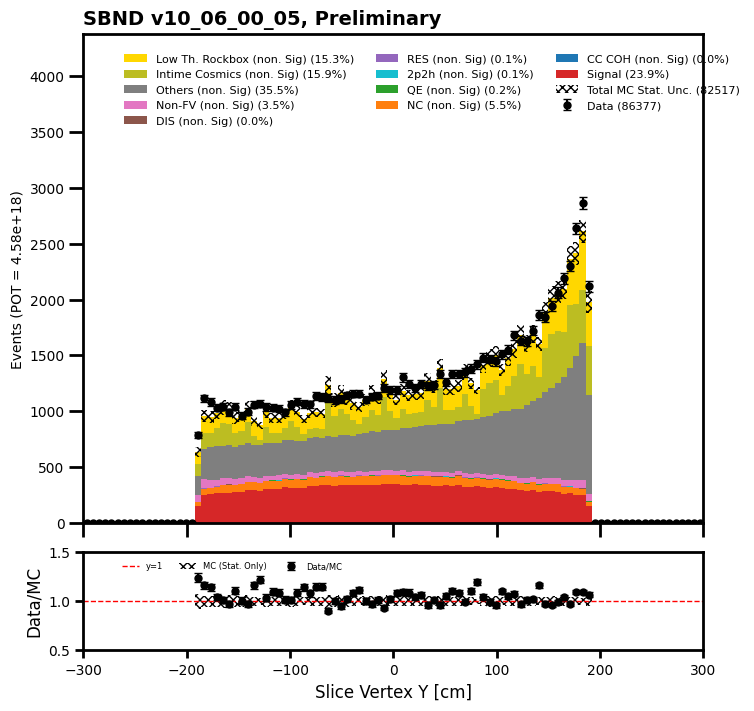

/tmp/ipykernel_1563/2477963852.py:130: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_1563/2477963852.py:131: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc
/tmp/ipykernel_1563/2477963852.py:185: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_1563/2477963852.py:189: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_1563/2477963852.py:190: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc


total data =  86377
[   0    0    0    0    0    0    0    0    0    0    0    0    0    0
    0  658 1842 1560 1544 1493 1516 1423 1285 1181 1465 1356 1333 1341
 1333 1320 1351 1333 1290 1338 1341 1256 1254 1248 1334 1271 1324 1319
 1261 1340 1291 1300 1295 1342 1379 1320 1441 1416 1348 1308 1377 1375
 1291 1332 1277 1340 1318 1310 1362 1363 1364 1347 1364 1414 1422 1407
 1475 1389 1417 1365 1481 1470 1438 1506  823    0    0    0    0    0
    0    0    0    0    0    0    0    0    0    0    0    0    0    0
    0    0]
[   0.         0.         0.         0.         0.         0.
    0.         0.         0.         0.         0.         0.
    0.         0.         0.       575.45325 1631.8711  1492.7622
 1463.2047  1441.561   1413.7815  1472.6154  1224.9026  1119.019
 1402.0374  1293.7521  1361.4828  1404.9417  1232.2073  1269.0337
 1224.5023  1367.5248  1320.4392  1216.5587  1184.8875  1297.334
 1330.9758  1317.8302  1216.5164  1341.7848  1264.2715  1175.7024
 1187.1274  1243.90

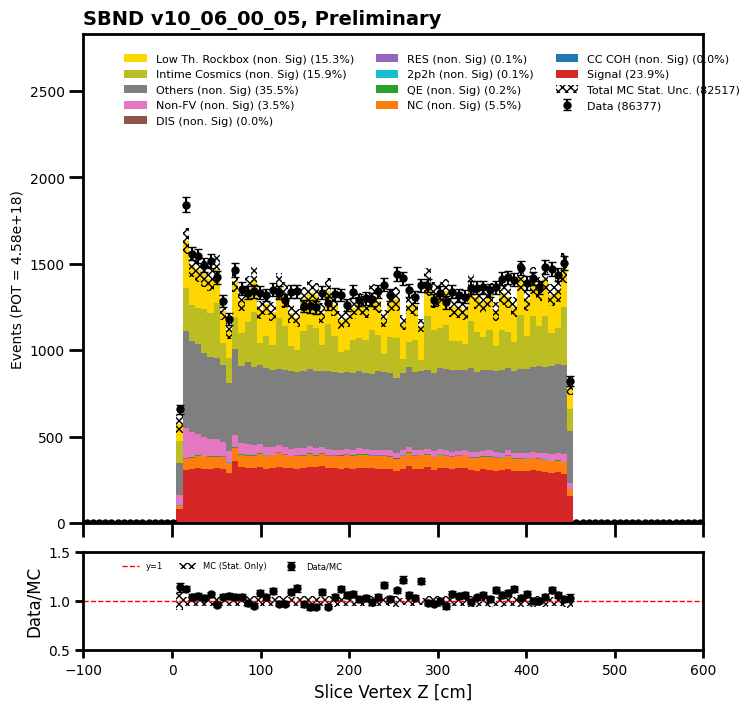

total data =  84757
[8740 8104 4853 4498 3900 3605 3519 3321 3209 3087 2780 2750 2497 2459
 2278 2151 1999 1839 1767 1593 1465 1328 1230 1179 1124 1074  968  864
  825  742  726  618  584  550  550  481  437  395  377  291]
[9576.441   8989.668   4858.951   4200.426   3797.869   3444.0417
 3209.3682  3082.539   3055.6584  2772.2192  2463.3462  2386.275
 2222.6306  2260.8914  2006.7759  1741.9119  1875.038   1569.334
 1456.853   1493.8906  1219.9053  1257.8143  1134.1691  1093.0936
 1049.2115   990.77026 1001.32275  844.07104  709.98334  726.96045
  641.5959   570.4783   505.96082  474.1244   465.40192  437.03394
  341.00565  352.37244  343.62204  353.80255]
data ratio  [0.91265634 0.90147935 0.99877521 1.07084382 1.02689169 1.04673528
 1.09647751 1.07735861 1.05018282 1.11354829 1.12854621 1.1524238
 1.12344354 1.08762413 1.13515417 1.23485008 1.06611175 1.17183469
 1.21288831 1.06634313 1.20091292 1.05579971 1.0844944  1.07859013
 1.07128062 1.08400508 0.96672127 1.02361052 1.1619991 

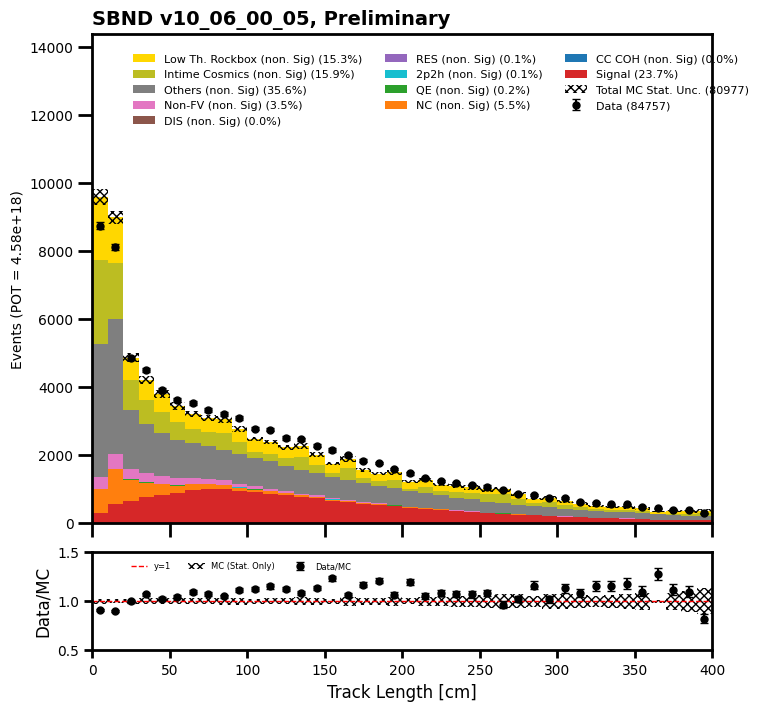

total data =  86377
[ 209  197  208  212  241  268  329  380  424  450  424  481  480  523
  550  604  560  619  636  717  681  755  733  858  826  856  927  967
 1000 1025 1072 1083 1118 1130 1147 1256 1230 1268 1261 1285 1363 1330
 1308 1292 1339 1295 1284 1426 1368 1532 1472 1408 1336 1353 1312 1367
 1365 1323 1329 1272 1276 1266 1308 1277 1259 1177 1206 1153 1162 1101
 1018 1018  983 1001  943  900  846  862  775  796  735  695  659  624
  563  574  552  514  510  504  496  391  409  358  308  270  227  206
  213  178]
[ 159.52878  215.37277  181.71153  220.50778  224.72815  302.677
  341.20822  335.71637  419.2071   388.5383   451.3116   446.53256
  481.46298  516.89734  540.4803   515.0511   581.6616   620.0978
  645.6613   728.0893   735.247    782.1105   731.6797   753.8484
  812.27734  730.05884  863.5994   895.06433  930.095    984.6886
  932.9684  1083.2042  1190.1227  1122.0642  1141.2921  1372.8076
 1115.8785  1166.9077  1227.9161  1194.0461  1308.4178  1206.0732
 1250.596

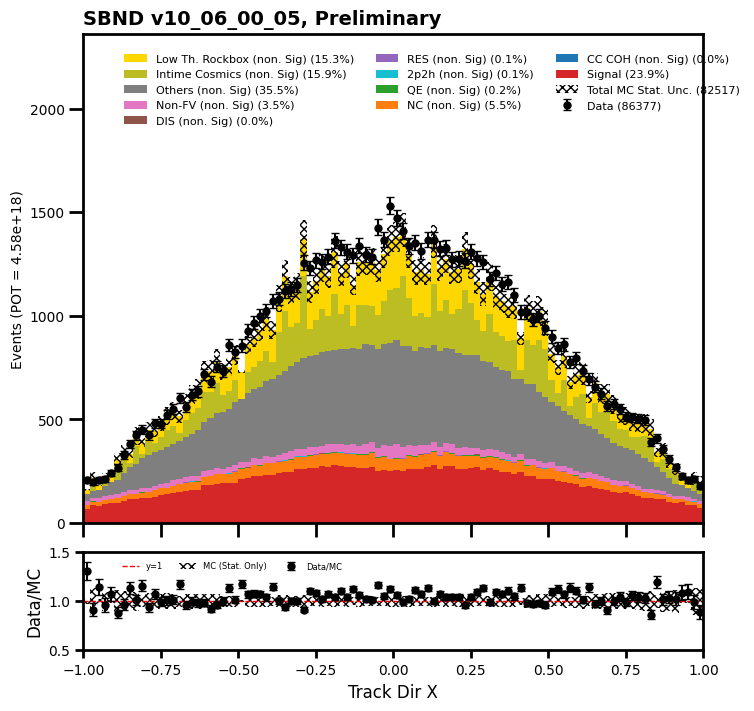

total data =  86377
[1282 1027 1047  990  946  864  927  828  789  782  773  771  657  624
  687  623  560  539  595  646  703  748  620  694  691  685  620  558
  566  525  549  537  559  510  522  511  493  462  495  516  461  453
  484  481  479  472  435  459  491  460  499  446  494  463  503  474
  513  452  470  482  499  506  534  508  552  616  573  580  680  730
  692  770  781  811  928 1023 1038 1131 1021 1135 1076 1067  998 1081
 1199 1224 1295 1330 1447 1536 1709 1717 1781 1949 2118 2176 2347 2516
 2603 3108]
[1234.787   1008.9763  1012.5287   916.00745  859.2311   953.1003
  984.17804  796.1914   817.92426  802.3175   644.27673  707.0409
  621.4564   646.98083  621.0019   723.1322   598.3797   642.7529
  520.6503   637.78064  723.1928   746.7493   667.76215  596.9651
  626.62555  624.98804  523.30347  553.7852   522.1434   516.2389
  467.11615  466.28296  513.3527   521.9276   459.28763  469.89542
  478.9349   458.08878  471.42532  450.0158   473.1184   484.4285
  507.39

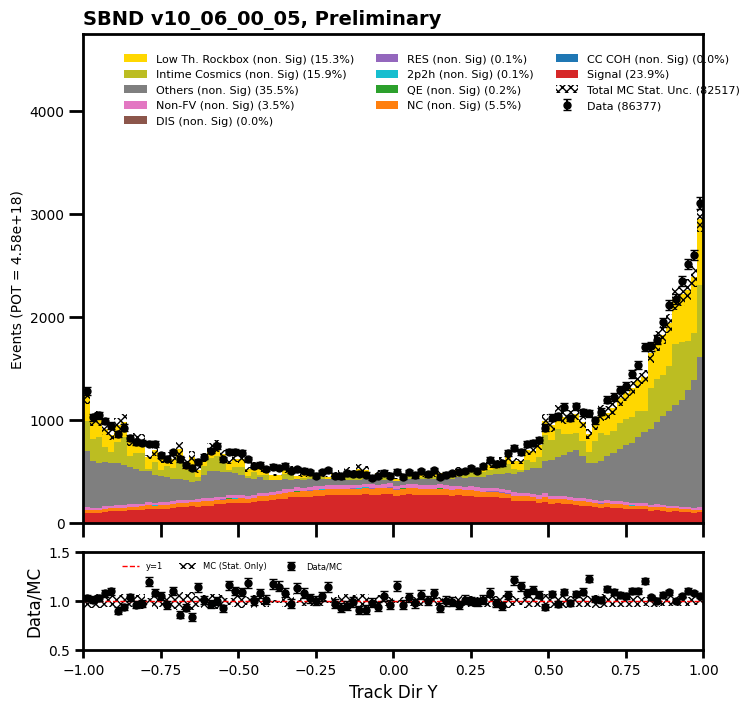

total data =  86377
[ 231  189  198  192  216  241  296  269  207  215  227  227  246  230
  246  247  244  256  271  282  276  284  291  305  324  324  323  318
  314  338  364  355  376  358  364  430  419  445  421  433  474  466
  504  516  593  548  639  718  801  938 1119 1108 1137 1127 1286 1250
 1189 1342 1314 1304 1320 1335 1349 1363 1320 1384 1343 1413 1417 1393
 1304 1430 1333 1424 1414 1374 1408 1326 1328 1345 1342 1316 1366 1322
 1368 1330 1291 1417 1455 1437 1452 1533 1501 1573 1513 1560 1558 1584
 1487 1484]
[ 202.61894  202.5611   226.92856  185.97534  202.4664   225.10327
  254.78201  280.55563  203.29079  178.4063   223.69452  243.6223
  177.37726  180.91905  250.79709  231.58652  221.97607  262.0775
  243.81815  202.28397  273.6099   227.6008   284.31766  269.17578
  313.37756  306.5846   259.27728  251.69595  293.82605  434.27997
  305.21756  293.2901   300.96722  350.79364  372.41873  366.68558
  395.06476  427.47687  431.57758  444.82367  389.10538  534.60126
  52

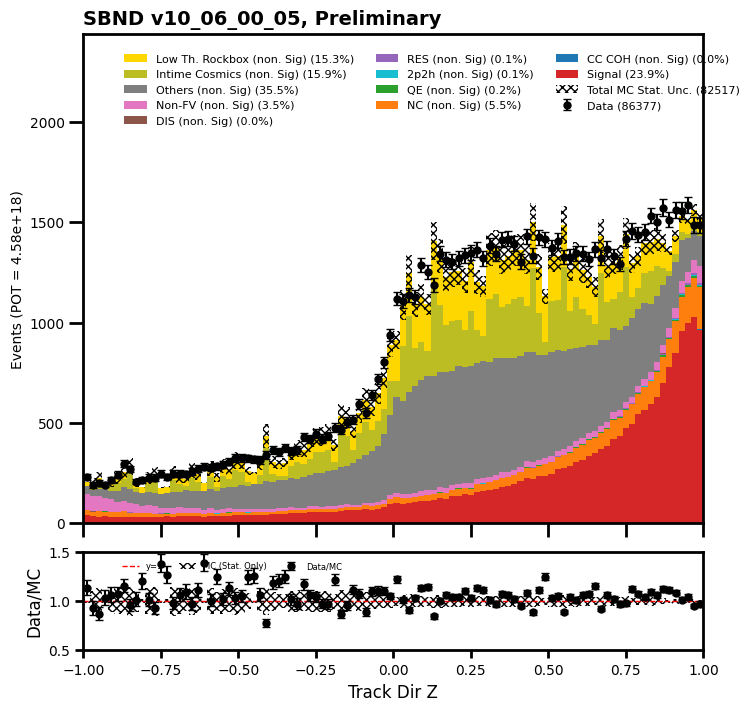

total data =  86350
[   81  4902 12525  8447  7782  7410  6937  6178  5405  4703  3973  3279
  2751  2410  1965  1671  1359  1177   973   772   508   330   246   168
   142   101    57    37    32     8     2     3     7     2     1     0
     2     2     0     2]
[7.3138855e+01 5.5055684e+03 1.3589854e+04 8.2408516e+03 7.4832681e+03
 6.8955640e+03 6.3554316e+03 5.2979897e+03 4.9474429e+03 4.1063960e+03
 3.4058689e+03 2.9467058e+03 2.5277334e+03 2.3209333e+03 1.8341748e+03
 1.5416691e+03 1.2019655e+03 1.0607260e+03 8.1412482e+02 7.5187518e+02
 4.8855771e+02 3.3642587e+02 2.4058907e+02 1.6756670e+02 1.2332547e+02
 7.2775528e+01 4.3980011e+01 2.7270638e+01 3.7440216e+01 8.9931641e+00
 4.0539551e+00 2.7064285e+00 3.9520340e+00 2.4353027e+00 2.6583252e+00
 1.7837048e+00 1.6214676e+00 1.6425781e+00 1.2346191e+00 1.6406250e+00]
data ratio  [1.10748247 0.89037129 0.92164349 1.02501543 1.03991998 1.07460391
 1.0915073  1.16610267 1.09248356 1.14528652 1.16651584 1.11276802
 1.0883268  1.038375

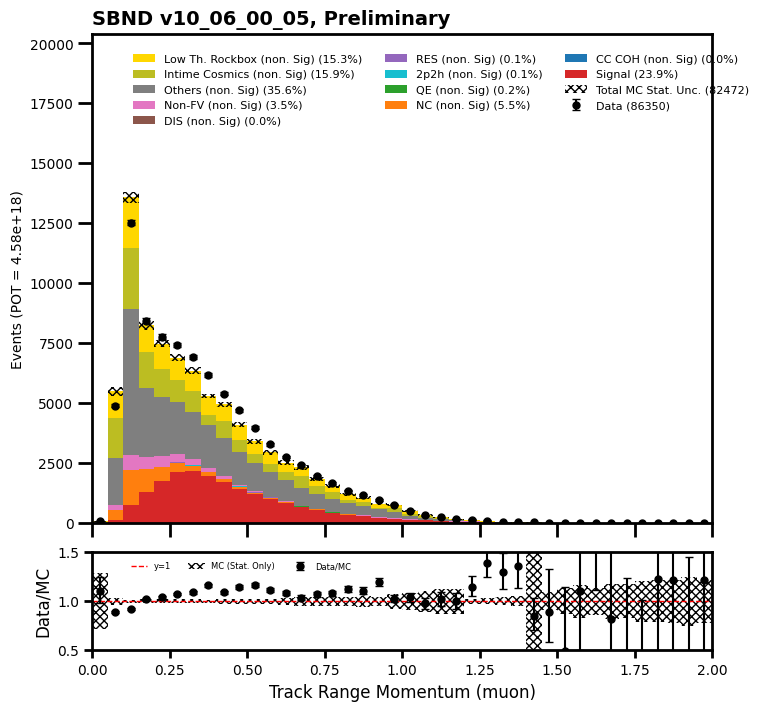

total data =  76385
[  11  185 4669 4912 5639 6204 7701 4754 6477 3972 4406 3804 3924 2839
 2088 2157 1998 2023 1313  851 1099  605  797  437  474  476  246  350
  234  223  285  149  234  131  157  132   91  138   82  118]
[   8.627034  183.70085  4750.008    4742.6255   4979.601    5763.043
 6796.039    4388.7573   5779.0293   3372.7563   3701.4988   3386.0083
 3640.8828   2579.0117   1819.8422   1982.5139   1680.2794   1764.8679
 1349.7628    867.7804    934.9767    554.74225   669.76685   391.56763
  453.01624   447.19794   277.1419    373.96576   194.35422   269.0594
  378.78125   195.46875   205.84686   130.07695   210.117     167.47723
  148.09467   145.8952    110.57045   128.95828 ]
data ratio  [1.2750616  1.00707209 0.98294575 1.03571324 1.13242003 1.07651462
 1.13316006 1.08322234 1.12077646 1.17767179 1.19032864 1.12344674
 1.07776059 1.10080927 1.14735225 1.08801254 1.18908794 1.14626142
 0.9727635  0.98066285 1.17543038 1.09059658 1.18996634 1.11602689
 1.04632012 1.06440

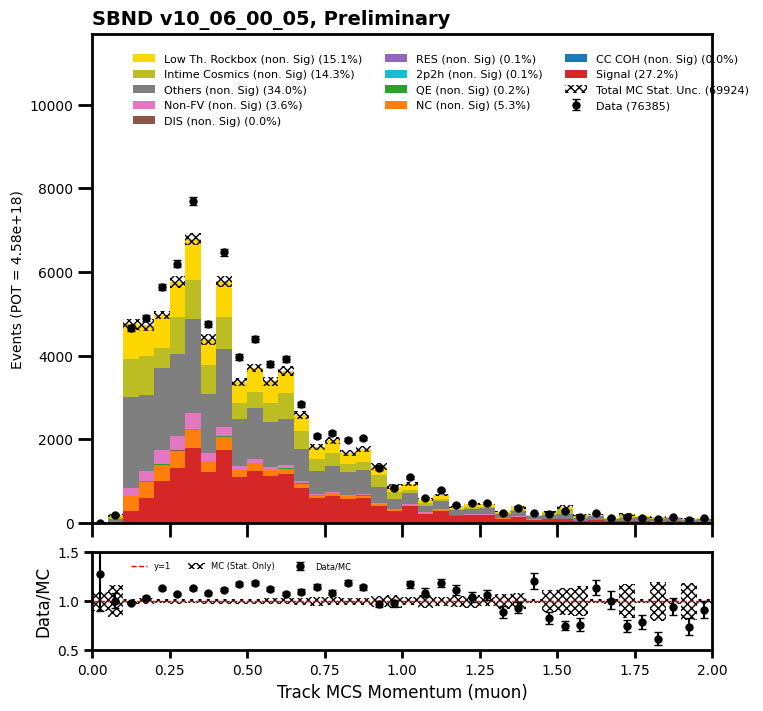

/tmp/ipykernel_1563/2477963852.py:130: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_1563/2477963852.py:131: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc
/tmp/ipykernel_1563/2477963852.py:185: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_1563/2477963852.py:189: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_1563/2477963852.py:190: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc


total data =  86372
[   0    0    0    0    0    0    0    0    0    0    3   11   22   53
   69  103  171  235  364  497  824 1621 2650 3167 2900 2628 2832 3628
 3939 3954 4034 4106 4174 4265 4286 4423 4564 4563 4303 4063 3754 3725
 3244 2430  742   25    0    0    0    0]
[0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00
 0.0000000e+00 0.0000000e+00 0.0000000e+00 8.6554505e-02 4.7646409e-01
 4.0482883e+00 1.0606658e+01 2.6226492e+01 4.2852417e+01 9.0467667e+01
 1.4899802e+02 1.9067557e+02 2.5475909e+02 3.8362613e+02 5.7410474e+02
 8.3983966e+02 1.6346833e+03 2.6924126e+03 3.2022642e+03 3.0634631e+03
 2.6598457e+03 2.7650437e+03 3.4716216e+03 3.5317432e+03 3.6520469e+03
 3.7955884e+03 3.9028088e+03 3.8390276e+03 3.7463687e+03 4.0991074e+03
 4.2580830e+03 4.2145913e+03 4.2105308e+03 4.0653823e+03 3.7580867e+03
 3.6916147e+03 3.4601035e+03 3.0974766e+03 2.4376309e+03 6.4501648e+02
 5.2910889e+01 0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00]
data ratio  [ 

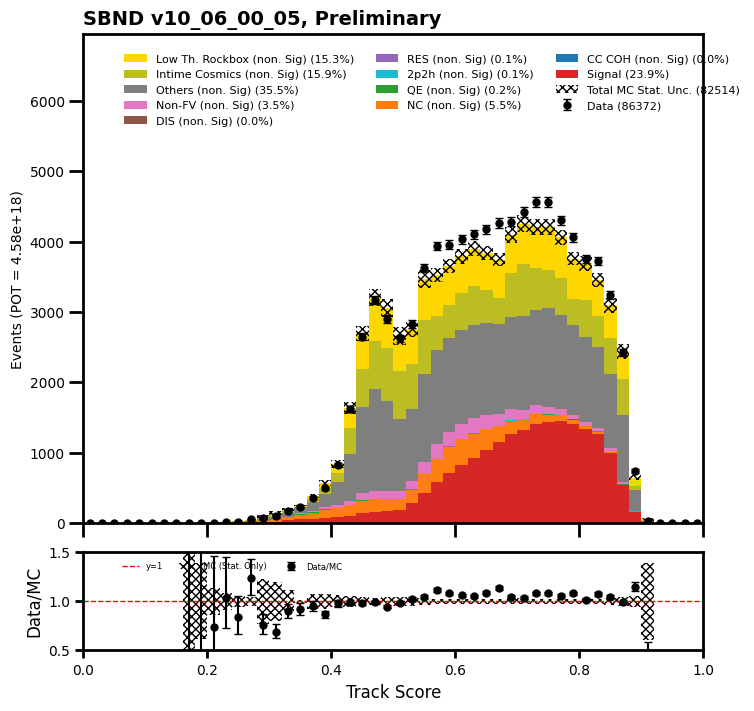

total data =  84115
[ 8577 15812 13295 10090  7591  5775  4420  3467  2629  1952  1445  1112
   877   733   623   511   454   415   359   354   348   289   262   234
   243   212   210   195   177   180   177   170   122   120   110   115
   129   120   105   106]
[11471.662    16182.461    12192.395     8205.49      6539.302
  4946.917     4046.5405    2993.5806    2271.463     1786.1528
  1238.0907    1033.7216     929.5212     783.5651     506.30743
   503.48755    472.3001     429.4296     335.3183     291.6538
   278.53174    246.65591    208.51172    238.52147    224.42128
   170.41312    227.66754    156.85292    160.46721    168.0253
   183.48906    149.18       104.62273    120.00015     96.803856
   111.77176     88.50895     78.57011    100.397255   118.1541  ]
data ratio  [0.74766846 0.97710726 1.09043387 1.22966449 1.1608273  1.16739375
 1.09229105 1.15814488 1.1574039  1.09285161 1.16711966 1.07572488
 0.94349652 0.93546787 1.23047769 1.01492083 0.96125322 0.96639823
 1.0

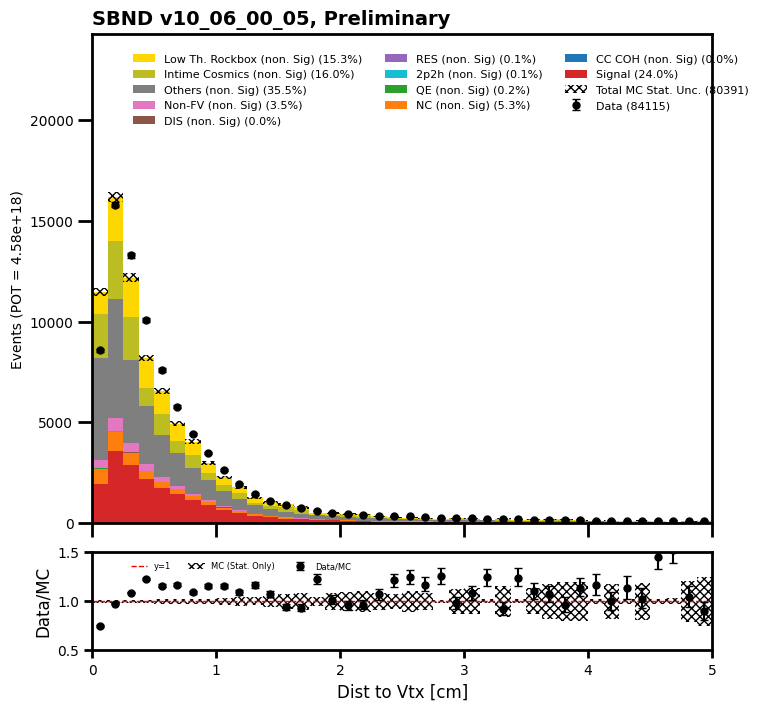

/tmp/ipykernel_1563/2477963852.py:130: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_1563/2477963852.py:131: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc
/tmp/ipykernel_1563/2477963852.py:185: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_1563/2477963852.py:189: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_1563/2477963852.py:190: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc


total data =  86377
[   0    0    0    0    0    0    0    0    0    0    0    0    0    0
    0    0    0    2 1089 1637 1669 1628 1568 1673 1562 1565 1566 1606
 1614 1511 1573 1594 1573 1613 1471 1552 1555 1484 1495 1417 1497 1475
 1394 1395 1374 1398 1344 1276  401    2    2  363 1170 1201 1251 1269
 1325 1326 1277 1310 1311 1420 1373 1374 1389 1370 1388 1406 1374 1404
 1432 1448 1392 1429 1405 1423 1413 1422 1370 1420 1426  919    2    0
    0    0    0    0    0    0    0    0    0    0    0    0    0    0
    0    0]
[0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00
 0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00
 0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00
 0.0000000e+00 3.2561529e-02 1.7207888e+00 9.4781445e+02 1.4883621e+03
 1.3926010e+03 1.5467852e+03 1.5389424e+03 1.3869012e+03 1.6186412e+03
 1.4697786e+03 1.5018696e+03 1.6093998e+03 1.5740697e+03 1.5359996e+03
 1.4639487e+03 1.4802493e+03 1.4240330e+03 1.

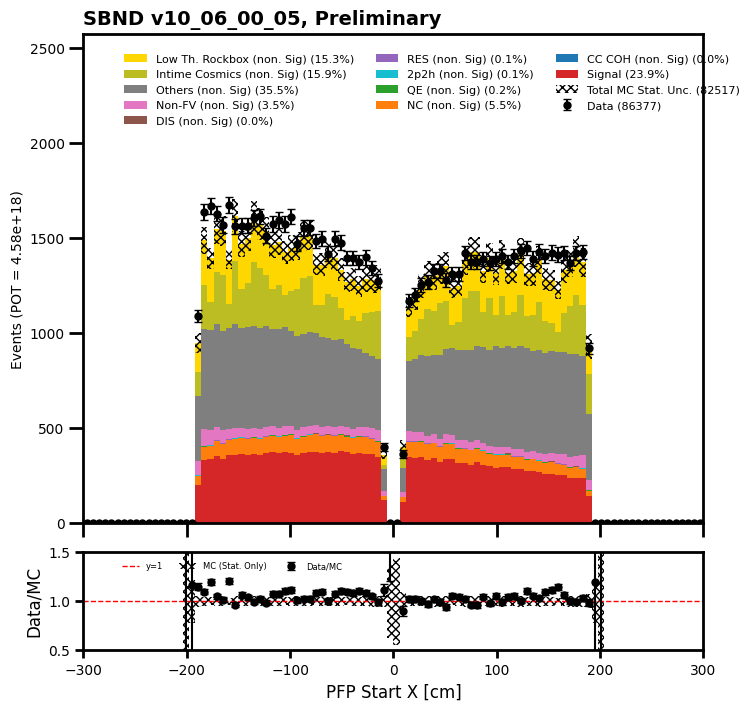

/tmp/ipykernel_1563/2477963852.py:130: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_1563/2477963852.py:131: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc


total data =  86377
[   0    0    0    0    0    0    0    0    0    0    0    0    0    0
    0    0    1    6  778 1114 1101 1015 1041 1004 1029  985  984 1060
 1073 1012 1045 1028  987 1061 1086 1062 1077 1122 1127 1114 1110 1108
 1147 1165 1160 1095 1128 1162 1184 1191 1197 1325 1228 1213 1244 1235
 1248 1299 1263 1340 1328 1356 1387 1440 1459 1463 1457 1488 1572 1656
 1639 1624 1717 1870 1866 1949 2064 2178 2305 2623 2885 2067   30    0
    0    0    0    0    0    0    0    0    0    0    0    0    0    0
    0    0]
[0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00
 0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00
 0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00
 0.0000000e+00 3.0335513e-01 5.4579062e+00 6.2391724e+02 9.6216992e+02
 9.4675983e+02 9.9115741e+02 1.0246611e+03 1.0236663e+03 9.4342096e+02
 9.5665131e+02 1.0487404e+03 8.8550452e+02 9.0193787e+02 9.9497974e+02
 9.2336121e+02 9.3867407e+02 9.7461060e+02 1.

/tmp/ipykernel_1563/2477963852.py:185: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_1563/2477963852.py:189: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_1563/2477963852.py:190: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc


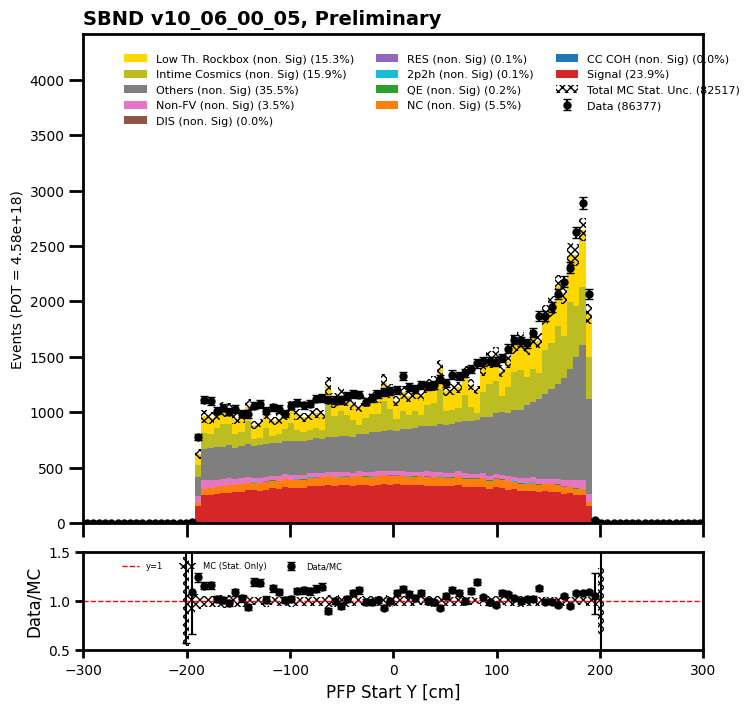

/tmp/ipykernel_1563/2477963852.py:130: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_1563/2477963852.py:131: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc
/tmp/ipykernel_1563/2477963852.py:185: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_1563/2477963852.py:189: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_1563/2477963852.py:190: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc


total data =  86377
[   0    0    0    0    0    0    0    0    0    0    0    0    0    0
   15  615 1816 1569 1568 1456 1534 1425 1336 1099 1499 1353 1350 1334
 1324 1341 1318 1349 1268 1346 1339 1268 1248 1267 1324 1289 1309 1312
 1267 1346 1295 1287 1288 1359 1369 1329 1425 1428 1345 1297 1383 1385
 1291 1293 1319 1329 1328 1322 1342 1373 1352 1356 1362 1418 1415 1408
 1470 1393 1425 1354 1483 1473 1431 1516  847    3    0    0    0    0
    0    0    0    0    0    0    0    0    0    0    0    0    0    0
    0    0]
[   0.           0.           0.           0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.           7.7392282
  543.66754   1644.846     1450.6193    1466.277     1464.4038
 1391.5571    1456.2318    1277.4128    1079.1196    1425.8087
 1299.5488    1380.6019    1345.6665    1247.2711    1245.3574
 1246.775     1370.5894    1321.6521    1237.1714    1203.6588
 1277.8894    1329.3417    1321.471

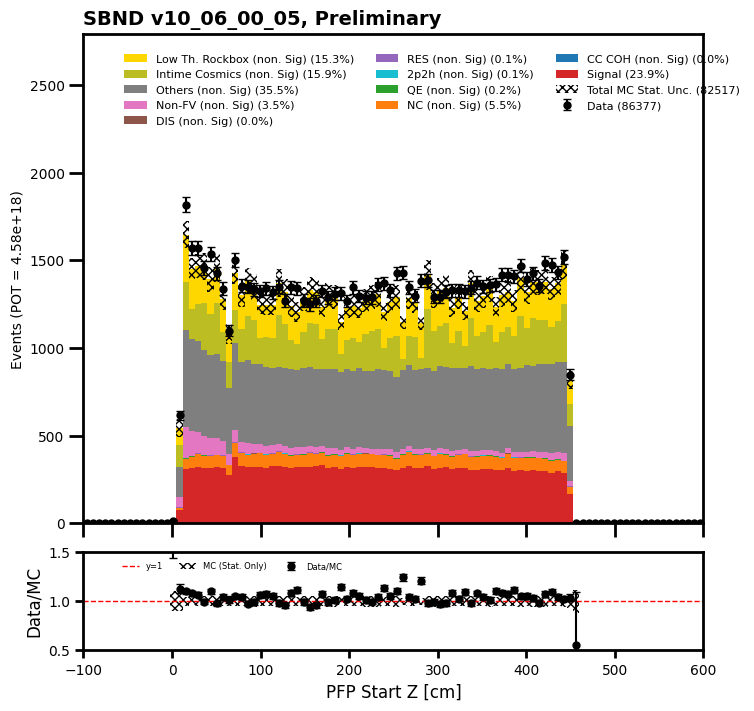

In [59]:
## Reco 3) must not be a clear cosmic cut
#isnt_clear_cosmic_mc = (mc_matchdf.slc.is_clear_cosmic == 0)
#isnt_clear_cosmic_data = (data_evt_df.slc.is_clear_cosmic == 0)

#mc_matchdf = mc_matchdf[isnt_clear_cosmic_mc]
#data_evt_df = data_evt_df[isnt_clear_cosmic_data]

mc_bnb_cosmic_dfs["evt"] = mc_bnb_cosmic_dfs["evt"][mc_bnb_cosmic_dfs["evt"].slc.is_clear_cosmic == 0]
mc_rockbox_dirt_dfs["evt"] = mc_rockbox_dirt_dfs["evt"][mc_rockbox_dirt_dfs["evt"].slc.is_clear_cosmic == 0]
data_offbeam_light_dfs["evt"] = data_offbeam_light_dfs["evt"][data_offbeam_light_dfs["evt"].slc.is_clear_cosmic == 0]
data_bnb_light_dfs["evt"] = data_bnb_light_dfs["evt"][data_bnb_light_dfs["evt"].slc.is_clear_cosmic == 0]

#fractions_clear_cosmic_cosmiccut, fractions_nu_score_cosmiccut, fractions_vtx_x_cosmiccut, fractions_vtx_y_cosmiccut, fractions_vtx_z_cosmiccut, fractions_trk_len = draw_reco_valid_plots(mc_matchdf, data_evt_df, "is_clear_cosmic")
draw_reco_valid_plots(mc_bnb_cosmic_dfs["evt"], mc_rockbox_dirt_dfs["evt"], data_offbeam_light_dfs["evt"], data_bnb_light_dfs["evt"], "a_vtx_fv_and_not_clear_cosmic")

/tmp/ipykernel_1563/2477963852.py:130: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_1563/2477963852.py:131: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc
/tmp/ipykernel_1563/2477963852.py:185: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_1563/2477963852.py:189: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_1563/2477963852.py:190: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc


total data =  47566
[47566     0]
[43746.81244229     0.        ]
data ratio  [1.08730208        nan]


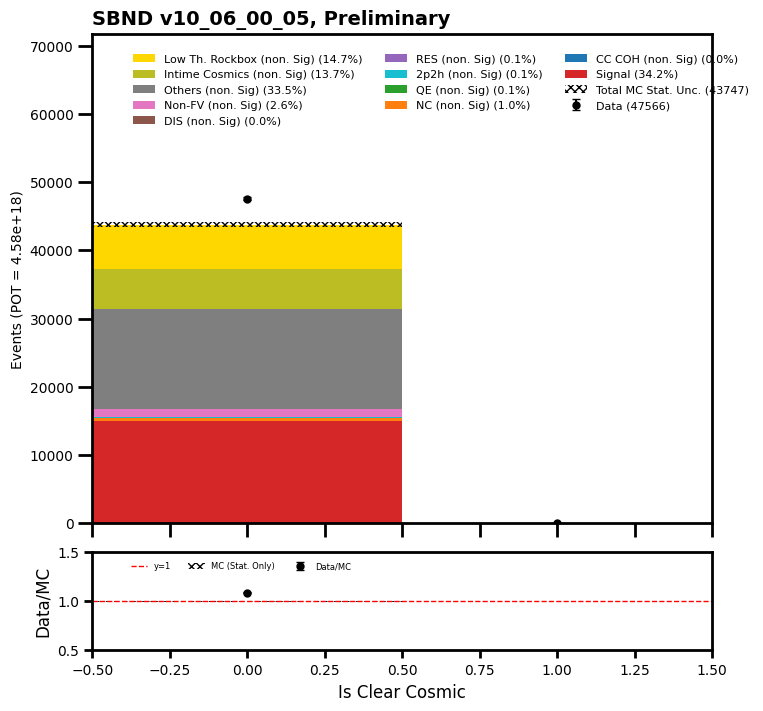

/tmp/ipykernel_1563/2477963852.py:130: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_1563/2477963852.py:131: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc
/tmp/ipykernel_1563/2477963852.py:185: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_1563/2477963852.py:189: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_1563/2477963852.py:190: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc


total data =  42185
[    0     0     0     0     0     0     0     0     0     0     0     0
     0     0     0     0     0     0     0     0     0     0     0     0
     0     0     0     0     0     0     0     0     0     0     0     0
     0     0     0     0     0     0     0     0     0     0     0     0
     0     0 22407  1960  1199  1276  1492  1725  2062  2197  2079  1807
  1435   988   637   364   224   136    89    45    26    18    11     0
     6     0     1     0     1     0     0     0     0     0     0     0
     0     0     0     0     0     0     0     0     0     0     0     0
     0     0     0     0]
[    0.          0.          0.          0.          0.          0.
     0.          0.          0.          0.          0.          0.
     0.          0.          0.          0.          0.          0.
     0.          0.          0.          0.          0.          0.
     0.          0.          0.          0.          0.          0.
     0.          0.          0

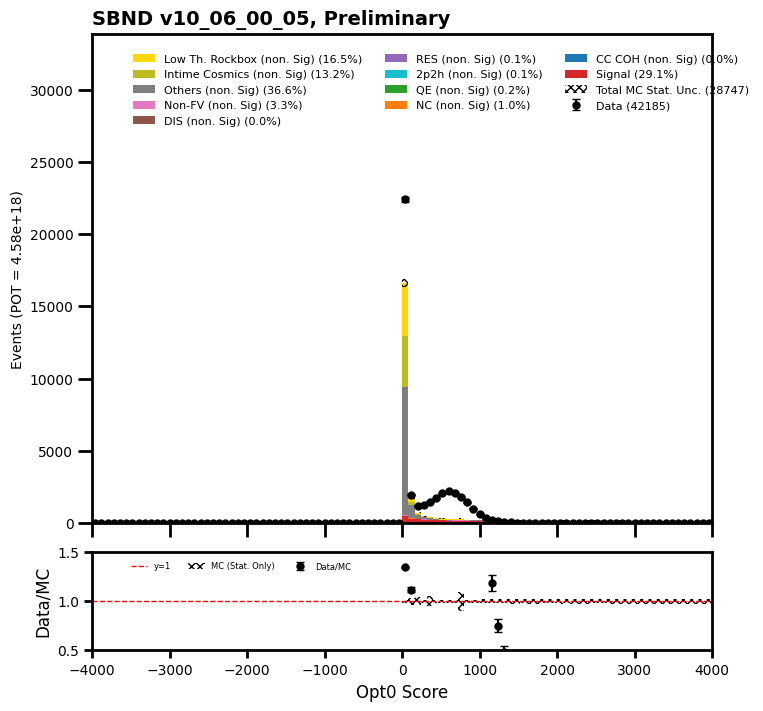

/tmp/ipykernel_1563/2477963852.py:130: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_1563/2477963852.py:131: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc
/tmp/ipykernel_1563/2477963852.py:185: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_1563/2477963852.py:189: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_1563/2477963852.py:190: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc


total data =  47566
[   0    0    0    0    0    0    0    0    0    0    0    0    0    0
    0    0    0    0    0    0    0    0    0    0    0    2   76  790
 3032 6489 8880 8155 6506 5054 4456 3363  752   11    0    0    0    0
    0    0]
[0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00
 0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00
 0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00
 0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00
 0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00
 1.0394828e+00 1.0274392e+02 1.1957886e+03 3.9938628e+03 6.8199087e+03
 7.4667139e+03 6.3670342e+03 5.0183354e+03 4.1427041e+03 4.1125054e+03
 3.5955068e+03 9.1358344e+02 1.7935116e+01 0.0000000e+00 0.0000000e+00
 0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00]
data ratio  [       nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan      

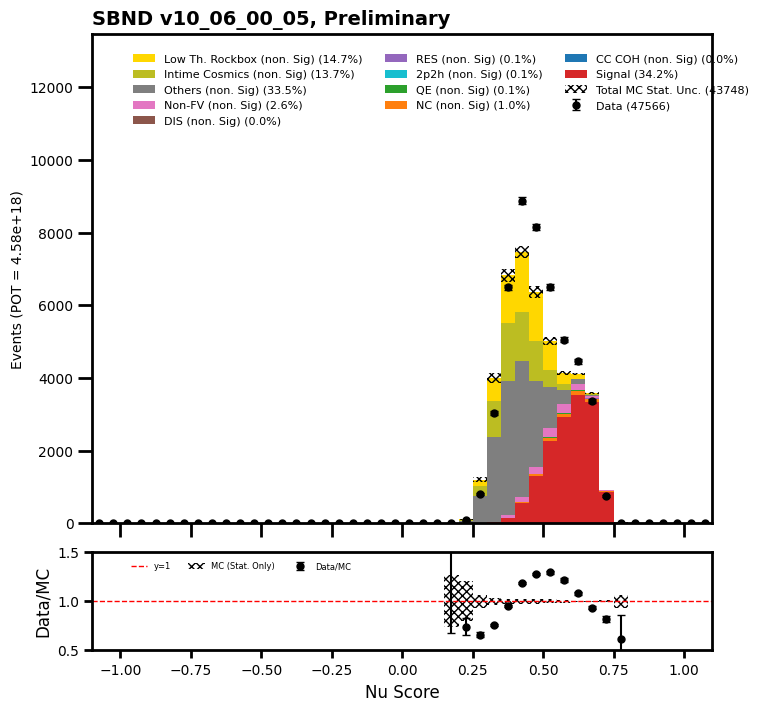

/tmp/ipykernel_1563/2477963852.py:130: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_1563/2477963852.py:131: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc
/tmp/ipykernel_1563/2477963852.py:185: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_1563/2477963852.py:189: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_1563/2477963852.py:190: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc


total data =  47566
[  0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0
 531 823 882 899 883 955 914 893 932 941 918 876 907 962 899 956 853 891
 911 827 783 795 826 817 747 709 748 708 718 629 197   0   0 181 582 621
 640 659 694 721 695 700 719 772 781 743 802 737 790 772 795 790 821 833
 797 784 828 807 793 774 741 719 701 444   0   0   0   0   0   0   0   0
   0   0   0   0   0   0   0   0   0   0]
[  0.        0.        0.        0.        0.        0.        0.
   0.        0.        0.        0.        0.        0.        0.
   0.        0.        0.        0.      453.39243 752.6941  703.31683
 809.098   875.99426 741.1875  851.14545 805.7143  746.1342  907.05524
 843.66693 843.9076  903.46216 821.8892  814.8882  818.0581  829.0636
 811.1183  817.2079  748.9392  778.7344  762.8445  701.2601  779.0919
 686.4825  646.0442  651.1162  653.83484 602.6892  631.25397 173.12445
   0.        0.      169.36064 509.69977 550.571   657.30914 635.8802
 604.7352  730.163

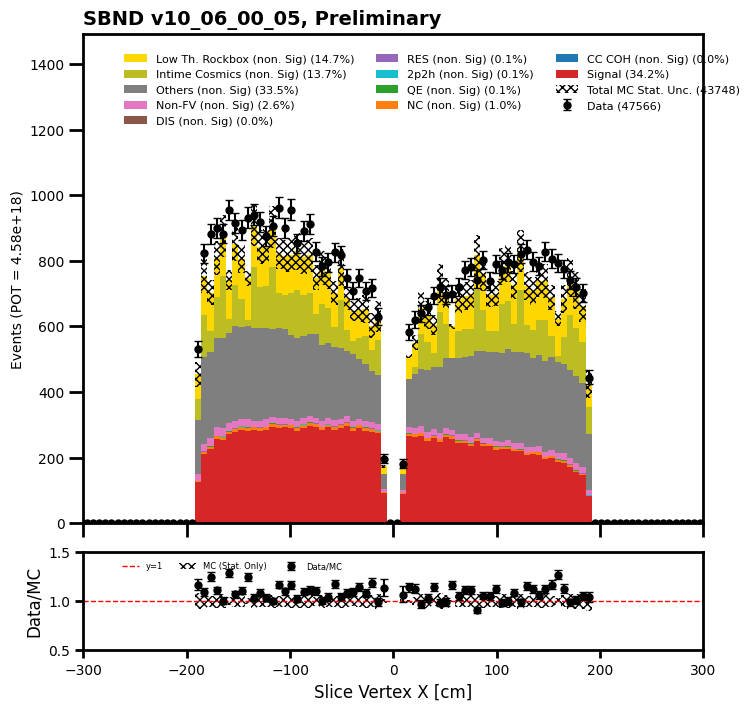

/tmp/ipykernel_1563/2477963852.py:130: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_1563/2477963852.py:131: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc
/tmp/ipykernel_1563/2477963852.py:185: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_1563/2477963852.py:189: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_1563/2477963852.py:190: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc


total data =  47566
[   0    0    0    0    0    0    0    0    0    0    0    0    0    0
    0    0    0    0  294  501  549  549  584  591  625  569  608  661
  636  624  632  637  606  654  656  655  642  722  690  684  643  683
  668  702  707  656  679  705  756  708  740  784  751  736  741  749
  761  816  812  862  814  832  834  854  879  881  899  913  945  997
  972  954  981 1071 1026 1027 1008  993  879  755  611  413    0    0
    0    0    0    0    0    0    0    0    0    0    0    0    0    0
    0    0]
[  0.        0.        0.        0.        0.        0.        0.
   0.        0.        0.        0.        0.        0.        0.
   0.        0.        0.        0.      272.27203 413.43546 532.294
 578.7921  669.63043 641.8577  529.3236  585.05    598.36127 559.26526
 532.0545  579.7691  564.97034 560.9475  572.4022  610.63794 571.25146
 563.77325 582.817   604.4761  606.72046 661.28467 615.2862  719.26135
 605.0021  624.846   618.9332  678.5519  672.27405 672.49

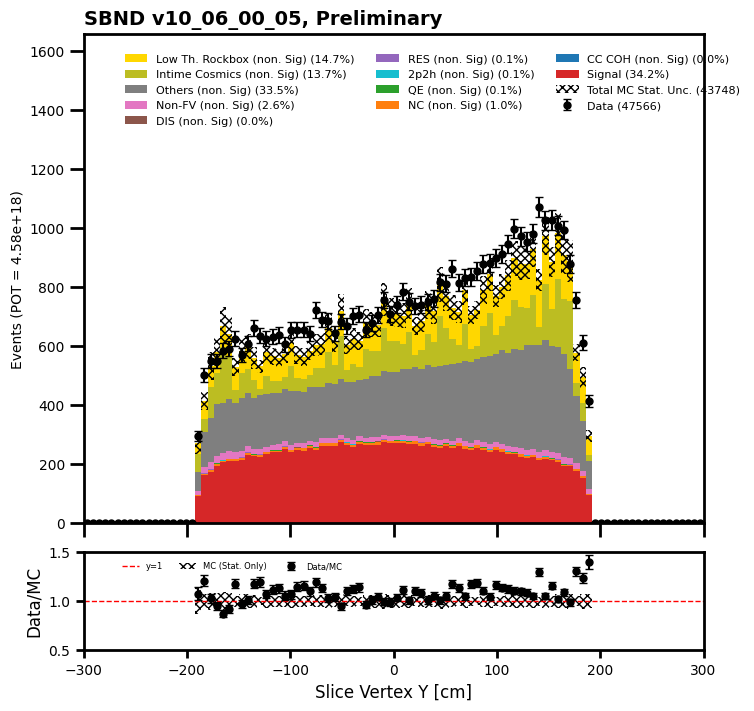

/tmp/ipykernel_1563/2477963852.py:130: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_1563/2477963852.py:131: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc
/tmp/ipykernel_1563/2477963852.py:185: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_1563/2477963852.py:189: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_1563/2477963852.py:190: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc


total data =  47566
[  0   0   0   0   0   0   0   0   0   0   0   0   0   0   0 312 876 752
 812 812 837 778 733 667 827 717 729 747 728 732 762 737 714 718 728 694
 716 658 749 660 739 717 662 710 711 740 689 733 739 698 795 775 721 729
 766 770 696 728 696 742 734 717 751 767 774 744 755 822 812 811 865 813
 805 760 866 838 801 879 501   0   0   0   0   0   0   0   0   0   0   0
   0   0   0   0   0   0   0   0   0   0]
[  0.        0.        0.        0.        0.        0.        0.
   0.        0.        0.        0.        0.        0.        0.
   0.      253.20622 735.7196  681.2101  739.01874 744.2023  805.6891
 715.1868  665.4831  588.63153 812.2635  688.11115 731.04596 727.53864
 670.0564  669.2761  670.62805 733.41254 643.9265  642.9689  619.3896
 683.24115 707.7005  701.0563  690.2689  664.78235 692.7466  632.4586
 587.4699  654.2665  623.2622  610.7301  675.27155 683.21826 621.386
 686.5246  759.5376  630.0008  646.08606 731.19666 606.4829  689.93677
 711.046   699.8879 

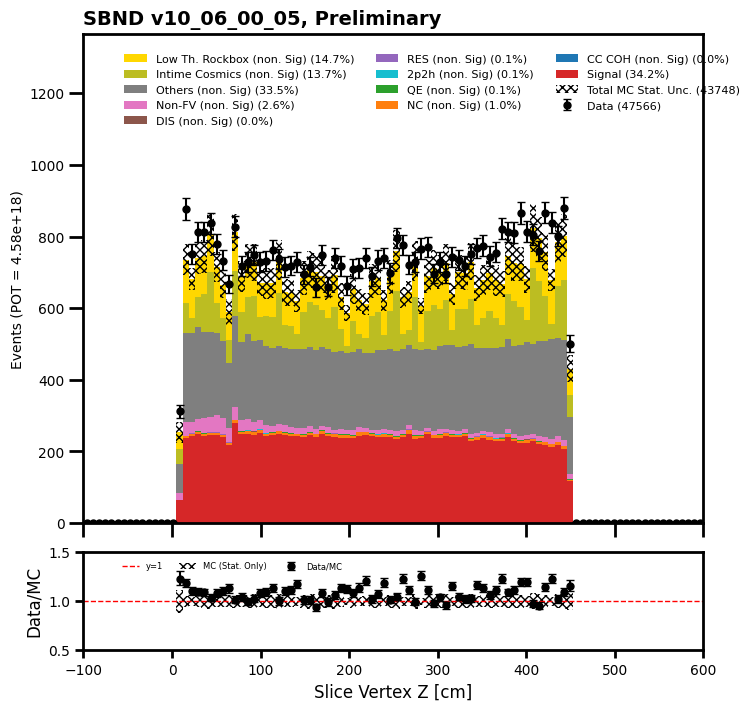

/tmp/ipykernel_1563/2477963852.py:130: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_1563/2477963852.py:131: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc
/tmp/ipykernel_1563/2477963852.py:185: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_1563/2477963852.py:189: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_1563/2477963852.py:190: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc


total data =  46176
[   0    0    0 1192 1644 2058 2351 2370 2434 2395 2206 2167 2018 1995
 1886 1779 1694 1555 1499 1344 1257 1154 1064 1022  980  896  827  731
  709  639  620  532  511  458  477  422  382  341  322  245]
[   0.         0.         0.       989.8287  1572.0194  1973.3611
 2134.1533  2210.4756  2379.643   2165.355   1991.4208  1846.0948
 1835.6082  1878.9587  1655.8325  1488.1967  1602.8318  1348.9287
 1230.1971  1327.1943  1064.0388  1093.1101   988.17883  975.07825
  919.3445   878.4101   889.3961   723.8103   633.10913  617.0418
  555.3084   507.0735   452.59683  422.5935   415.8318   396.0168
  302.27374  316.12997  312.51385  328.23264]
data ratio  [       nan        nan        nan 1.20424881 1.04578861 1.04289074
 1.10160783 1.07216746 1.02284247 1.10605421 1.10775183 1.17382918
 1.09936317 1.06175828 1.13900408 1.19540653 1.05687946 1.15276663
 1.21850389 1.01266255 1.18134788 1.05570335 1.07672818 1.04812101
 1.06597692 1.02002471 0.9298444  1.00993312 1.119870

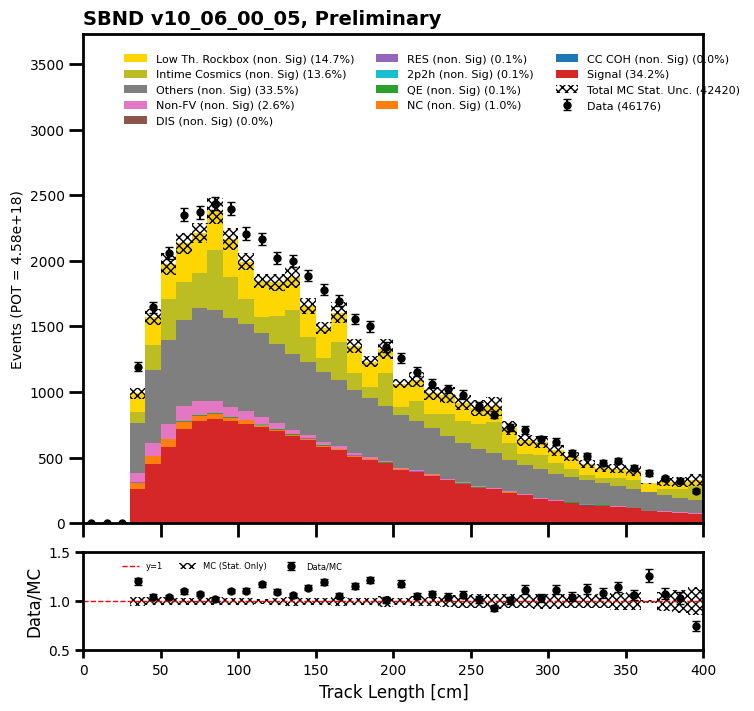

total data =  47566
[ 35  56  54  68  69  94 137 171 192 207 175 235 264 284 292 315 310 337
 331 387 366 398 393 481 451 487 487 537 596 580 622 626 662 643 673 740
 735 739 716 752 773 728 718 779 719 698 691 820 796 886 863 801 747 748
 752 752 762 762 785 720 741 757 729 726 740 671 693 693 677 622 581 560
 527 574 562 494 463 465 445 453 399 424 335 318 301 322 290 271 285 254
 242 188 173 148 120 108  62  59  63  34]
[ 35.262733  52.197086  60.73706   73.909164  87.5049    97.43349
 144.26907  139.5969   203.03772  204.79813  243.58308  208.03537
 240.48798  234.69614  327.47784  271.1073   307.25455  282.93326
 314.26227  384.1785   371.9925   427.22244  396.45557  368.01166
 491.25537  407.9052   462.69037  524.1955   489.33728  596.02954
 535.1631   575.82996  653.2892   630.71826  649.5654   787.8753
 579.3256   612.4298   700.6325   656.72125  713.91205  666.62067
 653.36096  600.8598   681.2556   676.8257   641.65015  655.5303
 640.1302   783.1029   793.6041   825.59753  66

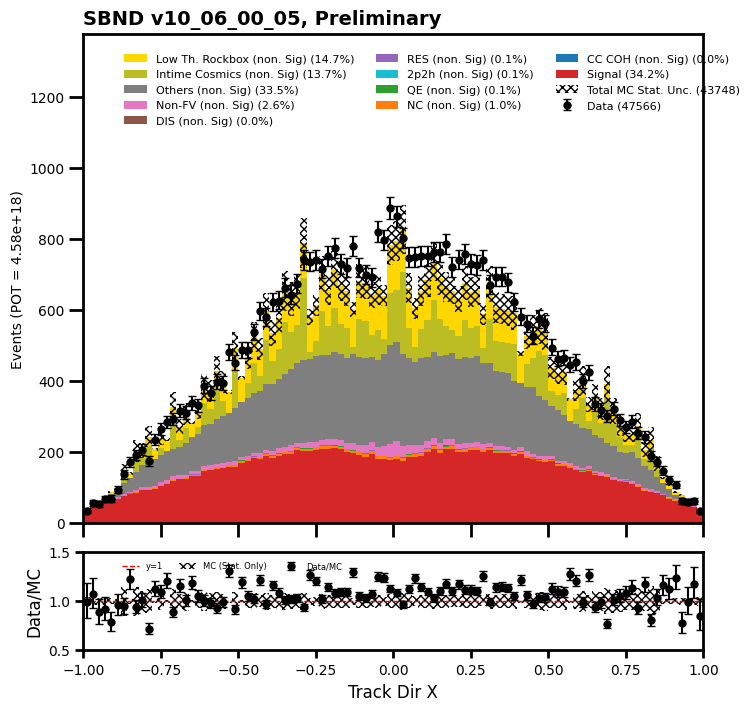

total data =  47566
[ 367  414  410  428  383  353  411  357  325  365  338  362  301  309
  320  299  259  254  293  341  380  424  345  375  366  332  310  267
  314  298  290  298  323  263  285  306  275  257  277  281  273  256
  267  256  258  258  264  255  263  261  263  246  289  251  283  255
  293  270  287  283  297  280  312  293  337  359  331  362  397  436
  414  450  441  474  544  593  628  682  650  716  691  671  636  714
  741  750  783  826  847  944 1049 1018 1057 1164 1258 1278 1339 1422
 1391 1505]
[ 318.0136   340.05032  346.255    338.53256  331.29877  338.6582
  385.80807  316.26846  314.94254  285.98145  283.56003  271.9729
  244.85231  278.68024  295.93265  333.57623  263.501    306.79785
  226.60815  346.54257  457.89877  414.18604  377.6344   308.60486
  343.63004  293.13617  279.67493  260.92993  266.6868   280.41507
  256.88873  261.5099   281.37033  299.91928  249.38771  253.58902
  263.6602   259.27118  251.93118  257.2491   276.7892   256.68796
  27

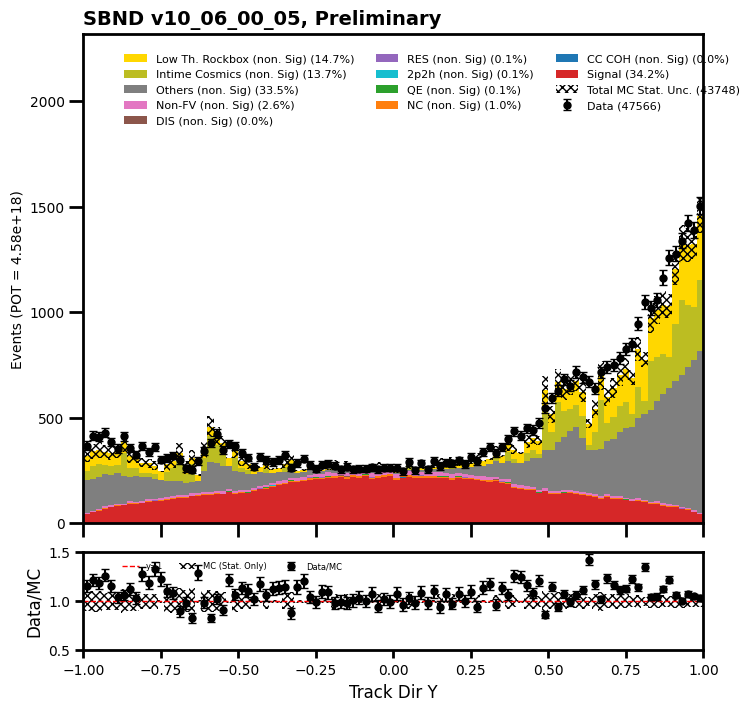

total data =  47566
[  88   91   92   93   95  103   97   81   82   93   79  109  107   99
  105   99  109  106  132  117  138  131  128  137  140  163  135  162
  142  161  194  142  175  143  153  179  181  190  189  183  166  171
  164  175  203  194  221  242  254  300  361  416  411  470  541  525
  558  663  643  689  709  708  768  766  755  823  792  835  851  842
  787  874  831  864  881  913  862  843  817  814  887  824  868  891
  894  861  867  956  970  985  938  974  947  942  974 1062 1038 1005
  926  912]
[100.14087   87.96887   88.746735  85.15267   79.86833   70.372665
  91.56377   68.94959   66.802444  69.16267  114.69702   74.62529
  74.26904   73.77133   97.11469  100.22463   86.53587  105.98351
 111.719376  87.71092  113.25661  112.32155  120.556564 118.88889
 122.85552  108.65001  102.59768  108.58999  113.2165   160.5372
 121.06745  124.96638  144.43039  140.8118   188.78879  192.44102
 172.35141  200.79242  153.1177   155.96268  178.66254  181.44742
 162.3629

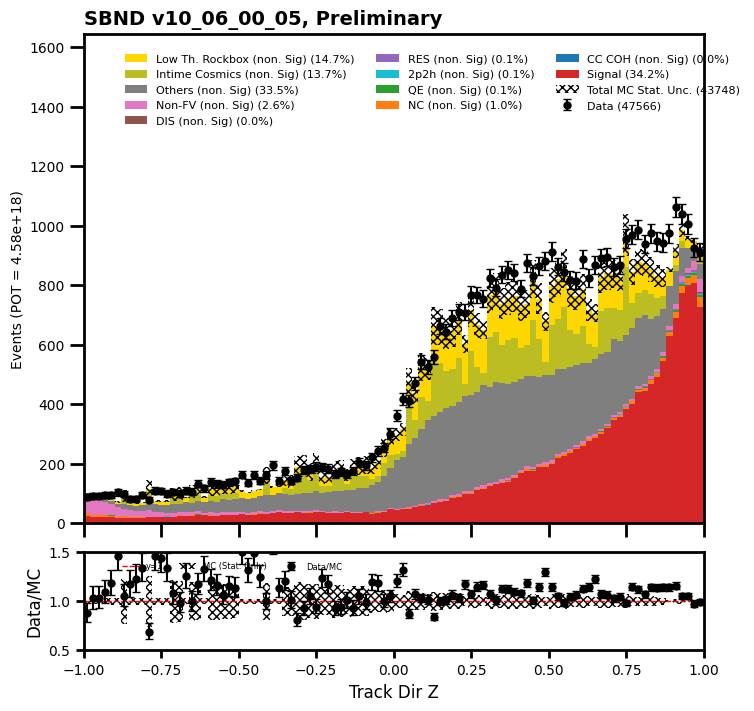

/tmp/ipykernel_1563/2477963852.py:130: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_1563/2477963852.py:131: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc
/tmp/ipykernel_1563/2477963852.py:185: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_1563/2477963852.py:189: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_1563/2477963852.py:190: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc


total data =  47565
[   0    0    0 1094 3821 5167 5342 4916 4430 3944 3368 2808 2386 2053
 1682 1431 1174 1002  855  658  469  298  206  145  122   89   50   26
   19    6    2    0    1    0    0    0    0    0    0    1]
[0.00000000e+00 0.00000000e+00 0.00000000e+00 9.17249451e+02
 3.63434741e+03 4.80352881e+03 5.01411914e+03 4.20634668e+03
 4.10891211e+03 3.52785376e+03 2.91510938e+03 2.57817725e+03
 2.22970117e+03 2.05818750e+03 1.59204333e+03 1.32529053e+03
 1.07316309e+03 9.51733765e+02 7.28213135e+02 6.86273254e+02
 4.52247559e+02 3.12528687e+02 2.18042084e+02 1.51991821e+02
 1.07959549e+02 6.08483047e+01 3.43436356e+01 2.07301025e+01
 3.03782959e+01 4.51123047e+00 1.26464844e+00 6.60644531e-01
 4.76074219e-01 0.00000000e+00 3.23852539e-01 3.27148438e-02
 9.71679688e-02 3.22265625e-02 3.27148438e-02 1.19628906e-01]
data ratio  [       nan        nan        nan 1.19269627 1.05135794 1.07566754
 1.06539152 1.16871014 1.07814426 1.11796017 1.15535974 1.08914156
 1.07009855 0.99747

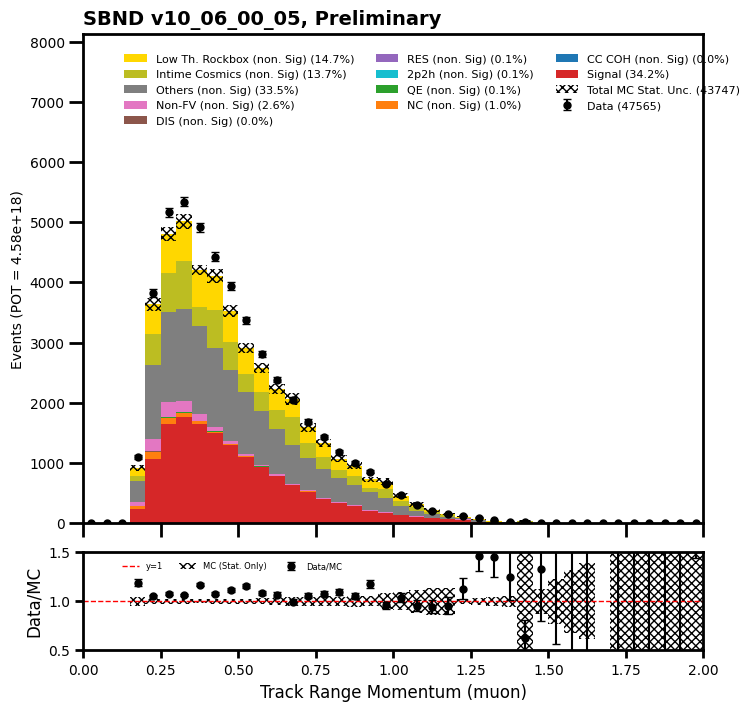

total data =  46617
[   0    0   19  580 1897 3177 4810 3202 4577 2944 3311 2924 3112 2263
 1663 1719 1656 1645 1078  715  895  503  663  347  390  411  198  291
  196  187  227  128  183  110  135  108   71  114   73   95]
[3.24786574e-01 2.05670536e-01 1.60954685e+01 5.00752502e+02
 1.62985339e+03 2.83830029e+03 4.02961133e+03 2.83643994e+03
 3.99941870e+03 2.48152002e+03 2.77341089e+03 2.52840674e+03
 2.78878174e+03 1.96916724e+03 1.46293921e+03 1.59104956e+03
 1.39845215e+03 1.42823584e+03 1.10267529e+03 7.03763000e+02
 7.82032288e+02 4.48742950e+02 5.58724976e+02 3.24048462e+02
 3.56459717e+02 3.68151398e+02 2.27533569e+02 3.15483826e+02
 1.61099335e+02 2.29524109e+02 2.94235565e+02 1.70499374e+02
 1.67734787e+02 1.09180466e+02 1.38787628e+02 1.41392639e+02
 1.06333176e+02 1.21407547e+02 9.38249817e+01 1.04903854e+02]
data ratio  [0.         0.         1.18045647 1.15825682 1.16390837 1.11933188
 1.19366351 1.12887989 1.14441631 1.18636964 1.19383681 1.1564595
 1.11589945 1.149216

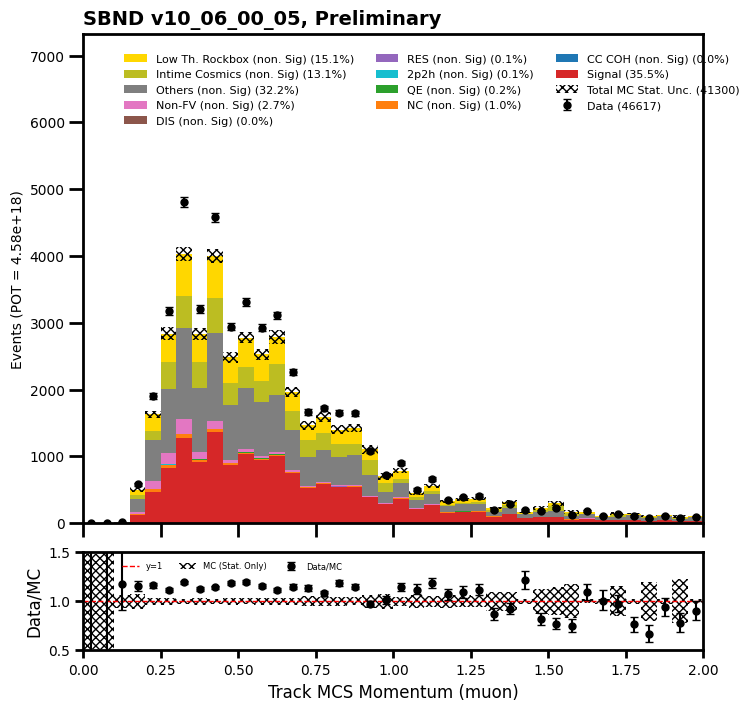

/tmp/ipykernel_1563/2477963852.py:130: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_1563/2477963852.py:131: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc
/tmp/ipykernel_1563/2477963852.py:185: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_1563/2477963852.py:189: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_1563/2477963852.py:190: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc


total data =  47566
[   0    0    0    0    0    0    0    0    0    0    0    0    0    0
    0    0    0    0    0    0    0    0    0    0    0    0    0    0
    0    0 2305 2629 3023 3414 3583 3794 3969 4088 3858 3685 3475 3512
 3129 2366  713   23    0    0    0    0]
[   0.         0.         0.         0.         0.         0.
    0.         0.         0.         0.         0.         0.
    0.         0.         0.         0.         0.         0.
    0.         0.         0.         0.         0.         0.
    0.         0.         0.         0.         0.         0.
 1922.3114  2273.621   2597.3418  2881.0725  3268.698   3629.979
 3639.3208  3680.11    3640.563   3461.5808  3429.4612  3284.9336
 3003.8916  2362.4604   622.96295   49.35205    0.         0.
    0.         0.     ]
data ratio  [       nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan        

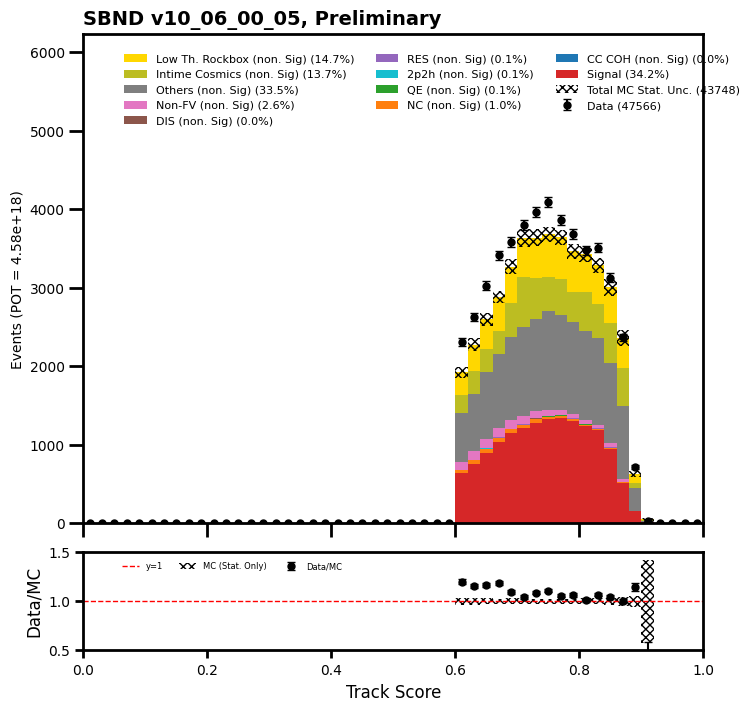

total data =  46921
[4950 9423 7834 5910 4422 3282 2491 1907 1480 1017  720  500  431  339
  276  202  184  153  131  128  130   93  102   78   69   61   56   79
   49   46   66   43   22   35   42   33   39   38   30   30]
[6810.612    9274.191    6746.7773   4643.415    3484.1646   2677.4292
 2118.1345   1672.2625   1174.8312    878.70184   611.0399    495.30884
  441.72144   353.54156   218.8035    180.15425   220.25653   132.15236
  112.679695  124.691925   84.36783    98.18521    69.60782    87.256
   55.1875     54.940063   71.34633    45.017456   35.793472   36.299576
   76.463394   30.085705   27.878792   27.932251   25.898445   22.415167
   21.117432   20.468506   19.273687   18.102188]
data ratio  [0.72680695 1.01604545 1.16114696 1.27277014 1.26917083 1.22580272
 1.17603484 1.14037124 1.25975547 1.15738917 1.17831909 1.00947119
 0.97572806 0.95886887 1.2614058  1.12126136 0.83538953 1.15775459
 1.16258746 1.02652999 1.54087171 0.94718949 1.46535263 0.89392137
 1.25028313 1.1

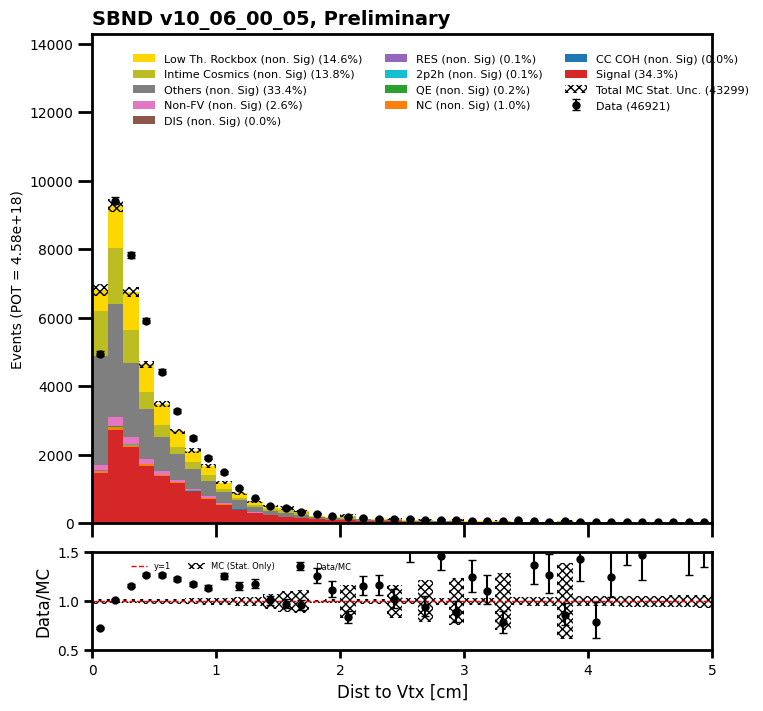

/tmp/ipykernel_1563/2477963852.py:130: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_1563/2477963852.py:131: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc
/tmp/ipykernel_1563/2477963852.py:185: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_1563/2477963852.py:189: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_1563/2477963852.py:190: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc


total data =  47566
[  0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0
 534 827 873 897 877 968 916 893 919 944 930 878 906 959 903 964 842 881
 912 819 796 801 832 807 749 713 743 709 716 625 197   0   0 171 589 619
 647 655 690 732 688 700 710 770 788 751 791 740 790 780 794 789 821 828
 791 785 824 820 786 785 734 715 713 440   0   0   0   0   0   0   0   0
   0   0   0   0   0   0   0   0   0   0]
[0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00
 0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00
 0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00
 0.0000000e+00 0.0000000e+00 0.0000000e+00 4.5026697e+02 7.7685767e+02
 6.8190247e+02 8.0824286e+02 8.7602527e+02 7.4462878e+02 8.4794324e+02
 8.0581183e+02 7.4531299e+02 9.1140356e+02 8.4129700e+02 8.4669995e+02
 9.0073480e+02 8.2236469e+02 8.1397864e+02 8.1929297e+02 8.2943213e+02
 8.1233923e+02 8.1675244e+02 7.4615833e+02 7.8091284e+02 7.6377563e+02
 7.00

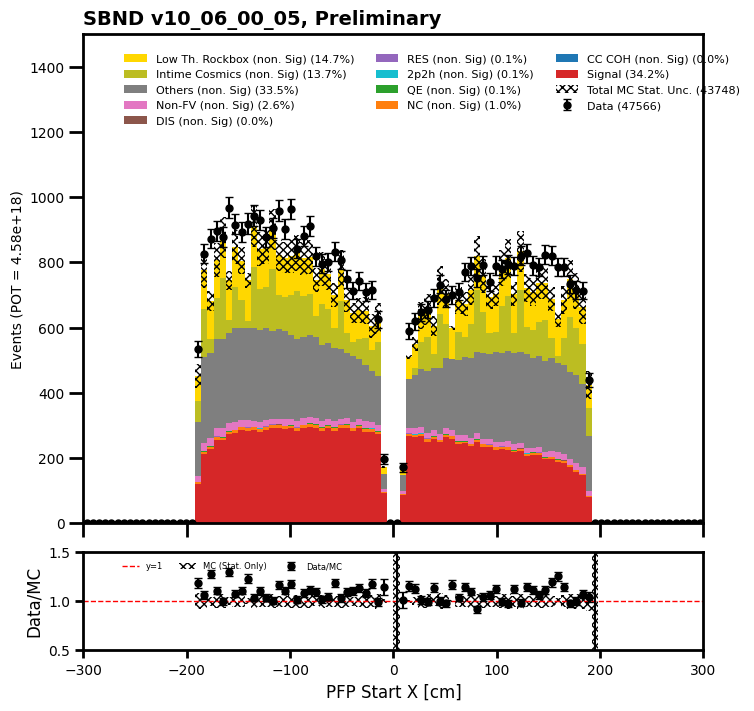

/tmp/ipykernel_1563/2477963852.py:130: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_1563/2477963852.py:131: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc
/tmp/ipykernel_1563/2477963852.py:185: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_1563/2477963852.py:189: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_1563/2477963852.py:190: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc


total data =  47566
[   0    0    0    0    0    0    0    0    0    0    0    0    0    0
    0    0    1    2  287  500  559  539  586  599  613  579  603  664
  644  603  633  645  606  656  652  656  654  703  698  677  646  679
  679  697  707  650  674  723  748  708  746  788  744  735  740  755
  761  791  823  874  797  841  837  875  865  881  893  904  961  982
  982  955  975 1068 1033 1028 1017  989  874  761  615  402    4    0
    0    0    0    0    0    0    0    0    0    0    0    0    0    0
    0    0]
[0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00
 0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00
 0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00
 0.0000000e+00 6.5123059e-02 1.1371675e+00 2.6644815e+02 4.1473126e+02
 5.3106097e+02 5.8151807e+02 6.6569379e+02 6.4419446e+02 5.2915997e+02
 5.8771423e+02 5.9645630e+02 5.5873389e+02 5.3296362e+02 5.7805811e+02
 5.6742493e+02 5.5868915e+02 5.7248871e+02 6.

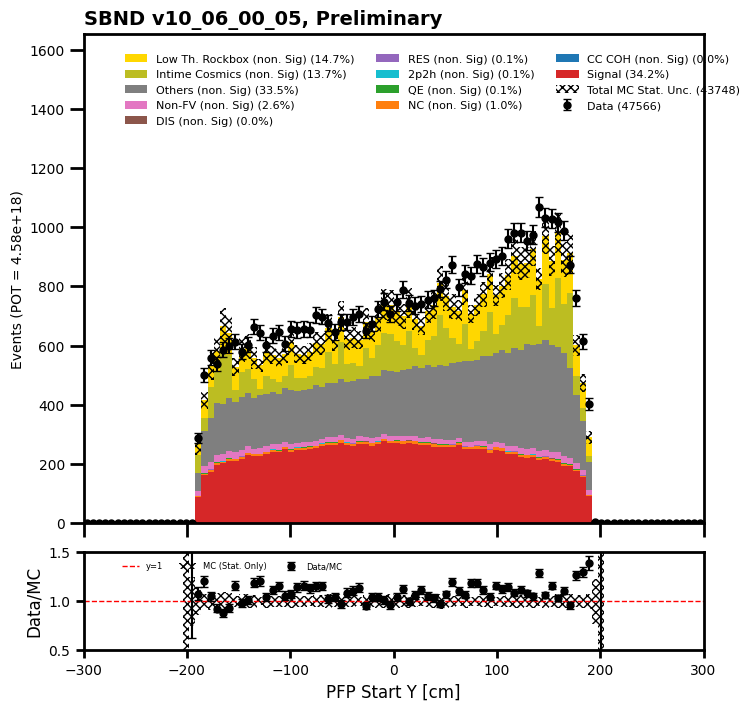

/tmp/ipykernel_1563/2477963852.py:130: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_1563/2477963852.py:131: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc
/tmp/ipykernel_1563/2477963852.py:185: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_1563/2477963852.py:189: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_1563/2477963852.py:190: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc


total data =  47566
[  0   0   0   0   0   0   0   0   0   0   0   0   0   0   9 275 883 752
 823 801 842 781 753 618 850 719 738 736 731 740 741 752 710 731 716 694
 712 676 744 667 715 727 664 711 717 730 691 728 737 712 799 761 728 731
 758 772 710 699 707 748 735 716 745 778 762 752 743 835 812 804 871 810
 807 757 865 844 797 879 514   1   0   0   0   0   0   0   0   0   0   0
   0   0   0   0   0   0   0   0   0   0]
[  0.          0.          0.          0.          0.          0.
   0.          0.          0.          0.          0.          0.
   0.          0.          5.3251743 237.53659   731.9163    680.8768
 719.673     768.0957    805.97015   714.2031    669.25024   567.8308
 829.1767    686.5612    734.01056   728.4603    665.59766   669.2011
 649.17065   756.1477    645.2042    640.59955   618.7825    687.2335
 706.8888    700.21497   691.2527    662.54956   697.13605   628.2655
 589.22284   654.06134   624.2289    609.8099    674.7831    681.5359
 625.48254   682.4186

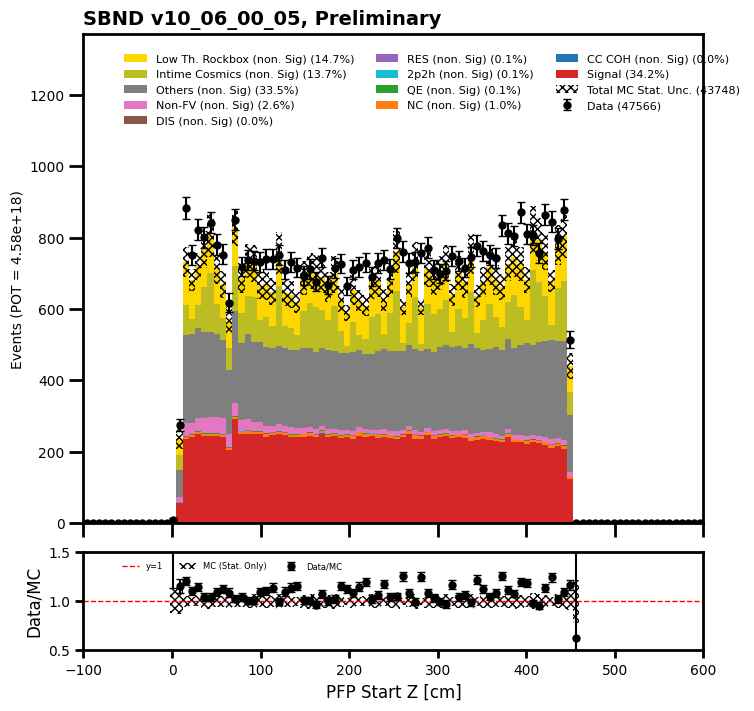

In [60]:
#muon candidates

mc_bnb_cosmic_dfs["evt"] = mc_bnb_cosmic_dfs["evt"][HasMuonCandidate(mc_bnb_cosmic_dfs["evt"])]
mc_rockbox_dirt_dfs["evt"] = mc_rockbox_dirt_dfs["evt"][HasMuonCandidate(mc_rockbox_dirt_dfs["evt"])]
data_offbeam_light_dfs["evt"] = data_offbeam_light_dfs["evt"][HasMuonCandidate(data_offbeam_light_dfs["evt"])]
data_bnb_light_dfs["evt"] = data_bnb_light_dfs["evt"][HasMuonCandidate(data_bnb_light_dfs["evt"])]

#fractions_clear_cosmic_cosmiccut, fractions_nu_score_cosmiccut, fractions_vtx_x_cosmiccut, fractions_vtx_y_cosmiccut, fractions_vtx_z_cosmiccut, fractions_trk_len = draw_reco_valid_plots(mc_matchdf, data_evt_df, "nu_score")
draw_reco_valid_plots(mc_bnb_cosmic_dfs["evt"], mc_rockbox_dirt_dfs["evt"], data_offbeam_light_dfs["evt"], data_bnb_light_dfs["evt"], "a_vtx_fv_and_not_clear_cosmic_nu_score")

/tmp/ipykernel_1563/3811422981.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  mc_rockbox_dirt_dfs["evt"] = mc_rockbox_dirt_dfs["evt"][(mc_rockbox_dirt_dfs["evt"].slc.nu_score > 0.5) & (mc_bnb_cosmic_dfs["evt"].slc.opt0.score > 320)]
/tmp/ipykernel_1563/3811422981.py:3: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  data_offbeam_light_dfs["evt"] = data_offbeam_light_dfs["evt"][(data_offbeam_light_dfs["evt"].slc.nu_score > 0.5) & (mc_bnb_cosmic_dfs["evt"].slc.opt0.score > 320)]
/tmp/ipykernel_1563/3811422981.py:4: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  data_bnb_light_dfs["evt"] = data_bnb_light_dfs["evt"][(data_bnb_light_dfs["evt"].slc.nu_score > 0.5) & (mc_bnb_cosmic_dfs["evt"].slc.opt0.score > 320)]
/tmp/ipykernel_1563/2477963852.py:130: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_1563/2477963852.py:131: RuntimeWa

total data =  2025
[2025    0]
[13030.86954311     0.        ]
data ratio  [0.15540022        nan]


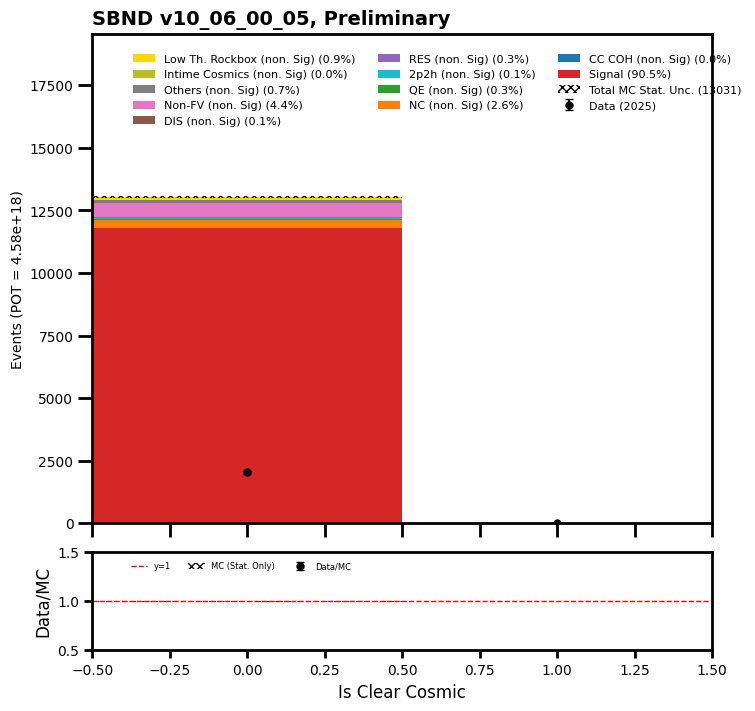

/tmp/ipykernel_1563/2477963852.py:130: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_1563/2477963852.py:131: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc
/tmp/ipykernel_1563/2477963852.py:185: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_1563/2477963852.py:189: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_1563/2477963852.py:190: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc


total data =  1908
[  0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0
   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0
   0   0   0   0   0   0   0   0   0   0   0   0   0   0 434  70  66  87
 109 150 152 187 150 147 118  88  68  29  23   9   9   5   2   2   3   0
   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0
   0   0   0   0   0   0   0   0   0   0]
[  0.          0.          0.          0.          0.          0.
   0.          0.          0.          0.          0.          0.
   0.          0.          0.          0.          0.          0.
   0.          0.          0.          0.          0.          0.
   0.          0.          0.          0.          0.          0.
   0.          0.          0.          0.          0.          0.
   0.          0.          0.          0.          0.          0.
   0.          0.          0.          0.          0.          0.
   0.          0.         69.03154     5.30764

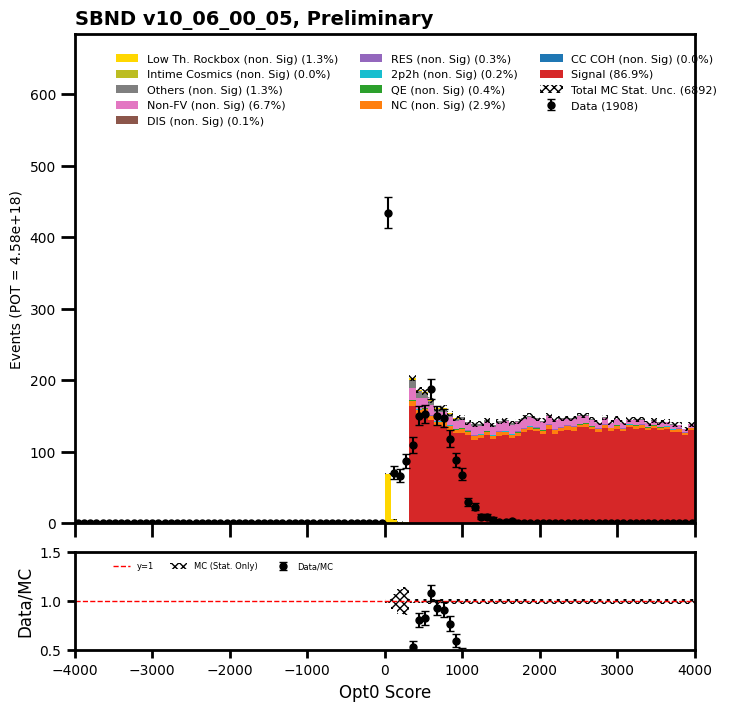

/tmp/ipykernel_1563/2477963852.py:130: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_1563/2477963852.py:131: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc
/tmp/ipykernel_1563/2477963852.py:185: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_1563/2477963852.py:189: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_1563/2477963852.py:190: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc


total data =  2025
[  0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0
   0   0   0   0   0   0   0   0   0   0   0   0   0   0 651 524 434 332
  84   0   0   0   0   0   0   0]
[   0.          0.          0.          0.          0.          0.
    0.          0.          0.          0.          0.          0.
    0.          0.          0.          0.          0.          0.
    0.          0.          0.          0.          0.          0.
    0.          0.          0.          0.          0.          0.
    0.          0.       2406.0435   3007.783    3513.8835   3239.4026
  847.0745     16.684872    0.          0.          0.          0.
    0.          0.      ]
data ratio  [       nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan        nan        nan
        nan        nan

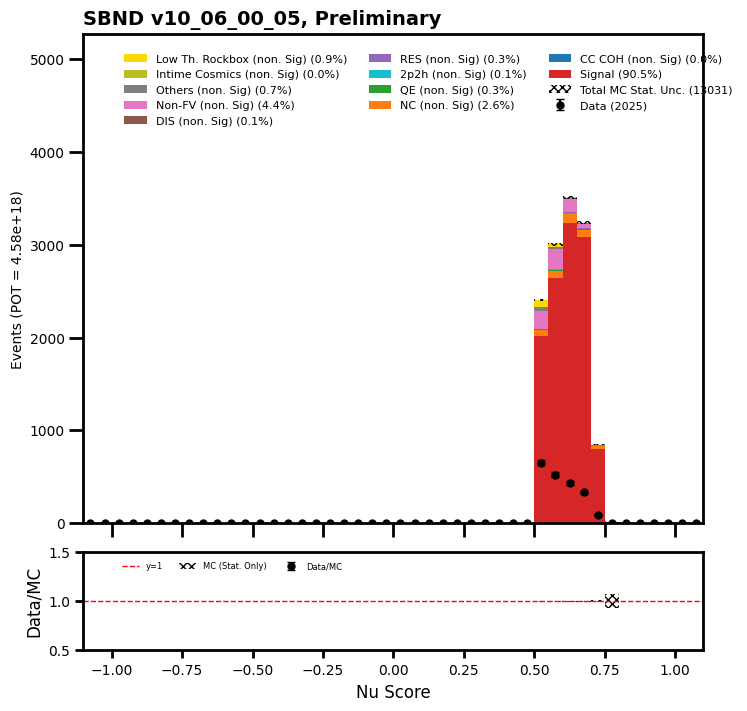

/tmp/ipykernel_1563/2477963852.py:130: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_1563/2477963852.py:131: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc
/tmp/ipykernel_1563/2477963852.py:185: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_1563/2477963852.py:189: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_1563/2477963852.py:190: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc


total data =  2025
[ 0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0 13 30 24 26 24 30
 49 35 39 40 32 43 37 36 39 31 43 48 45 33 41 39 53 37 35 43 28 27 34 32
 11  0  0 13 27 38 22 31 22 26 36 34 35 30 39 32 46 28 33 29 29 33 35 32
 39 38 26 33 34 28 20 31 29 20  0  0  0  0  0  0  0  0  0  0  0  0  0  0
  0  0  0  0]
[  0.         0.         0.         0.         0.         0.
   0.         0.         0.         0.         0.         0.
   0.         0.         0.         0.         0.         0.
  90.45589  154.98438  166.88783  192.5569   199.47043  212.86234
 224.43861  235.54     239.51047  238.7517   238.6978   245.61082
 255.38039  254.84888  253.01013  252.33833  248.86598  260.55038
 266.43387  261.02502  254.29593  261.54434  254.85822  263.1486
 271.71286  259.82938  262.5948   262.31946  255.7443   255.33344
  85.829704   0.         0.        84.681206 251.31747  245.86488
 249.46317  231.95552  241.69522  227.41786  243.57947  233.08409
 226.13312  220.77887  217.3782

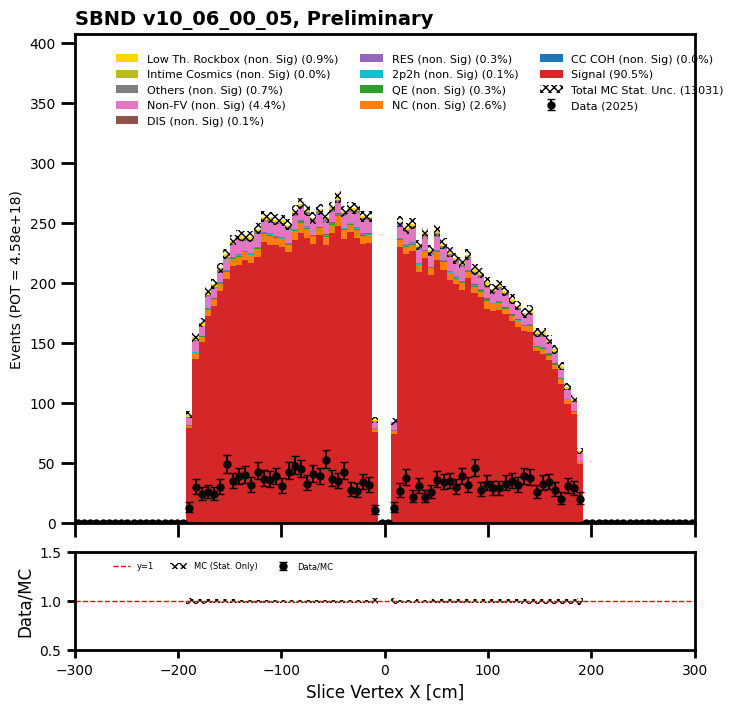

/tmp/ipykernel_1563/2477963852.py:130: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_1563/2477963852.py:131: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc
/tmp/ipykernel_1563/2477963852.py:185: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_1563/2477963852.py:189: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_1563/2477963852.py:190: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc


total data =  2025
[ 0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0 20 18 21 24 23 20
 22 25 33 29 29 37 43 22 29 34 43 36 33 35 33 34 20 36 28 31 29 33 28 31
 40 43 40 31 28 36 30 30 47 34 28 53 36 30 29 34 39 41 35 46 47 32 36 35
 22 28 27 35 41 27 33 21 18 14  0  0  0  0  0  0  0  0  0  0  0  0  0  0
  0  0  0  0]
[  0.         0.         0.         0.         0.         0.
   0.         0.         0.         0.         0.         0.
   0.         0.         0.         0.         0.         0.
  84.97811  145.525    155.41939  176.92114  183.73778  188.95139
 188.86485  191.69957  207.27927  205.39633  200.58054  206.45589
 211.98453  218.2921   224.82465  213.40013  216.191    215.53102
 224.14326  219.86987  232.7118   237.52658  233.68556  245.19138
 234.36978  227.86646  235.65347  233.23839  233.47775  237.08592
 240.49483  240.56184  234.7107   239.60522  235.16818  235.68726
 232.88931  232.89209  222.62213  221.6873   228.93867  224.71317
 231.41925  224.10059  218.910

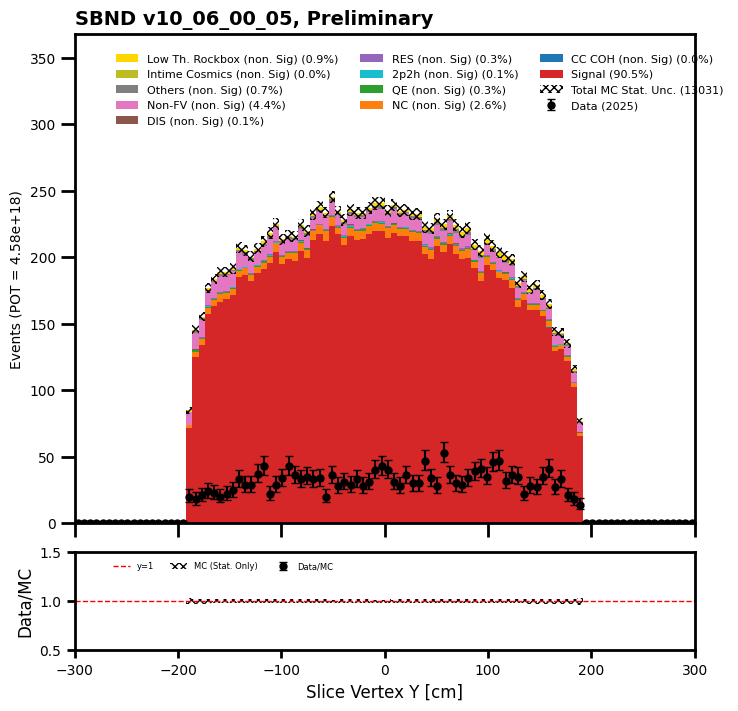

/tmp/ipykernel_1563/2477963852.py:130: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_1563/2477963852.py:131: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc
/tmp/ipykernel_1563/2477963852.py:185: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_1563/2477963852.py:189: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_1563/2477963852.py:190: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc


total data =  2025
[ 0  0  0  0  0  0  0  0  0  0  0  0  0  0  0 17 30 35 41 29 36 41 25 29
 34 43 34 28 48 28 25 30 37 37 21 25 33 29 26 31 27 42 26 31 29 29 32 42
 34 27 42 31 21 35 41 37 37 44 22 30 22 26 27 32 35 27 35 30 40 43 34 29
 36 28 34 26 22 28 20  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0
  0  0  0  0]
[  0.        0.        0.        0.        0.        0.        0.
   0.        0.        0.        0.        0.        0.        0.
   0.       65.69803 209.68674 210.82101 217.28665 221.77724 224.42792
 225.74605 213.84448 193.3961  245.09908 218.84201 220.65125 215.1316
 220.13954 208.46863 213.30489 214.01794 211.78802 207.56926 209.58171
 206.49878 214.49286 207.62283 215.36487 209.14941 205.86928 204.94768
 206.54025 204.21213 210.65341 207.95068 205.26405 206.95428 207.33073
 203.46654 196.68347 207.41869 219.09544 204.14539 206.95377 212.10071
 206.29167 210.78424 214.88298 211.10147 206.4142  207.53603 199.48578
 200.249   209.42702 203.1616  198.51517 199.03

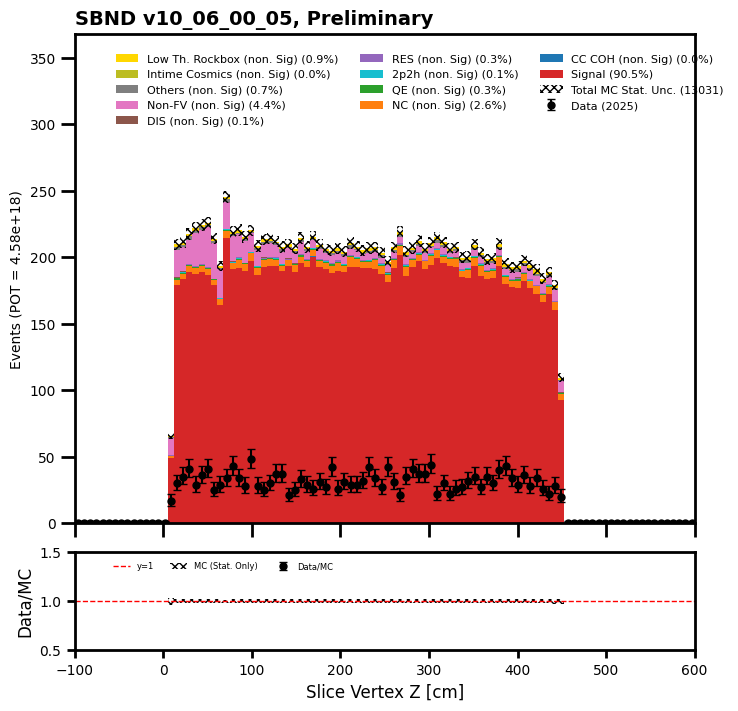

/tmp/ipykernel_1563/2477963852.py:130: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_1563/2477963852.py:131: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc
/tmp/ipykernel_1563/2477963852.py:185: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_1563/2477963852.py:189: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_1563/2477963852.py:190: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc


total data =  1952
[  0   0   0  21  29  56  64  78  98  87 109 101  94  86  82  72  88  67
  81  56  76  59  57  58  51  41  41  41  32  20  36  24  27  20  24  21
  12  16  17  10]
[  0.         0.         0.       235.04213  396.15057  508.20657
 619.7108   673.07825  688.9317   665.2866   652.9955   625.3157
 593.80963  562.88165  534.0869   494.21692  471.4333   431.31195
 411.04153  392.93774  354.88568  340.71417  313.10062  280.13565
 261.33633  237.65129  231.40817  207.98941  191.28918  164.92691
 149.16196  140.54736  127.74574  121.54169  112.81339  101.922745
  83.36173   76.425835  72.49124   67.812584]
data ratio  [       nan        nan        nan 0.08934568 0.07320449 0.11019141
 0.10327398 0.11588549 0.14224922 0.1307707  0.16692305 0.16151842
 0.15829989 0.15278523 0.15353306 0.14568502 0.1866648  0.15534
 0.19706038 0.14251621 0.21415347 0.17316568 0.1820501  0.20704255
 0.19515082 0.17252168 0.17717611 0.19712542 0.16728599 0.12126584
 0.2413484  0.17076094 0.211357

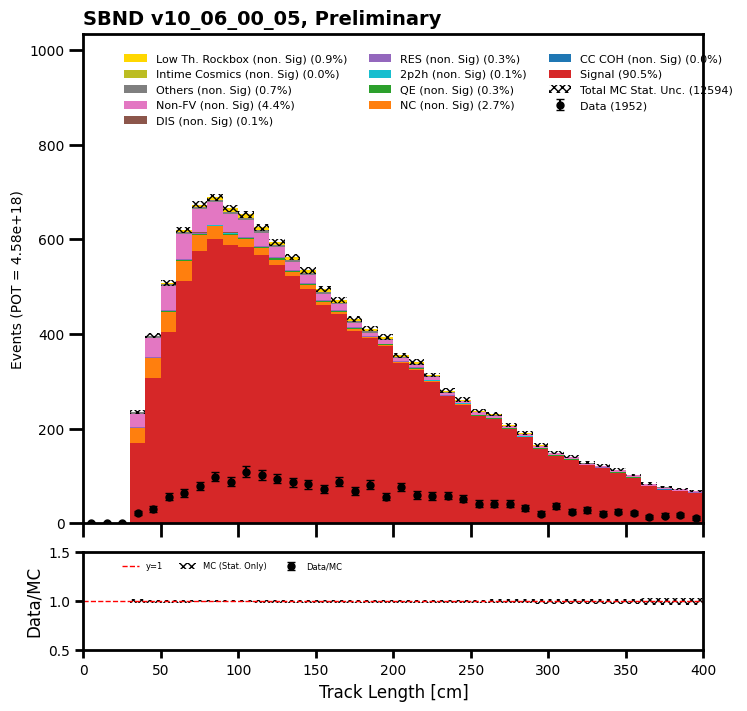

total data =  2025
[ 3  7  2  4  5  6  7 10  8  8  7  7  9 13 10 13 12 11 13 23 11 24 18 28
 19 14 23 15 27 17 25 24 31 24 31 40 32 29 32 41 29 29 26 27 29 20 33 25
 23 38 39 26 22 33 32 35 30 22 24 34 31 29 42 30 40 30 31 32 29 31 28 25
 31 24 22 24 21 17 18 26 18 18 27 12 15 11 10 10  6  7 10 12 11 10  7  5
  4  5  4  3]
[ 27.935678  41.924625  43.26735   56.456356  60.14571   59.06379
  71.65277   75.11462   77.235466  84.21336   83.40363   85.392395
  93.00968   96.947945 104.35885  109.75723  109.173584 117.20043
 116.65038  128.32225  127.641205 133.67809  128.32246  137.65921
 134.04659  146.2819   146.79993  153.71483  153.85504  155.15454
 156.11574  164.35028  162.15477  163.04163  170.3225   171.74844
 169.49915  171.96677  177.3982   177.77853  179.22878  172.72601
 165.3139   172.34563  170.29984  164.52902  171.54767  160.30405
 161.43808  169.40161  173.10619  162.02939  165.08324  165.61374
 164.24199  174.45563  178.86249  169.49887  180.557    177.59848
 168.70987  17

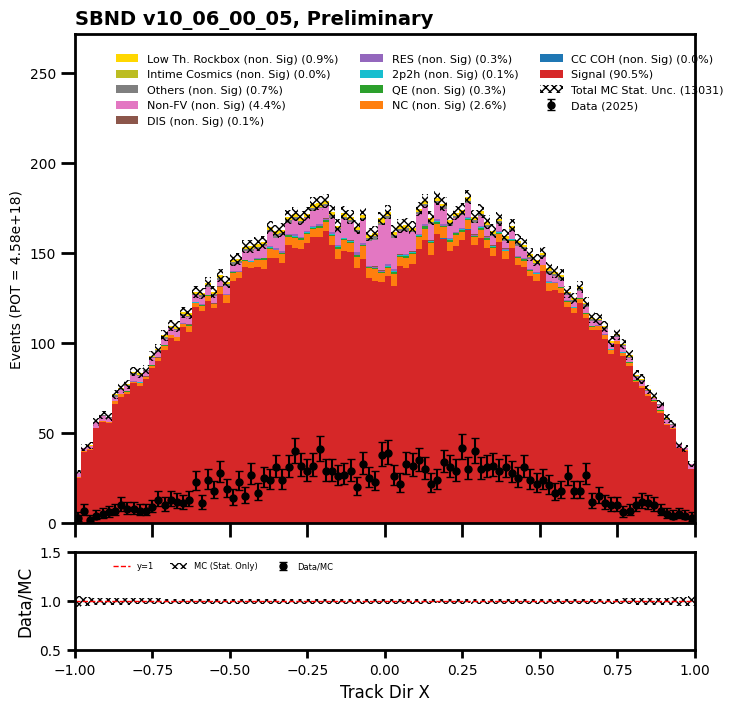

total data =  2025
[ 3  5  6  4  8  7  6  3  6  5  5 12 11 10 11 11 13  9 17 29 17 16 24 18
 25 17 18 16 21 22 33 33 27 15 25 25 25 22 39 22 21 29 22 17 28 24 24 25
 32 31 34 24 26 24 28 20 30 29 32 24 25 32 20 22 25 22 22 23 28 29 31 26
 16 24 26 29 31 31 18 22 28 22 15 21 24 25 25 21 23 19 17 17 10 10 26 17
  9  9 11  9]
[ 17.690512  25.242125  31.07363   34.828636  38.929317  41.57913
  44.782543  50.462624  51.033012  52.752617  60.802433  67.866035
  70.74522   76.304924  83.617836  89.29827   88.27004   94.69779
  97.01236  104.13253  104.40324  113.891785 111.48915  119.94954
 115.48124  121.193115 122.36102  132.43407  139.66022  148.51088
 157.06699  163.54736  169.75647  183.86427  181.12769  187.39047
 199.69058  198.86783  204.1799   212.27113  213.38585  212.92535
 211.65237  216.22609  212.39764  222.19212  210.94565  211.3165
 220.36005  226.99905  205.51886  215.9626   218.66135  211.83667
 215.45639  215.97499  217.44815  210.9152   211.77426  202.23972
 207.47574  201

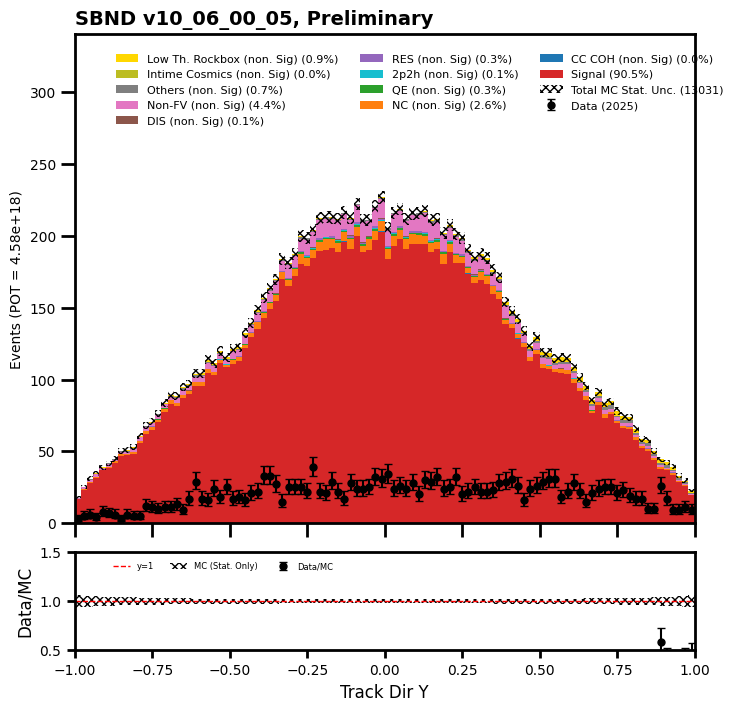

total data =  2025
[  9   8   7   5   8   4   6   1   1   3   2   9   7   4   1   5   7   5
   1   7   4   3   3   5   4   3   1   3   1   5   5   5   1   1   4   2
   1   3   2   5   3   2   1   3   2   4   4   6   3   4   4   3   5   3
   7  14   8  16  11   6   8  12  14  13   4  11  14  13  13  22  23  25
  20  25  24  29  26  31  22  29  39  38  40  28  38  56  47  65  63  61
  80  71  68  75  95 112 105 103  98  95]
[ 72.013336  62.3197    57.31045   49.962124  45.061295  37.56324
  32.67374   28.77892   24.397541  26.485853  27.80552   25.047935
  22.872322  20.416348  22.125988  25.06888   23.737923  26.57258
  24.959455  21.15117   24.494055  21.562508  23.649946  22.243801
  23.68256   23.53083   20.96695   20.934418  25.7057    25.20869
  26.095654  27.761423  24.948088  25.034742  25.099821  24.385988
  25.175304  25.099861  25.532501  24.764778  23.50941   24.926796
  24.385942  22.557358  25.099873  24.980701  24.62337   23.953272
  26.18222   32.998055  32.3382    32.857

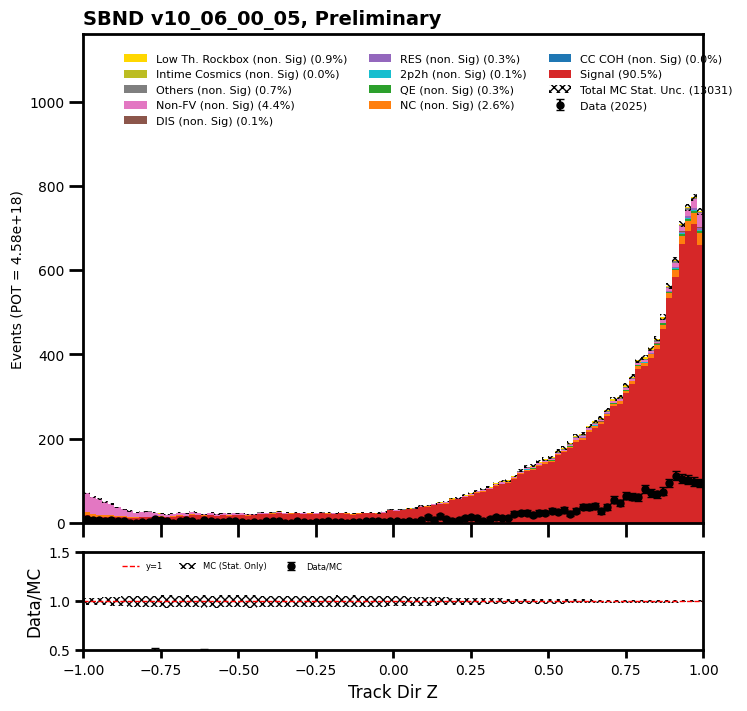

/tmp/ipykernel_1563/2477963852.py:130: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_1563/2477963852.py:131: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc
/tmp/ipykernel_1563/2477963852.py:185: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_1563/2477963852.py:189: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_1563/2477963852.py:190: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc


total data =  2025
[  0   0   0  17  90 161 216 232 191 179 163 150 124 101  90  65  55  51
  31  34  16  14  15  11  10   5   0   2   2   0   0   0   0   0   0   0
   0   0   0   0]
[0.0000000e+00 0.0000000e+00 0.0000000e+00 2.1579434e+02 9.3012854e+02
 1.4264329e+03 1.5234275e+03 1.4075591e+03 1.2698538e+03 1.0975811e+03
 9.4097571e+02 8.1156464e+02 6.7298553e+02 5.5154547e+02 4.7081802e+02
 3.5939182e+02 2.9812521e+02 2.5641937e+02 1.8891464e+02 1.5874005e+02
 1.2218414e+02 1.0340545e+02 7.9136429e+01 6.1788536e+01 5.4649754e+01
 1.9021027e+01 5.9544601e+00 2.6255951e+00 7.2360229e-01 5.2002716e-01
 0.0000000e+00 2.5878906e-01 8.6914062e-02 0.0000000e+00 8.6547852e-02
 0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00]
data ratio  [       nan        nan        nan 0.07877871 0.09676082 0.11286896
 0.14178555 0.16482434 0.15041102 0.16308591 0.17322445 0.18482816
 0.18425359 0.1831218  0.19115666 0.1808611  0.18448624 0.19889293
 0.16409527 0.21418665 0.13094989 0

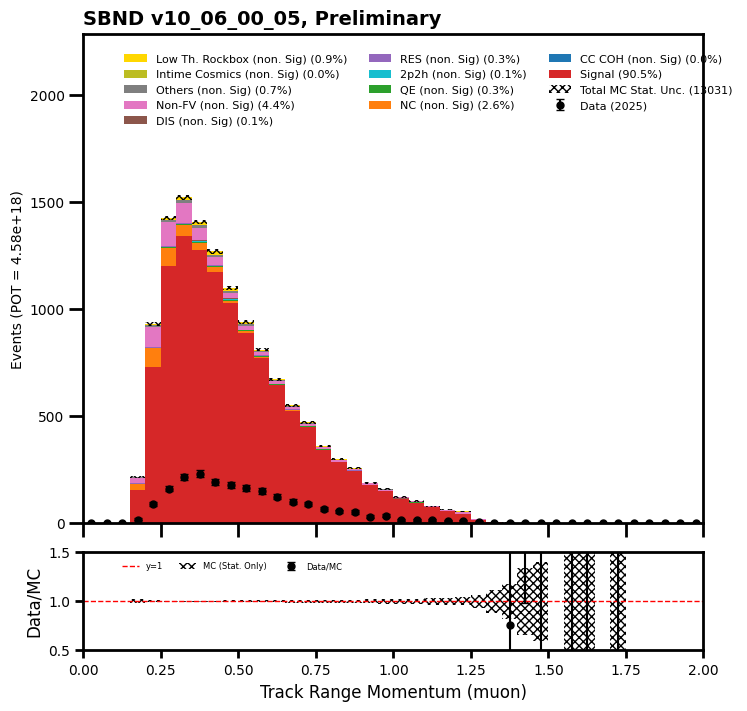

total data =  1974
[  0   0   0  14  49 102 174 132 175 132 149 128 142  97  69  83  89  81
  49  39  54  25  41  19  18  19   9  10   5   6   8   6   7  10   8   7
   5   8   2   3]
[8.6554505e-02 8.6554505e-02 4.1546168e+00 1.1475145e+02 4.2115109e+02
 7.3492261e+02 1.1347898e+03 7.8839874e+02 1.1671536e+03 7.3144788e+02
 8.6785925e+02 7.9963068e+02 8.6026526e+02 6.3874615e+02 4.5323615e+02
 5.1289697e+02 4.6268384e+02 4.7475400e+02 3.4224991e+02 2.4876471e+02
 3.2492557e+02 1.8621222e+02 2.4440640e+02 1.4114848e+02 1.5246062e+02
 1.5486795e+02 8.9034546e+01 1.1916698e+02 6.7681847e+01 7.8033653e+01
 8.2128426e+01 4.8601604e+01 5.9331326e+01 3.8746925e+01 3.9214409e+01
 4.6137581e+01 2.7315983e+01 3.8012749e+01 2.3352383e+01 3.0137762e+01]
data ratio  [0.         0.         0.         0.12200282 0.11634779 0.13879012
 0.15333236 0.16742797 0.14993742 0.18046399 0.17168683 0.1600739
 0.16506537 0.15186001 0.15223852 0.16182587 0.19235597 0.17061468
 0.14317024 0.15677465 0.16619191 0.

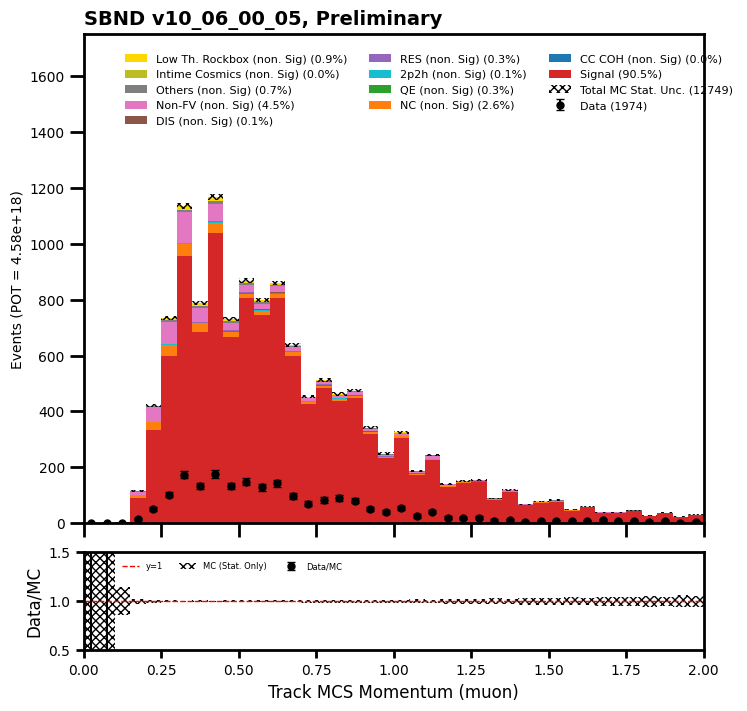

/tmp/ipykernel_1563/2477963852.py:130: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_1563/2477963852.py:131: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc
/tmp/ipykernel_1563/2477963852.py:185: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_1563/2477963852.py:189: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_1563/2477963852.py:190: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc


total data =  2025
[  0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0
   0   0   0   0   0   0   0   0   0   0   0   0  63  84 107 123 135 165
 161 191 216 160 174 197 138  80  30   1   0   0   0   0]
[   0.           0.           0.           0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.           0.
  562.3449     661.2736     784.2635     893.14105    983.69415
 1038.955     1103.6516    1128.3036    1164.8123    1127.9622
 1083.4501    1055.2523     853.28296    458.38574    124.114876
    7.9845886    0.           0.           0.           0.       ]
data ratio  [       nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan        nan        nan
        nan       

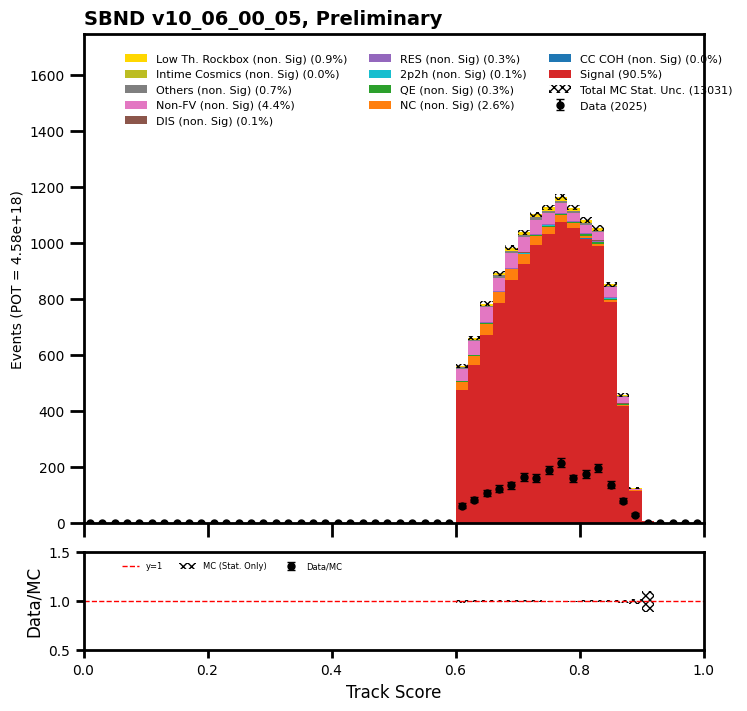

total data =  2002
[203 391 335 235 170 139 121  83  55  63  35  24  23  16  15  11  11  11
   6   5   8   2   2   3   3   5   2   4   1   3   2   1   2   1   3   1
   0   2   2   3]
[1175.4832    2304.0146    1909.4669    1473.1097    1217.0804
 1037.173      833.97406    650.1863     483.33923    358.95767
  262.5953     202.31796    161.3108     126.613945   104.290726
   88.67755     77.53914     61.428085    51.098595    49.120224
   36.1326      31.086996    29.034058    28.150589    20.054932
   19.882835    18.164131    16.080338    10.135941    13.247877
   12.4597845   10.677631     9.552253     9.228577     7.1761694
    5.543379     6.0615616    5.9222565    5.8570004    5.3718643]
data ratio  [0.17269495 0.16970378 0.17544164 0.15952647 0.13967852 0.13401815
 0.14508845 0.12765572 0.11379171 0.17550816 0.13328494 0.11862516
 0.14258189 0.12636839 0.1438287  0.12404492 0.14186384 0.17907118
 0.11742006 0.10179107 0.22140671 0.06433558 0.06888462 0.10656971
 0.14958914 0.251

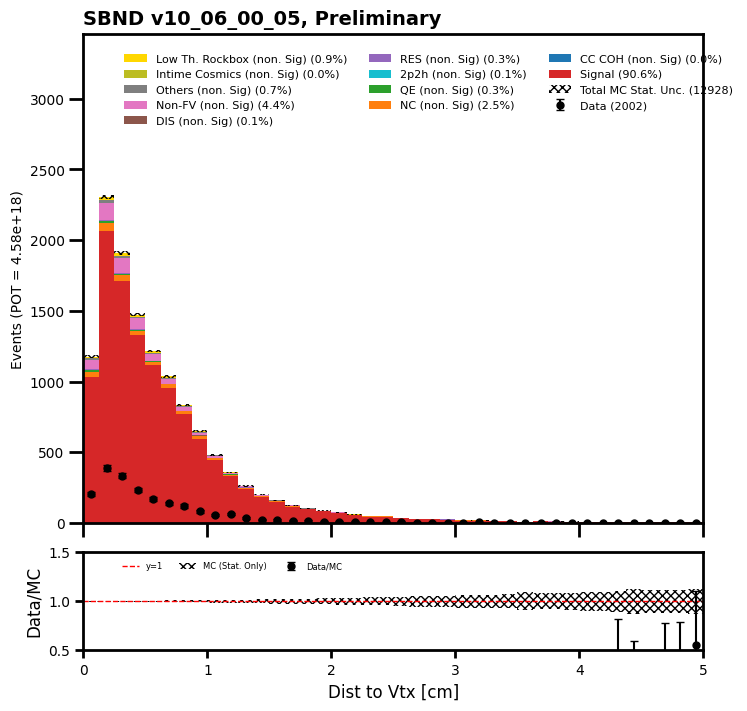

/tmp/ipykernel_1563/2477963852.py:130: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_1563/2477963852.py:131: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc
/tmp/ipykernel_1563/2477963852.py:185: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_1563/2477963852.py:189: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_1563/2477963852.py:190: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc


total data =  2025
[ 0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0 12 31 24 26 24 30
 49 35 39 39 35 41 35 38 38 34 40 49 46 31 43 39 51 38 35 44 25 29 34 33
 10  0  0 12 29 37 24 28 22 27 36 34 34 29 41 31 45 32 31 28 30 33 36 30
 41 36 27 33 33 29 21 29 31 19  0  0  0  0  0  0  0  0  0  0  0  0  0  0
  0  0  0  0]
[0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00
 0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00
 0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00
 0.0000000e+00 0.0000000e+00 0.0000000e+00 8.8205437e+01 1.5610957e+02
 1.6835927e+02 1.9151830e+02 1.9928621e+02 2.1460449e+02 2.2303233e+02
 2.3573451e+02 2.3942387e+02 2.3887086e+02 2.3873036e+02 2.4675719e+02
 2.5377902e+02 2.5590982e+02 2.5090018e+02 2.5374451e+02 2.4945056e+02
 2.6161026e+02 2.6494138e+02 2.6137100e+02 2.5521661e+02 2.6123047e+02
 2.5453284e+02 2.6502292e+02 2.6799765e+02 2.5962408e+02 2.6474979e+02
 2.6113742e+02 2.5771713e+02 2.54672

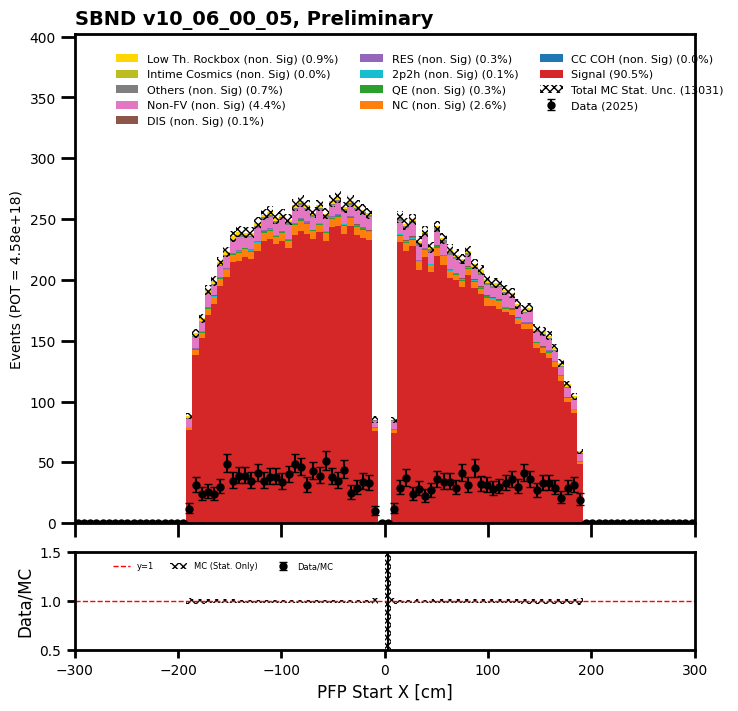

/tmp/ipykernel_1563/2477963852.py:130: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_1563/2477963852.py:131: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc
/tmp/ipykernel_1563/2477963852.py:185: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_1563/2477963852.py:189: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_1563/2477963852.py:190: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc


total data =  2025
[ 0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0 18 20 22 22 23 22
 21 25 31 32 28 35 44 24 29 33 44 33 35 38 31 32 22 34 31 30 31 30 29 27
 43 41 41 32 29 33 32 31 47 33 28 54 35 29 28 36 39 41 35 48 47 30 37 34
 24 26 29 32 43 28 32 21 16 15  0  0  0  0  0  0  0  0  0  0  0  0  0  0
  0  0  0  0]
[0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00
 0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00
 0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00
 0.0000000e+00 0.0000000e+00 1.7310901e-01 8.3019913e+01 1.4735294e+02
 1.5463017e+02 1.7864098e+02 1.8203943e+02 1.8811850e+02 1.8995732e+02
 1.9269534e+02 2.0645667e+02 2.0580765e+02 1.9990958e+02 2.0758115e+02
 2.1279576e+02 2.1739420e+02 2.2262822e+02 2.1363824e+02 2.1717577e+02
 2.1705630e+02 2.2175272e+02 2.2269379e+02 2.3024423e+02 2.3840332e+02
 2.3590302e+02 2.4381837e+02 2.3253809e+02 2.2960126e+02 2.3475348e+02
 2.3532980e+02 2.3044420e+02 2.37356

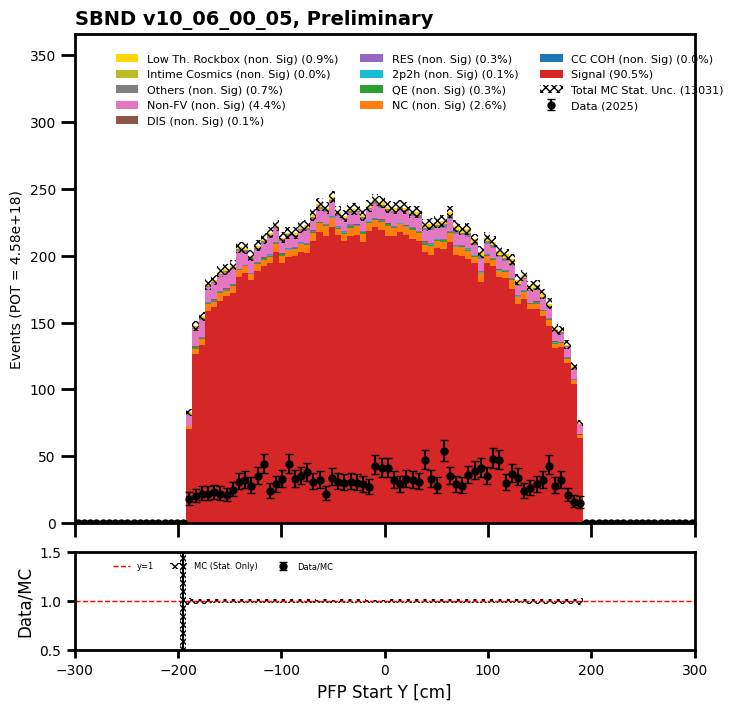

/tmp/ipykernel_1563/2477963852.py:130: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_1563/2477963852.py:131: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc
/tmp/ipykernel_1563/2477963852.py:185: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_1563/2477963852.py:189: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_1563/2477963852.py:190: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc


total data =  2025
[ 0  0  0  0  0  0  0  0  0  0  0  0  0  0  0 15 33 35 40 28 36 42 28 20
 40 42 34 26 49 28 27 29 38 36 21 24 33 30 27 32 26 42 25 32 28 28 35 38
 35 28 42 32 22 35 39 37 39 42 23 31 20 28 25 32 38 26 29 35 39 44 35 28
 34 30 34 26 19 31 20  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0
  0  0  0  0]
[  0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           1.5579814
  57.64852    208.82108    208.97144    219.30986    222.66423
 224.3088     225.44356    214.62341    183.03178    254.15387
 217.52243    223.47495    216.84142    215.91997    208.91231
 213.38051    214.19084    211.14958    207.66698    209.08383
 209.34422    212.85884    207.8285     216.86108    206.74496
 207.33244    205.42328    206.56291    204.5569     210.61116
 206.01202    205.81723    206.5422     208.00194    202.76216
 197.49547    206.85558    217.87274    206.5397     

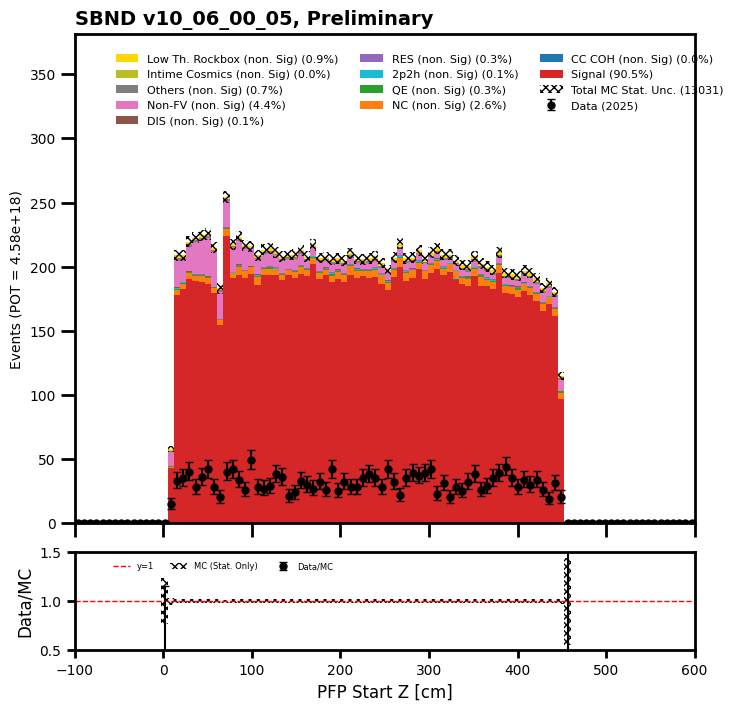

In [61]:

mc_bnb_cosmic_dfs["evt"] = mc_bnb_cosmic_dfs["evt"][(mc_bnb_cosmic_dfs["evt"].slc.nu_score > 0.5) & (mc_bnb_cosmic_dfs["evt"].slc.opt0.score > 320)]
mc_rockbox_dirt_dfs["evt"] = mc_rockbox_dirt_dfs["evt"][(mc_rockbox_dirt_dfs["evt"].slc.nu_score > 0.5) & (mc_bnb_cosmic_dfs["evt"].slc.opt0.score > 320)]
data_offbeam_light_dfs["evt"] = data_offbeam_light_dfs["evt"][(data_offbeam_light_dfs["evt"].slc.nu_score > 0.5) & (mc_bnb_cosmic_dfs["evt"].slc.opt0.score > 320)]
data_bnb_light_dfs["evt"] = data_bnb_light_dfs["evt"][(data_bnb_light_dfs["evt"].slc.nu_score > 0.5) & (mc_bnb_cosmic_dfs["evt"].slc.opt0.score > 320)]

#fractions_clear_cosmic_cosmiccut, fractions_nu_score_cosmiccut, fractions_vtx_x_cosmiccut, fractions_vtx_y_cosmiccut, fractions_vtx_z_cosmiccut, fractions_trk_len = draw_reco_valid_plots(mc_matchdf, data_evt_df, "nu_score")
draw_reco_valid_plots(mc_bnb_cosmic_dfs["evt"], mc_rockbox_dirt_dfs["evt"], data_offbeam_light_dfs["evt"], data_bnb_light_dfs["evt"], "a_vtx_fv_and_not_clear_cosmic_nu_score")

/tmp/ipykernel_1563/2477963852.py:130: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_1563/2477963852.py:131: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc
/tmp/ipykernel_1563/2477963852.py:185: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_1563/2477963852.py:189: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_1563/2477963852.py:190: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc


total data =  1980
[1980    0]
[12749.61178822     0.        ]
data ratio  [0.15529885        nan]


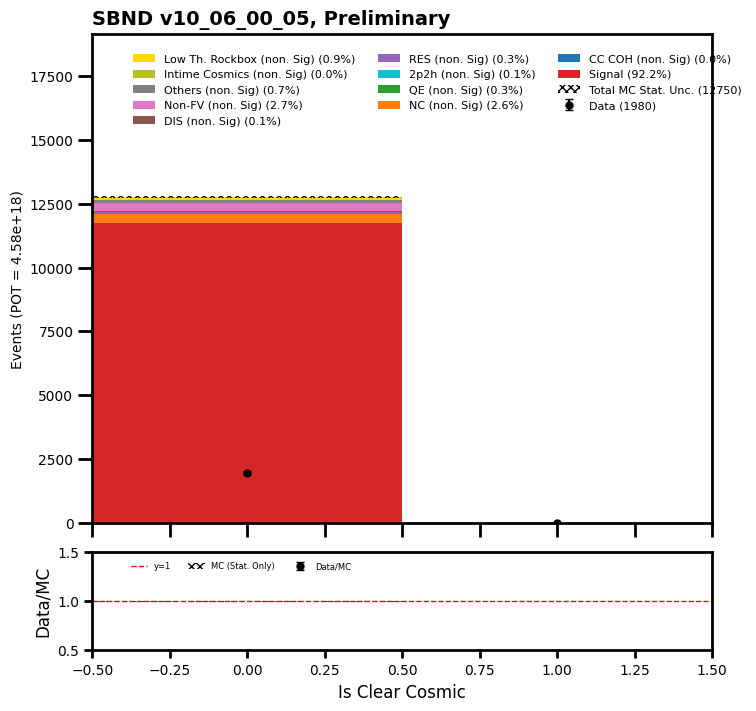

/tmp/ipykernel_1563/2477963852.py:130: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_1563/2477963852.py:131: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc


total data =  1865
[  0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0
   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0
   0   0   0   0   0   0   0   0   0   0   0   0   0   0 416  70  66  85
 107 146 148 184 147 143 116  87  68  29  23   9   9   5   2   2   3   0
   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0
   0   0   0   0   0   0   0   0   0   0]
[  0.          0.          0.          0.          0.          0.
   0.          0.          0.          0.          0.          0.
   0.          0.          0.          0.          0.          0.
   0.          0.          0.          0.          0.          0.
   0.          0.          0.          0.          0.          0.
   0.          0.          0.          0.          0.          0.
   0.          0.          0.          0.          0.          0.
   0.          0.          0.          0.          0.          0.
   0.          0.         67.30574     5.17739

/tmp/ipykernel_1563/2477963852.py:185: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_1563/2477963852.py:189: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_1563/2477963852.py:190: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc


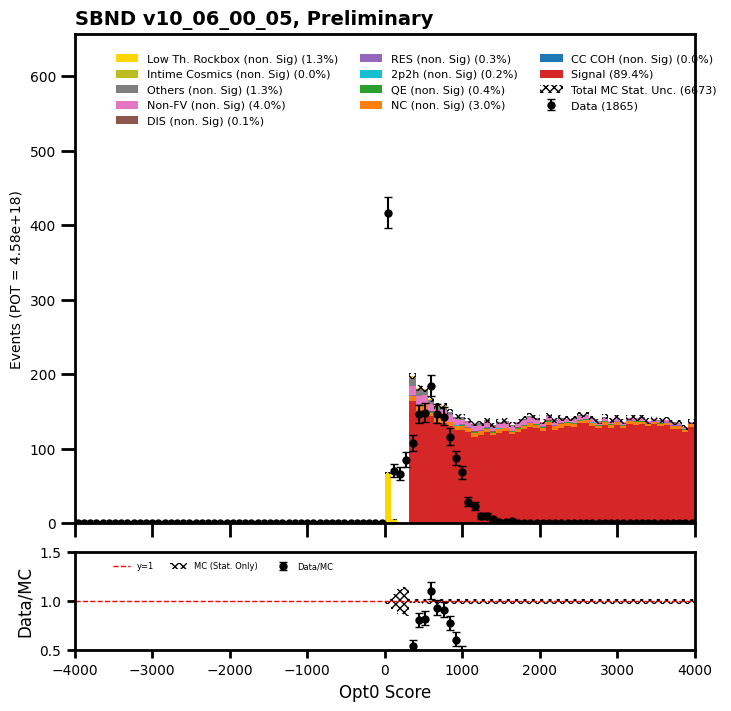

/tmp/ipykernel_1563/2477963852.py:130: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_1563/2477963852.py:131: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc
/tmp/ipykernel_1563/2477963852.py:185: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_1563/2477963852.py:189: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_1563/2477963852.py:190: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc


total data =  1980
[  0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0
   0   0   0   0   0   0   0   0   0   0   0   0   0   0 631 507 427 331
  84   0   0   0   0   0   0   0]
[   0.          0.          0.          0.          0.          0.
    0.          0.          0.          0.          0.          0.
    0.          0.          0.          0.          0.          0.
    0.          0.          0.          0.          0.          0.
    0.          0.          0.          0.          0.          0.
    0.          0.       2326.1199   2899.6887   3443.3132   3219.2441
  844.5643     16.683895    0.          0.          0.          0.
    0.          0.      ]
data ratio  [       nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan        nan        nan
        nan        nan

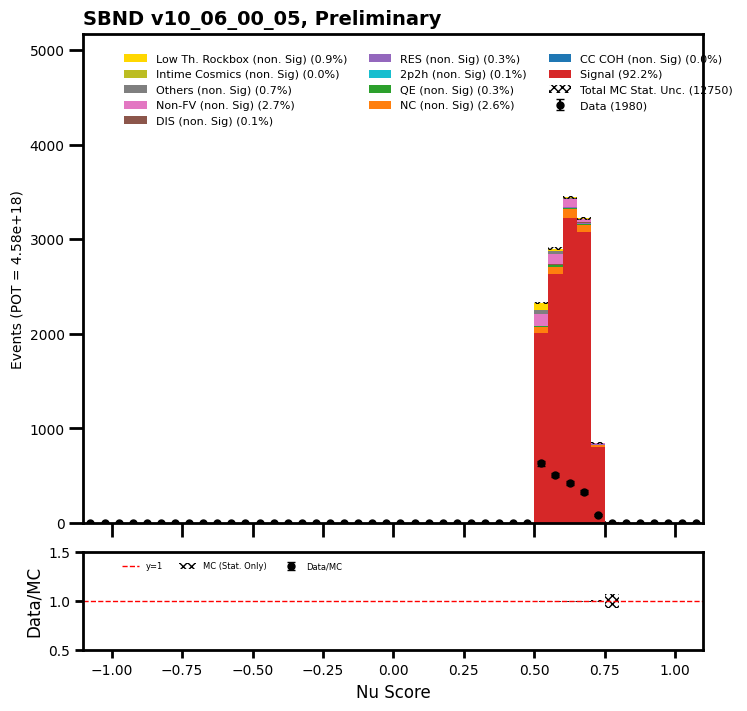

/tmp/ipykernel_1563/2477963852.py:130: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_1563/2477963852.py:131: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc
/tmp/ipykernel_1563/2477963852.py:185: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_1563/2477963852.py:189: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_1563/2477963852.py:190: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc


total data =  1980
[ 0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0 13 29 23 26 24 29
 48 34 38 40 32 41 35 35 38 31 42 48 45 33 40 39 51 36 34 43 27 27 34 32
 11  0  0 13 27 38 21 31 21 26 34 33 33 28 38 30 46 26 32 29 27 30 35 32
 39 37 26 31 34 28 19 31 27 20  0  0  0  0  0  0  0  0  0  0  0  0  0  0
  0  0  0  0]
[  0.         0.         0.         0.         0.         0.
   0.         0.         0.         0.         0.         0.
   0.         0.         0.         0.         0.         0.
  88.9519   151.14342  164.17209  188.4562   196.17017  209.31342
 220.68414  231.63391  234.54419  234.99721  234.51064  240.90431
 250.1542   250.88898  248.32578  247.94664  244.73338  254.6879
 261.6962   255.6157   248.93446  255.74597  249.57964  258.61566
 266.6063   255.06984  257.54147  256.6293   249.79355  250.57416
  84.18565    0.         0.        83.55584  245.39879  239.88303
 243.31813  226.61171  235.31146  220.6883   238.31989  228.58496
 220.15031  214.60165  211.5696

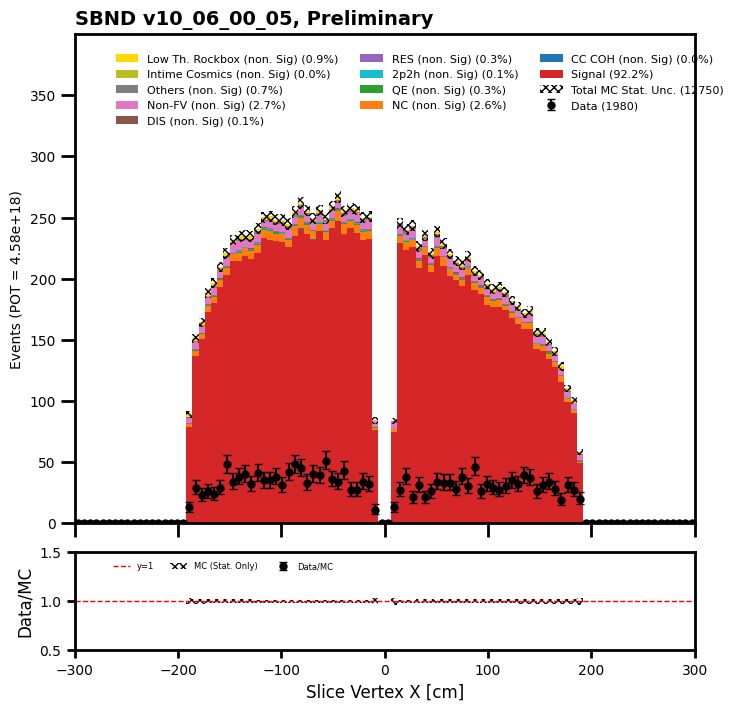

/tmp/ipykernel_1563/2477963852.py:130: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_1563/2477963852.py:131: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc
/tmp/ipykernel_1563/2477963852.py:185: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_1563/2477963852.py:189: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_1563/2477963852.py:190: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc


total data =  1980
[ 0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0 20 18 21 24 23 20
 20 25 33 26 28 37 42 20 29 33 41 34 32 35 33 31 20 35 28 31 27 33 26 31
 40 43 39 31 27 36 30 30 46 33 28 52 33 30 28 34 38 39 34 45 46 31 36 34
 22 28 25 34 40 27 33 21 18 13  0  0  0  0  0  0  0  0  0  0  0  0  0  0
  0  0  0  0]
[  0.        0.        0.        0.        0.        0.        0.
   0.        0.        0.        0.        0.        0.        0.
   0.        0.        0.        0.       83.355   142.43048 151.01543
 173.68594 181.04341 184.99133 184.5799  188.11827 201.7611  201.51169
 195.99312 201.33838 206.22905 213.35966 219.02615 208.36937 210.8794
 210.9445  219.03673 214.52629 228.38478 230.97011 229.69298 240.05273
 229.78226 221.68896 230.8605  227.66602 228.55457 231.9791  236.01576
 235.196   229.8317  233.94669 229.91019 230.32141 228.6481  227.20195
 217.13718 216.1032  224.04816 220.78656 225.74933 219.92105 214.37592
 218.2517  206.03722 200.25256 209.10428 205.21

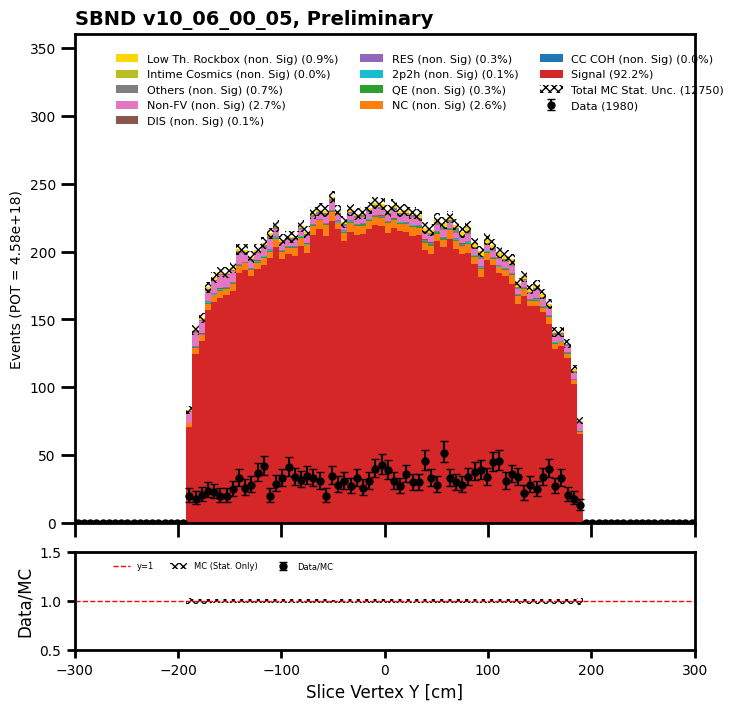

/tmp/ipykernel_1563/2477963852.py:130: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_1563/2477963852.py:131: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc
/tmp/ipykernel_1563/2477963852.py:185: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_1563/2477963852.py:189: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_1563/2477963852.py:190: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc


total data =  1980
[ 0  0  0  0  0  0  0  0  0  0  0  0  0  0  0 17 30 34 37 26 29 38 22 27
 33 41 32 27 48 25 24 30 37 37 21 25 32 29 26 31 27 42 26 30 28 29 32 42
 34 27 42 30 21 35 40 37 37 44 21 30 21 26 26 32 35 27 35 29 40 41 34 29
 36 27 34 26 22 28 20  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0
  0  0  0  0]
[  0.        0.        0.        0.        0.        0.        0.
   0.        0.        0.        0.        0.        0.        0.
   0.       64.7348  204.74193 202.1003  202.51802 199.47728 201.9667
 201.15459 190.31429 175.90266 230.0831  204.44301 209.62758 202.48514
 211.53874 201.87973 207.56017 208.70572 207.74182 203.17686 206.52046
 202.77734 211.46391 205.3723  212.73424 207.12674 204.39845 202.92464
 204.37756 202.30856 208.94485 206.48035 204.313   205.45139 206.46622
 202.60153 195.38672 206.29308 218.0598  202.55496 205.74356 211.14868
 205.25407 210.26495 214.10551 210.41006 206.36183 206.32338 198.27313
 199.55466 208.64809 202.3817  197.90836 198.25

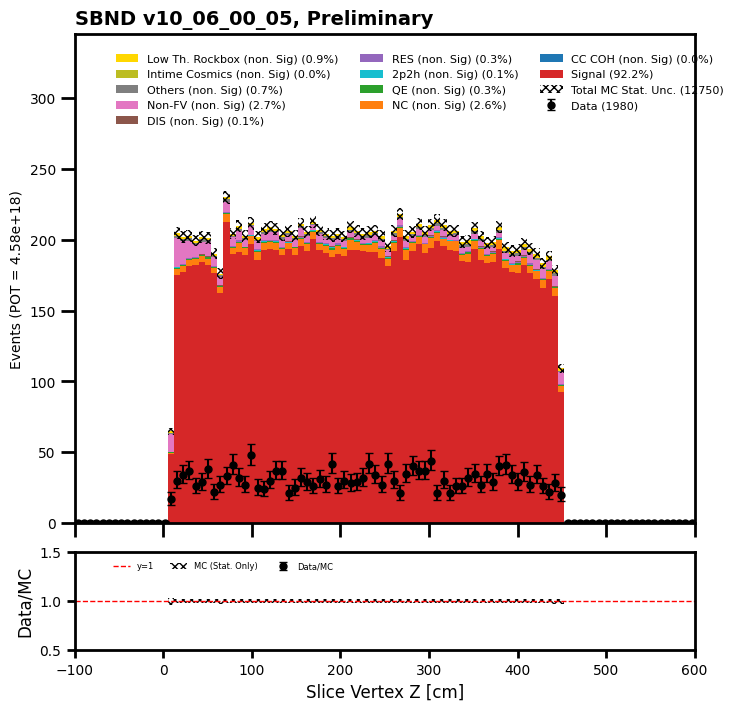

/tmp/ipykernel_1563/2477963852.py:130: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_1563/2477963852.py:131: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc
/tmp/ipykernel_1563/2477963852.py:185: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_1563/2477963852.py:189: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_1563/2477963852.py:190: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc


total data =  1909
[  0   0   0  20  25  46  62  75  93  85 108  99  94  84  81  71  88  67
  81  56  75  58  57  58  51  41  41  41  31  20  36  22  26  20  24  20
  12  16  15  10]
[  0.         0.         0.       215.5452   372.42368  477.8792
 590.5768   647.87286  665.2493   647.57587  636.31396  613.7533
 584.5914   556.4552   527.40314  487.8671   467.30396  427.59235
 407.9263   389.87796  351.39096  337.97845  311.16498  277.88345
 259.9506   235.8858   229.20996  206.08633  188.43213  163.36807
 147.65515  139.04349  126.62062  120.07037  110.99588  100.36391
  82.06254   74.953545  71.01993   67.207726]
data ratio  [       nan        nan        nan 0.09278796 0.06712785 0.09625863
 0.10498212 0.11576345 0.13979721 0.13125875 0.16972753 0.1613026
 0.16079608 0.15095555 0.1535827  0.14553144 0.18831426 0.1566913
 0.19856528 0.14363469 0.21343748 0.17160857 0.18318257 0.2087206
 0.19619113 0.17381292 0.1788753  0.19894575 0.16451547 0.12242294
 0.24381134 0.15822388 0.2053378 

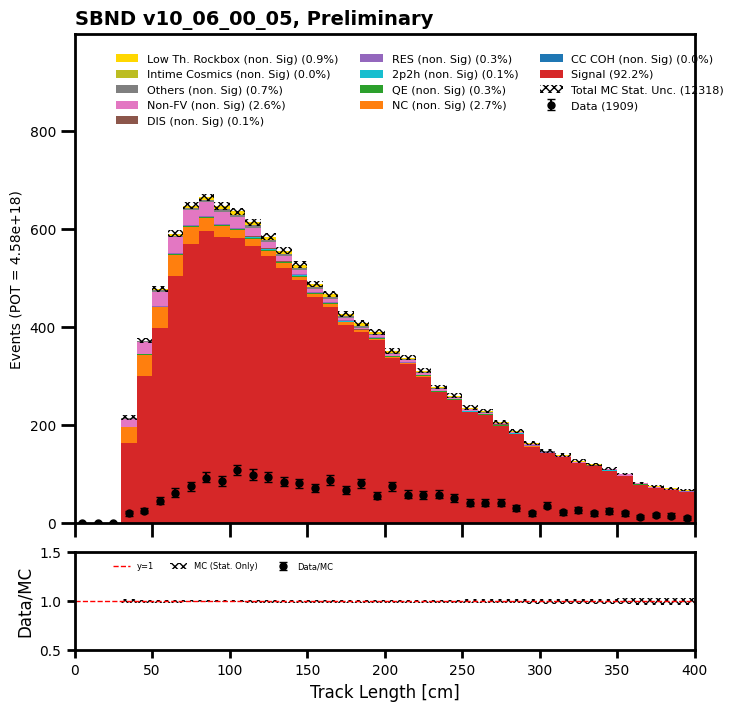

total data =  1980
[ 3  7  2  4  5  6  7 10  8  7  7  7  9 11 10 13 12 11 12 23 11 24 18 28
 19 13 22 15 27 17 25 24 30 24 31 38 28 27 32 41 28 26 25 25 28 19 31 24
 23 38 36 25 22 31 32 33 30 22 24 32 31 29 42 28 40 30 30 32 29 30 26 25
 31 24 22 23 21 17 18 26 18 17 27 12 15 11 10 10  6  7 10 12 11 10  7  5
  4  5  4  3]
[ 28.022232  41.23219   42.834564  55.55826   59.712917  58.458
  71.04692   74.07602   76.02376   83.00165   82.15929   84.873085
  91.59222   95.303375 103.02792  107.90707  107.52906  115.72891
 115.00588  125.81219  125.70433  131.48167  126.03937  135.57092
 131.53653  144.11784  144.51732  151.11783  150.13324  151.65955
 151.98279  160.27084  159.68707  157.265    165.79004  166.81612
 165.36676  167.95314  173.31981  172.31035  174.49008  167.70752
 160.74951  165.9514   165.02109  158.37395  164.84026  153.55295
 155.69395  161.75296  164.27806  155.53952  158.35477  160.12852
 159.19026  168.79793  174.03821  164.58647  176.02371  172.23349
 164.89099  168.

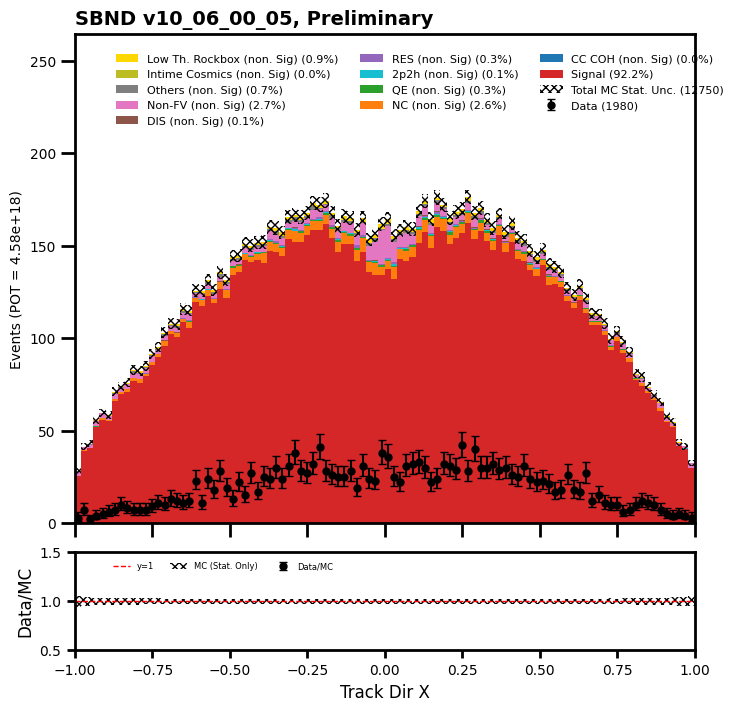

total data =  1980
[ 3  5  6  4  8  7  6  3  6  5  5 11 11  9 11 11 13  9 16 28 17 16 23 17
 25 16 18 16 19 22 33 33 25 15 24 25 25 21 39 21 21 29 22 16 27 24 24 24
 29 29 34 24 26 23 27 20 30 29 30 24 23 31 20 22 24 22 22 23 27 28 30 26
 16 24 26 29 31 31 17 22 26 21 15 20 24 25 23 21 22 18 17 16 10 10 26 16
  9  9 10  9]
[ 17.603958  24.722797  31.073626  34.655525  38.66965   40.97326
  44.522858  49.770203  50.77346   52.319824  60.02348   67.05452
  69.847115  74.83356   82.75229   88.51931   87.75064   93.312904
  95.50829  102.40147  102.93181  112.56094  110.190834 118.79169
 114.44262  119.28891  120.716515 130.63788  137.84259  145.58934
 153.57239  160.3658   166.29439  180.22923  176.94014  183.75572
 196.31645  194.28156  199.42041  206.04015  206.60289  207.7872
 205.16092  210.25429  207.51852  215.0953   203.58931  204.65244
 213.69572  219.72865  199.11539  209.29767  213.60938  206.21152
 209.57065  210.4364   210.92474  204.94278  206.25699  195.9227
 203.8952   196.

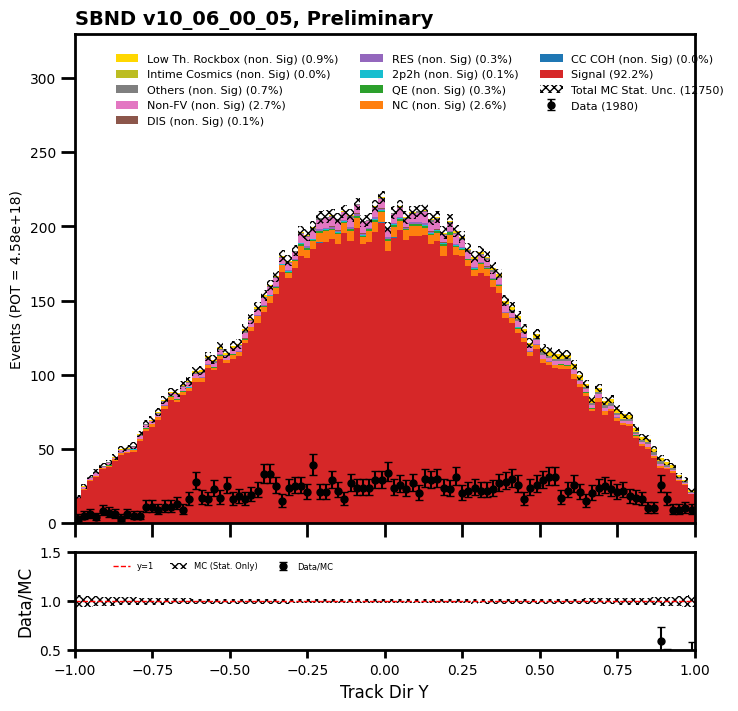

total data =  1980
[  4   4   2   3   4   4   3   1   1   2   1   9   4   2   0   4   5   4
   1   4   4   2   3   5   4   3   0   3   1   5   2   4   1   1   4   2
   1   3   2   5   2   2   1   3   2   4   4   6   3   4   4   3   5   3
   7  14   8  16  11   6   8  12  14  13   4  11  14  13  13  22  23  25
  20  25  24  29  26  31  22  29  39  38  40  28  38  56  47  65  63  61
  80  71  68  75  95 112 105 103  98  95]
[ 28.476433  24.494928  25.338898  24.8409    22.774855  22.677317
  21.184603  19.832325  17.862988  18.39344   19.518656  18.621382
  18.166348  16.694897  17.993227  20.384216  19.86488   22.5918
  20.881716  17.613125  21.194313  18.901152  21.075142  19.928581
  21.053728  20.86945   19.14954   19.20354   23.303932  23.585846
  24.732376  26.171177  23.736555  23.758041  23.195822  23.076721
  23.844585  23.390375  24.63459   23.314968  22.978981  24.288467
  23.541962  22.092178  24.721199  24.547985  24.363825  23.95331
  25.836082  32.792374  32.251743  32.565

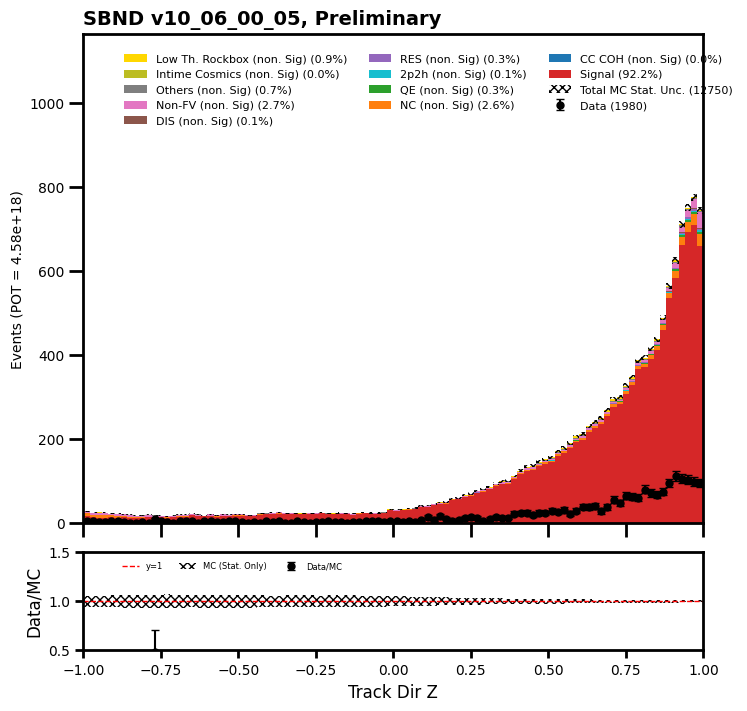

/tmp/ipykernel_1563/2477963852.py:130: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_1563/2477963852.py:131: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc
/tmp/ipykernel_1563/2477963852.py:185: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_1563/2477963852.py:189: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_1563/2477963852.py:190: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc


total data =  1980
[  0   0   0  16  76 155 210 229 188 178 163 148 124 101  89  65  52  50
  31  32  15  13  15  11  10   5   0   2   2   0   0   0   0   0   0   0
   0   0   0   0]
[0.0000000e+00 0.0000000e+00 0.0000000e+00 1.9814760e+02 8.7405115e+02
 1.3674740e+03 1.4782261e+03 1.3820195e+03 1.2531621e+03 1.0864100e+03
 9.3307019e+02 8.0455713e+02 6.6818994e+02 5.4732404e+02 4.6622803e+02
 3.5546167e+02 2.9532410e+02 2.5286894e+02 1.8562485e+02 1.5605609e+02
 1.2036566e+02 1.0141485e+02 7.8011307e+01 6.1527916e+01 5.4648777e+01
 1.9021027e+01 5.9544601e+00 2.6255951e+00 7.2360229e-01 5.2002716e-01
 0.0000000e+00 2.5878906e-01 8.6914062e-02 0.0000000e+00 8.6547852e-02
 0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00]
data ratio  [       nan        nan        nan 0.08074789 0.08695143 0.11334768
 0.14206217 0.16569954 0.1500205  0.16384237 0.17469211 0.18395213
 0.18557598 0.18453419 0.19089371 0.18286079 0.17607774 0.19773089
 0.1670035  0.20505448 0.12462026 0

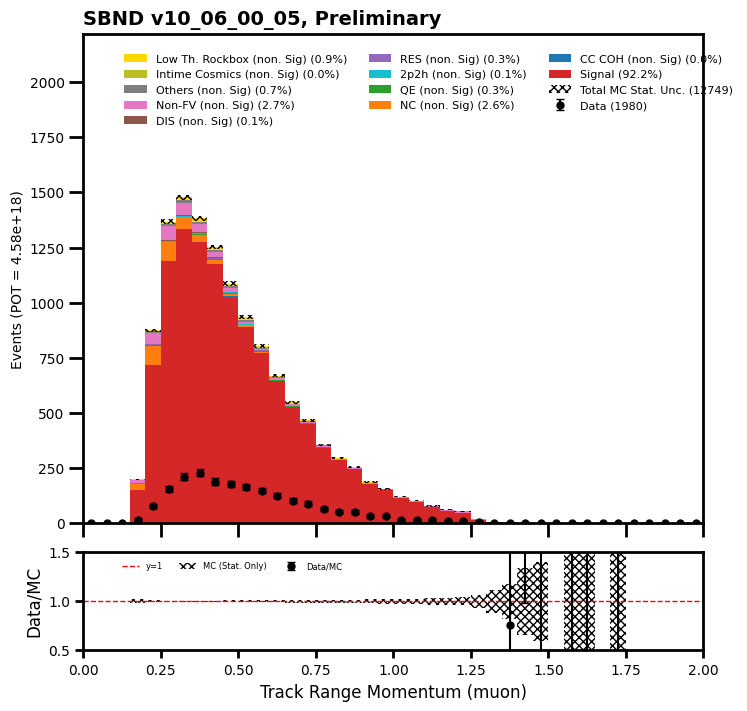

total data =  1930
[  0   0   0  10  45  99 166 129 170 130 148 126 141  96  68  81  89  79
  48  39  53  25  41  19  18  18   9  10   5   6   8   5   7  10   8   7
   5   8   2   2]
[8.65545049e-02 8.65545049e-02 4.15461683e+00 1.09460495e+02
 3.97391418e+02 6.93668213e+02 1.07955237e+03 7.61156799e+02
 1.13572473e+03 7.16804077e+02 8.53546814e+02 7.90631287e+02
 8.49761841e+02 6.31217712e+02 4.48272430e+02 5.08507385e+02
 4.58305298e+02 4.68920044e+02 3.38634949e+02 2.46394379e+02
 3.21720612e+02 1.84914001e+02 2.43386566e+02 1.40197067e+02
 1.51994705e+02 1.53989990e+02 8.83951645e+01 1.18734230e+02
 6.75943222e+01 7.75683517e+01 8.12631912e+01 4.82228508e+01
 5.90710716e+01 3.86607513e+01 3.85210495e+01 4.59644775e+01
 2.71425133e+01 3.74078903e+01 2.32638817e+01 2.98781185e+01]
data ratio  [0.         0.         0.         0.09135716 0.11323848 0.14271953
 0.15376744 0.16947888 0.14968416 0.18136058 0.17339412 0.15936632
 0.16592884 0.15208699 0.15169347 0.15928972 0.1941937  0.16

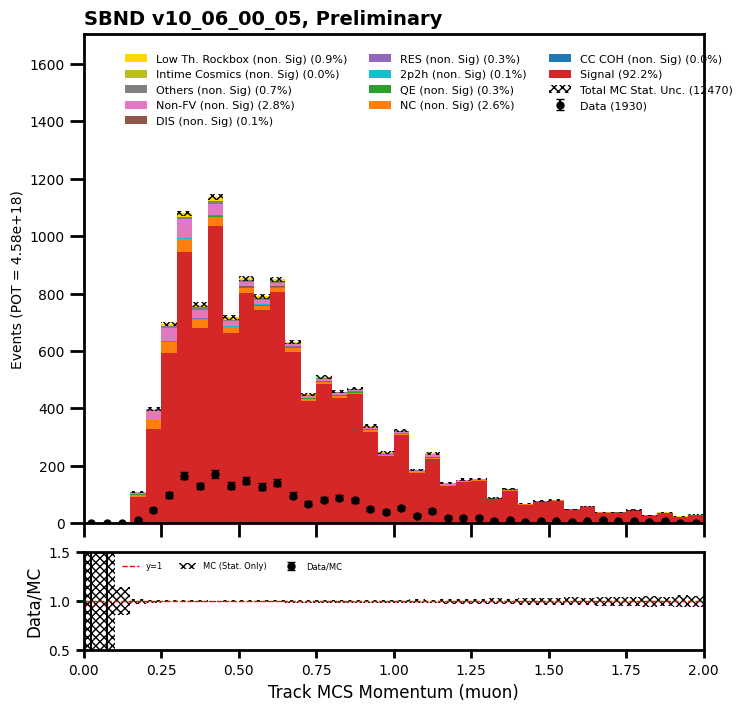

/tmp/ipykernel_1563/2477963852.py:130: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_1563/2477963852.py:131: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc


total data =  1980
[  0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0
   0   0   0   0   0   0   0   0   0   0   0   0  60  82 101 117 129 162
 160 188 213 158 173 194 138  74  30   1   0   0   0   0]
[   0.           0.           0.           0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.           0.
  541.83075    637.1565     759.2498     868.7677     956.05273
 1011.9122    1078.5165    1107.3497    1145.3292    1114.1285
 1068.3696    1043.9109     838.1556     447.91113    122.98878
    7.9845886    0.           0.           0.           0.       ]
data ratio  [       nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan        nan        nan
        nan        

/tmp/ipykernel_1563/2477963852.py:185: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_1563/2477963852.py:189: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_1563/2477963852.py:190: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc


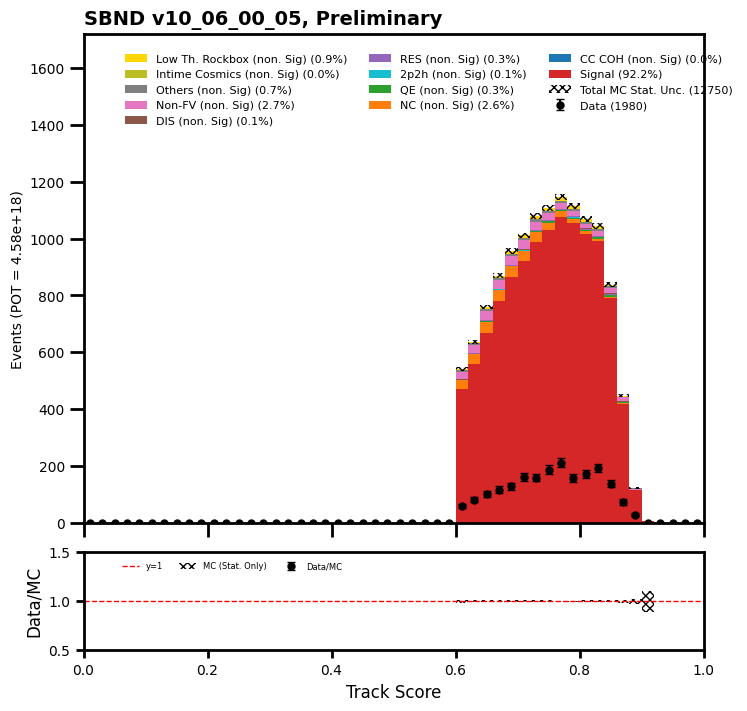

total data =  1958
[199 385 324 228 165 138 119  81  55  63  35  24  23  16  15  11  10  10
   6   4   8   2   2   2   3   5   2   4   1   3   2   1   1   1   3   1
   0   2   2   2]
[1148.3151    2247.2268    1854.1631    1431.8907    1190.7688
 1017.81       819.01276    641.29285    475.86234    355.89447
  259.9991     200.12158    159.34149    125.59765    103.77071
   88.15753     76.24056     60.735336    50.926476    48.426743
   35.266754    30.309042    28.687866    27.54377     19.709717
   19.622215    18.164139    15.6462555    9.877274    12.815138
   12.027648    10.417011     9.4666815    8.795471     6.8290014
    5.3708935    5.888466     5.836319     5.769476     5.2853165]
data ratio  [0.17329739 0.17132227 0.17474191 0.15923003 0.13856594 0.13558523
 0.14529688 0.12630735 0.11557965 0.17701877 0.13461584 0.1199271
 0.14434407 0.12739092 0.14454945 0.12477663 0.13116378 0.1646488
 0.11781691 0.08259899 0.22684254 0.06598691 0.06971589 0.0726117
 0.15220919 0.2548132

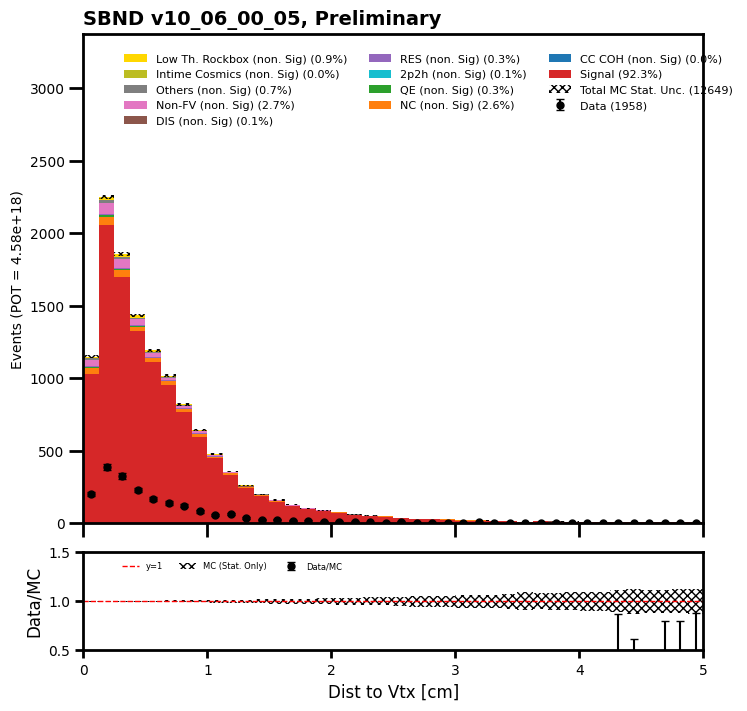

/tmp/ipykernel_1563/2477963852.py:130: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_1563/2477963852.py:131: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc
/tmp/ipykernel_1563/2477963852.py:185: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_1563/2477963852.py:189: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_1563/2477963852.py:190: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc


total data =  1980
[ 0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0 12 30 23 26 24 29
 48 34 38 39 35 39 34 36 37 34 39 49 46 31 42 39 49 37 34 44 25 28 34 33
 10  0  0 12 29 37 24 27 21 27 34 33 32 28 39 30 44 30 30 28 28 30 36 30
 41 35 27 31 33 29 20 29 29 19  0  0  0  0  0  0  0  0  0  0  0  0  0  0
  0  0  0  0]
[0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00
 0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00
 0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00
 0.0000000e+00 0.0000000e+00 0.0000000e+00 8.6614899e+01 1.5235518e+02
 1.6564352e+02 1.8759071e+02 1.9589932e+02 2.1079591e+02 2.1953760e+02
 2.3156879e+02 2.3497690e+02 2.3468359e+02 2.3454321e+02 2.4222404e+02
 2.4855260e+02 2.5195004e+02 2.4616196e+02 2.4931998e+02 2.4523180e+02
 2.5566086e+02 2.6028998e+02 2.5613525e+02 2.4985506e+02 2.5517242e+02
 2.4942723e+02 2.6040295e+02 2.6315073e+02 2.5469193e+02 2.5978302e+02
 2.5527515e+02 2.5185147e+02 2.49827

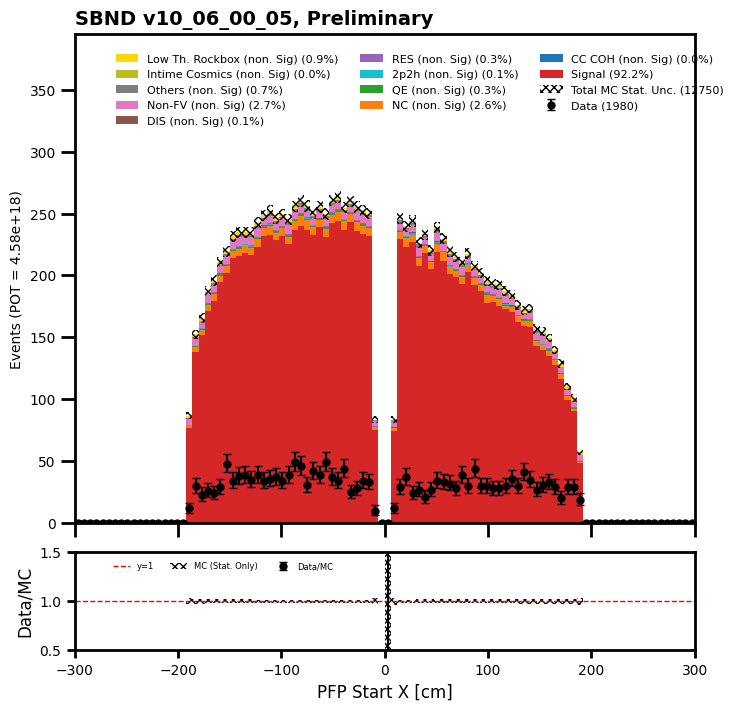

/tmp/ipykernel_1563/2477963852.py:130: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_1563/2477963852.py:131: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc
/tmp/ipykernel_1563/2477963852.py:185: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_1563/2477963852.py:189: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_1563/2477963852.py:190: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc


total data =  1980
[ 0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0 18 20 22 22 23 22
 19 25 31 29 27 35 43 22 29 32 42 31 35 37 31 29 22 33 31 30 29 30 27 27
 43 41 40 32 28 33 32 31 46 32 28 52 33 29 27 36 38 39 34 47 46 29 37 33
 24 26 27 31 42 28 32 21 16 14  0  0  0  0  0  0  0  0  0  0  0  0  0  0
  0  0  0  0]
[0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00
 0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00
 0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00
 0.0000000e+00 0.0000000e+00 1.7310901e-01 8.1656479e+01 1.4399876e+02
 1.5031276e+02 1.7557886e+02 1.7908539e+02 1.8407184e+02 1.8575893e+02
 1.8902740e+02 2.0085205e+02 2.0192300e+02 1.9540872e+02 2.0269063e+02
 2.0710565e+02 2.1199620e+02 2.1726260e+02 2.0834808e+02 2.1203702e+02
 2.1264301e+02 2.1644028e+02 2.1738216e+02 2.2583138e+02 2.3210651e+02
 2.3165091e+02 2.3841959e+02 2.2821104e+02 2.2350934e+02 2.2952754e+02
 2.2975816e+02 2.2560719e+02 2.32769

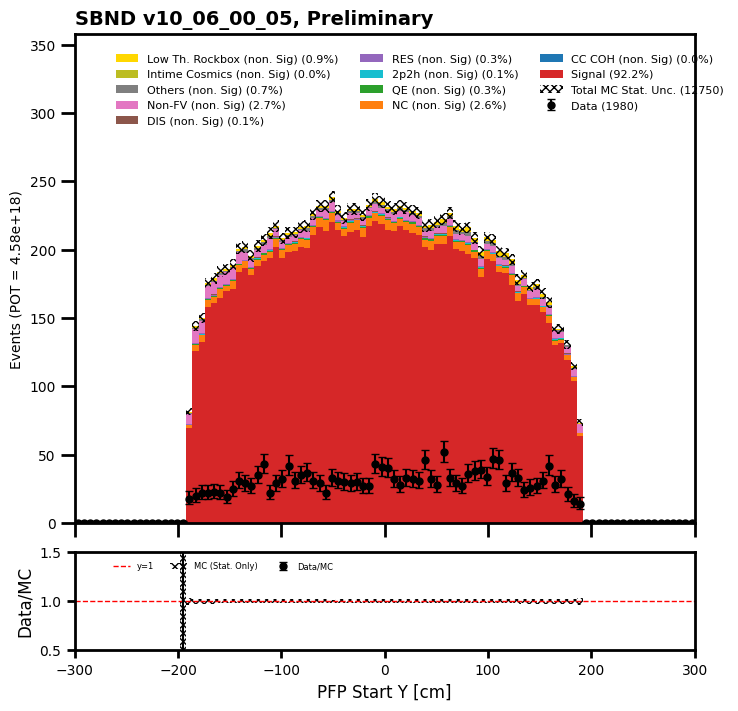

/tmp/ipykernel_1563/2477963852.py:130: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_1563/2477963852.py:131: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc
/tmp/ipykernel_1563/2477963852.py:185: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_1563/2477963852.py:189: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_1563/2477963852.py:190: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc


total data =  1980
[ 0  0  0  0  0  0  0  0  0  0  0  0  0  0  0 15 33 34 35 26 29 39 24 19
 39 40 32 26 47 26 26 29 38 36 21 24 32 30 27 32 26 42 25 31 27 28 35 38
 35 28 42 31 22 34 39 37 39 42 22 30 20 28 24 32 38 26 29 34 39 42 35 28
 34 29 34 26 19 31 20  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0
  0  0  0  0]
[  0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           1.5579814
  56.685295   203.78969    200.07768    204.24905    200.48329
 201.4148     201.19833    191.2662     164.84604    240.09
 203.55615    211.4127     204.54068    207.4057     202.1508
 208.06853    208.70552    207.10338    203.44768    205.93628
 205.62303    209.65656    205.83786    214.1434     204.80785
 205.77556    203.40073    204.48677    202.39417    209.0757
 204.62775    204.86569    205.12537    206.9653     201.89716
 196.37181    205.6444     216.83514    204.95026    205.5

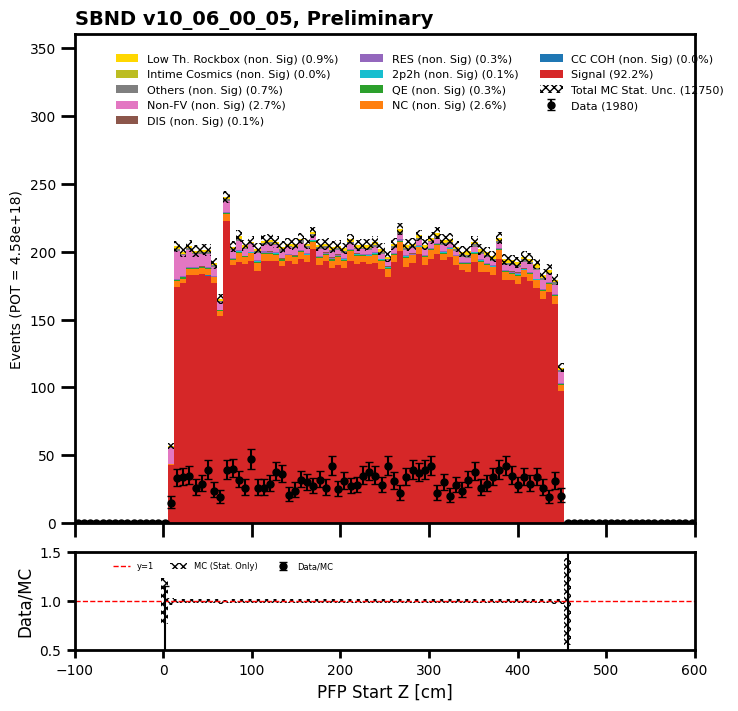

In [62]:
#muon candidates low z

mc_bnb_cosmic_dfs["evt"] = mc_bnb_cosmic_dfs["evt"][HasMuonCandidate_lowZ(mc_bnb_cosmic_dfs["evt"])]
mc_rockbox_dirt_dfs["evt"] = mc_rockbox_dirt_dfs["evt"][HasMuonCandidate_lowZ(mc_rockbox_dirt_dfs["evt"])]
data_offbeam_light_dfs["evt"] = data_offbeam_light_dfs["evt"][HasMuonCandidate_lowZ(data_offbeam_light_dfs["evt"])]
data_bnb_light_dfs["evt"] = data_bnb_light_dfs["evt"][HasMuonCandidate_lowZ(data_bnb_light_dfs["evt"])]

#fractions_clear_cosmic_cosmiccut, fractions_nu_score_cosmiccut, fractions_vtx_x_cosmiccut, fractions_vtx_y_cosmiccut, fractions_vtx_z_cosmiccut, fractions_trk_len = draw_reco_valid_plots(mc_matchdf, data_evt_df, "nu_score")
draw_reco_valid_plots(mc_bnb_cosmic_dfs["evt"], mc_rockbox_dirt_dfs["evt"], data_offbeam_light_dfs["evt"], data_bnb_light_dfs["evt"], "a_vtx_fv_and_not_clear_cosmic_nu_score")

In [63]:
## Check 
mc_bnb_cosmic_dfs["evt"].gen.nuint_categ.value_counts()

nuint_categ
 1.0    145433
-1.0      4168
 0.0      4148
-2.0      1116
 3.0       514
 5.0       447
 4.0       196
 6.0       134
 2.0        10
Name: count, dtype: int64

In [64]:
mc_bnb_cosmic_dfs["evt"].slc.opt0.score

__ntuple  entry  rec.slc..index  rec.slc.reco.pfp..index
11        1      0               0                           649.286316
          2      0               0                          3893.101318
          11     0               0                          3050.610107
          13     0               0                          8118.398926
          31     0               0                          6890.418945
                                                               ...     
166       3473   0               0                           478.180603
          3480   0               0                           681.906433
          3481   1               0                          3326.420410
          3489   0               0                          8564.324219
          3492   0               0                          5404.217773
Name: score, Length: 156166, dtype: float32

/tmp/ipykernel_2747/2477963852.py:130: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_2747/2477963852.py:131: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc
/tmp/ipykernel_2747/2477963852.py:185: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_2747/2477963852.py:189: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_2747/2477963852.py:190: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc


total data =  17837
[17837     0]
[16973.57486522     0.        ]
data ratio  [1.05086879        nan]


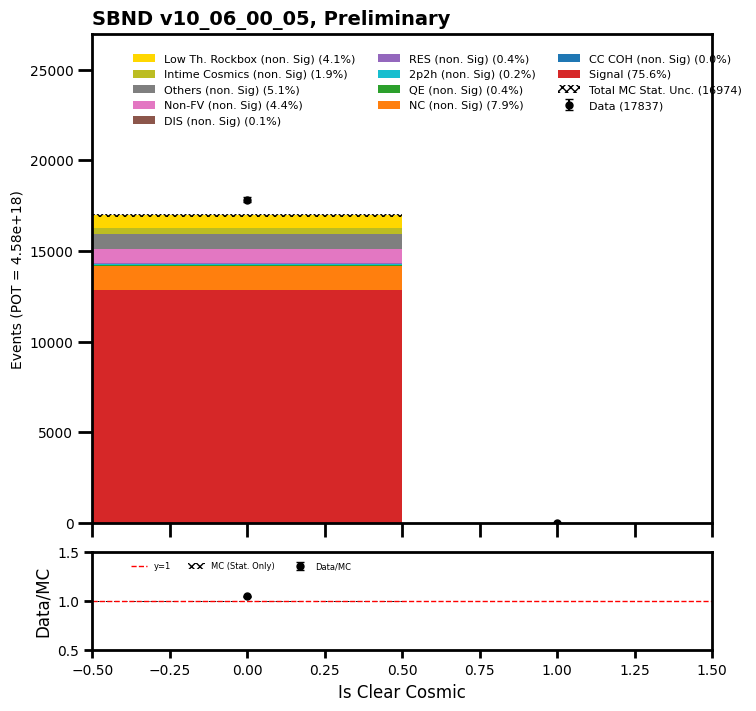

/tmp/ipykernel_2747/2477963852.py:130: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_2747/2477963852.py:131: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc
/tmp/ipykernel_2747/2477963852.py:185: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_2747/2477963852.py:189: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_2747/2477963852.py:190: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc


total data =  17837
[   0    0    0    0    0    0    0    0    0    0    0    0    0    0
    0    0    0    0    0    0    0    0    0    0    0    0    0    0
    0    0    0    0    0 7172 5798 3989  860   18    0    0    0    0
    0    0]
[   0.         0.         0.         0.         0.         0.
    0.         0.         0.         0.         0.         0.
    0.         0.         0.         0.         0.         0.
    0.         0.         0.         0.         0.         0.
    0.         0.         0.         0.         0.         0.
    0.         0.         0.      6138.8027  5430.4194  4306.1714
 1070.4763    27.55248    0.         0.         0.         0.
    0.         0.     ]
data ratio  [       nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan        nan        nan
        nan  

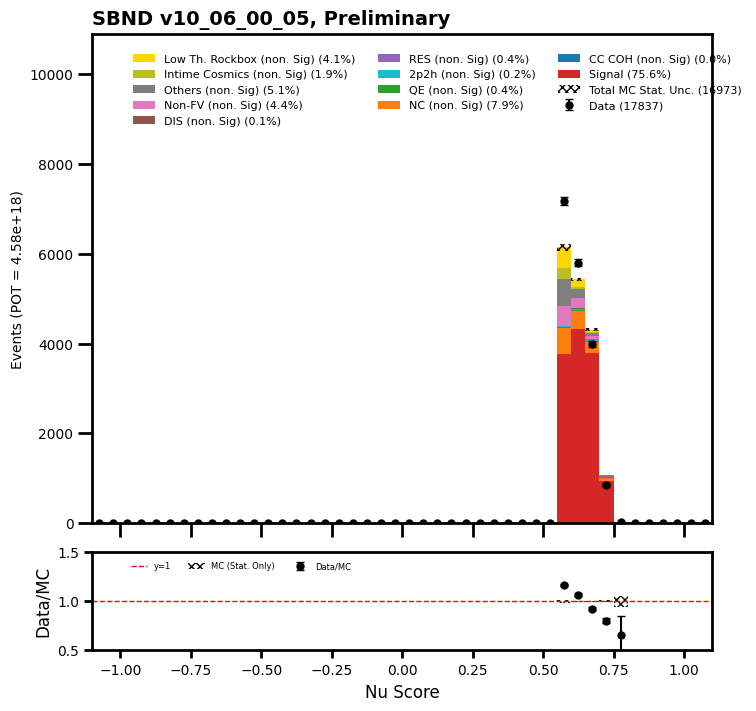

/tmp/ipykernel_2747/2477963852.py:130: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_2747/2477963852.py:131: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc
/tmp/ipykernel_2747/2477963852.py:185: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_2747/2477963852.py:189: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_2747/2477963852.py:190: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc


total data =  17837
[  0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0
 194 340 317 336 305 363 314 340 342 354 312 320 337 361 326 323 328 357
 388 321 312 299 365 301 336 309 296 316 328 295 110   0   0  90 278 293
 279 285 292 304 257 260 279 284 293 274 291 279 263 255 248 259 264 275
 234 259 274 276 220 235 250 249 234 159   0   0   0   0   0   0   0   0
   0   0   0   0   0   0   0   0   0   0]
[  0.         0.         0.         0.         0.         0.
   0.         0.         0.         0.         0.         0.
   0.         0.         0.         0.         0.         0.
 167.52075  271.76743  271.9062   295.95782  288.86005  294.2891
 303.0837   310.10004  305.12836  303.61066  301.83853  312.6258
 322.4577   311.3762   321.39267  311.2372   305.30334  317.6823
 320.35483  339.61075  337.31183  334.3269   304.1367   313.1813
 318.29718  312.17978  307.59387  309.8735   297.41617  302.13312
 101.84251    0.         0.       100.48714  299.34848  296.3759

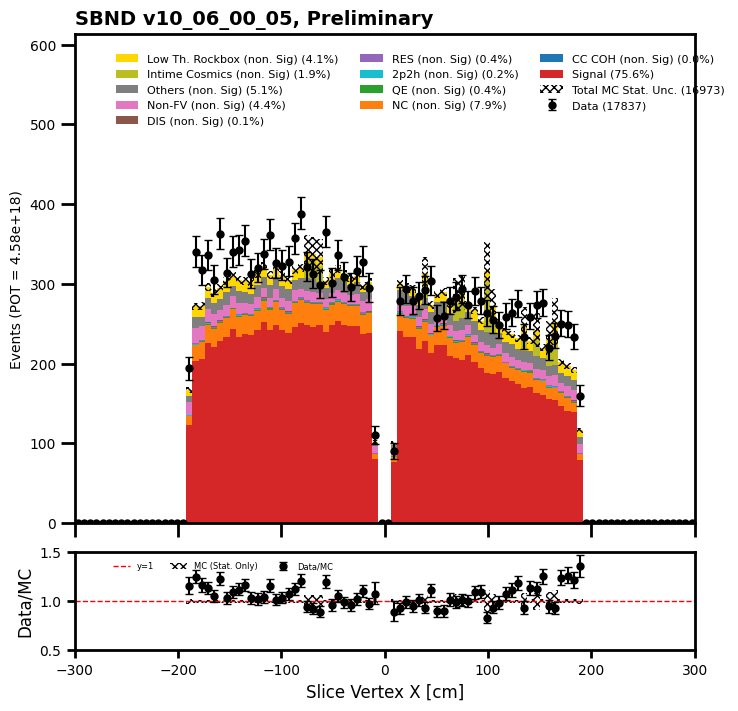

/tmp/ipykernel_2747/2477963852.py:130: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_2747/2477963852.py:131: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc
/tmp/ipykernel_2747/2477963852.py:185: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_2747/2477963852.py:189: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_2747/2477963852.py:190: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc


total data =  17837
[  0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0
 181 270 273 276 297 265 286 252 280 322 284 289 298 299 288 329 315 285
 305 305 295 302 315 318 295 299 299 291 322 287 334 314 304 286 293 311
 267 271 301 316 287 300 291 305 281 262 289 278 277 264 304 288 287 243
 286 278 257 240 265 194 182 175 174 111   0   0   0   0   0   0   0   0
   0   0   0   0   0   0   0   0   0   0]
[  0.        0.        0.        0.        0.        0.        0.
   0.        0.        0.        0.        0.        0.        0.
   0.        0.        0.        0.      152.0067  235.1884  240.10771
 248.28441 270.03906 250.62582 245.00919 253.39424 267.1417  263.83127
 255.9891  272.17355 275.54892 270.79578 280.16238 277.8406  280.10846
 276.7538  288.25677 283.45123 292.2481  300.7161  293.1506  302.70328
 295.3127  284.76688 297.4494  299.5828  319.7292  300.305   371.34344
 300.58868 293.49658 292.38043 285.43857 288.6703  287.49792 288.03638
 277.9157  297.

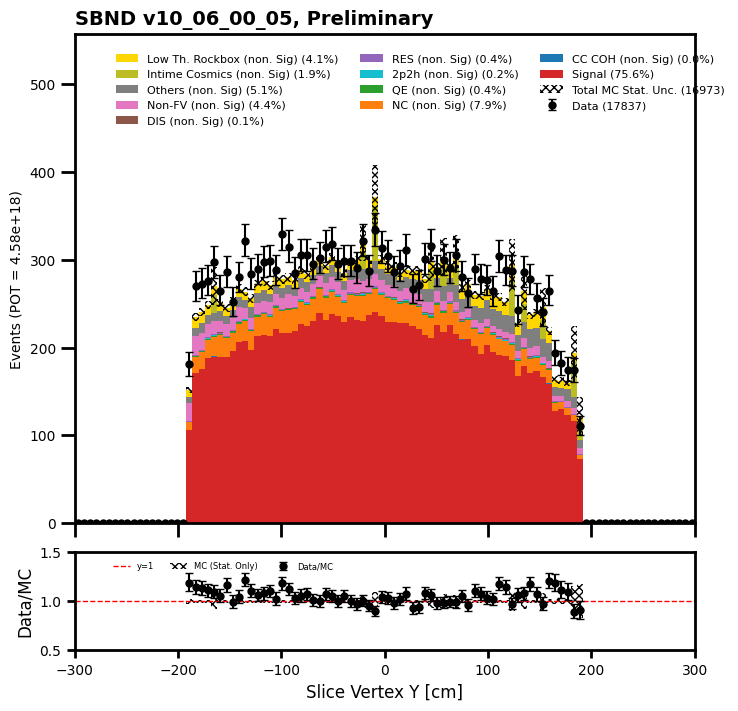

/tmp/ipykernel_2747/2477963852.py:130: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_2747/2477963852.py:131: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc


total data =  17837
[  0   0   0   0   0   0   0   0   0   0   0   0   0   0   0 123 354 263
 351 320 330 289 263 209 309 290 283 295 300 281 269 308 264 296 292 267
 260 254 268 271 269 271 290 280 279 279 267 319 297 253 280 277 259 281
 308 281 286 291 278 273 271 279 298 266 279 263 289 295 313 291 289 274
 254 257 306 270 273 287 156   0   0   0   0   0   0   0   0   0   0   0
   0   0   0   0   0   0   0   0   0   0]
[  0.        0.        0.        0.        0.        0.        0.
   0.        0.        0.        0.        0.        0.        0.
   0.      114.07134 339.35855 289.6412  294.22238 316.1419  315.14676
 281.88004 284.36603 228.72629 297.3097  272.40823 272.12973 269.66962
 275.38312 263.07147 283.28604 272.41165 262.93915 268.29684 261.60614
 265.8401  278.34787 271.1208  290.06714 261.99973 260.3105  257.77655
 265.6832  262.34686 265.7924  287.27872 260.07642 260.0113  281.2806
 278.0297  247.60852 258.41678 272.3583  255.86008 265.79907 267.5837
 280.47104 273.45

/tmp/ipykernel_2747/2477963852.py:185: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_2747/2477963852.py:189: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_2747/2477963852.py:190: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc


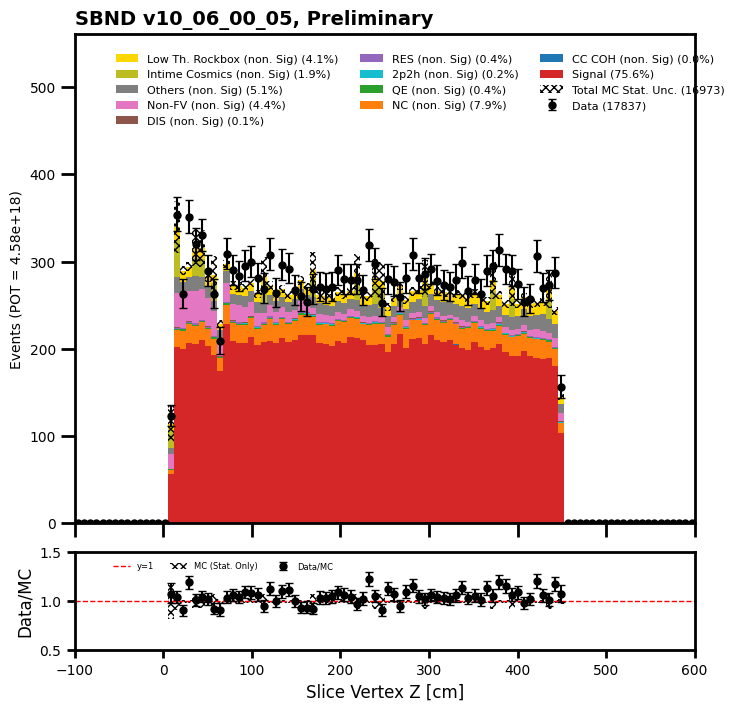

total data =  17438
[437 335 522 738 719 786 905 945 929 860 845 769 757 681 653 590 555 486
 491 442 396 362 337 312 283 288 258 225 201 179 204 145 142 123 147  97
  76  78  71  69]
[416.2648   381.97708  622.07947  736.69885  756.5371   785.92615
 856.17596  852.1793   889.09656  797.9473   763.528    748.6632
 669.8699   662.4618   579.9029   563.08496  492.09628  455.43777
 426.8441   402.1082   360.7121   351.35678  314.3818   307.09143
 266.0197   262.84708  233.79846  210.54436  190.86569  163.89436
 152.63123  141.76826  127.39478  120.02181  112.008514  98.20301
  81.45458   72.48463   68.34589   64.40112 ]
data ratio  [1.04981252 0.87701597 0.83912109 1.00176619 0.95038299 1.00009397
 1.0570257  1.10892153 1.04488089 1.07776538 1.10670464 1.02716414
 1.13007023 1.02798381 1.1260506  1.04779925 1.12782807 1.06710516
 1.15030292 1.09920667 1.09782844 1.03029177 1.07194499 1.01598406
 1.06383093 1.09569413 1.10351453 1.06865842 1.05309654 1.09216691
 1.33655482 1.0227959  1.114

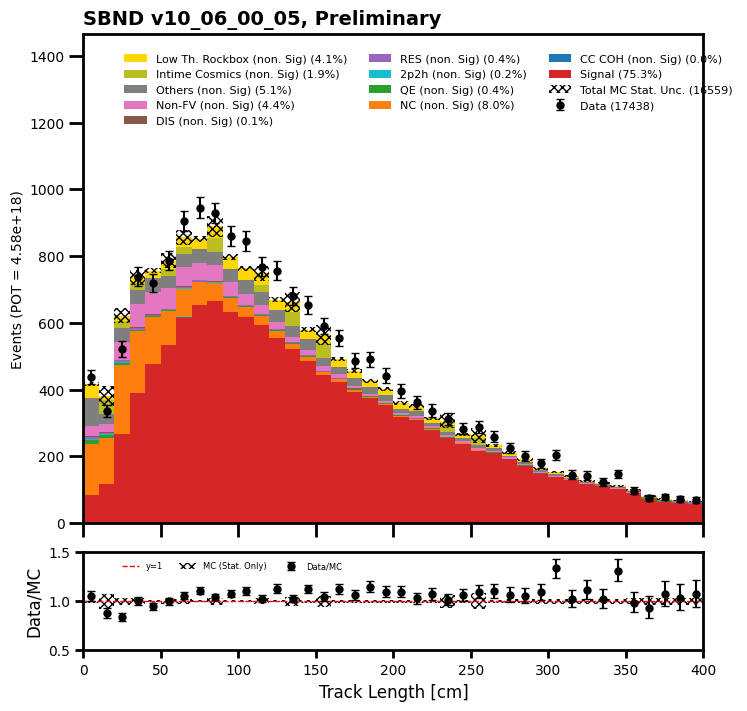

total data =  17837
[ 73  82  71  72  69  80  91 116 113 115  82 108 113 128 133 135 133 130
 133 154 164 160 162 177 184 169 192 187 205 198 197 212 233 236 259 260
 245 246 264 248 249 261 242 231 213 222 224 203 218 260 237 235 243 243
 244 241 237 225 252 212 223 245 240 278 283 227 259 238 252 230 237 218
 205 231 213 184 177 186 187 181 178 160 150 130 135 125 124 126 143 130
 124 115 121  96  89  90  67  70  83  66]
[ 64.06963   73.316795  73.49277   79.001335  79.49751   79.938126
 112.52951   93.75789   93.401505  98.60323  119.27643  102.74044
 109.99702  136.53142  120.50472  121.16579  127.50572  129.20142
 137.82808  148.50444  154.01431  159.84418  156.56308  165.28732
 168.71681  176.96312  180.79832  191.61028  211.44214  194.14111
 200.22234  207.34286  231.03006  213.21616  248.76111  224.12564
 221.7564   229.54884  233.61552  252.26453  238.88086  247.69774
 225.55588  230.0537   232.90726  224.81136  229.16516  237.81256
 222.85905  230.7598   234.81464  219.37206 

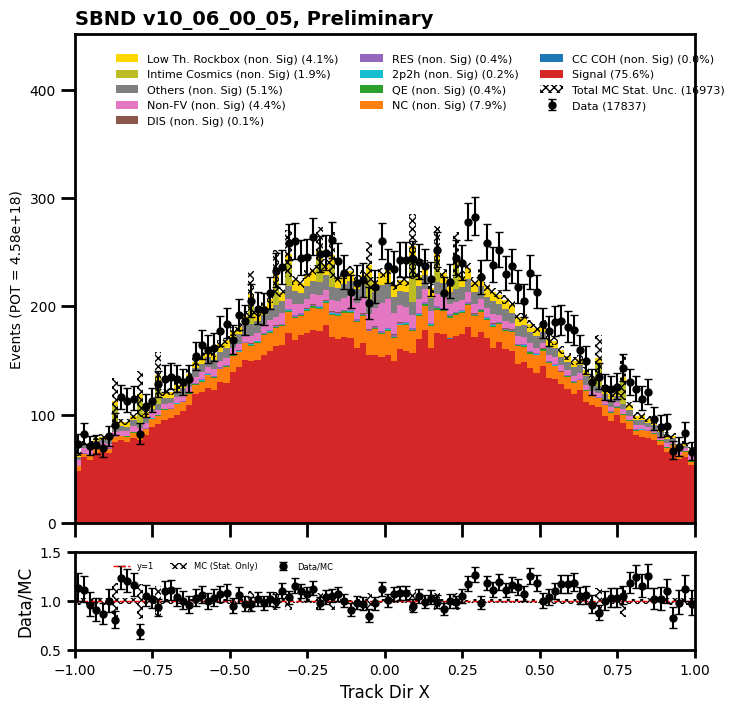

total data =  17837
[ 49  31  49  42  38  46  51  41  45  68  65  63  59  76  93  76  87  86
 111 107 119 135 134 160 179 187 157 158 207 200 231 245 279 236 267 267
 259 266 289 298 295 288 291 300 294 283 290 300 294 286 300 282 309 273
 305 291 312 282 294 278 295 248 287 260 261 280 265 241 253 273 192 226
 172 213 199 194 173 208 147 167 138 148 128 135 136 109 117 103  99 104
  79  80  77  72  70  57  70  52  55  51]
[ 39.091377  32.486732  55.836933  36.273933  38.784096  44.192493
  44.32356   47.2674    51.63802   50.55643   55.86659   60.77952
  60.865135  70.1261    73.45935   82.1255    79.88794   86.23771
  88.94299   99.66839  102.36679  112.53825  122.43868  126.35969
 132.6536   144.72714  147.40921  162.52066  184.15652  193.42055
 204.83237  214.00827  247.08354  258.30878  247.15488  248.91197
 272.23663  276.54984  301.78085  287.25586  290.9673   294.78458
 290.0293   295.22415  296.18317  308.97174  294.68726  316.59763
 304.05972  311.38852  286.77533  300.81512 

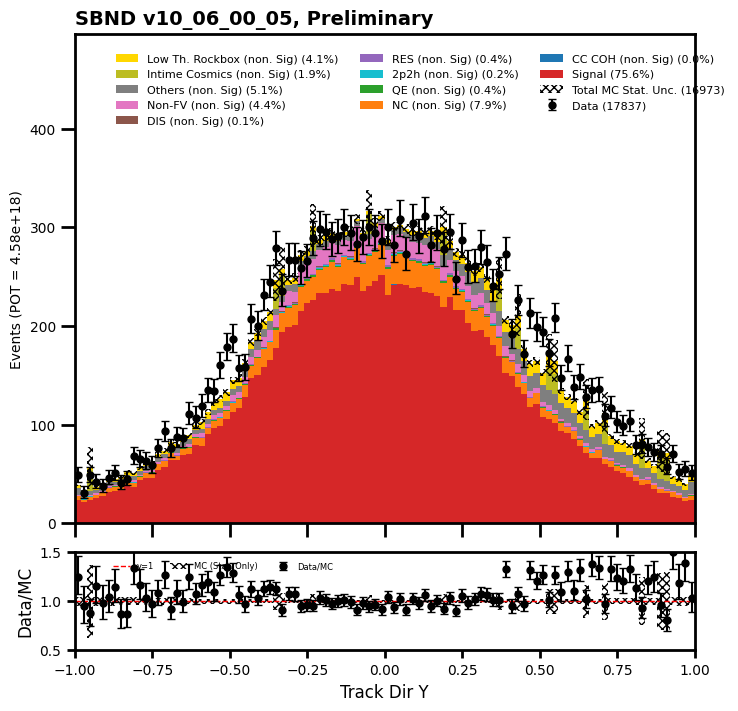

total data =  17837
[  82   74   70   69   63   64   59   54   57   38   42   38   39   41
   39   35   34   38   37   31   31   29   29   28   35   30   27   22
   24   34   47   27   31   33   20   24   32   29   41   28   39   37
   35   50   53   44   35   55   59   54   64   39   64   57   81   80
   72   88   76   87   89   74   84   86   77   96  111  111  124  142
  143  166  157  173  207  223  205  217  229  225  262  278  301  325
  358  343  397  463  447  521  585  653  658  735  827  927 1002 1039
  999 1004]
[  90.93959    81.50546    75.52437    69.38726    59.349434   54.222427
   50.014145   45.29663    39.031776   38.51318    37.21486    33.048534
   32.160973   28.850338   28.936974   29.012466   28.721077   31.015224
   29.087355   24.564705   26.869867   23.546669   25.775393   24.076889
   46.486313   25.798542   24.747036   25.202175   48.303795   25.439495
   45.87961    25.16869    27.939003   28.652874   26.014458   28.750675
   30.696747   28.999937   30.579

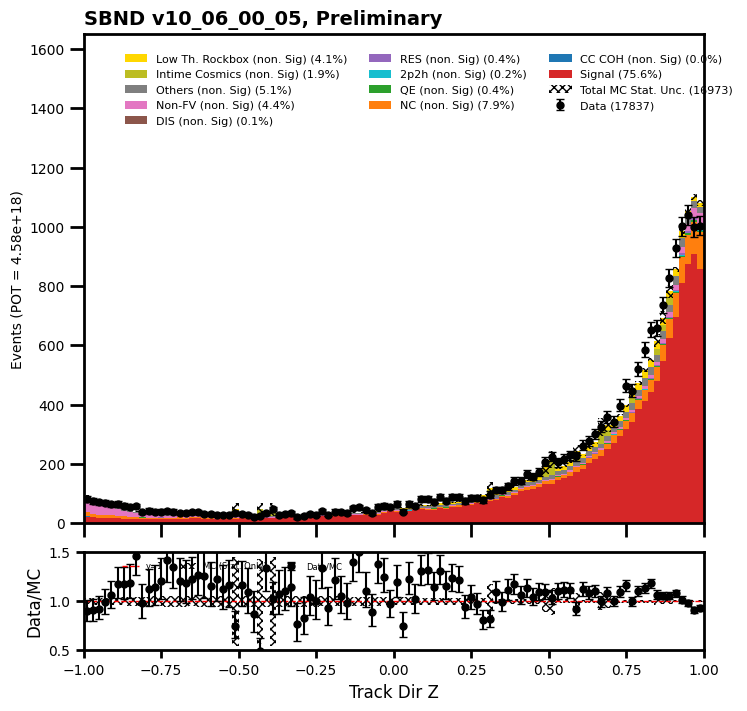

/tmp/ipykernel_2747/2477963852.py:130: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_2747/2477963852.py:131: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc
/tmp/ipykernel_2747/2477963852.py:185: RuntimeWarning: divide by zero encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_2747/2477963852.py:185: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_2747/2477963852.py:189: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_2747/2477963852.py:190: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc
/exp/sbnd/app/users/amoor/cafpyana/cafpyana/envs/venv_py39_cafpyana/lib/python3.9/site-packages/matplotlib/axes/_axes.py:3749: RuntimeWarning: overflow encountered in add
  low, high = dep + np.vstack(

total data =  17837
[  19  351  457 1160 1565 2020 1967 1829 1533 1303 1075  891  742  635
  504  422  330  284  181  154  106   91   69   52   57   25    6    3
    3    2    0    0    0    0    0    0    1    0    0    0]
[1.60732079e+01 3.30370819e+02 5.07888885e+02 1.26102063e+03
 1.59199622e+03 1.89321252e+03 1.84809949e+03 1.65090674e+03
 1.43878149e+03 1.19241663e+03 9.81779541e+02 8.28671387e+02
 7.03318298e+02 5.81284912e+02 4.75009613e+02 3.60985352e+02
 2.98894348e+02 2.52874252e+02 1.82490738e+02 1.49802795e+02
 1.16881516e+02 9.60530090e+01 7.45998306e+01 5.61796417e+01
 5.21965141e+01 1.93397980e+01 6.66015625e+00 2.76818848e+00
 6.69799805e-01 2.38525391e-01 6.50634766e-02 2.59399414e-01
 3.24096680e-01 8.65478516e-02 3.25317383e-02 8.65478516e-02
 0.00000000e+00 0.00000000e+00 8.65478516e-02 0.00000000e+00]
data ratio  [1.18209135 1.0624425  0.89980311 0.91988979 0.98304254 1.06696949
 1.06433664 1.10787603 1.06548493 1.09273887 1.0949505  1.07521511
 1.05499886 1.09240

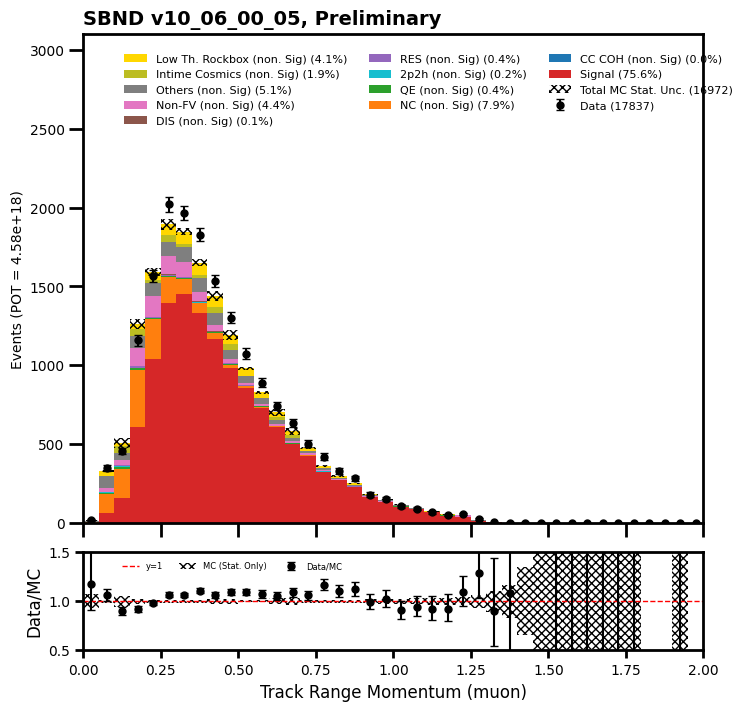

total data =  17098
[   1    2  105  399  829 1156 1746 1109 1602 1058 1124  984 1100  783
  584  600  601  578  362  276  353  210  266  155  146  169   73  122
   77   72   87   48   70   39   42   44   28   37   19   42]
[7.2499764e-01 1.2768862e+00 9.8181122e+01 4.0478290e+02 7.9768188e+02
 1.1395948e+03 1.5794177e+03 1.0403130e+03 1.4866331e+03 8.7301477e+02
 1.0296578e+03 9.0934851e+02 1.0139148e+03 7.0821570e+02 5.0768817e+02
 5.7989233e+02 5.1043649e+02 5.2181940e+02 3.7520316e+02 2.6932333e+02
 3.5562503e+02 2.0618414e+02 2.6564667e+02 1.6071895e+02 1.7206378e+02
 1.7715018e+02 1.0435136e+02 1.3485492e+02 7.7343964e+01 8.8727852e+01
 9.6959740e+01 5.7405159e+01 7.4947563e+01 4.8141876e+01 4.9864594e+01
 5.4482903e+01 3.5529278e+01 4.7030037e+01 3.0460239e+01 3.8018646e+01]
data ratio  [1.37931484 1.56631026 1.06945203 0.98571358 1.03926141 1.0143956
 1.10547069 1.06602533 1.07760284 1.21189244 1.09162477 1.08209338
 1.08490379 1.10559537 1.1503124  1.03467483 1.17742365 1.1076

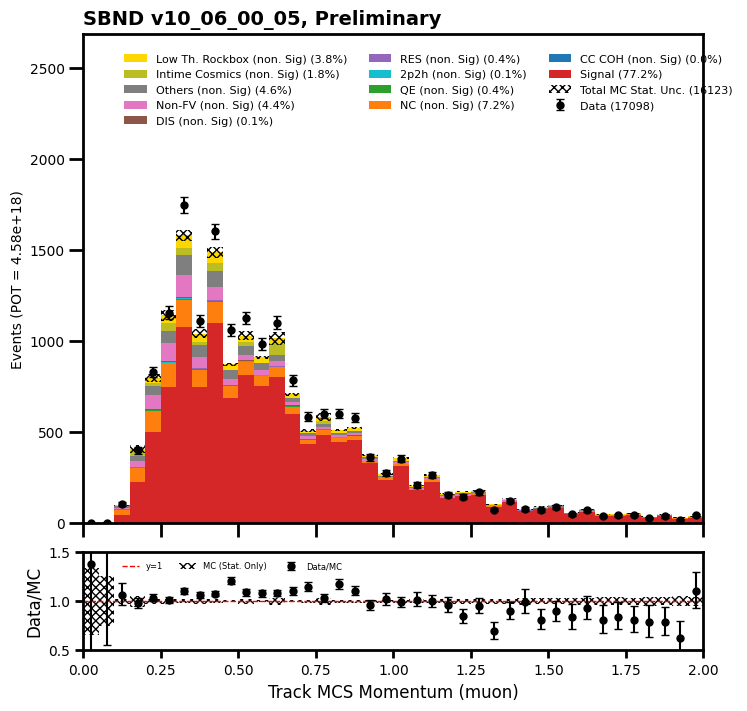

/tmp/ipykernel_2747/2477963852.py:130: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_2747/2477963852.py:131: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc
/tmp/ipykernel_2747/2477963852.py:185: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_2747/2477963852.py:189: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_2747/2477963852.py:190: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc


total data =  17837
[   0    0    0    0    0    0    0    0    0    0    0    0    0    0
    0    0    0    0    0    0    0    0    0    0    0  310  361  455
  570  720  839  901 1019 1110 1198 1290 1386 1369 1301 1227 1142 1121
  870  498  142    8    0    0    0    0]
[   0.          0.          0.          0.          0.          0.
    0.          0.          0.          0.          0.          0.
    0.          0.          0.          0.          0.          0.
    0.          0.          0.          0.          0.          0.
    0.        275.12723   354.41064   422.9249    531.8008    638.63385
  799.9263    825.6942    985.0564   1028.6643   1144.625    1173.3868
 1248.8995   1253.2102   1263.8369   1215.4899   1194.453    1162.9182
  864.1223    456.32364   124.656654    9.261536    0.          0.
    0.          0.      ]
data ratio  [       nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan        nan        nan
    

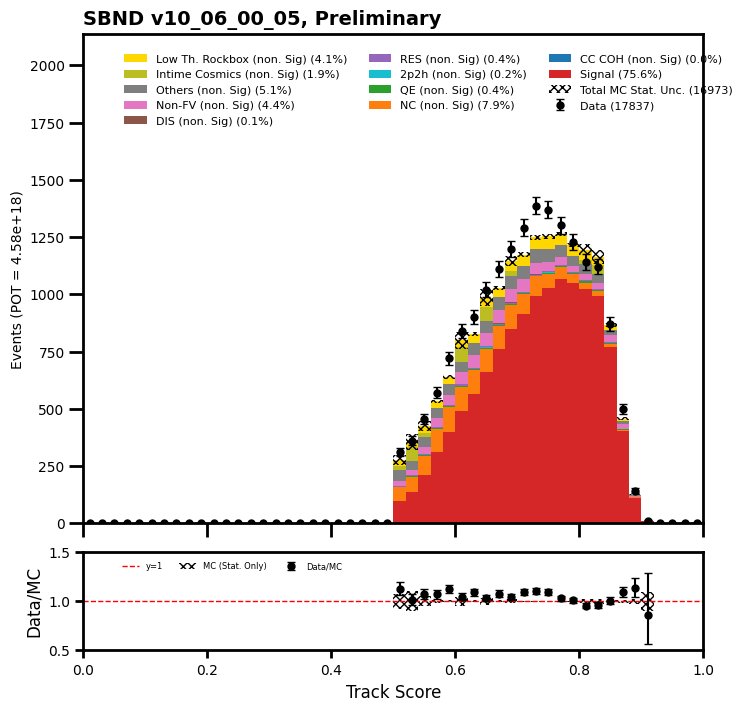

total data =  17629
[1699 3247 2665 2073 1649 1354 1028  833  604  466  341  259  219  174
  149  108   77   74   66   56   69   38   38   38   27   27   34   28
   16   26   19   23   12   11   15    9   17   14   13   14]
[1512.3007    2948.2224    2441.642     1887.0347    1588.741
 1297.2891    1036.3387     823.4845     627.2996     466.47495
  369.59784    269.71393    237.36595    174.43573    140.75522
  121.62524    102.81602    104.22074     72.976845    65.39719
   52.59166     48.13913     45.177837    40.971447    32.62698
   28.962845    48.028976    26.84541     20.443932    21.83841
   19.213734    15.849871    17.515768    14.90876     12.693737
   10.272711    11.579285    10.412422    12.3588505    9.676975 ]
data ratio  [1.12345385 1.1013416  1.09147856 1.09854897 1.0379288  1.04371496
 0.99195365 1.01155517 0.96285727 0.99898184 0.92262444 0.9602767
 0.92262601 0.99750206 1.05857532 0.88797361 0.74891055 0.71003141
 0.90439646 0.85630595 1.31199511 0.78937863 0.841

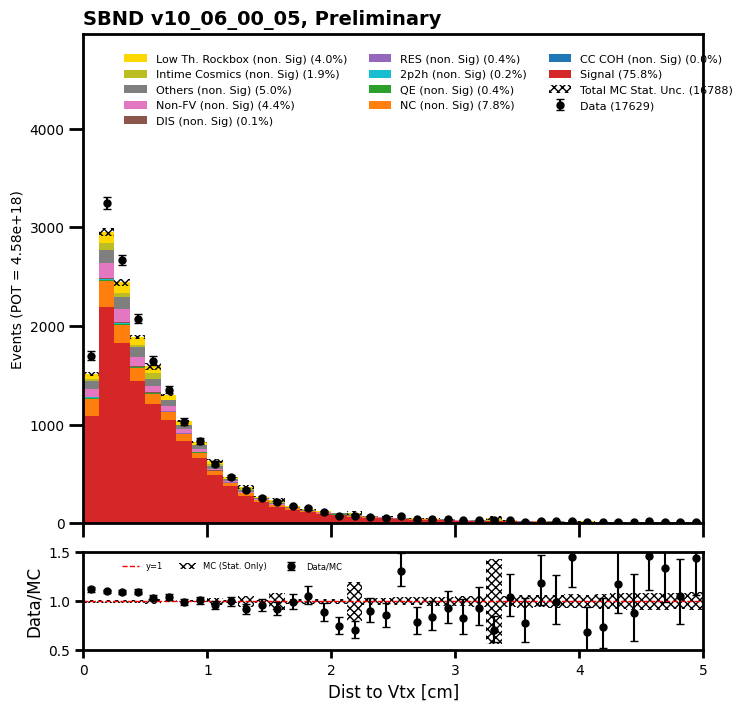

/tmp/ipykernel_2747/2477963852.py:130: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_2747/2477963852.py:131: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc
/tmp/ipykernel_2747/2477963852.py:185: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_2747/2477963852.py:189: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_2747/2477963852.py:190: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc


total data =  17837
[  0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0
 191 341 317 334 306 358 322 339 339 354 321 310 344 360 325 327 328 349
 390 317 317 306 359 302 333 313 300 310 328 301 104   0   0  88 281 287
 286 276 301 303 253 270 269 280 300 280 282 278 262 262 246 259 263 277
 232 261 271 278 219 238 249 245 240 156   0   0   0   0   0   0   0   0
   0   0   0   0   0   0   0   0   0   0]
[0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00
 0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00
 0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00
 0.0000000e+00 0.0000000e+00 8.6554505e-02 1.6484868e+02 2.7425613e+02
 2.7127808e+02 2.9442133e+02 2.9096982e+02 2.9632349e+02 3.0022757e+02
 3.1119257e+02 3.0371097e+02 3.0592603e+02 3.0094086e+02 3.1249603e+02
 3.2171060e+02 3.1197186e+02 3.2103513e+02 3.1307715e+02 3.0410175e+02
 3.1873099e+02 3.2009549e+02 3.3796597e+02 3.3776685e+02 3.1382303e+02
 3.25

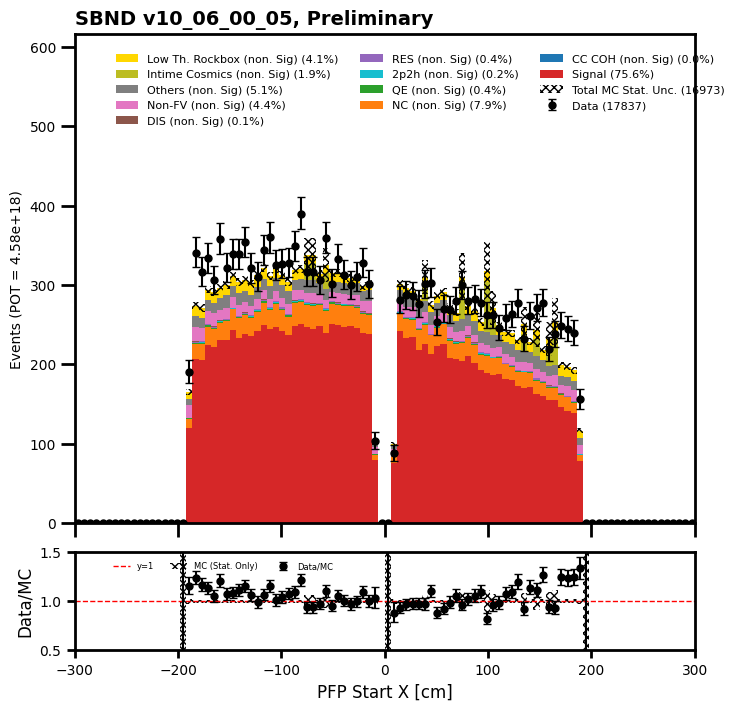

/tmp/ipykernel_2747/2477963852.py:130: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_2747/2477963852.py:131: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc
/tmp/ipykernel_2747/2477963852.py:185: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_2747/2477963852.py:189: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_2747/2477963852.py:190: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc


total data =  17837
[  0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0
 183 271 273 263 309 270 275 260 277 322 296 278 291 310 284 325 317 295
 299 307 294 293 312 323 301 296 300 289 315 284 342 320 307 280 295 305
 269 274 304 304 291 299 288 311 281 266 290 269 280 266 307 287 280 253
 282 275 259 234 268 197 180 184 167 111   0   0   0   0   0   0   0   0
   0   0   0   0   0   0   0   0   0   0]
[0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00
 0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00
 0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00
 0.0000000e+00 0.0000000e+00 8.4411359e-01 1.4987538e+02 2.3744829e+02
 2.3860461e+02 2.4901961e+02 2.6947781e+02 2.4873125e+02 2.4741190e+02
 2.5457339e+02 2.6534473e+02 2.6271814e+02 2.5815198e+02 2.7227051e+02
 2.7696640e+02 2.7054767e+02 2.7774942e+02 2.7670459e+02 2.8209991e+02
 2.7811569e+02 2.8436322e+02 2.8618820e+02 2.9115591e+02 3.0211069e+02
 2.93

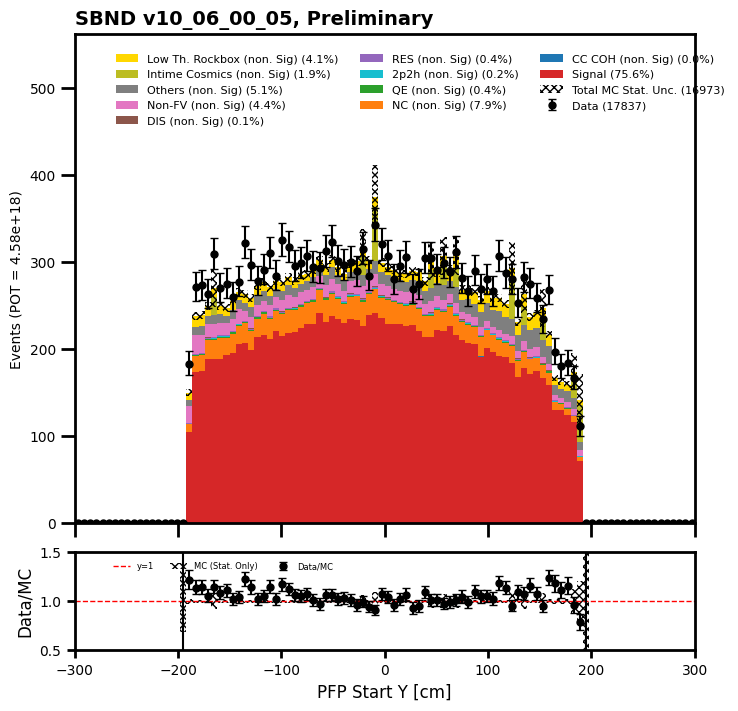

/tmp/ipykernel_2747/2477963852.py:130: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_2747/2477963852.py:131: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc
/tmp/ipykernel_2747/2477963852.py:185: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_2747/2477963852.py:189: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_2747/2477963852.py:190: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc


total data =  17837
[  0   0   0   0   0   0   0   0   0   0   0   0   0   0   3 109 353 272
 340 326 327 298 267 191 319 287 286 295 297 285 263 308 265 297 297 259
 259 258 272 275 260 275 286 281 286 271 265 317 300 257 288 276 251 287
 297 279 293 285 284 274 271 277 300 267 278 269 279 304 309 289 290 276
 252 256 306 271 270 292 161   0   0   0   0   0   0   0   0   0   0   0
   0   0   0   0   0   0   0   0   0   0]
[  0.          0.          0.          0.          0.          0.
   0.          0.          0.          0.          0.          0.
   0.          0.          1.9367609 103.651474  338.61282   287.15228
 297.50104   316.01248   314.7355    281.72842   286.55206   215.92749
 307.7494    272.9378    271.59918   274.15973   270.91556   262.72504
 284.7582    272.21713   262.76642   266.81427   263.1639    266.8021
 278.0779    270.78525   290.95737   260.0931    261.28735   257.53708
 266.2685    261.33923   266.05176   285.6334    261.73206   259.14386
 282.45258   276

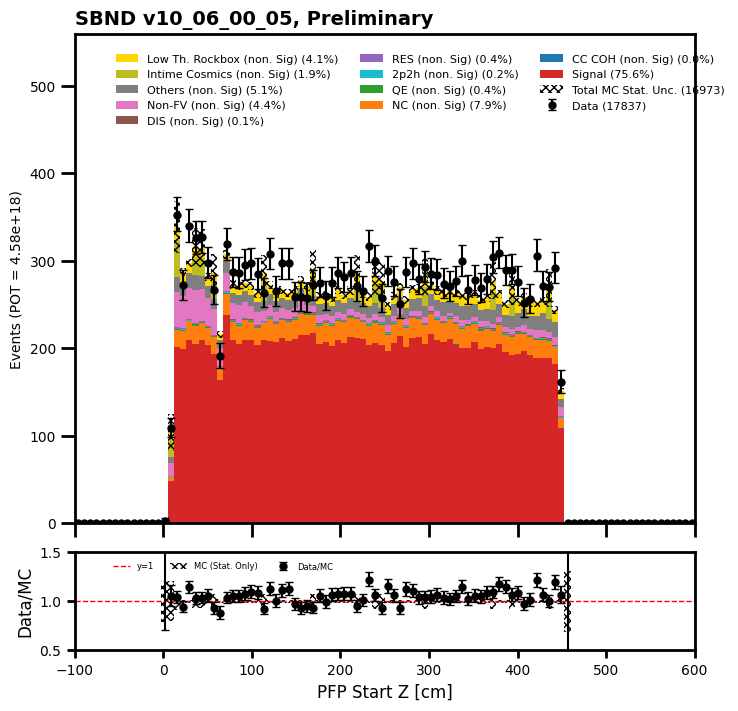

In [52]:
## Reco 3) slice trkscore more than 0.5
#trk_sc_mc = (mc_matchdf.pfp.trackScore > 0.5)   #prev was 0.6
#trk_sc_data = (data_evt_df.pfp.trackScore > 0.5)

#mc_matchdf = mc_matchdf[trk_sc_mc]
#data_evt_df = data_evt_df[trk_sc_data]

mc_bnb_cosmic_dfs["evt"] = mc_bnb_cosmic_dfs["evt"][mc_bnb_cosmic_dfs["evt"].pfp.trackScore > 0.5]
mc_rockbox_dirt_dfs["evt"] = mc_rockbox_dirt_dfs["evt"][mc_rockbox_dirt_dfs["evt"].pfp.trackScore > 0.5]
data_offbeam_light_dfs["evt"] = data_offbeam_light_dfs["evt"][data_offbeam_light_dfs["evt"].pfp.trackScore > 0.5]
data_bnb_light_dfs["evt"] = data_bnb_light_dfs["evt"][data_bnb_light_dfs["evt"].pfp.trackScore > 0.5]

#fractions_clear_cosmic_cosmiccut, fractions_nu_score_cosmiccut, fractions_vtx_x_cosmiccut, fractions_vtx_y_cosmiccut, fractions_vtx_z_cosmiccut, fractions_trk_len = draw_reco_valid_plots(mc_matchdf, data_evt_df, "trk_sc")
draw_reco_valid_plots(mc_bnb_cosmic_dfs["evt"], mc_rockbox_dirt_dfs["evt"], data_offbeam_light_dfs["evt"], data_bnb_light_dfs["evt"], "a_vtx_fv_and_not_clear_cosmic_nu_score_trkscore")

/tmp/ipykernel_2747/2477963852.py:130: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_2747/2477963852.py:131: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc
/tmp/ipykernel_2747/2477963852.py:185: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_2747/2477963852.py:189: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_2747/2477963852.py:190: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc


total data =  17541
[17541     0]
[16716.52142533     0.        ]
data ratio  [1.04932118        nan]


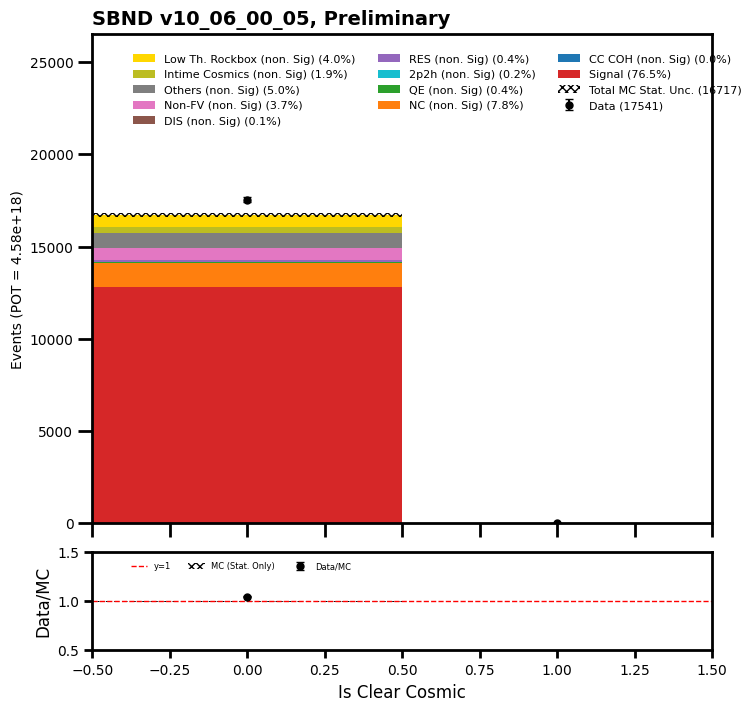

/tmp/ipykernel_2747/2477963852.py:130: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_2747/2477963852.py:131: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc
/tmp/ipykernel_2747/2477963852.py:185: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_2747/2477963852.py:189: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_2747/2477963852.py:190: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc


total data =  17541
[   0    0    0    0    0    0    0    0    0    0    0    0    0    0
    0    0    0    0    0    0    0    0    0    0    0    0    0    0
    0    0    0    0    0 7007 5698 3962  857   17    0    0    0    0
    0    0]
[   0.          0.          0.          0.          0.          0.
    0.          0.          0.          0.          0.          0.
    0.          0.          0.          0.          0.          0.
    0.          0.          0.          0.          0.          0.
    0.          0.          0.          0.          0.          0.
    0.          0.          0.       5984.66     5355.4663   4282.406
 1066.7314     27.119001    0.          0.          0.          0.
    0.          0.      ]
data ratio  [       nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan

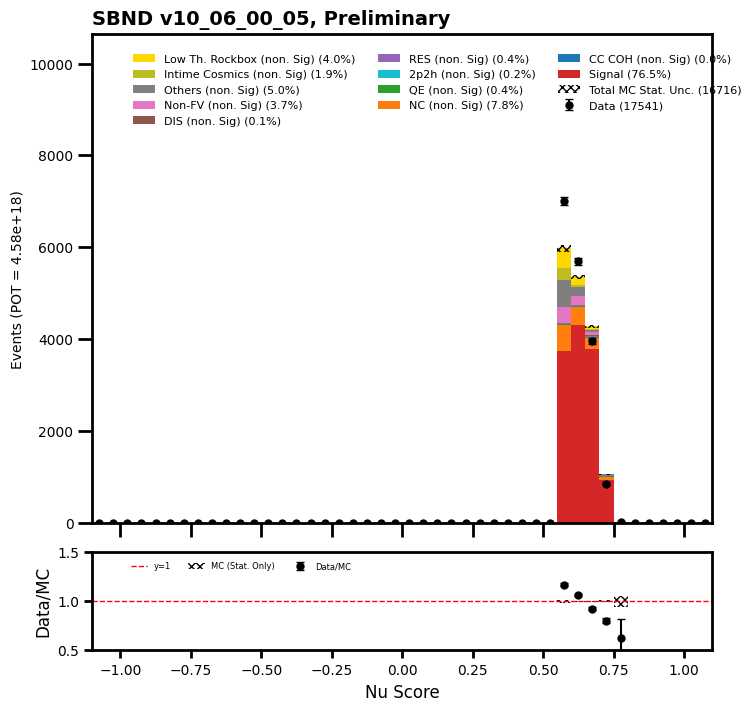

/tmp/ipykernel_2747/2477963852.py:130: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_2747/2477963852.py:131: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc
/tmp/ipykernel_2747/2477963852.py:185: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_2747/2477963852.py:189: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_2747/2477963852.py:190: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc


total data =  17541
[  0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0
 189 338 311 327 301 356 310 333 339 353 308 317 335 357 322 316 323 352
 385 317 308 296 363 299 331 304 290 310 324 292 105   0   0  85 273 285
 276 281 287 298 252 252 274 281 287 268 288 273 257 250 242 254 262 269
 229 250 271 273 215 227 247 242 229 153   0   0   0   0   0   0   0   0
   0   0   0   0   0   0   0   0   0   0]
[  0.        0.        0.        0.        0.        0.        0.
   0.        0.        0.        0.        0.        0.        0.
   0.        0.        0.        0.      164.24199 267.66595 267.15588
 289.98477 284.59656 290.42615 299.8481  305.37137 301.37408 300.0951
 298.34344 308.94586 317.35077 307.97867 316.00418 308.305   301.6245
 312.98633 317.1626  335.6615  332.18323 330.87576 299.33273 308.4623
 313.75287 307.65628 304.05618 305.33997 293.0665  296.7128  100.16639
   0.        0.       99.31795 294.8475  291.83038 288.62042 278.59207
 308.3167  268.667

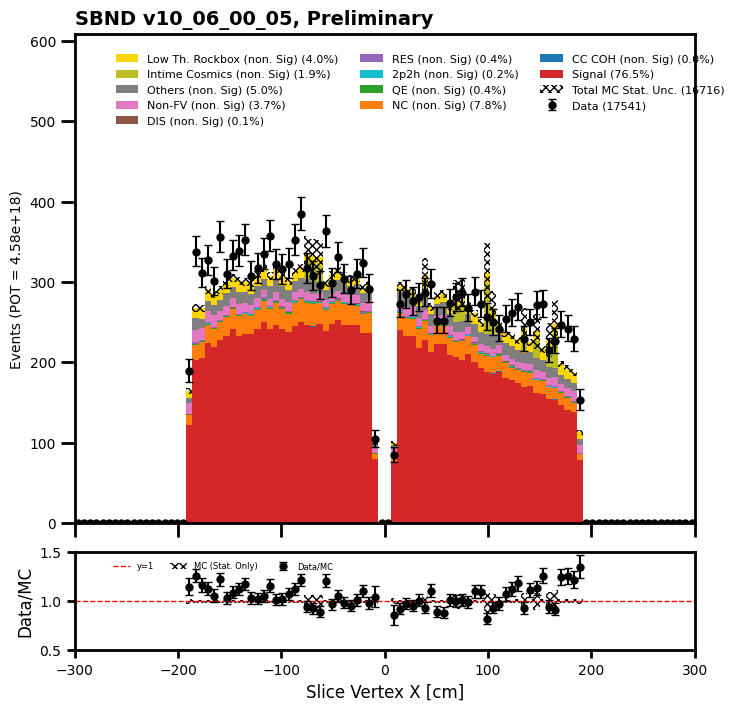

/tmp/ipykernel_2747/2477963852.py:130: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_2747/2477963852.py:131: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc
/tmp/ipykernel_2747/2477963852.py:185: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_2747/2477963852.py:189: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_2747/2477963852.py:190: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc


total data =  17541
[  0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0
 172 263 261 270 294 260 280 251 272 314 279 284 296 292 285 321 309 279
 294 301 294 296 311 309 288 296 293 287 319 280 330 303 298 283 290 306
 263 268 299 310 283 292 289 300 279 261 287 274 273 263 301 284 285 239
 282 272 254 238 262 189 179 171 173 111   0   0   0   0   0   0   0   0
   0   0   0   0   0   0   0   0   0   0]
[  0.        0.        0.        0.        0.        0.        0.
   0.        0.        0.        0.        0.        0.        0.
   0.        0.        0.        0.      147.78615 230.13477 233.75574
 243.33875 266.43552 244.78214 240.29153 249.27176 262.42557 258.10736
 250.53569 267.07758 271.03723 266.80383 275.85617 273.78387 274.37354
 272.25235 284.75116 279.06876 287.15256 295.2839  288.26904 297.2603
 290.34485 279.93146 291.8322  294.83307 314.56815 295.86816 366.6592
 296.27084 289.14594 288.36664 282.27963 284.97958 282.76987 283.3612
 273.38327 293.295

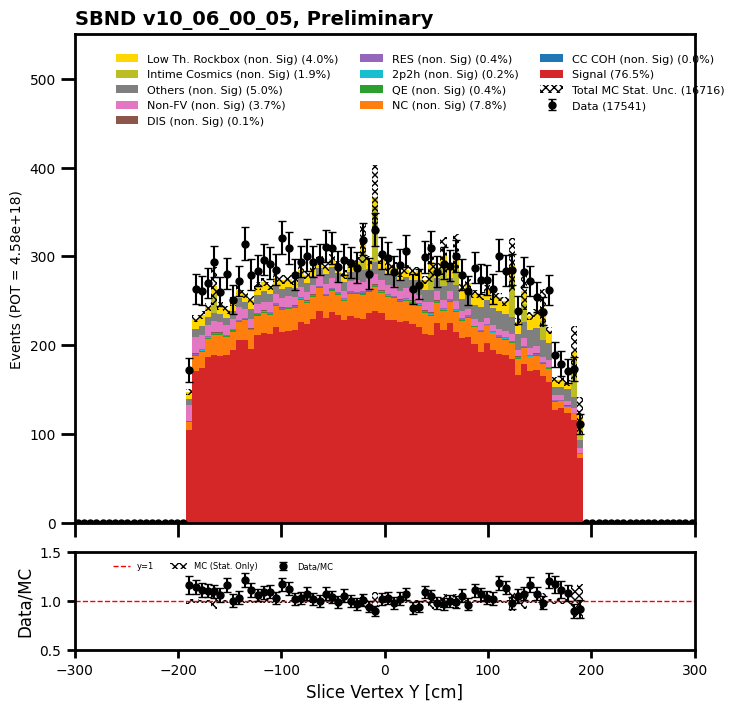

/tmp/ipykernel_2747/2477963852.py:130: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_2747/2477963852.py:131: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc
/tmp/ipykernel_2747/2477963852.py:185: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_2747/2477963852.py:189: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_2747/2477963852.py:190: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc


total data =  17541
[  0   0   0   0   0   0   0   0   0   0   0   0   0   0   0 123 351 259
 343 307 320 278 243 200 304 277 276 290 291 273 264 301 260 293 287 266
 257 252 262 269 263 269 285 279 274 276 265 316 291 248 280 274 257 277
 301 279 280 288 277 269 269 274 295 261 274 262 288 289 310 287 289 271
 250 255 302 265 268 282 156   0   0   0   0   0   0   0   0   0   0   0
   0   0   0   0   0   0   0   0   0   0]
[  0.        0.        0.        0.        0.        0.        0.
   0.        0.        0.        0.        0.        0.        0.
   0.      113.42177 335.66754 283.1049  285.91147 304.93256 304.88858
 272.59637 274.83298 220.23254 289.85516 265.90524 265.97296 262.82037
 268.02557 257.97543 277.95203 268.47305 258.4383  262.75644 257.42957
 261.37122 274.8103  267.7651  286.78113 258.4935  257.08582 254.26985
 262.5017  259.26318 263.0116  284.31406 257.41376 256.4391  278.79202
 275.8229  244.02628 256.53427 269.33893 253.5452  262.66058 264.75848
 277.43134 271.

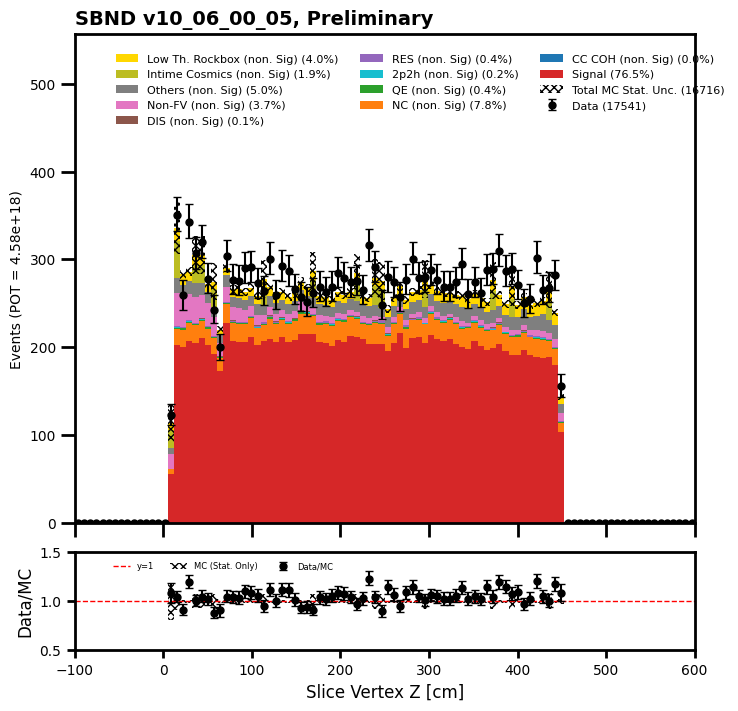

total data =  17145
[532 420 546 695 662 732 853 892 881 819 826 746 739 674 642 578 548 484
 483 439 390 359 333 312 281 286 258 223 197 179 202 144 140 122 144  96
  76  77  68  67]
[500.9228   464.35318  636.06586  704.78973  708.0226   732.5218
 805.94116  811.5734   849.8325   768.8325   739.0482   728.76196
 656.1595   652.24866  569.74207  555.8252   485.03058  450.15884
 422.05276  398.1931   356.05573  347.8638   312.26944  304.51538
 264.1682   260.46707  231.7638   208.40166  188.77774  162.0754
 151.04169  140.38411  126.70069  119.242516 110.53645   96.90577
  80.24279   71.53126   67.56854   64.053955]
data ratio  [1.06203992 0.90448395 0.85840168 0.98610971 0.93499843 0.99928768
 1.05838992 1.09909957 1.03667485 1.06525151 1.11765373 1.02365387
 1.12625058 1.03334824 1.1268257  1.03989529 1.12982567 1.07517603
 1.14440667 1.10248014 1.09533416 1.0320131  1.06638677 1.02457879
 1.06371617 1.09802747 1.11320235 1.07004907 1.04355524 1.10442428
 1.33737913 1.02575712 1.1049

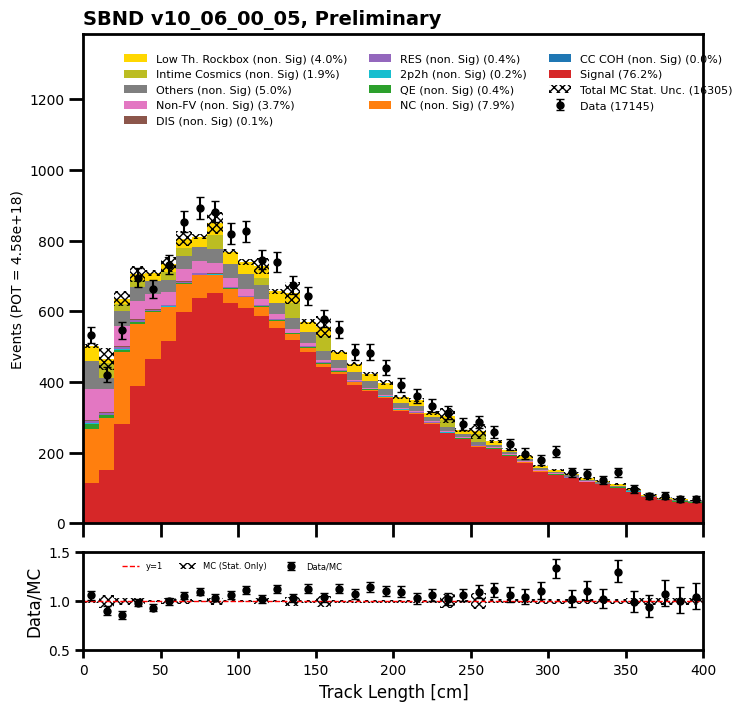

total data =  17541
[ 75  86  71  73  69  82  94 116 114 118  86 110 117 129 134 137 134 135
 133 151 158 157 156 172 181 167 184 182 197 189 197 199 227 230 250 245
 234 242 258 245 239 246 231 223 214 211 220 198 219 257 221 234 235 243
 239 241 232 225 239 210 222 239 233 269 270 212 254 231 244 225 232 207
 202 222 205 176 172 183 187 182 179 161 149 134 136 127 125 128 148 132
 126 118 121 100  93  91  69  71  85  70]
[ 64.990005  73.48991   74.477425  80.15912   81.4015    81.09587
 114.15261   94.883026  95.21915  101.232376 121.64592  104.85029
 113.00484  140.38348  122.84162  123.71971  130.01575  129.74219
 139.49402  146.82732  151.61163  156.52266  151.65103  162.18169
 164.26978  172.77602  178.02841  186.74095  205.50119  189.45663
 195.49379  202.06271  226.18314  205.6106   241.85748  217.59097
 216.7031   225.10173  229.23293  244.96329  232.16183  241.0868
 220.16788  223.51695  224.12003  217.68065  221.38687  228.9378
 214.44078  220.00424  226.64388  212.18773  21

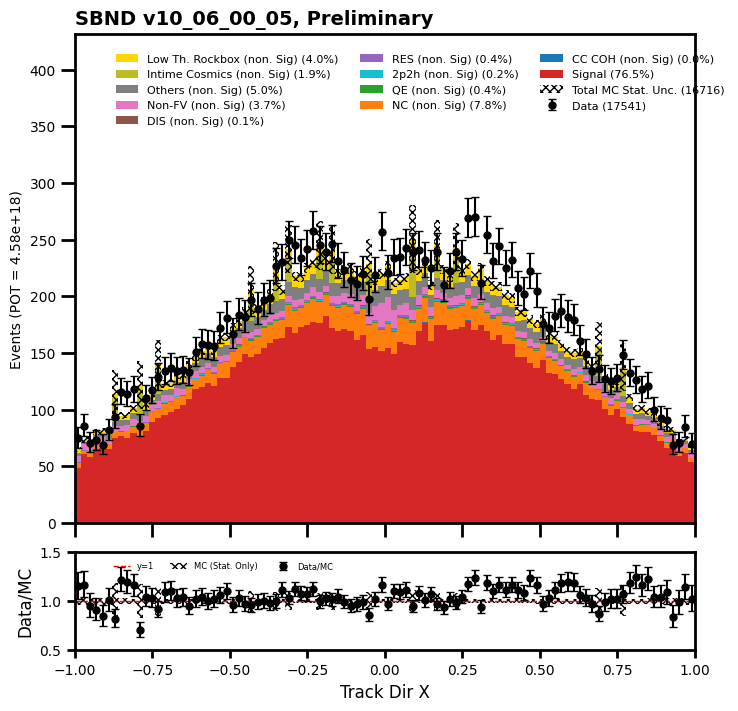

total data =  17541
[ 53  34  51  44  39  49  53  46  48  72  69  66  62  79  96  81  91  87
 114 105 118 138 133 155 180 184 161 153 206 197 221 236 260 233 264 264
 246 261 284 291 284 272 281 292 285 276 284 293 284 272 294 272 306 266
 297 282 301 273 281 277 288 241 280 260 256 263 261 227 250 265 187 223
 168 205 193 184 165 205 145 165 138 147 128 139 137 110 121 106 100 106
  79  82  81  73  71  60  72  54  57  53]
[ 40.77961   34.953945  57.946796  38.41639   41.013092  45.880703
  47.2236    50.123688  53.488243  53.055717  58.885567  63.473732
  64.68459   73.00462   76.49987   85.63139   83.41526   88.34761
  90.92259   99.62468  103.12271  112.59137  121.33424  124.410965
 129.16791  140.91718  145.58987  159.87953  180.10931  189.27563
 199.40108  205.72067  242.36583  251.0482   239.46239  244.69241
 264.47818  269.34442  294.86707  277.92938  281.74927  288.0228
 280.00836  288.90628  288.67358  299.64636  284.77478  307.8323
 292.87204  303.25204  280.39282  290.97083 

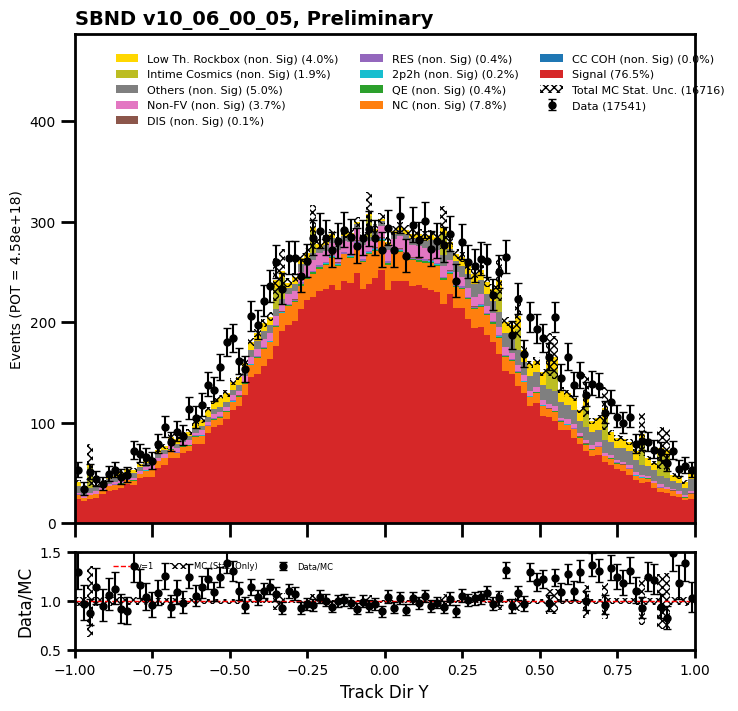

/tmp/ipykernel_2747/2477963852.py:130: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_2747/2477963852.py:131: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc
/tmp/ipykernel_2747/2477963852.py:185: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_2747/2477963852.py:189: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_2747/2477963852.py:190: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc


total data =  17541
[   0    0    0    0    0    0    0    0    0    0    0    0   20   42
   41   36   34   39   38   31   31   29   29   30   36   30   28   22
   25   34   48   28   32   33   20   25   34   30   41   30   40   38
   36   50   57   47   36   59   64   59   66   43   65   57   84   81
   74   91   79   87   90   78   84   87   81   97  113  111  126  144
  149  166  167  177  216  232  214  223  233  233  267  281  310  331
  360  349  401  475  454  531  593  663  679  761  842  947 1021 1056
 1044 1046]
[   0.          0.          0.          0.          0.          0.
    0.          0.          0.          0.          0.          0.
   16.037333   29.435167   29.435133   29.737492   29.857391   32.605988
   29.672718   25.344952   27.488285   25.203627   26.675076   24.576355
   47.47255    27.423273   26.133564   26.069279   49.257683   26.523487
   47.17943    26.532734   29.010567   29.724403   28.038078   30.092957
   32.341606   30.536867   32.137524   31.034

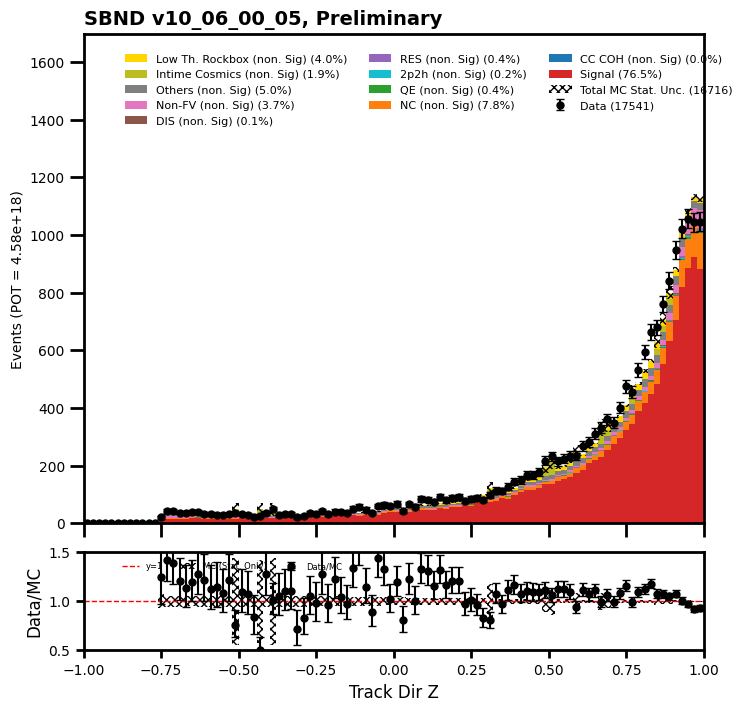

/tmp/ipykernel_2747/2477963852.py:130: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_2747/2477963852.py:131: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc
/tmp/ipykernel_2747/2477963852.py:185: RuntimeWarning: divide by zero encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_2747/2477963852.py:185: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_2747/2477963852.py:189: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_2747/2477963852.py:190: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc
/exp/sbnd/app/users/amoor/cafpyana/cafpyana/envs/venv_py39_cafpyana/lib/python3.9/site-packages/matplotlib/axes/_axes.py:3749: RuntimeWarning: overflow encountered in add
  low, high = dep + np.vstack(

total data =  17541
[  22  413  572 1144 1452 1902 1881 1780 1512 1284 1065  880  737  632
  498  420  327  280  180  149  104   89   69   52   57   25    6    3
    3    2    0    0    0    0    0    0    1    0    0    0]
[1.6212929e+01 3.8394427e+02 6.2537402e+02 1.2413896e+03 1.4868425e+03
 1.7946680e+03 1.7769597e+03 1.6080844e+03 1.4143499e+03 1.1764155e+03
 9.7074377e+02 8.1945129e+02 6.9793750e+02 5.7646967e+02 4.7071512e+02
 3.5679755e+02 2.9664264e+02 2.5045114e+02 1.7972072e+02 1.4824457e+02
 1.1575542e+02 9.5187531e+01 7.4221107e+01 5.5973038e+01 5.2196514e+01
 1.9339798e+01 6.6601562e+00 2.7681885e+00 6.6979980e-01 2.3852539e-01
 6.5063477e-02 2.6037598e-01 3.2409668e-01 0.0000000e+00 1.1846924e-01
 8.6547852e-02 0.0000000e+00 0.0000000e+00 8.6547852e-02 0.0000000e+00]
data ratio  [1.35694175 1.07567693 0.91465264 0.92154788 0.97656609 1.05980607
 1.0585496  1.10690711 1.06904243 1.09145108 1.09709691 1.07388933
 1.05596848 1.09632829 1.05796474 1.17713814 1.10233647 1.117

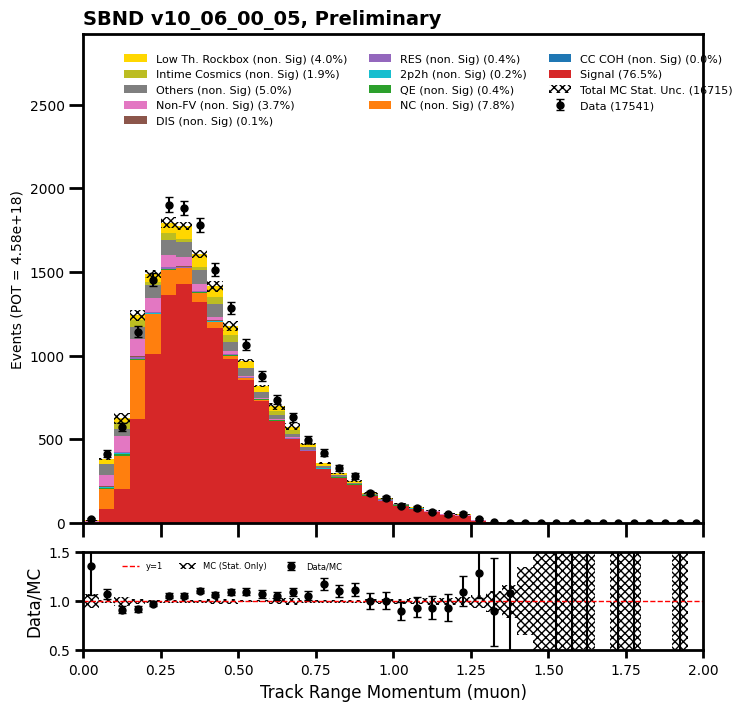

total data =  16708
[   1    3  117  384  768 1081 1646 1079 1573 1042 1102  978 1097  778
  580  594  600  571  361  272  345  208  262  155  146  167   74  124
   75   72   84   47   70   38   43   43   28   38   20   42]
[6.38443112e-01 1.47142661e+00 1.03103622e+02 3.96406036e+02
 7.51448730e+02 1.07383704e+03 1.51323535e+03 1.00718213e+03
 1.45569702e+03 8.61724731e+02 1.01951355e+03 9.01716675e+02
 1.00357739e+03 6.98957458e+02 5.03342041e+02 5.74268799e+02
 5.05408264e+02 5.15508789e+02 3.70515869e+02 2.67460419e+02
 3.52538605e+02 2.04730621e+02 2.63224976e+02 1.59538345e+02
 1.70959534e+02 1.75603363e+02 1.03809616e+02 1.34496216e+02
 7.70517883e+01 8.86077957e+01 9.63957748e+01 5.68515091e+01
 7.43418503e+01 4.75360413e+01 4.92146912e+01 5.44719772e+01
 3.51407280e+01 4.66284866e+01 3.04614601e+01 3.70011902e+01]
data ratio  [1.56631026 2.03883767 1.13478069 0.96870371 1.02202581 1.00667044
 1.08773562 1.07130574 1.080582   1.20920285 1.08090765 1.08459789
 1.09308959 1.11308

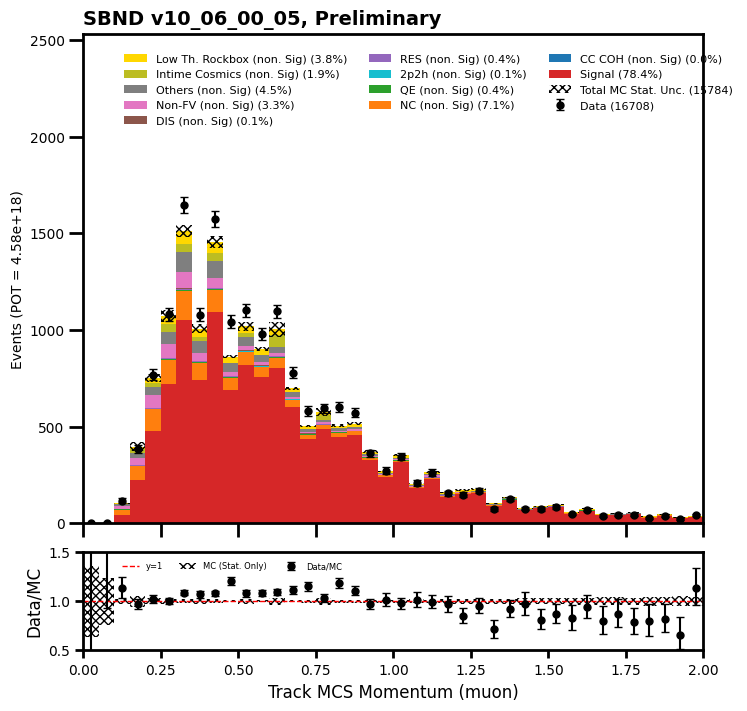

/tmp/ipykernel_2747/2477963852.py:130: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_2747/2477963852.py:131: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc
/tmp/ipykernel_2747/2477963852.py:185: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_2747/2477963852.py:189: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_2747/2477963852.py:190: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc


total data =  17541
[   0    0    0    0    0    0    0    0    0    0    0    0    0    0
    0    0    0    0    0    0    0    0    0    0    0  309  370  466
  584  723  829  875 1008 1071 1156 1242 1357 1350 1278 1208 1122 1100
  861  482  142    8    0    0    0    0]
[   0.          0.          0.          0.          0.          0.
    0.          0.          0.          0.          0.          0.
    0.          0.          0.          0.          0.          0.
    0.          0.          0.          0.          0.          0.
    0.        274.47412   362.62164   427.38788   538.2349    646.9479
  802.659     818.2143    966.58484  1003.4867   1113.8857   1136.9186
 1218.4387   1223.203    1237.3175   1194.3604   1173.9326   1148.4636
  848.3383    448.11966   123.53214     9.261536    0.          0.
    0.          0.      ]
data ratio  [       nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan        nan        nan
     

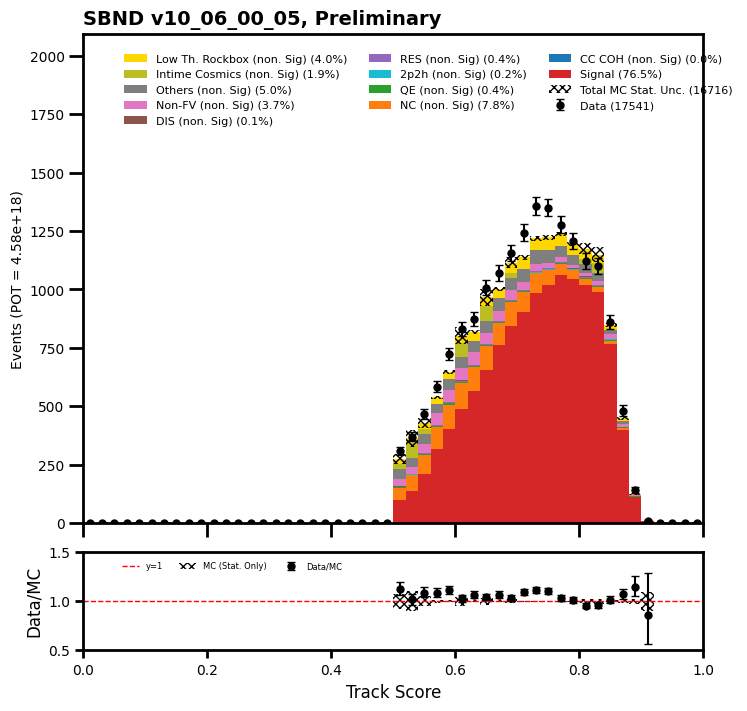

total data =  17331
[1668 3140 2624 2013 1644 1329 1019  821  610  459  337  256  214  172
  152  109   79   73   72   51   72   38   40   36   28   25   33   27
   18   26   18   24   12   12   14    8   17   14   14   13]
[1490.9078   2891.8745   2371.707    1843.1936   1566.4285   1281.468
 1025.3994    818.0393    624.3952    464.80807   368.80573   269.52783
  235.55803   173.7431    141.78104   122.63142   102.781296  104.93412
   72.957306   64.97476    52.1798     47.82376    45.836956   40.72163
   32.087795   29.448746   47.74626    26.80183    21.200768   21.742157
   18.941944   15.698015   17.168959   14.206673   12.346935   10.41181
   11.310432   10.206184   11.82815     9.622959]
data ratio  [1.11878143 1.08580092 1.10637611 1.09212619 1.04952127 1.03709182
 0.9937591  1.00361926 0.97694537 0.98750436 0.91376022 0.94980915
 0.90848103 0.98996735 1.07207567 0.88884238 0.76862234 0.69567458
 0.98687855 0.78492015 1.37984436 0.7945841  0.8726583  0.88405105
 0.87260592 0.8

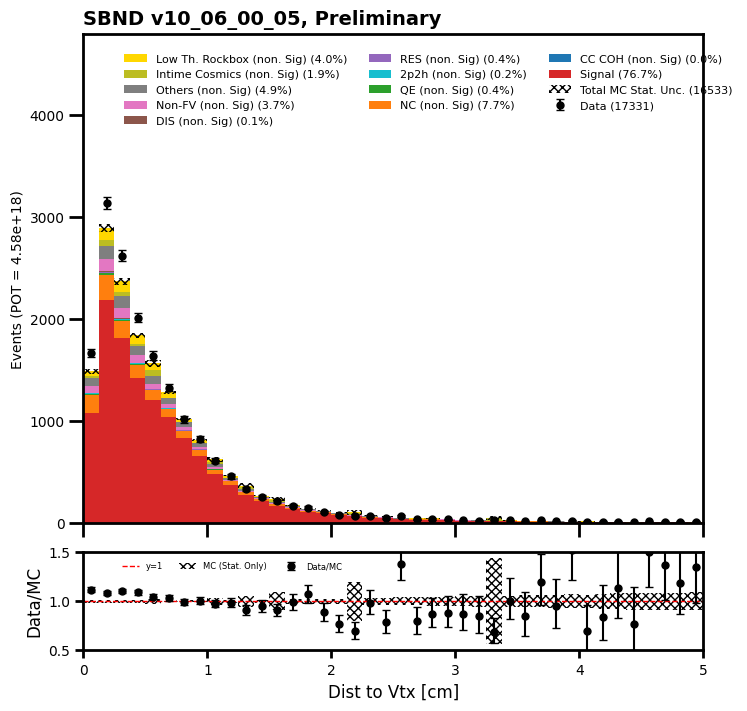

/tmp/ipykernel_2747/2477963852.py:130: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_2747/2477963852.py:131: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc
/tmp/ipykernel_2747/2477963852.py:185: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_2747/2477963852.py:189: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_2747/2477963852.py:190: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc


total data =  17541
[  0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0
 186 339 310 327 301 352 316 333 336 353 317 307 342 356 321 320 323 344
 386 316 311 303 357 301 327 308 295 303 324 297 100   0   0  85 274 280
 282 271 298 295 248 263 264 279 293 272 280 272 256 257 239 255 261 271
 227 250 271 274 215 229 246 238 235 150   0   0   0   0   0   0   0   0
   0   0   0   0   0   0   0   0   0   0]
[0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00
 0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00
 0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00
 0.0000000e+00 0.0000000e+00 1.7310901e-01 1.6177557e+02 2.6951624e+02
 2.6658179e+02 2.8908658e+02 2.8632770e+02 2.9263361e+02 2.9655920e+02
 3.0684268e+02 2.9990274e+02 3.0211829e+02 2.9753195e+02 3.0933600e+02
 3.1651675e+02 3.0831470e+02 3.1559290e+02 3.1007956e+02 3.0040161e+02
 3.1371048e+02 3.1728201e+02 3.3448227e+02 3.3182629e+02 3.1071771e+02
 3.20

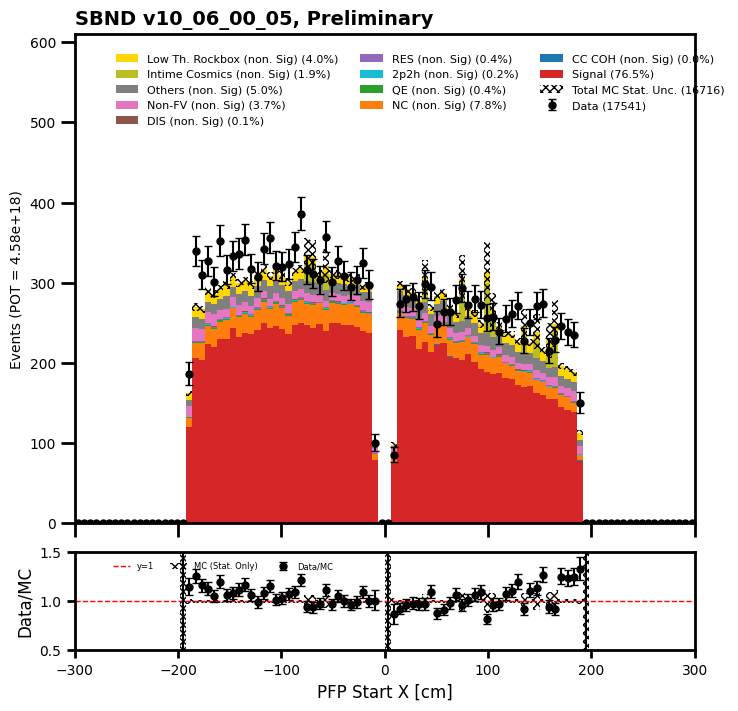

/tmp/ipykernel_2747/2477963852.py:130: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_2747/2477963852.py:131: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc
/tmp/ipykernel_2747/2477963852.py:185: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_2747/2477963852.py:189: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_2747/2477963852.py:190: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc


total data =  17541
[  0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0
 173 264 264 255 305 265 271 258 268 315 293 271 291 301 283 315 310 289
 290 302 293 288 308 313 294 293 296 282 311 280 336 311 300 277 293 299
 265 271 300 299 287 293 284 308 278 266 285 267 276 265 303 282 280 247
 280 271 254 232 263 193 180 178 167 110   0   0   0   0   0   0   0   0
   0   0   0   0   0   0   0   0   0   0]
[0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00
 0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00
 0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00
 0.0000000e+00 0.0000000e+00 8.1155205e-01 1.4629329e+02 2.3188644e+02
 2.3206836e+02 2.4406285e+02 2.6550659e+02 2.4352597e+02 2.4284595e+02
 2.5059148e+02 2.6048804e+02 2.5684250e+02 2.5221182e+02 2.6748795e+02
 2.7268158e+02 2.6610193e+02 2.7389749e+02 2.7167392e+02 2.7716571e+02
 2.7352829e+02 2.8024026e+02 2.8219598e+02 2.8628696e+02 2.9686334e+02
 2.87

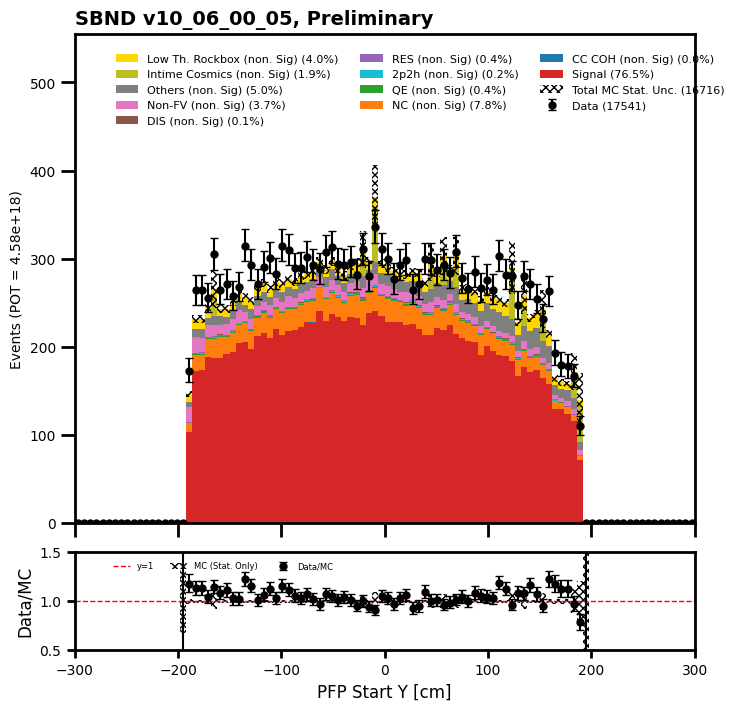

/tmp/ipykernel_2747/2477963852.py:130: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_2747/2477963852.py:131: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc
/tmp/ipykernel_2747/2477963852.py:185: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_2747/2477963852.py:189: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_2747/2477963852.py:190: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc


total data =  17541
[  0   0   0   0   0   0   0   0   0   0   0   0   0   0   3 108 350 268
 330 316 317 286 248 179 314 277 279 289 290 274 261 300 261 293 293 256
 258 256 266 272 254 274 280 280 281 268 264 314 293 252 289 273 248 283
 290 278 287 283 280 271 270 272 297 261 274 267 279 296 306 286 290 274
 246 256 300 268 265 287 161   0   0   0   0   0   0   0   0   0   0   0
   0   0   0   0   0   0   0   0   0   0]
[  0.          0.          0.          0.          0.          0.
   0.          0.          0.          0.          0.          0.
   0.          0.          1.9367609 102.50402   335.19266   280.6486
 288.3349    304.73807   304.15335   272.8991    275.01727   208.82962
 301.3771    267.02966   264.92328   266.91003   263.2876    257.71527
 280.1702    267.3379    258.89258   260.82016   259.6469    262.10645
 274.18192   267.47452   287.89783   256.90063   257.74817   254.05167
 263.35803   258.22266   263.53183   282.1484    259.06964   255.76643
 279.91013   274

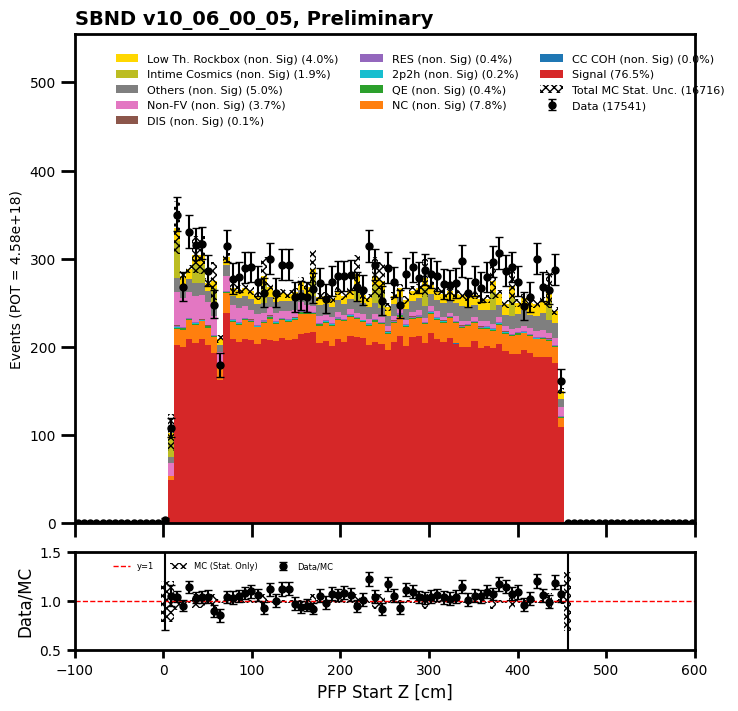

In [53]:
## Reco 3) trk dir y more than 0.5
#dir_y_mc = (mc_matchdf.pfp.trk.dir.y > 0.5)
#dir_y_data = (data_evt_df.pfp.trk.dir.y > 0.5)

#holdsfmc = mc_matchdf
#holdsfdata = data_evt_df

#mc_matchdf = mc_matchdf[dir_y_mc]
#data_evt_df = data_evt_df[dir_y_data]

mc_bnb_cosmic_dfs["evt"] = mc_bnb_cosmic_dfs["evt"][mc_bnb_cosmic_dfs["evt"].pfp.trk.dir.z > -0.75]
mc_rockbox_dirt_dfs["evt"] = mc_rockbox_dirt_dfs["evt"][mc_rockbox_dirt_dfs["evt"].pfp.trk.dir.z > -0.75]
data_offbeam_light_dfs["evt"] = data_offbeam_light_dfs["evt"][data_offbeam_light_dfs["evt"].pfp.trk.dir.z > -0.75]
data_bnb_light_dfs["evt"] = data_bnb_light_dfs["evt"][data_bnb_light_dfs["evt"].pfp.trk.dir.z > -0.75]

#fractions_clear_cosmic_cosmiccut, fractions_nu_score_cosmiccut, fractions_vtx_x_cosmiccut, fractions_vtx_y_cosmiccut, fractions_vtx_z_cosmiccut, fractions_trk_len = draw_reco_valid_plots(mc_matchdf, data_evt_df, "diry_score")
draw_reco_valid_plots(mc_bnb_cosmic_dfs["evt"], mc_rockbox_dirt_dfs["evt"], data_offbeam_light_dfs["evt"], data_bnb_light_dfs["evt"], "a_vtx_fv_and_not_clear_cosmic_nu_score_trkscore_diry")

/tmp/ipykernel_2747/2477963852.py:130: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_2747/2477963852.py:131: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc
/tmp/ipykernel_2747/2477963852.py:185: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_2747/2477963852.py:189: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_2747/2477963852.py:190: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc


total data =  15204
[15204     0]
[14859.69417101     0.        ]
data ratio  [1.02317045        nan]


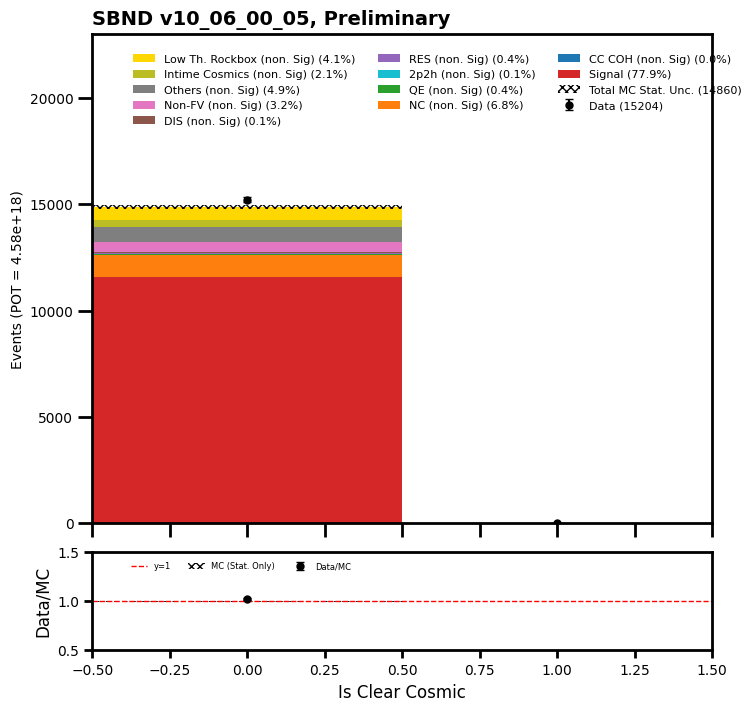

/tmp/ipykernel_2747/2477963852.py:130: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_2747/2477963852.py:131: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc
/tmp/ipykernel_2747/2477963852.py:185: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_2747/2477963852.py:189: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_2747/2477963852.py:190: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc


total data =  15204
[   0    0    0    0    0    0    0    0    0    0    0    0    0    0
    0    0    0    0    0    0    0    0    0    0    0    0    0    0
    0    0    0    0    0 6117 4944 3437  693   13    0    0    0    0
    0    0]
[   0.          0.          0.          0.          0.          0.
    0.          0.          0.          0.          0.          0.
    0.          0.          0.          0.          0.          0.
    0.          0.          0.          0.          0.          0.
    0.          0.          0.          0.          0.          0.
    0.          0.          0.       5318.9033   4778.714    3822.3767
  917.9512     21.669361    0.          0.          0.          0.
    0.          0.      ]
data ratio  [       nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan        nan        nan
        nan        nan        nan        na

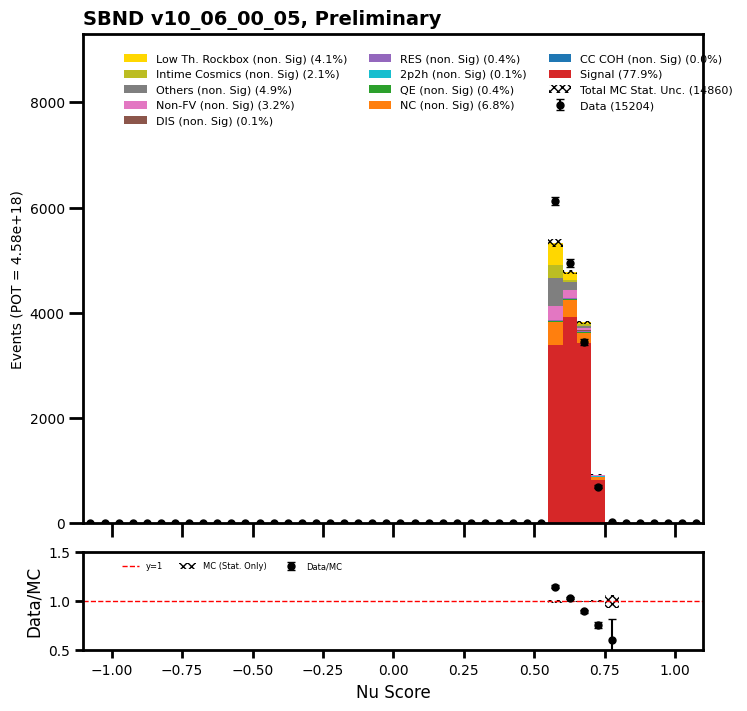

/tmp/ipykernel_2747/2477963852.py:130: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_2747/2477963852.py:131: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc
/tmp/ipykernel_2747/2477963852.py:185: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_2747/2477963852.py:189: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_2747/2477963852.py:190: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc


total data =  15204
[  0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0
 164 291 267 289 264 300 272 287 299 309 275 280 303 313 283 259 290 302
 341 269 272 257 303 254 288 262 246 267 289 241  92   0   0  72 233 233
 250 249 223 256 223 218 244 241 246 223 240 234 220 225 212 219 224 235
 205 225 236 241 187 196 219 211 203 133   0   0   0   0   0   0   0   0
   0   0   0   0   0   0   0   0   0   0]
[  0.         0.         0.         0.         0.         0.
   0.         0.         0.         0.         0.         0.
   0.         0.         0.         0.         0.         0.
 145.96622  237.82278  233.67783  259.44846  253.95157  259.12274
 265.78806  271.37744  269.33664  267.44113  268.20187  277.0505
 284.44894  270.86768  274.83615  269.21487  267.33582  277.8542
 279.61838  300.455    298.20895  295.12744  265.2621   274.13458
 277.78745  272.82935  266.77094  270.9128   257.44696  261.9508
  89.33723    0.         0.        88.108055 261.66364  258.996

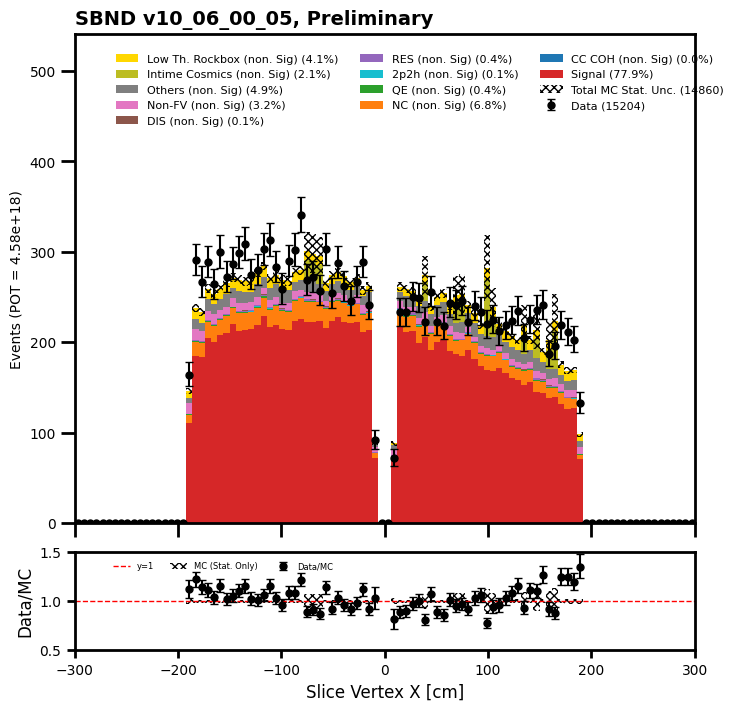

/tmp/ipykernel_2747/2477963852.py:130: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_2747/2477963852.py:131: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc
/tmp/ipykernel_2747/2477963852.py:185: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_2747/2477963852.py:189: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_2747/2477963852.py:190: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc


total data =  15204
[  0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0
 156 220 219 235 251 226 240 216 238 277 256 245 259 264 246 284 262 249
 248 264 262 248 269 249 256 255 254 239 276 237 281 271 249 251 242 264
 228 237 267 271 242 257 250 255 248 234 246 239 232 227 263 248 243 214
 247 242 217 206 223 168 158 144 143  97   0   0   0   0   0   0   0   0
   0   0   0   0   0   0   0   0   0   0]
[  0.         0.         0.         0.         0.         0.
   0.         0.         0.         0.         0.         0.
   0.         0.         0.         0.         0.         0.
 130.77611  200.16316  206.67192  216.06001  239.01543  217.1152
 212.10437  221.61794  236.1887   229.57712  223.16254  238.33084
 242.05197  238.34827  243.25888  242.77571  242.97623  244.03539
 251.93712  245.6043   255.50584  260.80347  256.5616   263.80865
 259.6852   248.07642  258.05817  262.90735  281.30762  264.74045
 333.9947   262.94534  258.97226  257.1861   251.91827  252.3

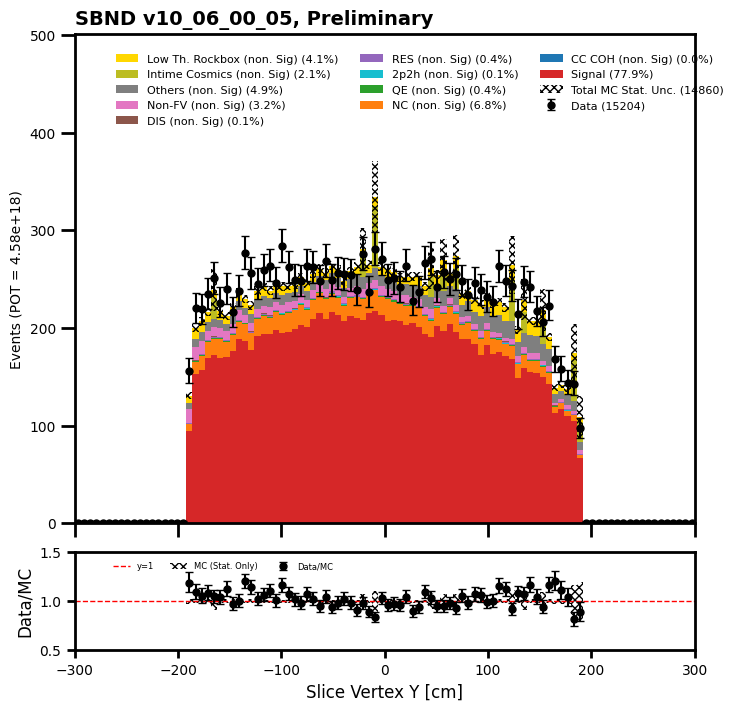

/tmp/ipykernel_2747/2477963852.py:130: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_2747/2477963852.py:131: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc
/tmp/ipykernel_2747/2477963852.py:185: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_2747/2477963852.py:189: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_2747/2477963852.py:190: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc


total data =  15204
[  0   0   0   0   0   0   0   0   0   0   0   0   0   0   0  97 286 217
 295 265 280 244 209 170 262 241 232 252 264 238 230 263 212 256 258 233
 225 211 225 227 224 229 242 248 230 243 225 272 257 219 235 248 216 242
 256 248 236 249 241 245 228 243 263 234 229 229 260 250 258 244 245 235
 225 227 271 242 232 248 144   0   0   0   0   0   0   0   0   0   0   0
   0   0   0   0   0   0   0   0   0   0]
[  0.         0.         0.         0.         0.         0.
   0.         0.         0.         0.         0.         0.
   0.         0.         0.        98.659676 295.16287  244.99431
 249.7493   270.9041   269.91992  239.06647  246.21692  188.58801
 251.8371   237.27786  234.07869  231.66164  237.5698   229.68219
 249.54999  238.94699  231.21696  235.32812  228.98576  235.41553
 243.43483  236.91904  256.26736  231.0448   228.97644  226.89569
 231.7838   231.63957  234.43452  255.76053  229.35954  225.80278
 248.66666  244.44858  214.59355  226.15923  240.90681 

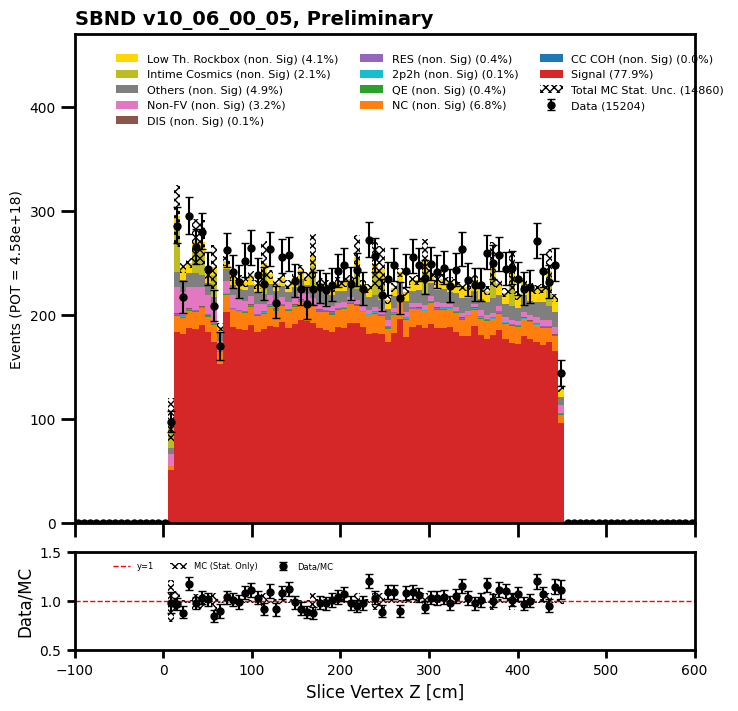

total data =  15118
[1630  811  735  708  626  687  694  740  737  688  703  625  575  525
  521  442  406  372  342  309  272  251  221  206  167  166  161  124
  100   88   88   69   63   54   63   39   38   31   20   21]
[1680.2102    996.81      861.4155    780.32935   718.4572    683.13196
  691.3808    666.885     696.5201    630.1813    596.63837   576.75635
  511.4417    511.77457   434.7367    429.76236   351.1331    322.0705
  300.9753    270.59305   243.88297   232.2214    200.01917   199.76659
  161.59299   160.16928   136.00012   115.808464   97.06205    81.904884
   71.658455   66.103096   54.81168    50.48597    44.41749    36.461067
   30.83136    22.04663    22.112814   20.122322]
data ratio  [0.97011671 0.81359537 0.85324675 0.90730921 0.87131145 1.00566222
 1.00378836 1.10963658 1.05811738 1.09174936 1.17826818 1.0836465
 1.12427279 1.0258423  1.19842656 1.02847537 1.15625674 1.15502663
 1.13630583 1.14193621 1.11528905 1.08086505 1.10489412 1.03120349
 1.03346069 1.

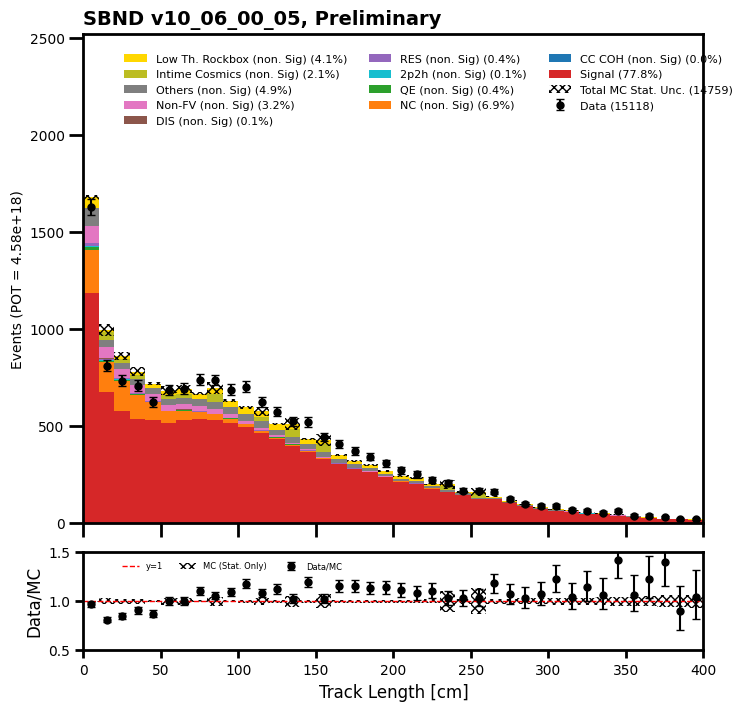

total data =  15204
[112 103  87 103 101 120 120 148 152 145 123 139 154 169 172 177 176 159
 173 184 194 190 181 210 216 197 219 206 204 175 156 158 147 161 147 149
 136 130 147 120 126 111 119 100 101  98 100  91  99 129 124 117 109 101
 108 116  99 122 115  99 109 126 135 163 157 127 176 159 179 187 195 221
 243 252 242 200 212 213 222 211 220 202 183 158 175 171 161 163 177 158
 155 152 153 142 132 109  96 107 112 105]
[ 91.527504  96.95886  103.34414  110.65404  115.33508  115.1528
 149.87523  133.76501  139.83472  141.00131  160.49532  141.29773
 152.12506  182.19691  166.90532  166.23653  176.48157  170.80911
 182.76746  188.00221  191.6623   199.43028  195.36852  203.08673
 204.81769  216.11559  220.7187   225.7532   222.01077  170.31764
 159.80191  151.6266   166.69992  134.17877  151.36609  125.60738
 117.51045  115.969604 114.19122  127.19997  107.51051  125.20436
  95.93626  100.72429   96.7491    94.4844    99.355354 113.49482
  96.525696 107.60421  111.12424   96.23422   

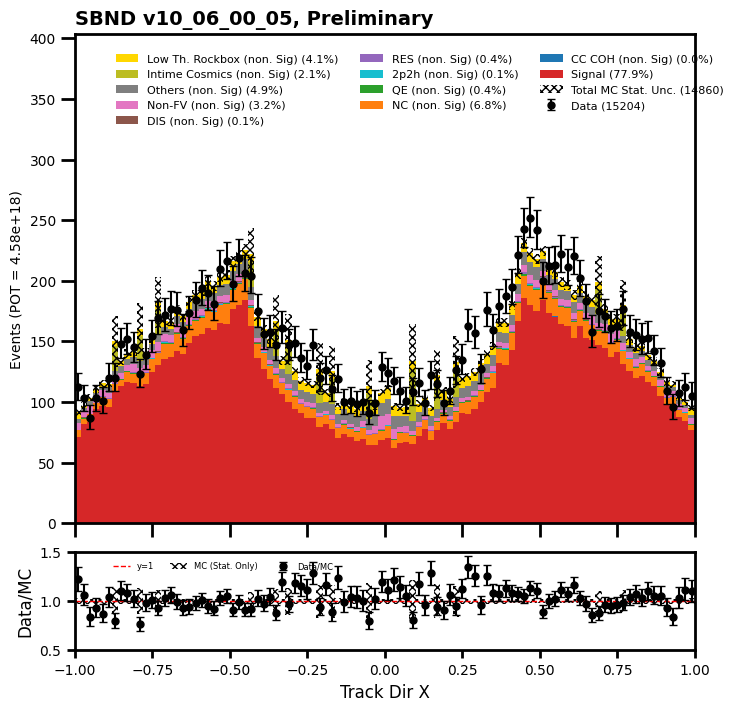

total data =  15204
[ 87  52  77  75  62  73  81  70  85 106 114  98 106 106 139 116 128 130
 147 133 158 166 163 184 210 214 188 181 214 175 188 180 189 186 191 187
 144 151 177 164 176 157 159 161 177 154 173 169 138 158 186 142 155 142
 172 156 177 134 149 173 155 140 180 174 156 187 201 179 192 219 180 241
 200 225 228 209 189 228 180 199 178 185 163 172 177 152 149 145 130 136
 105 107 116  99  97  93  93  82  79  81]
[ 72.12494   64.61069   86.51136   69.55571   71.362274  78.57323
  80.56463   85.358215  89.57679   94.18625   97.973564 103.178665
 101.0467   117.03689  116.81049  127.034546 126.863174 131.40598
 131.70883  137.30536  143.91794  149.2438   160.28009  163.83354
 163.5827   177.40851  182.0159   195.99231  200.80501  190.61429
 182.81235  173.6811   197.71172  194.1041   173.16412  167.35544
 176.67007  173.16173  193.63986  173.30638  168.39297  163.29721
 164.37938  167.96571  163.11528  163.36263  159.30661  175.26776
 158.13435  166.43303  154.88422  155.93224 

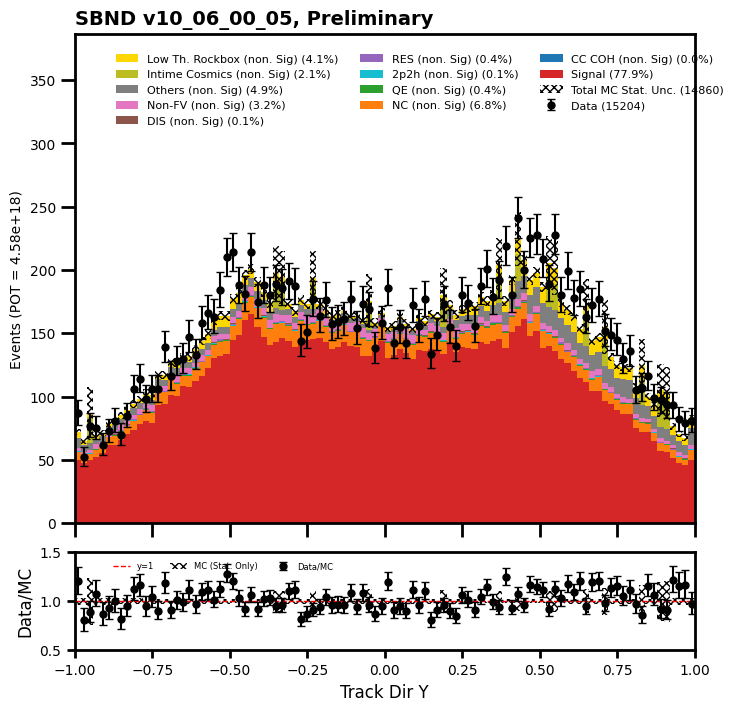

/tmp/ipykernel_2747/2477963852.py:130: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_2747/2477963852.py:131: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc
/tmp/ipykernel_2747/2477963852.py:185: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_2747/2477963852.py:189: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_2747/2477963852.py:190: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc


total data =  15204
[  0   0   0   0   0   0   0   0   0   0   0   0  30  60  64  49  55  57
  51  47  44  48  51  46  48  50  46  41  49  58  81  42  50  46  38  39
  60  46  65  52  61  64  61  71  83  69  65  94  92  93  94  73 101  81
 114 107 100 121 107 130 125 113 129 130 120 142 155 161 170 196 192 214
 225 222 270 295 271 277 289 274 319 337 357 384 413 411 444 518 503 582
 642 709 722 815 884   0   0   0   0   0]
[  0.         0.         0.         0.         0.         0.
   0.         0.         0.         0.         0.         0.
  27.171133  48.694675  48.066414  50.01474   48.06775   53.141994
  48.694286  44.107006  49.05173   44.19034   47.998398  45.38041
  69.47707   50.261345  47.640026  47.59808   73.24129   50.65889
  68.96778   50.128544  53.093235  53.440437  50.855053  55.754906
  54.033424  53.29977   57.377903  54.34959   55.02024   61.19771
  61.8379    62.12887   60.12809   65.44017   66.49055   69.69383
  75.029816  87.72228   90.92421   85.068954  81.8889

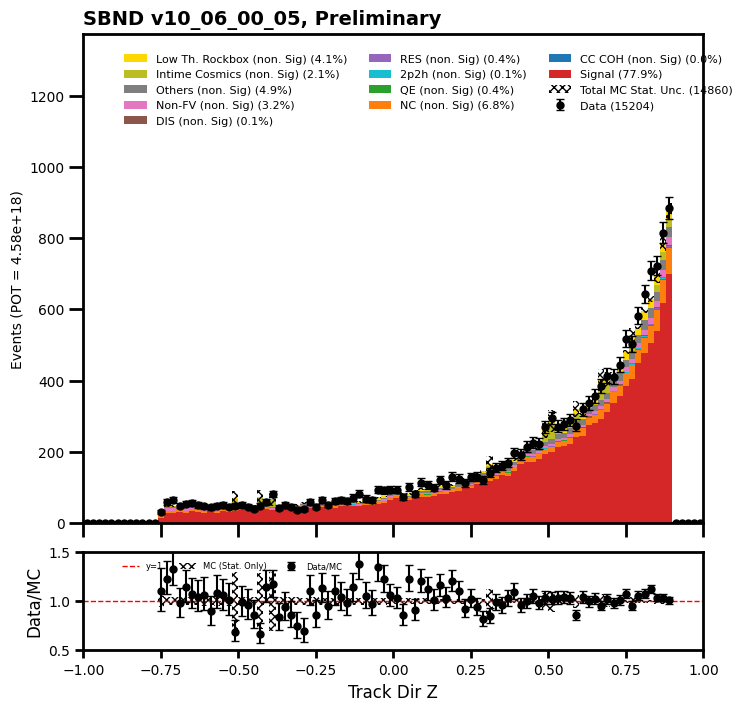

/tmp/ipykernel_2747/2477963852.py:130: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_2747/2477963852.py:131: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc
/tmp/ipykernel_2747/2477963852.py:185: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_2747/2477963852.py:189: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_2747/2477963852.py:190: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc


total data =  15204
[  62 1286 1190 1303 1373 1563 1584 1458 1199  974  778  607  489  366
  284  200  146  123   81   48   26   21   15    5   14    5    1    0
    1    2    0    0    0    0    0    0    0    0    0    0]
[5.4817852e+01 1.3063818e+03 1.4190868e+03 1.4959576e+03 1.4500936e+03
 1.5043969e+03 1.4581664e+03 1.2686833e+03 1.0931991e+03 8.7868433e+02
 6.8359558e+02 5.5430554e+02 4.5120349e+02 3.5347867e+02 2.5796933e+02
 1.7692490e+02 1.3457361e+02 9.8524605e+01 6.7714119e+01 4.6472076e+01
 3.3125809e+01 2.6195068e+01 1.6956488e+01 9.7599487e+00 7.4470825e+00
 4.6586304e+00 3.6314697e+00 2.1179199e+00 3.4533691e-01 3.2531738e-02
 3.2531738e-02 8.6547852e-02 1.5161133e-01 0.0000000e+00 8.6914062e-02
 0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00]
data ratio  [ 1.13101841  0.98439826  0.83856746  0.87101397  0.94683541  1.03895458
  1.08629579  1.14922293  1.096781    1.10847545  1.13809981  1.09506392
  1.08376821  1.03542316  1.10090607  1.13042316 

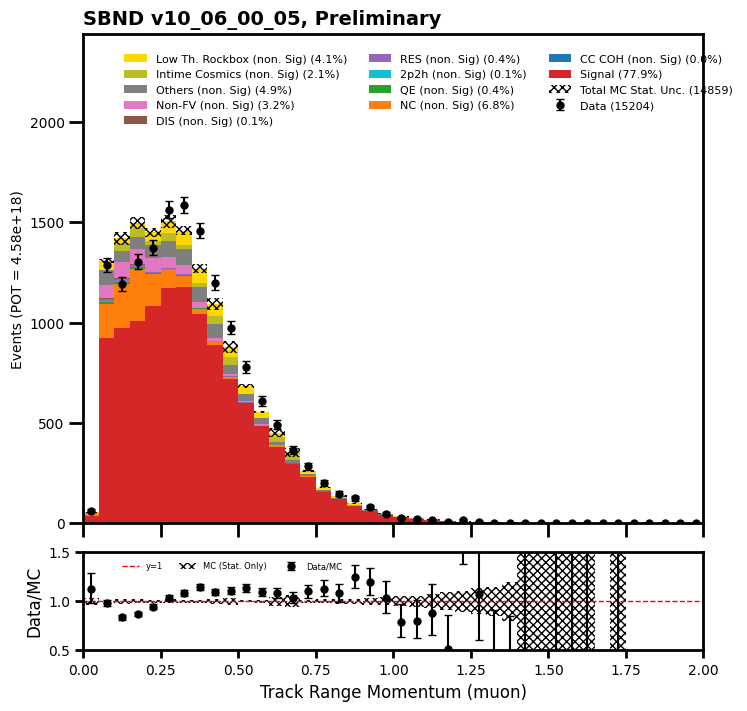

total data =  13380
[   0    5  148  467  838 1079 1546 1007 1390  888  907  789  834  564
  430  396  353  326  201  149  181   90  139   82   75   74   32   65
   43   39   44   24   36   24   26   26   13   25    6   19]
[7.57559180e-01 3.09453106e+00 1.64537613e+02 4.98730988e+02
 8.58463562e+02 1.11995496e+03 1.49574988e+03 9.62850220e+02
 1.32314172e+03 7.57184326e+02 8.67903198e+02 7.38253418e+02
 7.96692871e+02 5.23394897e+02 3.58252136e+02 3.98664246e+02
 3.30434845e+02 3.22079315e+02 2.23354843e+02 1.52930481e+02
 1.96836426e+02 1.07863846e+02 1.34083633e+02 8.14629593e+01
 8.38751602e+01 8.24602890e+01 4.84196625e+01 5.96356812e+01
 3.45500793e+01 4.28427963e+01 4.13315277e+01 2.25981064e+01
 3.22631073e+01 2.10043640e+01 2.07376862e+01 2.06253967e+01
 1.41433105e+01 1.77746811e+01 1.16659622e+01 1.51281281e+01]
data ratio  [0.         1.6157537  0.89949038 0.93637655 0.97616257 0.9634316
 1.03359527 1.04585322 1.05052994 1.17276596 1.04504742 1.0687387
 1.04682749 1.0775802

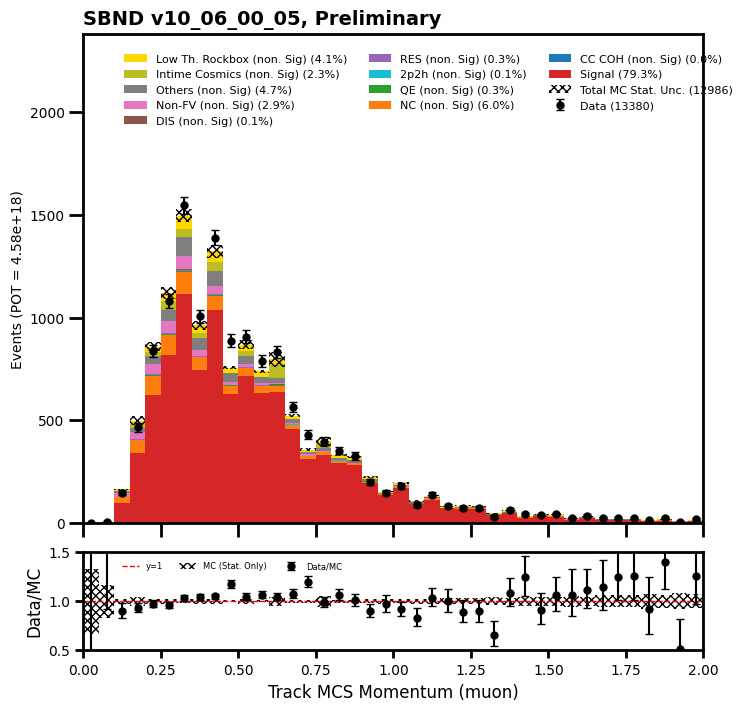

/tmp/ipykernel_2747/2477963852.py:130: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_2747/2477963852.py:131: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc
/tmp/ipykernel_2747/2477963852.py:185: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_2747/2477963852.py:189: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_2747/2477963852.py:190: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc


total data =  15204
[   0    0    0    0    0    0    0    0    0    0    0    0    0    0
    0    0    0    0    0    0    0    0    0    0    0  475  606  788
  898  984 1012  982  963  965  997 1014 1062 1051  902  805  647  505
  332  172   41    3    0    0    0    0]
[   0.          0.          0.          0.          0.          0.
    0.          0.          0.          0.          0.          0.
    0.          0.          0.          0.          0.          0.
    0.          0.          0.          0.          0.          0.
    0.        448.09207   629.57587   778.3722    913.64526  1017.18353
 1080.2931    963.8032    996.90564   940.80133   965.9634    920.7198
  931.7743    894.34045   843.64716   759.8849    663.18256   546.8532
  341.60583   166.29451    52.170193    4.505432    0.          0.
    0.          0.      ]
data ratio  [       nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan        nan        nan
    

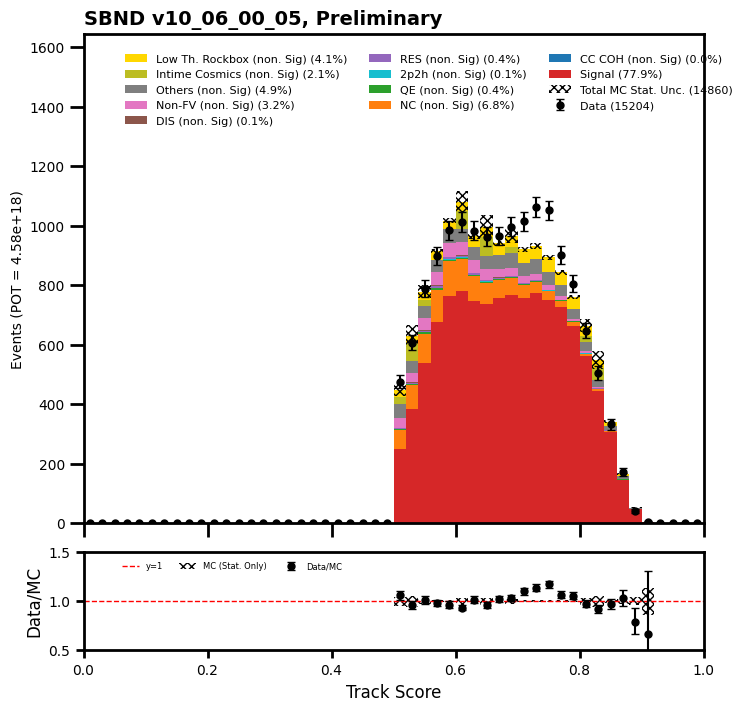

total data =  15000
[1141 2408 2131 1757 1477 1248 1008  783  602  440  341  239  222  175
  141  116   87   75   61   52   67   47   41   32   27   32   28   24
   15   25   17   24   16   14   19    9   18   14   14   13]
[1135.4519   2271.824    1937.6326   1604.1138   1460.7913   1239.1111
 1032.8636    801.5034    609.2052    446.54855   356.75882   257.64374
  226.54309   161.96712   137.21892   112.05737    96.23251   102.73095
   69.95519    62.58007    53.00493    47.40763    44.24292    40.42325
   34.535625   29.347626   48.5764     27.79182    22.971046   22.233604
   20.41745    17.845915   18.312668   16.664803   14.420789   13.273199
   15.176664   13.338638   13.426764   11.608176]
data ratio  [1.00488624 1.05994127 1.09979572 1.09530884 1.01109586 1.00717362
 0.97592746 0.97691411 0.98817279 0.98533518 0.95582781 0.92763753
 0.97994602 1.08046623 1.02755511 1.035184   0.90406035 0.73006237
 0.87198674 0.83093547 1.2640334  0.99140158 0.92670195 0.79162367
 0.78180139 1

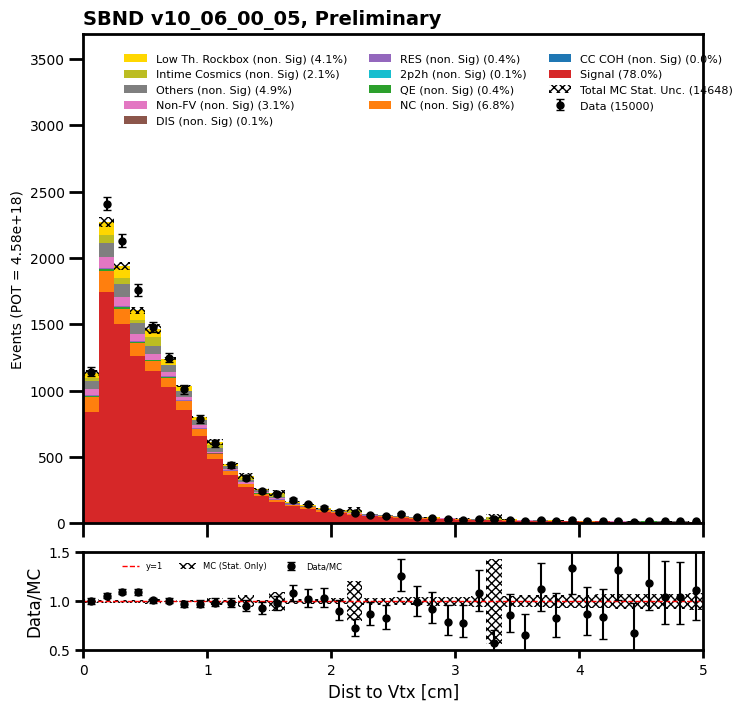

/tmp/ipykernel_2747/2477963852.py:130: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_2747/2477963852.py:131: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc
/tmp/ipykernel_2747/2477963852.py:185: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_2747/2477963852.py:189: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_2747/2477963852.py:190: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc


total data =  15204
[  0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0
 164 291 264 287 269 294 277 287 297 306 285 272 307 313 282 267 286 299
 338 271 272 263 298 255 285 269 248 261 284 249  88   0   0  71 235 232
 250 242 232 254 216 229 236 238 252 228 230 239 217 228 209 221 226 235
 203 227 237 242 184 198 218 208 207 132   0   0   0   0   0   0   0   0
   0   0   0   0   0   0   0   0   0   0]
[0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00
 0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00
 0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00
 0.0000000e+00 0.0000000e+00 1.7310901e-01 1.4446303e+02 2.3859070e+02
 2.3458618e+02 2.5845273e+02 2.5473053e+02 2.6003192e+02 2.6397052e+02
 2.7306558e+02 2.6705377e+02 2.7057834e+02 2.6640601e+02 2.7776523e+02
 2.8387454e+02 2.7108438e+02 2.7338651e+02 2.7062180e+02 2.6613443e+02
 2.7971429e+02 2.7967267e+02 3.0022742e+02 2.9684622e+02 2.7545795e+02
 2.87

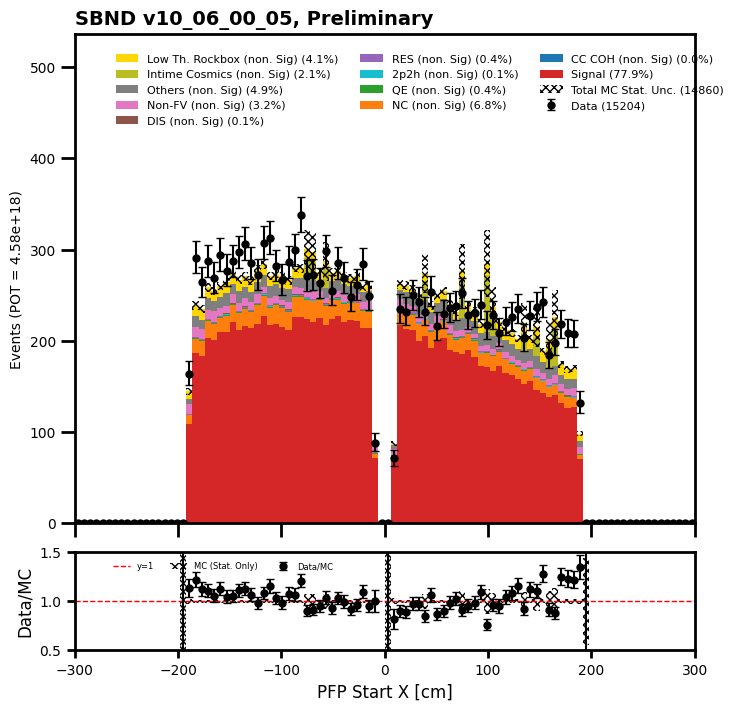

/tmp/ipykernel_2747/2477963852.py:130: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_2747/2477963852.py:131: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc
/tmp/ipykernel_2747/2477963852.py:185: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_2747/2477963852.py:189: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_2747/2477963852.py:190: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc


total data =  15204
[  0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   1
 158 223 218 223 259 229 235 218 238 276 265 241 252 270 247 281 256 260
 250 260 262 243 262 254 267 243 262 232 273 235 286 279 244 249 244 261
 230 238 268 266 242 255 253 256 250 237 249 229 235 227 263 249 241 220
 241 247 213 202 223 171 159 148 136 100   0   0   0   0   0   0   0   0
   0   0   0   0   0   0   0   0   0   0]
[  0.          0.          0.          0.          0.          0.
   0.          0.          0.          0.          0.          0.
   0.          0.          0.          0.          0.          1.3308792
 128.76393   201.66632   205.05995   216.54593   240.75916   214.4306
 214.69128   222.01826   233.15858   230.57278   223.53015   238.42772
 244.59451   235.72003   242.7284    241.75873   244.7722    245.75531
 247.85884   247.60591   253.79669   262.8368    255.84744   263.34225
 260.74664   248.13127   259.4342    262.9938    276.06555   266.8842
 335.88055   26

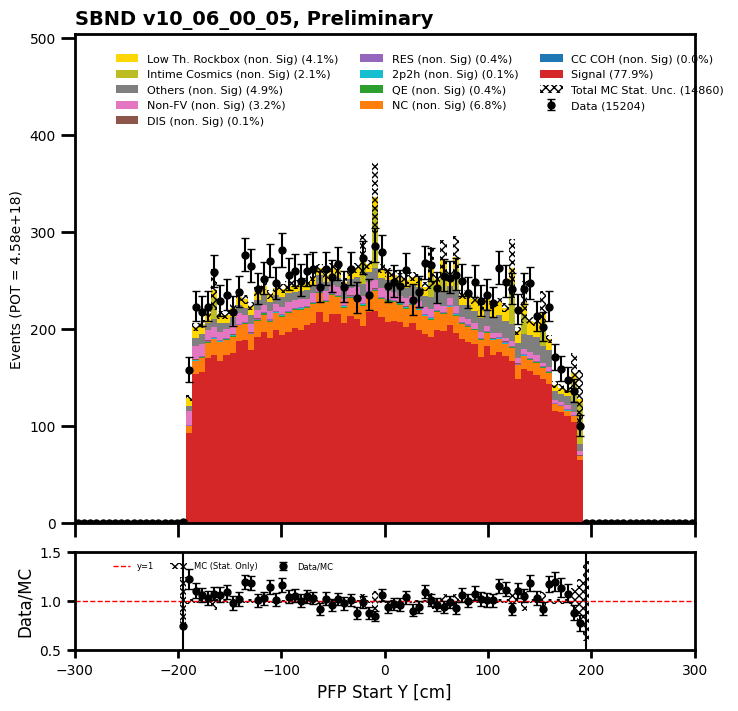

/tmp/ipykernel_2747/2477963852.py:130: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_2747/2477963852.py:131: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc
/tmp/ipykernel_2747/2477963852.py:185: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_2747/2477963852.py:189: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_2747/2477963852.py:190: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc


total data =  15204
[  0   0   0   0   0   0   0   0   0   0   0   0   0   0   2  84 287 227
 279 270 284 250 209 161 263 240 238 251 264 238 228 258 216 256 263 223
 224 216 225 235 214 234 238 250 234 233 231 267 265 220 237 251 205 247
 250 245 241 249 243 244 237 235 265 232 229 232 255 253 262 236 242 241
 222 227 271 244 231 249 152   0   0   0   0   0   0   0   0   0   0   0
   0   0   0   0   0   0   0   0   0   0]
[  0.          0.          0.          0.          0.          0.
   0.          0.          0.          0.          0.          0.
   0.          0.          1.0172226  92.05934   292.12308   245.17822
 251.01498   269.43274   270.77524   238.43839   246.55283   183.43796
 256.2622    238.02342   234.1001    234.31277   233.72937   230.56908
 250.65417   237.3027    231.75778   235.01474   229.79689   236.23746
 242.07037   236.37894   256.32162   230.78552   230.41765   226.98125
 232.53154   230.14574   235.34444   254.75293   229.13086   225.92203
 250.899     24

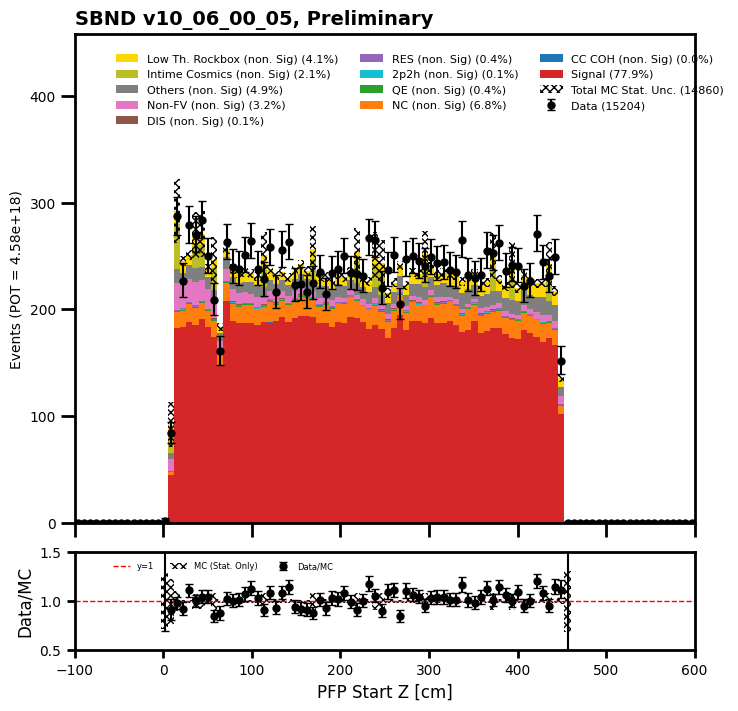

In [54]:
## Reco 3) trk dir y more than 0.5
#slcvtx_y_mc = (mc_matchdf.slc.vertex.y < 50)    #0.0
#slcvtx_y_data = (data_evt_df.slc.vertex.y < 50)

#mc_matchdf = mc_matchdf[slcvtx_y_mc]
#data_evt_df = data_evt_df[slcvtx_y_data]

mc_bnb_cosmic_dfs["evt"] = mc_bnb_cosmic_dfs["evt"][mc_bnb_cosmic_dfs["evt"].pfp.trk.dir.z < 0.9]
mc_rockbox_dirt_dfs["evt"] = mc_rockbox_dirt_dfs["evt"][mc_rockbox_dirt_dfs["evt"].pfp.trk.dir.z < 0.9]
data_offbeam_light_dfs["evt"] = data_offbeam_light_dfs["evt"][data_offbeam_light_dfs["evt"].pfp.trk.dir.z < 0.9]
data_bnb_light_dfs["evt"] = data_bnb_light_dfs["evt"][data_bnb_light_dfs["evt"].pfp.trk.dir.z < 0.9]

#fractions_clear_cosmic_cosmiccut, fractions_nu_score_cosmiccut, fractions_vtx_x_cosmiccut, fractions_vtx_y_cosmiccut, fractions_vtx_z_cosmiccut, fractions_trk_len = draw_reco_valid_plots(mc_matchdf, data_evt_df, "slcvtxy_score")
draw_reco_valid_plots(mc_bnb_cosmic_dfs["evt"], mc_rockbox_dirt_dfs["evt"], data_offbeam_light_dfs["evt"], data_bnb_light_dfs["evt"], "a_vtx_fv_and_not_clear_cosmic_nu_score_trkscore_diry_vtxy")

In [52]:
## Reco 5) slice nuscore more than 0.4
#rng_p_mc = (mc_matchdf.pfp.trk.mcsP.fwdP_muon < 1.4)
#rng_p_data = (data_evt_df.pfp.trk.mcsP.fwdP_muon < 1.4)

#mc_matchdf = mc_matchdf[rng_p_mc]
#data_evt_df = data_evt_df[rng_p_data]

#fractions_clear_cosmic_cosmiccut, fractions_nu_score_cosmiccut, fractions_vtx_x_cosmiccut, fractions_vtx_y_cosmiccut, fractions_vtx_z_cosmiccut, fractions_trk_len = draw_reco_valid_plots(mc_matchdf, data_evt_df, "rng_p")

In [123]:
## Reco 3) slice nuscore more than 0.4
#dir_y_mc = ((mc_matchdf.pfp.trk.start.y > 150) & (mc_matchdf.pfp.trk.end.y < -150))
#dir_y_data = ((data_evt_df.pfp.trk.start.y > 150) & (data_evt_df.pfp.trk.end.y < -150))

#mc_matchdf = mc_matchdf[~dir_y_mc]
#data_evt_df = data_evt_df[~dir_y_data]

#fractions_clear_cosmic_cosmiccut, fractions_nu_score_cosmiccut, fractions_vtx_x_cosmiccut, fractions_vtx_y_cosmiccut, fractions_vtx_z_cosmiccut, fractions_trk_len = draw_reco_valid_plots(mc_matchdf, data_evt_df, "diry_score")

In [53]:
## Reco 4) must have a least one track more than 25cm
#track_10_mc = (mc_matchdf.pfp.trk.len > 10)   #prev was 80
#track_10_data = (data_evt_df.pfp.trk.len > 10)

#mc_matchdf = mc_matchdf[track_10_mc]
#data_evt_df = data_evt_df[track_10_data]

#def pass_slc_with_n_pfps(df, n = 1 ):
#    group_levels = ['__ntuple', 'entry', 'rec.slc..index']
#    # Count how many pfps per slice
#    pfp_counts = df.groupby(level=group_levels).size()
#    # Get only slices with at least n pfps
#    valid_slices = pfp_counts[pfp_counts == n].index
#    # Apply the mask to original DataFrame
#    filtered_df = df.loc[df.index.droplevel('rec.slc.reco.pfp..index').isin(valid_slices)]
#    return filtered_df

#Slice must contain at least 1 10cm+ track
#n=1

#mc_matchdf = pass_slc_with_n_pfps(mc_matchdf)
#data_evt_df = pass_slc_with_n_pfps(data_evt_df)   

#fractions_clear_cosmic_cosmiccut, fractions_nu_score_cosmiccut, fractions_vtx_x_cosmiccut, fractions_vtx_y_cosmiccut, fractions_vtx_z_cosmiccut, fractions_trk_score = draw_reco_valid_plots(mc_matchdf, data_evt_df, "track_10")

In [56]:
mc_bnb_cosmic_dfs["evt"].gen.nuint_categ.value_counts()

nuint_categ
 1.0    251822
 0.0     18389
-2.0     12445
-1.0      7342
 5.0      1029
 3.0       790
 6.0       348
 4.0       311
 2.0         4
Name: count, dtype: int64